# Imports

In [43]:
%load_ext autoreload
%autoreload 2

import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import qutip as qt
from copy import deepcopy

import experiments as meas
from experiments.MM_dual_rail_base import MM_dual_rail_base
from fitting.fit_display_classes import GeneralFitting
from fitting.wigner import WignerAnalysis

from slab import AttrDict
from experiments import MultimodeStation, CharacterizationRunner, SweepRunner

from job_server import JobClient
from job_server.database import get_database
from job_server.config_versioning import ConfigVersionManager

# Initialize database and config manager
db = get_database()
config_dir = 'C:/python/multimode_expts/configs'
config_manager = ConfigVersionManager(config_dir)

# Initialize job client (handle submitting and waiting for jobs)
client = JobClient()

# Check server health
health = client.health_check()
print(f"Server status: {health['status']}")
print(f"Pending jobs: {health['pending_jobs']}")

user = "Jonginn"
print("Welcome", user)

config_dict = {'hardware_config': 'CFG-HW-20260817-00030',
 'multiphoton_config': 'CFG-MP-20260121-00001',
 'man1_storage_swap': 'CFG-M1-20260817-00054',
 'floquet_storage_swap': 'CFG-FL-20260814-00076'}

station = MultimodeStation(
    user=user,
    experiment_name = "260625DarkModeErrBudgetting",
    storage_man_file = config_dict['man1_storage_swap'],
    hardware_config= config_dict['hardware_config'],
    # hardware_config = "CFG-HW-20260402-00005",
    floquet_file=config_dict['floquet_storage_swap'],
    multiphoton_config = config_dict['multiphoton_config'],
)


USE_QUEUE = True

mm_base_calib = MM_dual_rail_base(station.hardware_cfg, station.soccfg)
# multiphoton_cfg_thisrun = AttrDict(deepcopy(mm_base_calib.multimode_cfg))

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Server status: healthy
Pending jobs: 0
Welcome Jonginn
[STATION] Using hardware_config version: CFG-HW-20260817-00030
[STATION] Using multiphoton_config version: CFG-MP-20260121-00001
[STATION] Using man1_storage_swap version: CFG-M1-20260817-00054
[STATION] Using floquet_storage_swap version: CFG-FL-20260814-00076
[STATION] Lab-notebook vault: G:\Shared drives\SLab\Multimode
Data, plots, logs will be stored in: C:\experiments\260625DarkModeErrBudgetting
Hardware configs will be read from C:\python\multimode_expts\configs\versions\hardware_config\CFG-HW-20260817-00030.yml
dict_keys(['Pyro.NameServer', 'Qick101'])
QICK running on ZCU216, software version 0.2.291

Firmware configuration (built Tue Oct 15 12:06:51 2024):

	Global clocks (MHz): tProcessor 430.080, RF reference 245.760

	7 signal generator channels:
	0:	axis_signal_gen_v6 - envelope memory 32768 samples (5.128 us)
		fs=6389.760 MHz, fabr

# Multiphoton Calibration

In [2]:
expts_to_run = {
    'ramsey':True,
    'rabi':True,
    'qspec_f0g1':True,
    'multiphoton_fetch_from_singlequbit': True
}

def fetch_initparam_to_mp(station):
    f_ge = station.hardware_cfg.device.qubit.f_ge[0]
    f_ef = station.hardware_cfg.device.qubit.f_ef[0]
    f_f0g1 = station.hardware_cfg.device.multiphoton.pi['fn-gn+1']['frequency'][0]
    
    gain_ge = station.hardware_cfg.device.qubit.pulses['pi_ge']['gain'][0]
    gain_ef = station.hardware_cfg.device.qubit.pulses['pi_ef']['gain'][0]
    gain_f0g1 = station.hardware_cfg.device.multiphoton.pi['fn-gn+1']['gain'][0]
    length_f0g1 =  station.hardware_cfg.device.multiphoton.pi['fn-gn+1']['length'][0]
    
    for i in range(len(station.hardware_cfg.device.multiphoton.pi['gn-en']['frequency'])):
        station.hardware_cfg.device.multiphoton.pi['gn-en']['frequency'][i] = f_ge
        station.hardware_cfg.device.multiphoton.pi['gn-en']['gain'][i] = gain_ge
        
        station.hardware_cfg.device.multiphoton.pi['en-fn']['frequency'][i] = f_ef
        station.hardware_cfg.device.multiphoton.pi['en-fn']['gain'][i] = gain_ef
        
        station.hardware_cfg.device.multiphoton.pi['fn-gn+1']['frequency'][i] = f_f0g1
        station.hardware_cfg.device.multiphoton.pi['fn-gn+1']['gain'][i] = gain_f0g1
        station.hardware_cfg.device.multiphoton.pi['fn-gn+1']['length'][i] = length_f0g1

In [11]:
if expts_to_run['multiphoton_fetch_from_singlequbit']:
    fetch_initparam_to_mp(station)

## functions for $\pi$-pulses for fock n

### Ramsey for the frequency

In [12]:
# T2 Ramsey - Runner Pattern with CharacterizationRunner
# =====================================
ramsey_defaults = AttrDict(dict(
    start=0.01,
    step_size=0.05,
    expts=75,
    ramsey_freq=0.2,
    reps=250,
    rounds=1,
    qubits=[0],
    user_defined_freq=[False, 3568.2038290468167, 5304, 0.035],
    f0g1_cavity=0,
    normalize=False,
    active_reset=False,
    man_reset=True,
    storage_reset=False,
    prepulse=None,
    postpulse=None,
    pre_sweep_pulse=None,
    post_sweep_pulse=None,
    pre_active_reset_pulse=False,
    gate_based=False,
    advance_phase=0,
    echoes=[False, 0],
    relax_delay=2500,
    if_ef=False,
    ef_init=True,
    # Multiphoton-specific parameters
    transition=None,  # e.g., 'g0-e0', 'e0-f0', 'f1-g2', etc.
    man_no=1,  # Manipulate mode number
))

def ramsey_preproc(station, default_expt_cfg, **kwargs):
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)

    # Handle EF transition flags
    expt_cfg.checkEF = False
    expt_cfg.qubit_ge_init = False
    expt_cfg.qubit_ge_after = False
    if expt_cfg.if_ef:
        expt_cfg.checkEF = True
        expt_cfg.qubit_ge_init = True if expt_cfg.ef_init else False
        expt_cfg.qubit_ge_after = True if expt_cfg.ef_init else False

    # Handle multiphoton transition pre/post pulses
    if expt_cfg.transition is not None:
        transition = expt_cfg.transition
        i = int(transition[1])  # photon number from transition string
        
        # Build pre_sweep_pulse based on transition
        pre_sweep_pulse = mm_base_calib.prep_man_photon(man_no=expt_cfg.man_no, photon_no=i)
        post_pulse = []
        postpulse = False
        
        # If transition starts with 'e', we need extra pulses
        if transition[0] == 'e':
            pre_sweep_pulse.append(['multiphoton', 'g'+str(i)+'-e'+str(i), 'pi', 0])
            postpulse = True
            post_pulse = [['multiphoton', 'g'+str(i)+'-e'+str(i), 'pi', 0]]
            post_pulse = mm_base_calib.get_prepulse_creator(post_pulse, station.hardware_cfg).pulse.tolist()
        
        # Convert pre_sweep_pulse to the format expected by the experiment
        pre_sweep_pulse = mm_base_calib.get_prepulse_creator(pre_sweep_pulse, station.hardware_cfg).pulse.tolist()
        
        expt_cfg.pre_sweep_pulse = pre_sweep_pulse
        expt_cfg.post_sweep_pulse = post_pulse
        expt_cfg.prepulse = len(pre_sweep_pulse) > 0
        expt_cfg.postpulse = postpulse
        
        # Store transition info for postprocessor
        expt_cfg._transition_key = transition[0] + 'n' + '-' + transition[3] + 'n'
        expt_cfg._photon_idx = i
    else:
        # Default handling for non-multiphoton case
        if expt_cfg.pre_sweep_pulse is None:
            expt_cfg.pre_sweep_pulse = []
            expt_cfg.prepulse = False
        else:
            expt_cfg.prepulse = True if expt_cfg.prepulse is None else expt_cfg.prepulse
        if expt_cfg.post_sweep_pulse is None:
            expt_cfg.post_sweep_pulse = []
            expt_cfg.postpulse = False
        else:
            expt_cfg.postpulse = True if expt_cfg.postpulse is None else expt_cfg.postpulse

    # Rename step_size to step for the experiment
    expt_cfg.step = expt_cfg.step_size

    return expt_cfg

def ramsey_postproc(station, expt):
    """Update config based on Ramsey results.
    
    For multiphoton transitions, updates the multiphoton frequency config.
    For standard qubit calibration, updates the qubit frequency.
    """
    from fitting.fit_display_classes import RamseyFitting
    ramsey_analysis = RamseyFitting(expt.data, config=expt.cfg)
    
    expt_cfg = expt.cfg.expt
    freq_adjust = min(ramsey_analysis.data['f_adjust_ramsey_avgi'])
    
    if hasattr(expt_cfg, '_transition_key') and expt_cfg.get('transition') is not None:
        print("it is working")
        # Multiphoton transition update
        _transition = expt_cfg._transition_key
        i = expt_cfg._photon_idx
        
        old_freq_hpi = station.hardware_cfg.device.multiphoton['hpi'][_transition]['frequency'][i]
        old_freq_pi = station.hardware_cfg.device.multiphoton['pi'][_transition]['frequency'][i]
        
        station.hardware_cfg.device.multiphoton['hpi'][_transition]['frequency'][i] += freq_adjust
        station.hardware_cfg.device.multiphoton['pi'][_transition]['frequency'][i] += freq_adjust
        
        print(f'Updated multiphoton {_transition} frequency for photon {i}:')
        print(f'  hpi: {old_freq_hpi} -> {station.hardware_cfg.device.multiphoton["hpi"][_transition]["frequency"][i]}')
        print(f'  pi:  {old_freq_pi} -> {station.hardware_cfg.device.multiphoton["pi"][_transition]["frequency"][i]}')
    else:
        # Standard qubit ge/ef update
        old_freq = station.hardware_cfg.device.qubit.f_ge[0]
        station.hardware_cfg.device.qubit.f_ge[0] += freq_adjust
        print(f'Updated qubit f_ge: {old_freq} -> {station.hardware_cfg.device.qubit.f_ge[0]}')
    
    return ramsey_analysis


### Rabi for the amplitude

In [13]:
# Amplitude Rabi - Runner Pattern with CharacterizationRunner
# =====================================
amprabi_defaults = AttrDict(dict(
    start=50,
    step=450,
    expts=75,
    reps=100,
    rounds=1,
    sigma_test=None,
    qubit=0,
    pulse_type='gauss',
    drag_beta=0.0,
    pulse_ge_init=False,
    pulse_ge_after=False,
    checkZZ=False,
    checkEF=False,
    qubits=[0],
    flat_length=0,
    normalize=False,
    single_shot=False,
    singleshot_reps=10000,
    span=50,
    user_defined_freq=[False, 3568.203829046816],
    prepulse=False,
    pre_sweep_pulse=None,
    post_sweep_pulse=None,
    postpulse=False,
    gate_based=False,
    relax_delay=2500,
    if_ef=False,
    # Multiphoton-specific parameters
    transition=None,  # e.g., 'g0-e0', 'e0-f0', 'f1-g2', etc.
    man_no=1,  # Manipulate mode number
))

def amprabi_preproc(station, default_expt_cfg, **kwargs):
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)

    pulse_ge = station.hardware_cfg.device.qubit.pulses.pi_ge

    if expt_cfg.sigma_test is None:
        expt_cfg.sigma_test = pulse_ge.sigma[0]

    expt_cfg.checkEF = False
    expt_cfg.pulse_ge_init = False
    expt_cfg.pulse_ge_after = False
    if expt_cfg.if_ef:
        expt_cfg.checkEF = True
        expt_cfg.pulse_ge_init = True
        expt_cfg.pulse_ge_after = True

    # Handle multiphoton transition pre/post pulses
    if expt_cfg.transition is not None:
        transition = expt_cfg.transition
        i = int(transition[1])  # photon number from transition string
        
        # Build pre_sweep_pulse based on transition
        pre_sweep_pulse = mm_base_calib.prep_man_photon(man_no=expt_cfg.man_no, photon_no=i)
        post_pulse = []
        postpulse = False
        
        # If transition starts with 'e', we need extra pulses
        if transition[0] == 'e':
            pre_sweep_pulse.append(['multiphoton', 'g'+str(i)+'-e'+str(i), 'pi', 0])
            postpulse = True
            post_pulse = [['multiphoton', 'g'+str(i)+'-e'+str(i), 'pi', 0]]
            post_pulse = mm_base_calib.get_prepulse_creator(post_pulse, station.hardware_cfg).pulse.tolist()
        
        # Convert pre_sweep_pulse to the format expected by the experiment
        pre_sweep_pulse = mm_base_calib.get_prepulse_creator(pre_sweep_pulse, station.hardware_cfg).pulse.tolist()
        
        expt_cfg.pre_sweep_pulse = pre_sweep_pulse
        expt_cfg.post_sweep_pulse = post_pulse
        expt_cfg.prepulse = len(pre_sweep_pulse) > 0
        expt_cfg.postpulse = postpulse
        
        # Store transition info for postprocessor
        expt_cfg._transition_key = transition[0] + 'n' + '-' + transition[3] + 'n'
        expt_cfg._photon_idx = i
    else:
        # Default handling for non-multiphoton case
        if expt_cfg.pre_sweep_pulse is None:
            expt_cfg.pre_sweep_pulse = []
        if expt_cfg.post_sweep_pulse is None:
            expt_cfg.post_sweep_pulse = []

    return expt_cfg

def amprabi_postproc(station, expt):
    """Update config based on amplitude rabi results.
    
    For multiphoton transitions, updates the multiphoton config.
    For standard qubit calibration, updates the qubit pi/hpi gains.
    """
    expt_cfg = expt.cfg.expt
    
    if hasattr(expt_cfg, '_transition_key') and expt_cfg.get('transition') is not None:
        # Multiphoton transition update
        _transition = expt_cfg._transition_key
        i = expt_cfg._photon_idx
        
        station.hardware_cfg.device.multiphoton['pi'][_transition]['gain'][i] = expt.data['pi_gain_avgi']
        station.hardware_cfg.device.multiphoton['hpi'][_transition]['gain'][i] = expt.data['hpi_gain_avgi']
        print(f'Updated multiphoton {_transition} pi and hpi gains for photon {i}, to:')
        print(f'  pi gain: {station.hardware_cfg.device.multiphoton["pi"][_transition]["gain"][i]}')
        print(f'  hpi gain: {station.hardware_cfg.device.multiphoton["hpi"][_transition]["gain"][i]}')
    else:
        # Standard qubit ge/ef update
        station.hardware_cfg.device.qubit.pulses.pi_ge.gain = [expt.data['pi_gain_avgi']]
        station.hardware_cfg.device.qubit.pulses.hpi_ge.gain = [expt.data['hpi_gain_avgi']]
        print('Updated qubit ge pi and hpi gaussian gain!')


### Error amplification

In [14]:
# Error Amplification - Runner Pattern with CharacterizationRunner
# =====================================
error_amp_defaults = AttrDict(dict(
    reps=100,
    rounds=1,
    qubit=0,
    n_pulses=10,
    active_reset=False,
    man_reset=True,
    storage_reset=True,
    relax_delay=2500,
    start=0,
    expts=10,
    step=100,
    parameter_to_test='gain',  # 'gain' or 'frequency'
    pulse_type=['qubit', 'ge', 'pi', 0],
    # Multiphoton-specific parameters
    man_no=1,  # Manipulate mode number
    pulse_name='pi',  # 'pi' or 'hpi'
))


def error_amp_preproc(station, default_expt_cfg, **kwargs):
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)
    
    # Handle multiphoton transition
    if expt_cfg.pulse_type[0] == 'multiphoton':
        transition = expt_cfg.pulse_type[1]
        expt_cfg._photon_idx = int(transition[1])  # photon number from transition string
        # Store transition info for postprocessor
        if transition[0] == 'e' or transition[0] == 'g':
            expt_cfg._transition_key = transition[0] + 'n' + '-' + transition[3] + 'n'
        elif transition[0] == 'f':
            expt_cfg._transition_key = transition[0] + 'n' + '-' + transition[3] + 'n+1'
        else:
            raise ValueError(f"Unknown transition format: {transition}") 
    # Add qubits list if not present
    expt_cfg.qubits = [expt_cfg.qubit]
    
    return expt_cfg

def error_amp_postproc(station, expt, state_fin='g'):
    """Update config based on error amplification results.
    
    For multiphoton transitions, updates the multiphoton config.
    For standard qubit calibration, updates the qubit pulse params.
    """
    expt_cfg = expt.cfg.expt
    parameter = expt_cfg.parameter_to_test
    pulse_name = expt_cfg.pulse_type[2]  # 'pi' or 'hpi'
    print(f'Processing error amplification for parameter: {parameter}, pulse: {pulse_name}')


    if state_fin == 'e':
        expt.analyze(data=expt.data, state_fin='e')
        expt.display(data=expt.data, state_fin='e')

    
    # Get the optimal value from the experiment data
    # Error amplification typically finds the value that minimizes error
    if 'optimal_value' in expt.data:
        optimal_val = expt.data['optimal_value']

    if 'fit_avgi' in expt.data:
        print('parameter:', parameter)
        if parameter == 'frequency':
            optimal_val = expt.data['fit_avgi'][2]
        elif parameter == 'gain':
            optimal_val = int(expt.data['fit_avgi'][2])
        else: 
            raise ValueError(f"Unknown parameter to test: {parameter}")

    else:
        # If no automatic extraction, user needs to analyze manually
        print('No automatic optimal value extraction. Please analyze the data manually.')
        return
    
    if hasattr(expt_cfg, '_transition_key') and expt_cfg.pulse_type[0] == 'multiphoton':
        # Multiphoton transition update
        _transition = expt_cfg._transition_key
        i = expt_cfg._photon_idx
        
        old_val = station.hardware_cfg.device.multiphoton[pulse_name][_transition][parameter][i]
        station.hardware_cfg.device.multiphoton[pulse_name][_transition][parameter][i] = optimal_val
        print(f'Updated multiphoton {_transition} {pulse_name} {parameter} for photon {i}:')
        print(f'  {old_val} -> {optimal_val}')
    else:
        # Standard qubit update
        pulse_key = f'pi_ge' if pulse_name == 'pi' else f'hpi_ge'
        old_val = station.hardware_cfg.device.qubit.pulses[pulse_key][parameter][0]
        station.hardware_cfg.device.qubit.pulses[pulse_key][parameter] = [optimal_val]
        print(f'Updated qubit {pulse_key} {parameter}: {old_val} -> {optimal_val}')


## define the transition we want to calibrate

In [59]:
transition = 'g2-e2'
transition_label = transition[0] + 'n' + '-' + transition[3] + 'n' 
photon_idx = int(transition[1])

### Ramsey

In [ ]:
# ramsey_defaults.transition = transition

ramsey_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.RamseyExperiment,
    default_expt_cfg=ramsey_defaults,
    preprocessor=ramsey_preproc,
    postprocessor=ramsey_postproc,
    job_client=client,
    use_queue=USE_QUEUE,
)

: 

In [ ]:
if expts_to_run['ramsey']:
        ramsey = ramsey_runner.execute(
                transition=transition,
                expts=200,
        )

Job submitted: JOB-20260602-00293 (queue position: 1)

[0.0s] Job JOB-20260602-00293: pending

[2.0s] Job JOB-20260602-00293: running
[WORKER] Loading RamseyExperiment from experiments.single_qubit.t2_ramsey
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260602-00293_RamseyExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.25mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
fge is  3564.0164729237304
fef is  3420.414800147155
 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49140/50000 [02:03<00:02, 397.87it/s]
[132.8s] Job JOB-20260602-00293: completed
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50000/50000 [02:05<00:00, 398.58it/s]
No echoes in the data
Saving C:\experiments\260526calibration\data\JOB-20260602-00293_RamseyExperiment.h5
[h5_safe_data] dropped

: 

Current pi pulse frequency: 3564.0164729237304
Fit frequency from I [MHz]: 0.7717477752950308 +/- 0.00047008090386850196
Suggested new pi pulse frequency from fit I [MHz]:
 	3563.4447251484353
 	3564.9882206990255
T2 Ramsey from fit I [us]: 22.36762083813054
Fit frequency from Q [MHz]: 0.7728283420899899 +/- 0.010703351171765478
Suggested new pi pulse frequencies from fit Q [MHz]:
 	3563.4436445816405
 	3564.9893012658204
T2 Ramsey from fit Q [us]: 1101796.5991933467


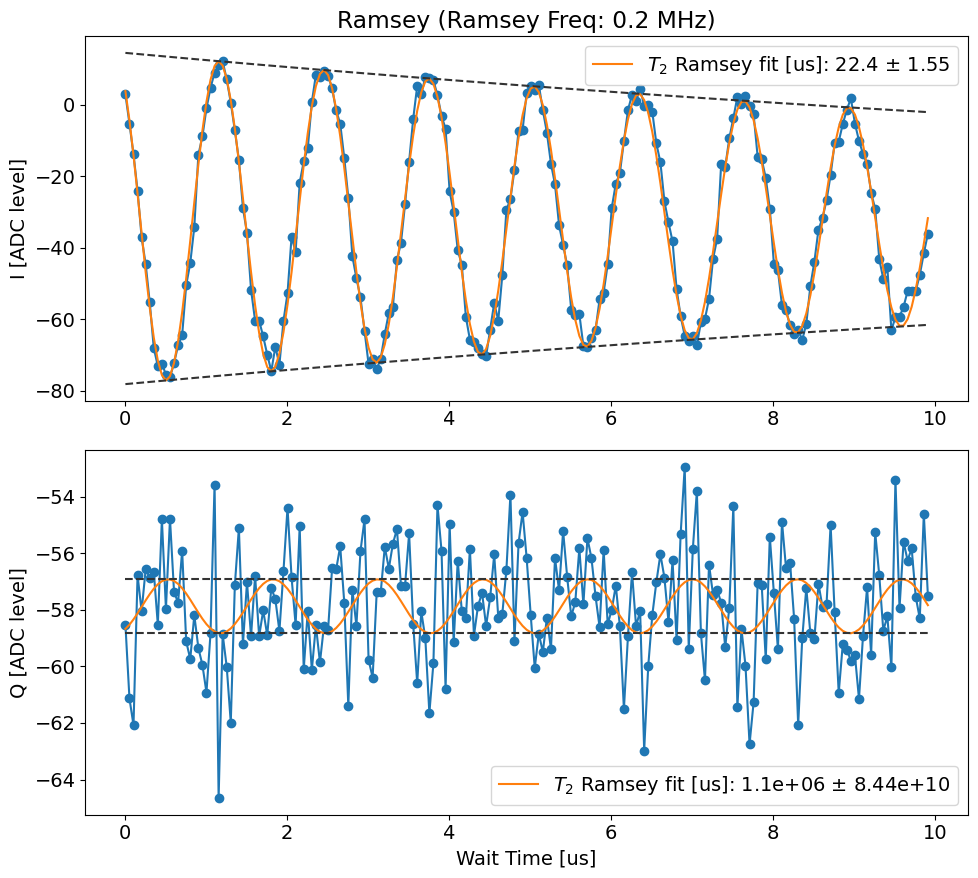

: 

In [ ]:
if expts_to_run['ramsey']:
    if USE_QUEUE:
        ramsey.display()

### Rabi

In [ ]:
amprabi_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.AmplitudeRabiExperiment,
    default_expt_cfg=amprabi_defaults,
    preprocessor=amprabi_preproc,
    postprocessor=amprabi_postproc,
    job_client=client,
    use_queue=USE_QUEUE,
)

: 

In [ ]:
if expts_to_run['rabi']:
    amprabi = amprabi_runner.execute(
            transition=transition,
            step=200,
    )

Job submitted: JOB-20260602-00129 (queue position: 1)

[0.0s] Job JOB-20260602-00129: pending

[2.0s] Job JOB-20260602-00129: running
[WORKER] Loading AmplitudeRabiExperiment from experiments.single_qubit.amplitude_rabi
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260602-00129_AmplitudeRabiExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.25mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 6552/7500 [00:16<00:02, 399.36it/s]
[26.2s] Job JOB-20260602-00129: completed
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7500/7500 [00:18<00:00, 399.33it/s]
Attempted to init fitparam 0 to 49.882621621621624, which is out of bounds 0 to 20.161581081081085. Instead init to 10.080790540540542
Attempted to init fitparam 4

: 

Pi gain from avgi data [dac units]: 9763
	Pi/2 gain from avgi data [dac units]: 4857
Pi gain from avgq data [dac units]: 6487
	Pi/2 gain from avgq data [dac units]: 4210


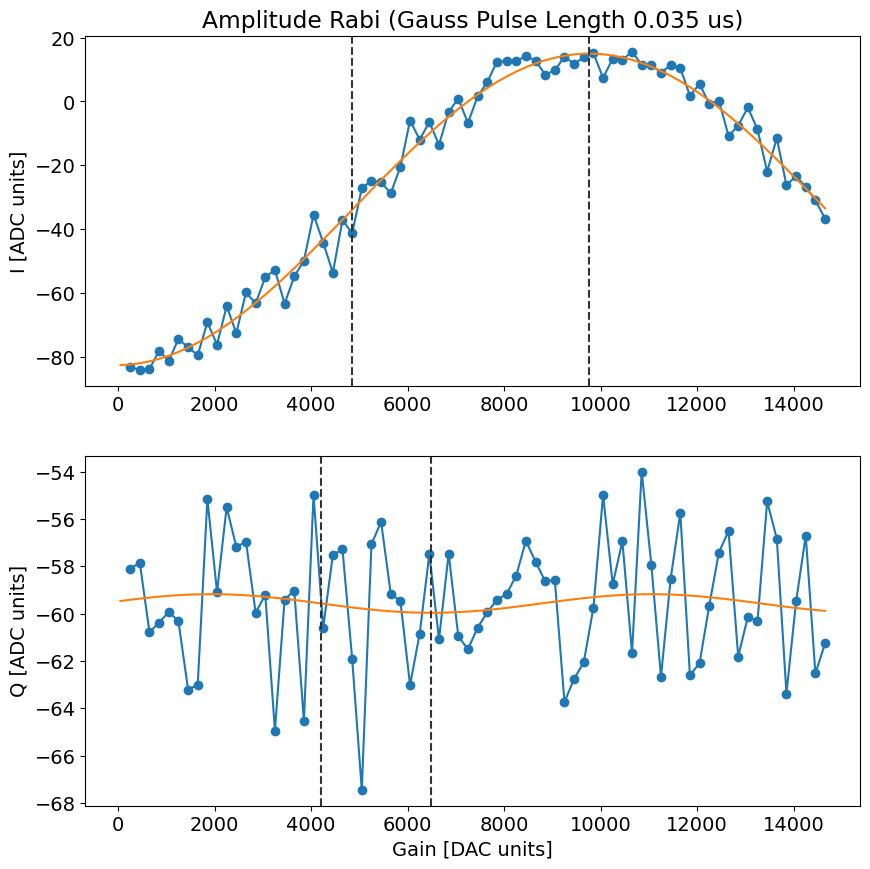

: 

In [ ]:
if expts_to_run['rabi']:
    if USE_QUEUE:
        amprabi.display()

### Error amplification $\pi$ pulse

### Frequency

In [65]:
expts = 50 #50
band = 1 #2
freq_start = station.hardware_cfg.device.multiphoton['pi'][transition_label]['frequency'][photon_idx] - band
# freq_start = 3420 - band
step = 2 * band / expts
print(f'Frequency start: {freq_start}, Step: {step}')


Frequency start: 3564.004561857685, Step: 0.04


In [66]:
error_amp_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.ErrorAmplificationExperiment,
    default_expt_cfg=error_amp_defaults,
    preprocessor=error_amp_preproc,
    postprocessor=error_amp_postproc,
    job_client=client,
    use_queue=USE_QUEUE,
)

In [ ]:
error_amp = error_amp_runner.execute(
    transition=transition,
    parameter_to_test='frequency',
    step=2 * band / expts, 
    start=freq_start,
    expts=expts,
    reps=50,
    pulse_type=['multiphoton', transition, 'pi', 0],
    # n_pulses=20,
)


Job submitted: JOB-20260731-00162 (queue position: 1)

[0.0s] Job JOB-20260731-00162: pending

[2.4s] Job JOB-20260731-00162: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260731-00162_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.5mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 10%|████                                    | 1/10 [00:06<00:57,  6.37s/it]

In [ ]:
station.update_all_station_snapshots()

[CONFIG] Created new hardware_config version CFG-HW-20260731-00008
[CONFIG] Reusing existing multiphoton_config version CFG-MP-20260121-00001
[CONFIG] Reusing existing man1_storage_swap version CFG-M1-20260731-00022
[CONFIG] Reusing existing floquet_storage_swap version CFG-FL-20260731-00016
Config snapshots for current station:
  hardware_config: CFG-HW-20260731-00008
  multiphoton_config: CFG-MP-20260121-00001
  man1_storage_swap: CFG-M1-20260731-00022
  floquet_storage_swap: CFG-FL-20260731-00016


{'hardware_config': 'CFG-HW-20260731-00008',
 'multiphoton_config': 'CFG-MP-20260121-00001',
 'man1_storage_swap': 'CFG-M1-20260731-00022',
 'floquet_storage_swap': 'CFG-FL-20260731-00016'}

: 

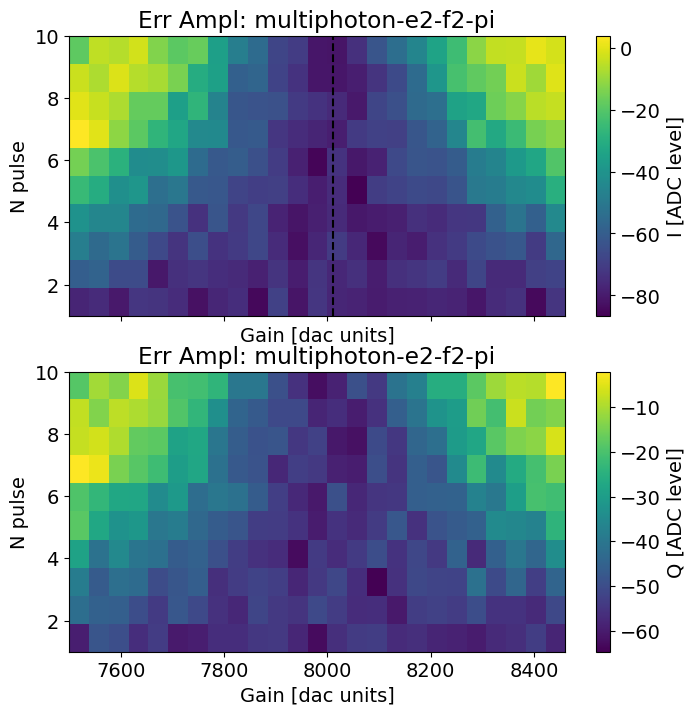

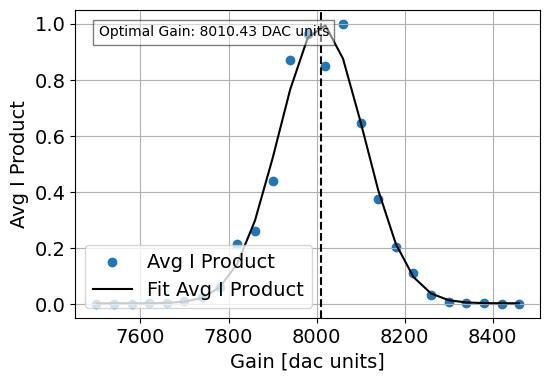

: 

: 

: 

In [ ]:
if USE_QUEUE:
    error_amp.display()

### Amplitude

Gain start: 8247, Step: 80.0
Job submitted: JOB-20260731-00161 (queue position: 1)

[0.0s] Job JOB-20260731-00161: pending

[2.5s] Job JOB-20260731-00161: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260731-00161_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.5mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 90%|████████████████████████████████████    | 9/10 [00:57<00:06,  6.41s/it]
[66.7s] Job JOB-20260731-00161: completed
100%|███████████████████████████████████████| 10/10 [01:04<00:00,  6.41s/it]
Saving C:\experiments\260625DarkModeErrBudgetting\data\JOB-20260731-00161_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260625DarkModeErrBudgetting\expt_objs\JOB-20260731-00161_expt.pkl

Job completed! Data: C:\experiments\260625DarkModeErrBudgetting\

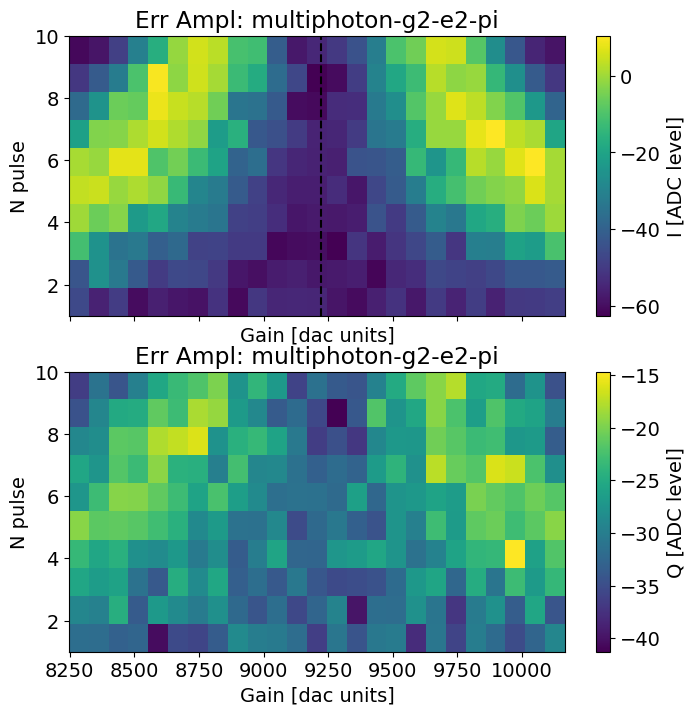

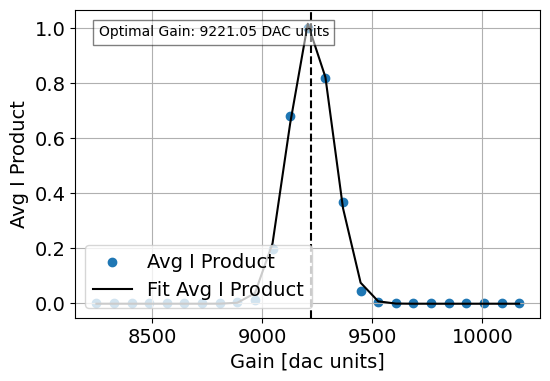

In [64]:
band = 500  * 2
expts = 25
gain_start = station.hardware_cfg.device.multiphoton['pi'][transition_label]['gain'][photon_idx] - band
# gain_start = 10000
step = 2 * band / expts
print(f'Gain start: {gain_start}, Step: {step}')

error_amp = error_amp_runner.execute(
    transition=transition,
    parameter_to_test='gain',
    step=step,
    start=gain_start,
    expts=expts,
    pulse_type=['multiphoton', transition, 'pi', 0],
)

In [35]:
station.update_all_station_snapshots()

[CONFIG] Created new hardware_config version CFG-HW-20260731-00011
[CONFIG] Reusing existing multiphoton_config version CFG-MP-20260121-00001
[CONFIG] Reusing existing man1_storage_swap version CFG-M1-20260731-00022
[CONFIG] Reusing existing floquet_storage_swap version CFG-FL-20260731-00016
Config snapshots for current station:
  hardware_config: CFG-HW-20260731-00011
  multiphoton_config: CFG-MP-20260121-00001
  man1_storage_swap: CFG-M1-20260731-00022
  floquet_storage_swap: CFG-FL-20260731-00016


{'hardware_config': 'CFG-HW-20260731-00011',
 'multiphoton_config': 'CFG-MP-20260121-00001',
 'man1_storage_swap': 'CFG-M1-20260731-00022',
 'floquet_storage_swap': 'CFG-FL-20260731-00016'}

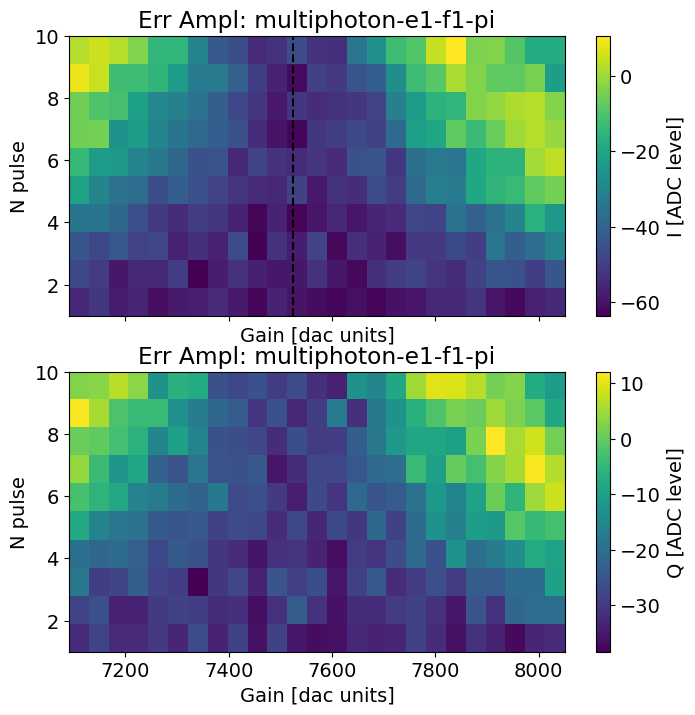

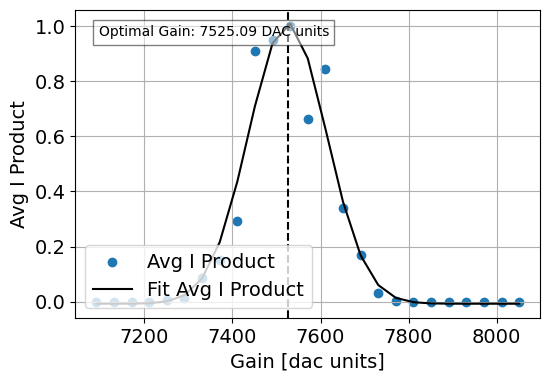

In [32]:
if USE_QUEUE:
    error_amp.display()

### Error amplification $\pi/2$ pulse

### Frequency

In [ ]:
expts = 25
band = 2
freq_start = station.hardware_cfg.device.multiphoton['hpi'][transition_label]['frequency'][photon_idx] - band
step = 2 * band / expts
print(f'Frequency start: {freq_start}, Step: {step}')

error_amp = error_amp_runner.execute(
    transition=transition,
    parameter_to_test='frequency',
    step=step,
    start=freq_start,
    expts=expts,
    pulse_type=['multiphoton', transition, 'hpi', 0],
)

Frequency start: 3560.8472009945226, Step: 0.16
Job submitted: JOB-20260601-00367 (queue position: 1)

[0.0s] Job JOB-20260601-00367: pending

[126.7s] Job JOB-20260601-00367: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260601-00367_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.25mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
cfg at start of acquire {'reps': 100, 'rounds': 1, 'qubit': 0, 'n_pulses': 10, 'active_reset': False, 'man_reset': True, 'storage_reset': True, 'relax_delay': 2500, 'start': 3560.8472009945226, 'expts': 25, 'step': 0.16, 'parameter_to_test': 'frequency', 'pulse_type': ['multiphoton', 'g0-e0', 'hpi', 0], 'man_no': 1, 'pulse_name': 'pi', 'transition': 'g0-e0', '_photon_idx': 0, '_transition_key': 'gn-en', 'qubits': [0]}
 90%|███████████████████████████████

: 

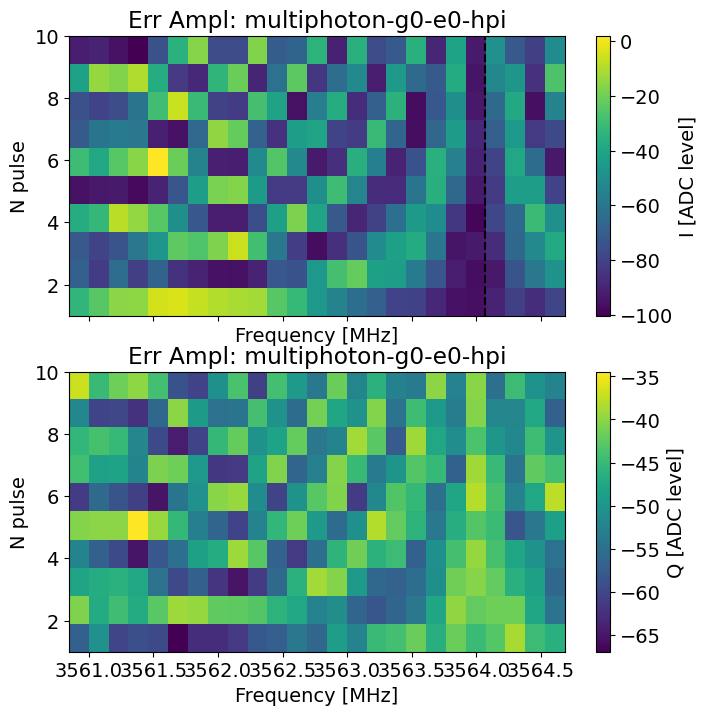

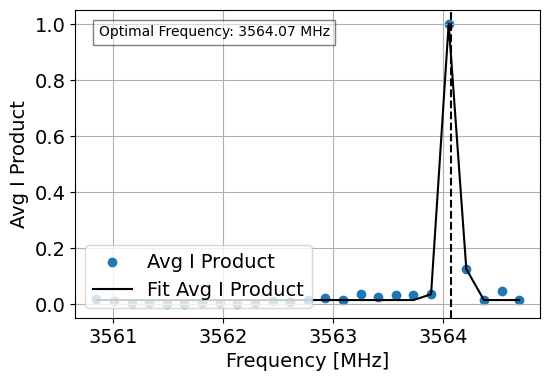

: 

In [ ]:
if USE_QUEUE:
    error_amp.display()

### Amplitude

In [ ]:
band = 1500
expts = 50
# gain_start = station.hardware_cfg.device.multiphoton['hpi'][transition_label]['gain'][photon_idx] - band
gain_start = 8000 - band
step = 2 * band / expts
print(f'Gain start: {gain_start}, Step: {step}')

error_amp = error_amp_runner.execute(
    transition=transition,
    parameter_to_test='gain',
    step=step,
    start=gain_start,
    expts=expts,
    pulse_type=['multiphoton', transition, 'hpi', 0],
)

Gain start: 6500, Step: 60.0
Job submitted: JOB-20260601-00369 (queue position: 1)

[0.0s] Job JOB-20260601-00369: pending

[128.6s] Job JOB-20260601-00369: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260601-00369_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.25mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
cfg at start of acquire {'reps': 100, 'rounds': 1, 'qubit': 0, 'n_pulses': 10, 'active_reset': False, 'man_reset': True, 'storage_reset': True, 'relax_delay': 2500, 'start': 6500, 'expts': 50, 'step': 60.0, 'parameter_to_test': 'gain', 'pulse_type': ['multiphoton', 'g0-e0', 'hpi', 0], 'man_no': 1, 'pulse_name': 'pi', 'transition': 'g0-e0', '_photon_idx': 0, '_transition_key': 'gn-en', 'qubits': [0]}
 90%|█████████████████████████████████████████████████████████████████████

: 

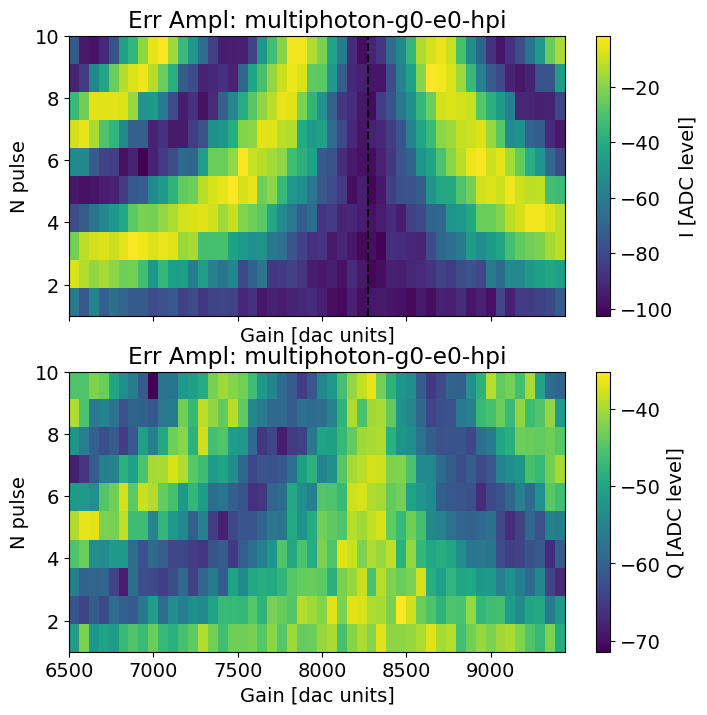

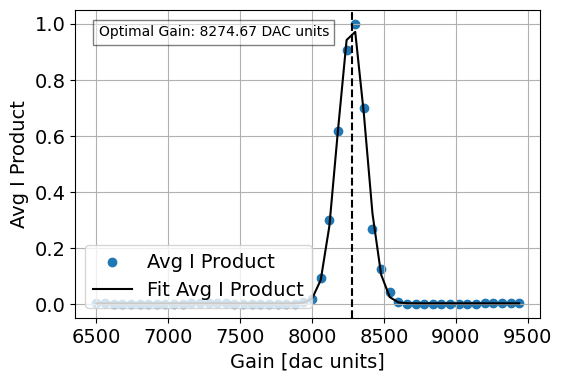

: 

In [ ]:
if USE_QUEUE:
    error_amp.display()

## Define the sideband we want to calibrate

In [36]:
sideband = 'f1-g2'
sideband_label = sideband[0] + 'n' + '-' + sideband[3] + 'n+1'
photon_idx = int(sideband[1])

In [37]:
qspec_defaults = AttrDict(dict(
    man_mode_no=1,
    start=1999, 
    step=0.01, 
    expts=500,
    reps=500, 
    rounds=1, 
    length=1,
    gain=1000, 
    pulse_type='gaussian',
    qubit_f=False, 
    qubits=[0],
    transition=None,
    relax_delay=200,
))

def qspec_preproc(station, default_expt_cfg, **kwargs):
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)

    if expt_cfg.transition is not None:
        transition = expt_cfg.transition
        i = int(transition[1])  # photon number from transition string
        
        # Build pre_sweep_pulse based on transition
        pre_sweep_pulse = mm_base_calib.prep_man_photon(man_no=expt_cfg.man_mode_no, photon_no=i)
        pre_sweep_pulse.append(['multiphoton', 'g' + str(i) + '-' + 'e' + str(i), 'pi', 0])
        pre_sweep_pulse.append(['multiphoton', 'e' + str(i) + '-' + 'f' + str(i), 'pi', 0])
        expt_cfg.pre_sweep_pulse = mm_base_calib.get_prepulse_creator(pre_sweep_pulse, station.hardware_cfg).pulse.tolist()
        expt_cfg.prepulse = len(expt_cfg.pre_sweep_pulse) > 0

        expt_cfg._transition_key = transition[0] + 'n' + '-' + transition[3] + 'n+1'
        expt_cfg._photon_idx = i

        


    if expt_cfg.start is None: 
        band = expt_cfg.step * expt_cfg.expts / 2
        start = station.hardware_cfg.device.multiphoton['pi'][expt_cfg._transition_key]['frequency'][expt_cfg._photon_idx] - band
        expt_cfg.start = start

    return expt_cfg

def qspec_postproc(station, expt):
    from fitting.fit_display_classes import Spectroscopy
    qspec_analysis = Spectroscopy(expt.data)
    qspec_analysis.analyze(fit=True)

    if hasattr(expt.cfg.expt, '_transition_key') and expt.cfg.expt.get('transition') is not None:
        _transition = expt.cfg.expt._transition_key
        i = expt.cfg.expt._photon_idx
        
        old_freq_pi = station.hardware_cfg.device.multiphoton['pi'][_transition]['frequency'][i]
        
        fitted_freq = qspec_analysis.data['fit_avgi'][2]
        station.hardware_cfg.device.multiphoton['pi'][_transition]['frequency'][i] = fitted_freq
    
        print(f'  pi:  {old_freq_pi} -> {station.hardware_cfg.device.multiphoton["pi"][_transition]["frequency"][i]}')


In [38]:
qspec_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.PulseProbeF0g1SpectroscopyExperiment,
    default_expt_cfg=qspec_defaults,
    preprocessor=qspec_preproc,
    postprocessor=qspec_postproc,
    job_client=client,
    use_queue=USE_QUEUE,
)


Job submitted: JOB-20260731-00138 (queue position: 1)

[0.0s] Job JOB-20260731-00138: pending

[2.0s] Job JOB-20260731-00138: running
[WORKER] Loading PulseProbeF0g1SpectroscopyExperiment from experiments.single_qubit.pulse_probe_f0g1_spectroscopy
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260731-00138_PulseProbeF0g1SpectroscopyExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.5mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 98%|████████████████████████████▎| 488124/500000 [01:39<00:02, 4887.44it/s]
[103.5s] Job JOB-20260731-00138: completed
100%|█████████████████████████████| 500000/500000 [01:42<00:00, 4887.98it/s]
Saving C:\experiments\260625DarkModeErrBudgetting\data\JOB-20260731-00138_PulseProbeF0g1SpectroscopyExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260625DarkModeErrBudgetting\expt_objs\JOB-20260731-00138_expt.pkl

Job completed! Data: C:\experiments\260625DarkModeErrBudge

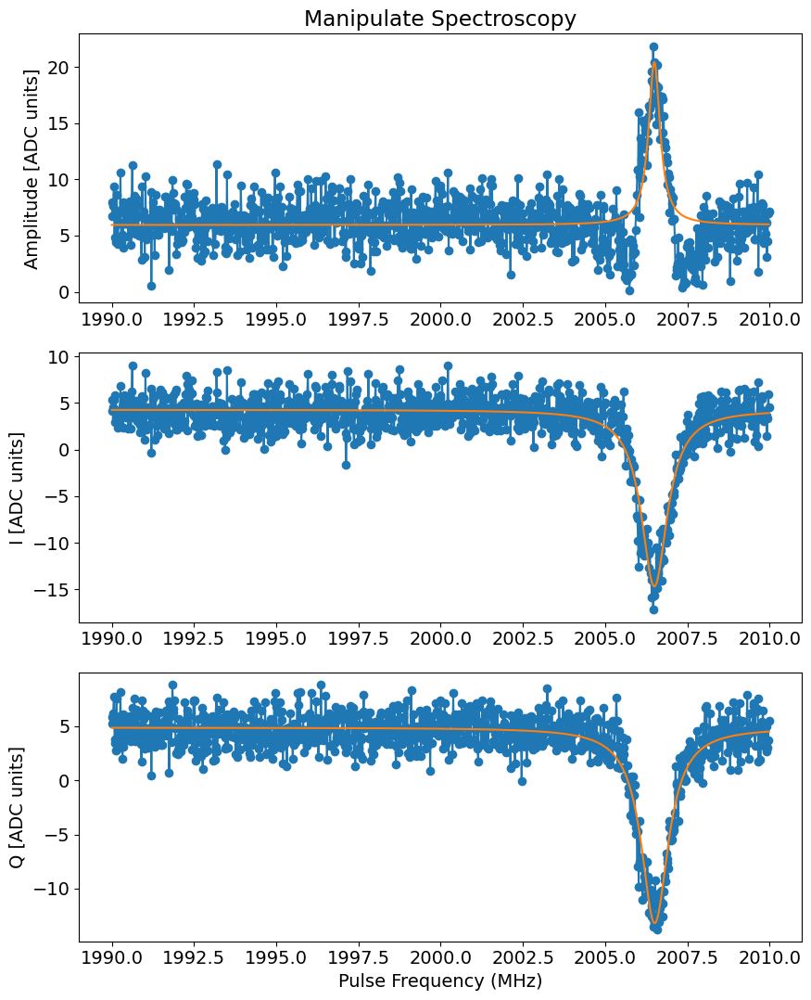

In [40]:
if expts_to_run['qspec_f0g1']:
    qspec = qspec_runner.execute(
        transition=sideband,
        start=1999, 
        step=0.02, 
        expts=1000,
    )

Found peak in amps at [MHz] 2006.4959116401171, HWHM -0.2135530077616638
Found peak in I at [MHz] 2006.4960176317, HWHM -0.4812253001491794
Found peak in Q at [MHz] 2006.5079047078643, HWHM -0.49925371580181416


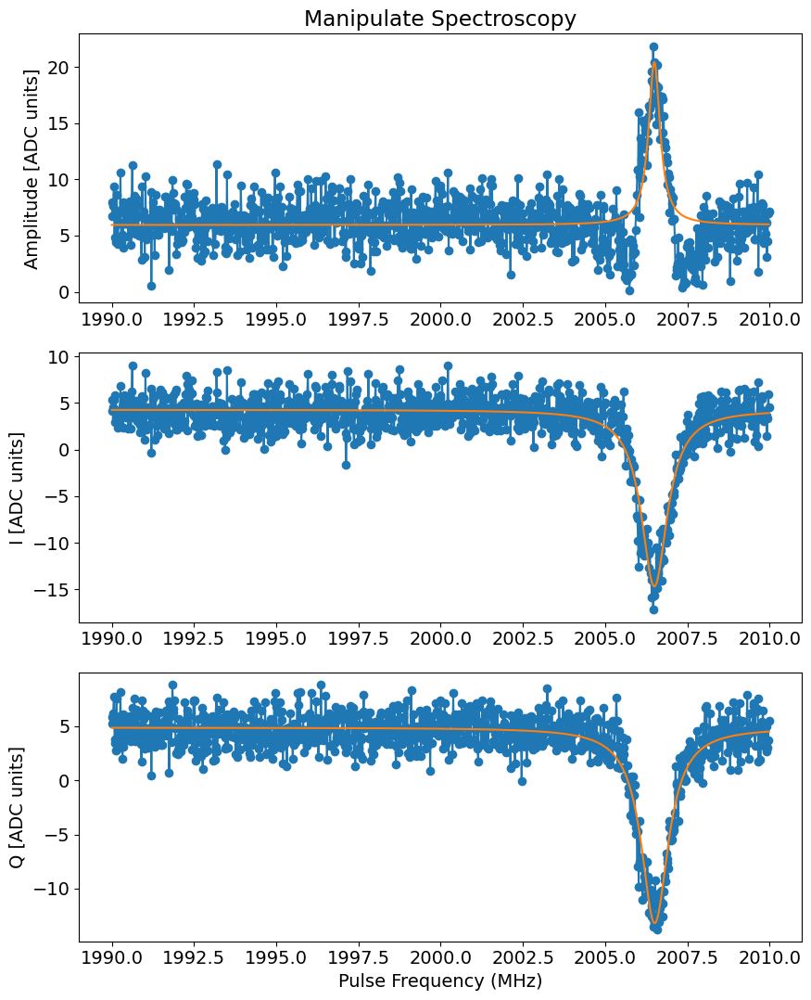

In [41]:
qspec.display()

In [43]:
station.update_all_station_snapshots()

[CONFIG] Created new hardware_config version CFG-HW-20260731-00012
[CONFIG] Reusing existing multiphoton_config version CFG-MP-20260121-00001
[CONFIG] Reusing existing man1_storage_swap version CFG-M1-20260731-00022
[CONFIG] Reusing existing floquet_storage_swap version CFG-FL-20260731-00016
Config snapshots for current station:
  hardware_config: CFG-HW-20260731-00012
  multiphoton_config: CFG-MP-20260121-00001
  man1_storage_swap: CFG-M1-20260731-00022
  floquet_storage_swap: CFG-FL-20260731-00016


{'hardware_config': 'CFG-HW-20260731-00012',
 'multiphoton_config': 'CFG-MP-20260121-00001',
 'man1_storage_swap': 'CFG-M1-20260731-00022',
 'floquet_storage_swap': 'CFG-FL-20260731-00016'}

### Quick chevron

In [44]:
chevron_defaults = AttrDict(dict(
    start=2,
    step=0.1,
    expts=25,
    reps=100,
    rounds=1,
    qubits=[0],
    gain=8000,
    ramp_sigma=0.005,
    use_arb_waveform=False,
    pi_ge_before=False,
    pi_ef_before=False,
    pi_ge_after=False,
    normalize=False,
    active_reset=False,
    check_man_reset=[False, 0],
    check_man_reset_pi=[],
    transition=None,
    err_amp_reps=0,
    swap_lossy=False,
    prepulse=False, 
    postpulse=False,
    pre_sweep_pulse=None,
    post_sweep_pulse=None,
    man_mode_no=1,
))

def chevron_preproc(station, default_expt_cfg, **kwargs):
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)

    if expt_cfg.transition is not None:
        transition = expt_cfg.transition
        i = int(transition[1])  # photon number from transition string
        
        # Build pre_sweep_pulse based on transition
        pre_sweep_pulse = mm_base_calib.prep_man_photon(man_no=expt_cfg.man_mode_no, photon_no=i)
        pre_sweep_pulse.append(['multiphoton', 'g' + str(i) + '-e' + str(i), 'pi', 0])
        pre_sweep_pulse.append(['multiphoton', 'e' + str(i) + '-f' + str(i), 'pi', 0])
        expt_cfg.pre_sweep_pulse = mm_base_calib.get_prepulse_creator(pre_sweep_pulse, station.hardware_cfg).pulse.tolist()
        expt_cfg.prepulse = len(expt_cfg.pre_sweep_pulse) > 0
        expt_cfg._transition_key = transition[0] + 'n' + '-' + transition[3] + 'n+1'
        expt_cfg._photon_idx = i

    return expt_cfg

def chevron_postproc(station, expt):

    expt_cfg = expt.data['_config']['expt']

    if hasattr(expt, '_chevron_analysis') and expt._chevron_analysis: 
        analysis = expt._chevron_analysis
        print(analysis.results)
        best_freq = analysis.results.get('best_frequency_contrast')

        if best_freq: 
            if hasattr(expt_cfg, '_transition_key'): 
                _transition = expt_cfg._transition_key
                i = expt_cfg._photon_idx
                
                old_freq_pi = station.hardware_cfg.device.multiphoton['pi'][_transition]['frequency'][i]
                
                station.hardware_cfg.device.multiphoton['pi'][_transition]['frequency'][i] = best_freq
            
                print(f'  pi:  {old_freq_pi} -> {station.hardware_cfg.device.multiphoton["pi"][_transition]["frequency"][i]}')
    else: 
        print('No chevron analysis found in experiment.')



chevron_runner = SweepRunner(
    station=station,
    ExptClass=meas.LengthRabiGeneralF0g1Experiment,
    default_expt_cfg=chevron_defaults,
    sweep_param='freq', 
    live_plot=False,
    preprocessor=chevron_preproc,
    # postprocessor=chevron_postproc,
    job_client=client,
    use_queue=USE_QUEUE,
)


In [45]:
def chevron_postproc(station, mother_expt):

    expt_cfg = mother_expt.cfg.expt

    # if hasattr(mother_expt, '_chevron_analysis') and mother_expt._chevron_analysis: 
    #     analysis = mother_expt._chevron_analysis
    #     print(analysis.results)
    #     best_freq = analysis.results.get('best_frequency_contrast')

    from fitting.fit_display_classes import ChevronFitting

    chevron_analysis = ChevronFitting(
        frequencies=mother_expt.data['freq_sweep'],
        time=mother_expt.data['xpts'][0],
        response_matrix=mother_expt.data['avgi'],
        config=station.hardware_cfg,
        station=station,
    )
    chevron_analysis.analyze()
    best_freq = chevron_analysis.results.get('best_frequency_contrast')
    mother_expt.analysis = chevron_analysis

    if best_freq: 
        if hasattr(expt_cfg, '_transition_key'): 
            _transition = expt_cfg._transition_key
            i = expt_cfg._photon_idx
            
            old_freq_pi = station.hardware_cfg.device.multiphoton['pi'][_transition]['frequency'][i]
            
            station.hardware_cfg.device.multiphoton['pi'][_transition]['frequency'][i] = best_freq
            if i == 0: 
                print("updating the storage mode too:")
                station.ds_storage.update_freq('M1', best_freq)
        
            print(f'  pi:  {old_freq_pi} -> {station.hardware_cfg.device.multiphoton["pi"][_transition]["frequency"][i]}')
    else: 
        print('No chevron analysis found in experiment.')

    chevron_analysis.display_results()

In [46]:
step = 0.2
freq = station.hardware_cfg.device.multiphoton['pi'][sideband_label]['frequency'][photon_idx]
# freq = 1995
f_start = freq - 4
f_stop = freq + 4
# nb_pts = int((f_stop - f_start) / step) + 1
nb_pts = 16
gain = station.hardware_cfg.device.multiphoton['pi'][sideband_label]['gain'][photon_idx]
chevron = chevron_runner.execute(
    transition=sideband,
    sweep_start=f_start, 
    sweep_stop=f_stop,
    sweep_npts=nb_pts,
    gain=gain,
    start=1,
    batch = True
)

Sweep: freq from 2002.4960176317 to 2010.4960176317 (16 pts)
  File: C:\experiments\260625DarkModeErrBudgetting\data\00000_LengthRabiGeneralF0g1Experiment_sweep.h5
  Submitting 16 jobs...
Job submitted: JOB-20260731-00139 (queue position: 1)
Job submitted: JOB-20260731-00140 (queue position: 2)
Job submitted: JOB-20260731-00141 (queue position: 3)
Job submitted: JOB-20260731-00142 (queue position: 4)
Job submitted: JOB-20260731-00143 (queue position: 5)
Job submitted: JOB-20260731-00144 (queue position: 6)
Job submitted: JOB-20260731-00145 (queue position: 7)
Job submitted: JOB-20260731-00146 (queue position: 8)
Job submitted: JOB-20260731-00147 (queue position: 9)
Job submitted: JOB-20260731-00148 (queue position: 10)
Job submitted: JOB-20260731-00149 (queue position: 11)
Job submitted: JOB-20260731-00150 (queue position: 12)
Job submitted: JOB-20260731-00151 (queue position: 13)
Job submitted: JOB-20260731-00152 (queue position: 13)
Job submitted: JOB-20260731-00153 (queue position: 

uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
  pi:  2006.4960176317 -> 2003.0293509650332


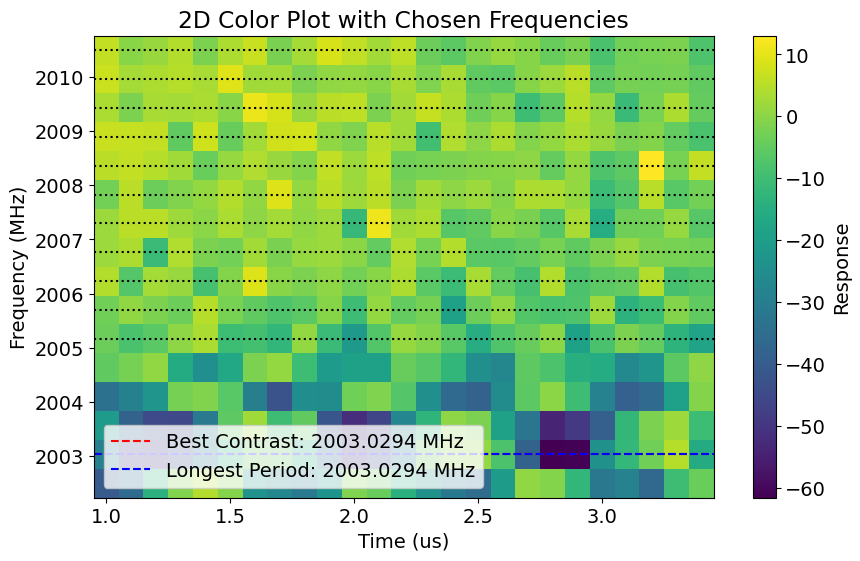

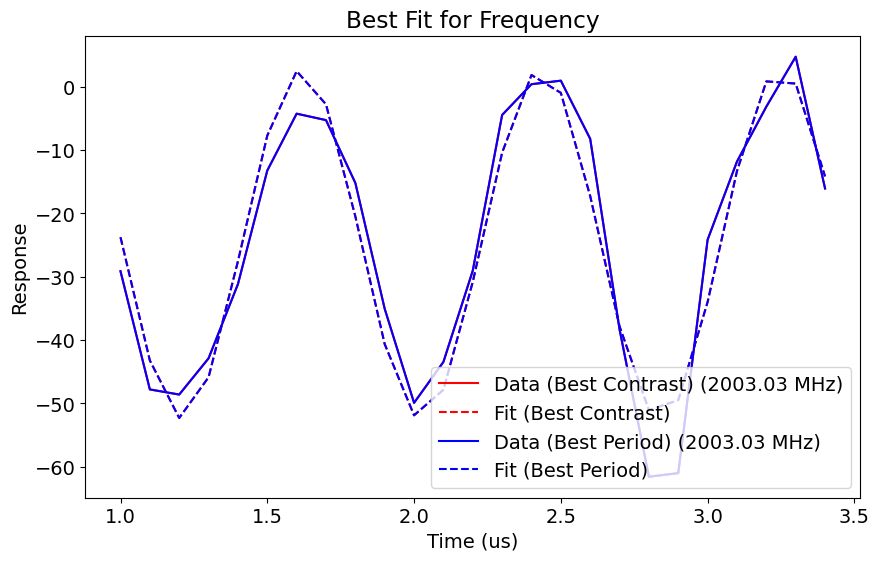

In [47]:
chevron_postproc(station, chevron)

### Length rabi first round

In [48]:
length_rabi_f0g1_defaults = AttrDict(dict(
    man_mode_no=1,
    start=None,
    step=0.045,
    qubits=[0],
    expts=50,
    reps=100,
    rounds=1,
    gain=8000,
    freq=None,
    use_arb_waveform=False,
    pi_ge_before=False,
    pi_ef_before=False,
    pi_ge_after=False,
    normalize=False,
    active_reset=False,
    man_reset=True, 
    stor_reset=True,
    check_man_reset=[False, 0],
    swap_lossy=False,
    check_man_reset_pi=[],
    prepulse=False, 
    postpulse=False,
    post_sweep_pulse=None,
    pre_sweep_pulse=None,
    err_amp_reps=0,
    relax_delay=2500,
))

def do_length_rabi_f0g1_proproc(station, default_expt_cfg, **kwargs):
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)

    if expt_cfg.transition is not None:
        transition = expt_cfg.transition
        i = int(transition[1])  # photon number from transition string
        
        # Build pre_sweep_pulse based on transition
        pre_sweep_pulse = mm_base_calib.prep_man_photon(man_no=expt_cfg.man_mode_no, photon_no=i)
        pre_sweep_pulse.append(['multiphoton', 'g' + str(i) + '-e' + str(i), 'pi', 0])
        pre_sweep_pulse.append(['multiphoton', 'e' + str(i) + '-f' + str(i), 'pi', 0])  
        expt_cfg.pre_sweep_pulse = mm_base_calib.get_prepulse_creator(pre_sweep_pulse, station.hardware_cfg).pulse.tolist()
        expt_cfg.prepulse = len(expt_cfg.pre_sweep_pulse) > 0
        expt_cfg._transition_key = transition[0] + 'n' + '-' + transition[3] + 'n+1'
        expt_cfg._photon_idx = i  

        print('pre pulse:', expt_cfg.pre_sweep_pulse)



        if expt_cfg.freq is None:
            freq = station.hardware_cfg.device.multiphoton['pi'][expt_cfg._transition_key]['frequency'][expt_cfg._photon_idx]
            expt_cfg.freq = freq


    if expt_cfg.start is None:
        expt_cfg.start =  station.soccfg.cycles2us(3)

    return expt_cfg

def length_rabi_f0g1_postproc(station, expt):
    man_mode_no = expt.cfg.expt.man_mode_no

    # Get analysis results from the LengthRabiFitting object stored in expt
    if hasattr(expt, '_length_rabi_analysis'):
        analysis = expt._length_rabi_analysis
        pi_length = analysis.results['pi_length']
        pi2_length = analysis.results['pi2_length']
        gain = expt.cfg.expt.gain
        freq = expt.cfg.expt.freq

    if hasattr(expt.cfg.expt, '_transition_key') and expt.cfg.expt.get('transition') is not None:
        _transition = expt.cfg.expt._transition_key
        i = expt.cfg.expt._photon_idx
        
        old_pi_length = station.hardware_cfg.device.multiphoton['pi'][_transition]['length'][i]
        
        station.hardware_cfg.device.multiphoton['pi'][_transition]['length'][i] = pi_length
        
        print(f'Updated multiphoton {_transition} pi lengths for photon {i}:')
        print(f'  pi length: {old_pi_length} -> {pi_length}')

    
lenrabi_fog1_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.LengthRabiGeneralF0g1Experiment,
    default_expt_cfg=length_rabi_f0g1_defaults,
    preprocessor=do_length_rabi_f0g1_proproc,
    postprocessor=length_rabi_f0g1_postproc,
    job_client=client,
    use_queue=USE_QUEUE,
)     


pre pulse: [[3565.0322364012964, 3421.538132345956, 2003.8817739287417, 3565.331441503861, 3421.2880278176217], [9247, 7591, 8000, 9267, 7525], [0, 0, 0.5987773447569904, 0, 0], [0, 0, 0, 0, 0], [2, 2, 0, 2, 2], ['gauss', 'gauss', 'flat_top', 'gauss', 'gauss'], [0.035, 0.035, 0.005, 0.035, 0.035]]
Job submitted: JOB-20260731-00155 (queue position: 1)

[0.0s] Job JOB-20260731-00155: pending

[3.0s] Job JOB-20260731-00155: running
[WORKER] Loading LengthRabiGeneralF0g1Experiment from experiments.single_qubit.length_rabi_f0g1_general
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260731-00155_LengthRabiGeneralF0g1Experiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.5mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 92%|███████████████████████████████████▉   | 46/50 [00:16<00:01,  2.75it/s]
[20.4s] Job JOB-20260731-00155: completed
100%|███████████████████████████████████████| 50/50 [00:18<00:00,  2.70it/s]
Sav

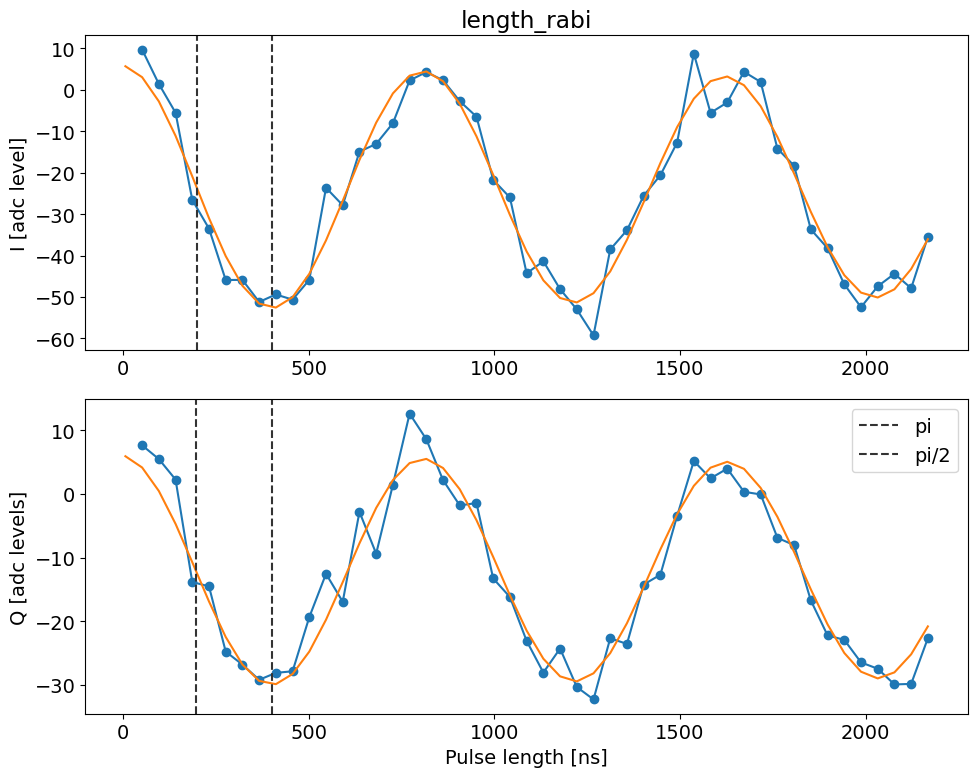

In [49]:
gain = station.hardware_cfg.device.multiphoton['pi'][sideband_label]['gain'][photon_idx]
freq = station.hardware_cfg.device.multiphoton['pi'][sideband_label]['frequency'][photon_idx]
len_rabis_fog1 = lenrabi_fog1_runner.execute(
    transition=sideband,
    gain=gain,
    freq=freq,
)

p1: 1.2312195082173094
p2: 91.51334838988244
Pi length: 0.40268713349938334
Pi/2 length: 0.19963641968964474
p1: 1.2248451446162907
p2: 93.24081679244298
Pi length: 0.4008651487824761
Pi/2 length: 0.1967577143864995


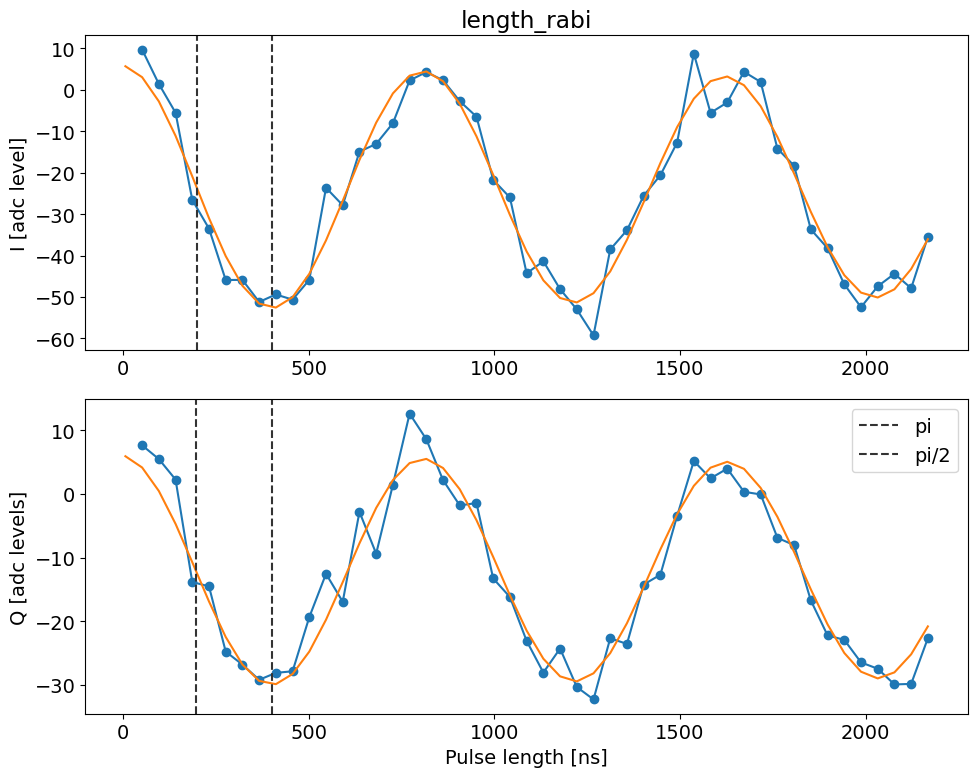

In [50]:
len_rabis_fog1.display()

### Error amplification

In [54]:
expts = 50
band = 0.25
freq_start = station.hardware_cfg.device.multiphoton['pi'][sideband_label]['frequency'][photon_idx] - band
step = 2 * band / expts
print(f'Frequency start: {freq_start}, Step: {step}')

Frequency start: 2003.008079498313, Step: 0.01


Job submitted: JOB-20260731-00158 (queue position: 1)

[0.0s] Job JOB-20260731-00158: pending

[2.0s] Job JOB-20260731-00158: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260731-00158_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.5mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 86%|███████████████████████████████████▏     | 6/7 [01:15<00:12, 12.65s/it]
[90.1s] Job JOB-20260731-00158: completed
100%|█████████████████████████████████████████| 7/7 [01:28<00:00, 12.65s/it]
Saving C:\experiments\260625DarkModeErrBudgetting\data\JOB-20260731-00158_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260625DarkModeErrBudgetting\expt_objs\JOB-20260731-00158_expt.pkl

Job completed! Data: C:\experiments\260625DarkModeErrBudgetting\data\JOB-20260731-00158_Error

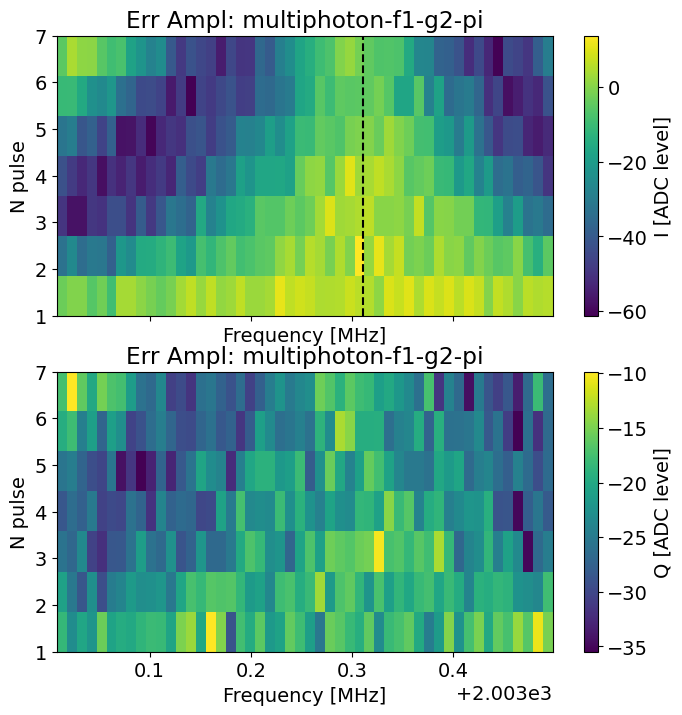

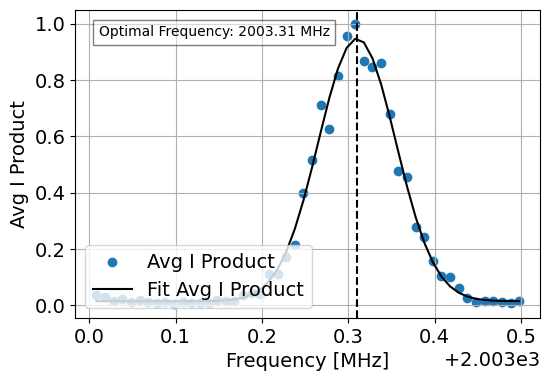

parameter: frequency
Updated multiphoton fn-gn+1 pi frequency for photon 1:
  2003.258079498313 -> 2003.310263221437


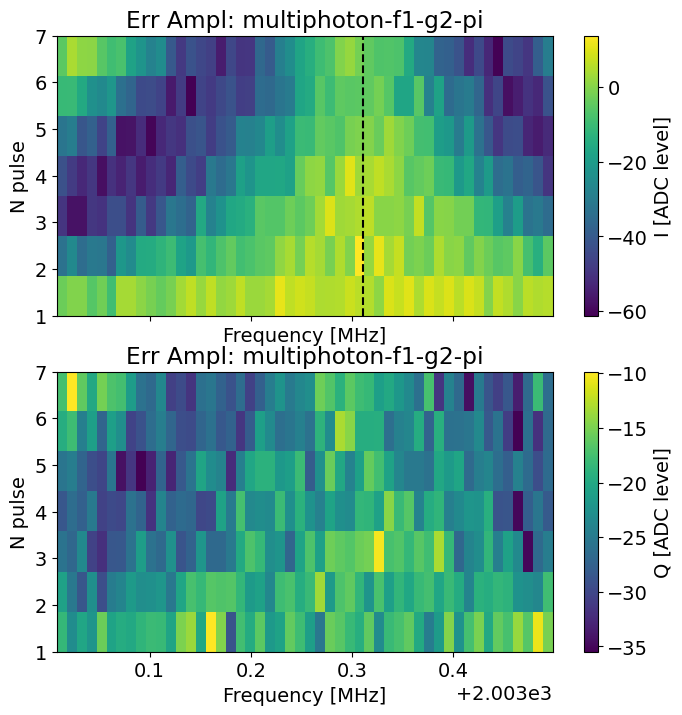

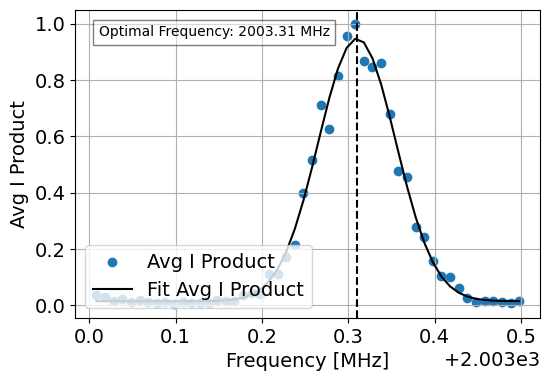

In [55]:
# create a postproc function where state_fin='e'
error_amp_postproc_fog1 = lambda station, expt: error_amp_postproc(station, expt, state_fin='e') 

error_amp_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.ErrorAmplificationExperiment,
    default_expt_cfg=error_amp_defaults,
    preprocessor=error_amp_preproc,
    postprocessor=error_amp_postproc_fog1,
    job_client=client,
    use_queue=USE_QUEUE,
)

err_amp = error_amp_runner.execute(
    transition=sideband,
    parameter_to_test='frequency',
    step=step,
    start=freq_start,
    expts=expts,
    n_pulses=7,
    pulse_type=['multiphoton', sideband, 'pi', 0],
    go_kwargs = dict(analyze=False, display=False),
    postprocess=True
)


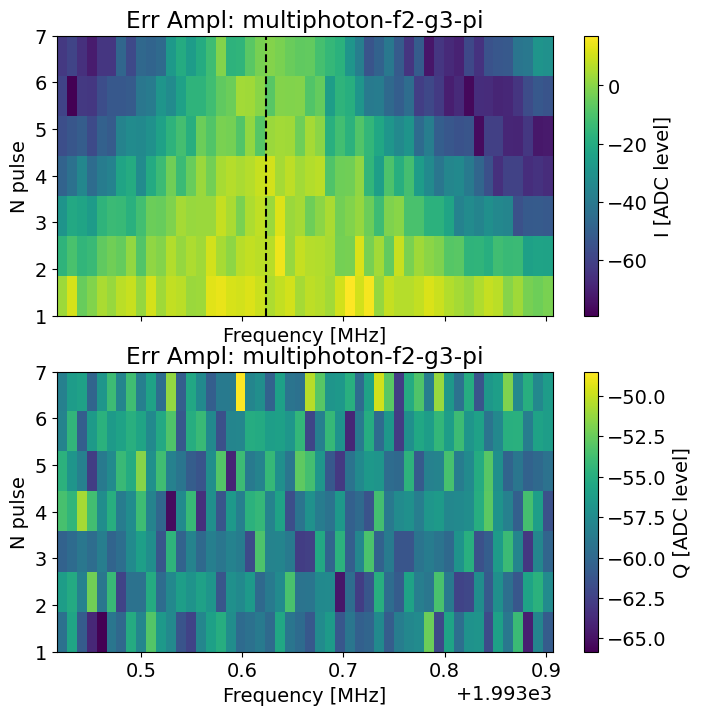

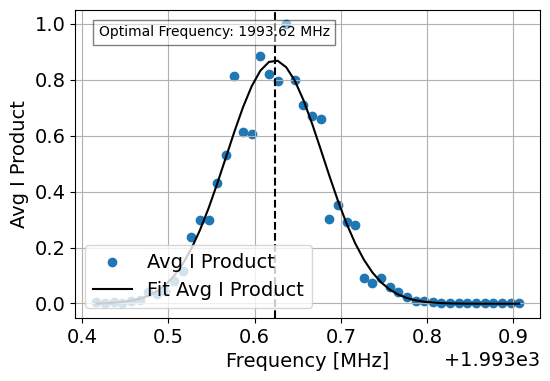

In [173]:
if USE_QUEUE:
    err_amp.display()

### Length Rabi

pre pulse: [[3565.0322364012964, 3421.538132345956, 2003.8817739287417, 3565.331441503861, 3421.2880278176217], [9247, 7591, 8000, 9267, 7525], [0, 0, 0.5987773447569904, 0, 0], [0, 0, 0, 0, 0], [2, 2, 0, 2, 2], ['gauss', 'gauss', 'flat_top', 'gauss', 'gauss'], [0.035, 0.035, 0.005, 0.035, 0.035]]
Job submitted: JOB-20260731-00159 (queue position: 1)

[0.0s] Job JOB-20260731-00159: pending

[2.8s] Job JOB-20260731-00159: running
[WORKER] Loading LengthRabiGeneralF0g1Experiment from experiments.single_qubit.length_rabi_f0g1_general
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260731-00159_LengthRabiGeneralF0g1Experiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.5mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 98%|████████████████████████████████████▍| 197/200 [01:12<00:01,  2.74it/s]
[76.6s] Job JOB-20260731-00159: completed
100%|█████████████████████████████████████| 200/200 [01:13<00:00,  2.72it/s]
Sav

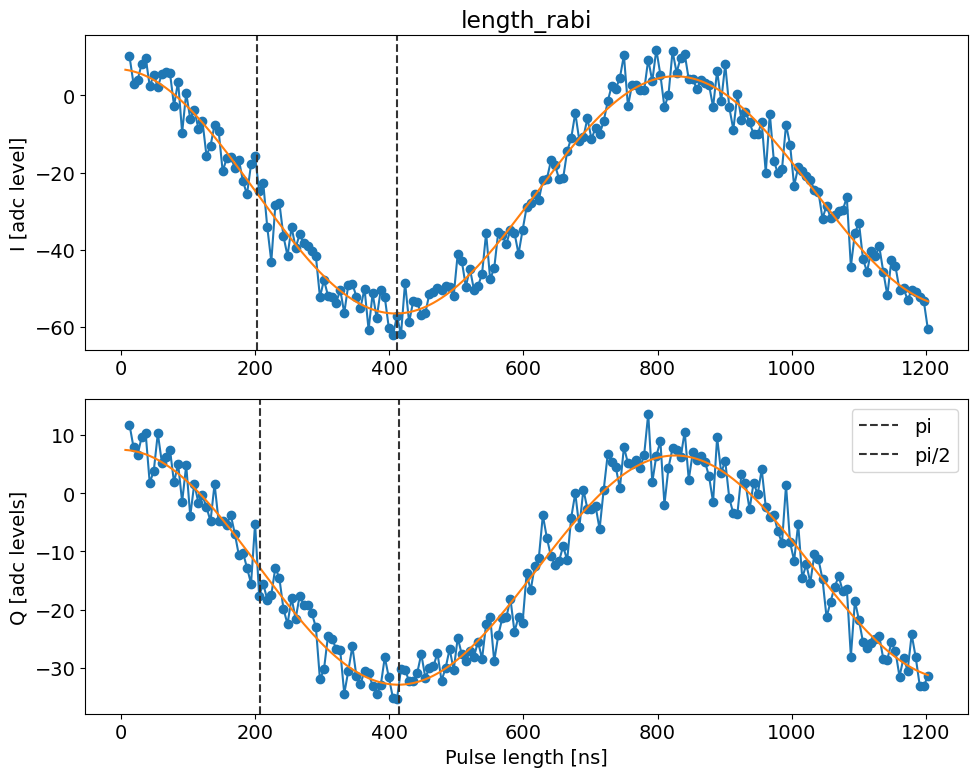

In [56]:
stop = 1.5 * station.hardware_cfg.device.multiphoton['pi'][sideband_label]['length'][photon_idx] * 2
gain = station.hardware_cfg.device.multiphoton['pi'][sideband_label]['gain'][photon_idx]
freq = station.hardware_cfg.device.multiphoton['pi'][sideband_label]['frequency'][photon_idx]
expts = 200
step = stop / expts


len_rabis_fog1 = lenrabi_fog1_runner.execute(
    transition=sideband,
    gain=gain,
    freq=freq,
    expts=expts,
    step=step,
)

p1: 1.1999764894441405
p2: 92.40809342542416
Pi length: 0.4111004306630691
Pi/2 length: 0.20276301555603954
p1: 1.2115798618861606
p2: 89.1474243519791
Pi length: 0.41463900275370313
Pi/2 length: 0.2082968474699354


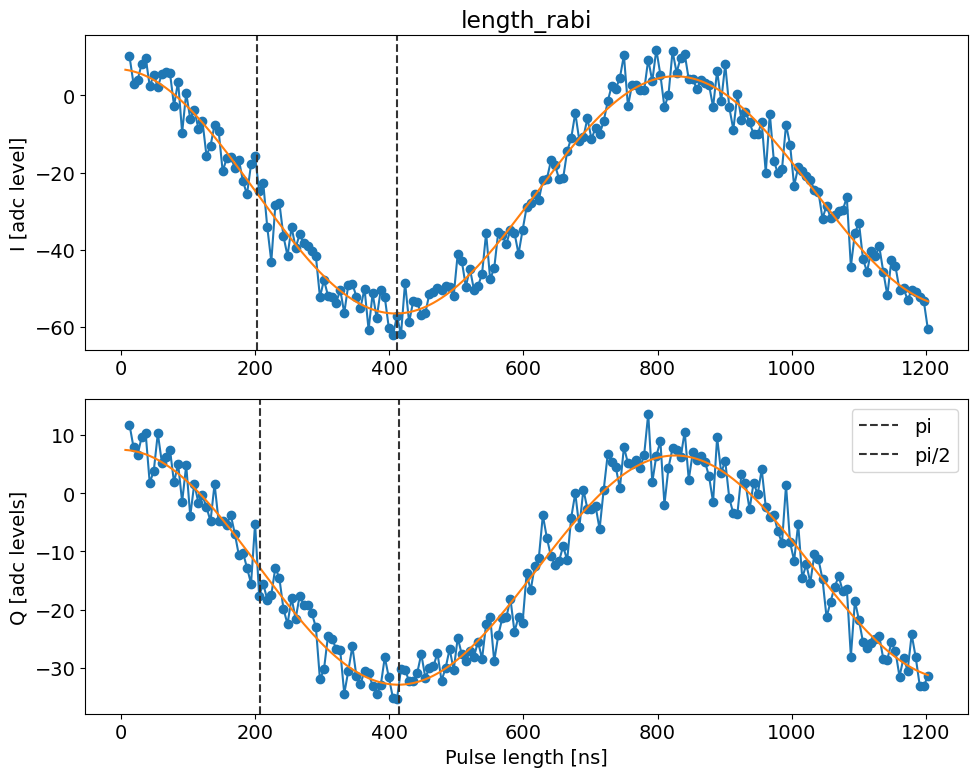

In [57]:
len_rabis_fog1.display()

In [58]:
station.update_all_station_snapshots()

[CONFIG] Created new hardware_config version CFG-HW-20260731-00018
[CONFIG] Reusing existing multiphoton_config version CFG-MP-20260121-00001
[CONFIG] Reusing existing man1_storage_swap version CFG-M1-20260731-00022
[CONFIG] Reusing existing floquet_storage_swap version CFG-FL-20260731-00016
Config snapshots for current station:
  hardware_config: CFG-HW-20260731-00018
  multiphoton_config: CFG-MP-20260121-00001
  man1_storage_swap: CFG-M1-20260731-00022
  floquet_storage_swap: CFG-FL-20260731-00016


{'hardware_config': 'CFG-HW-20260731-00018',
 'multiphoton_config': 'CFG-MP-20260121-00001',
 'man1_storage_swap': 'CFG-M1-20260731-00022',
 'floquet_storage_swap': 'CFG-FL-20260731-00016'}

# Setting up the Wigner tomography

In [ ]:
tomo_expts_to_run = {
    'photon_number_spectro':True,
}

## Single shot
To check broadband pulses and recalibrate phase

### Some fake optimal control pulse to test

In [31]:
from scipy import special
sigma_qb = expts_base_inst.hardware_cfg.device.qubit.pulses.pi_ge.sigma[0]
sigma_cav = expts_base_inst.hardware_cfg.device.manipulate.displace_sigma[0]
gain_qb = expts_base_inst.hardware_cfg.device.qubit.pulses.pi_ge.gain[0]
n=4
# t_vec = np.linspace(0 ,n*sigma_qb ,1000)
t_vec = np.linspace(0 ,n*sigma_cav ,1000)
theta_to_gain = np.pi/2/gain_qb
alpha_to_gain = expts_base_inst.hardware_cfg.device.manipulate.gain_to_alpha[0]

# drive_to_gain_qb = sigma_qb * np.sqrt(2*np.pi)/theta_to_gain * special.erf(n/2/np.sqrt(2))
# drive_to_gain_cav = sigma_cav * np.sqrt(2*np.pi)/alpha_to_gain * special.erf(n/2/np.sqrt(2))
drive_to_gain_qb = sigma_qb * np.sqrt(np.pi)/theta_to_gain * special.erf(n/2)
drive_to_gain_cav = sigma_cav * np.sqrt(np.pi)/alpha_to_gain * special.erf(n/2)

# epsilon_pi = np.sqrt(np.pi/8/sigma_qb**2) * 1/special.erf(n/2/np.sqrt(2))
rot = 0.5
epsilon_pi = np.sqrt(np.pi/4/sigma_qb**2) * 1/special.erf(n/2) * rot
alpha = 1
epsilon_1 = 1j*((1)*alpha)/(np.sqrt(np.pi)*sigma_cav*special.erf(n/2))

# iq = np.exp(-(t_vec - n*sigma_qb/2)**2/(2*sigma_qb**2)) * epsilon_pi * drive_to_gain_qb
# iq = np.exp(-(t_vec - n*sigma_qb/2)**2/(sigma_qb**2)) * epsilon_pi
iq = np.zeros_like(t_vec)
qq = np.zeros_like(iq)
ic = np.real(np.exp(-(t_vec - n*sigma_cav/2)**2/(sigma_cav**2)) * epsilon_1)
qc = np.imag(np.exp(-(t_vec - n*sigma_cav/2)**2/(sigma_cav**2)) * epsilon_1)
# ic =np.zeros_like(t_vec)
# qc =np.zeros_like(t_vec)

# pad with 100ns of zeros at the end
# dt = t_vec[1] - t_vec[0]
# t_vec = np.append(t_vec, t_vec[-1] + dt * np.arange(1, 8001))
# iq = np.append(iq, np.zeros(8000))
# qq = np.append(qq, np.zeros(8000))
# ic = np.append(ic, np.zeros(8000))
# qc = np.append(qc, np.zeros(8000))

fig, ax = plt.subplots(1, 1, figsize=(6, 5))
ax.plot(t_vec, iq, label='IQ')
ax.plot(t_vec, qq, label='QQ')
ax.plot(t_vec, ic, label='IC')
ax.plot(t_vec, qc, label='QC')
ax.set_xlabel('Time (us)')
ax.set_ylabel('Amplitude')
ax.set_title('Optimal Control Pulse for Qubit')
ax.legend()



data = {
    'times': t_vec*1e3,
    'I_q' : iq/2/np.pi*1e-3,
    'Q_q' : qq/2/np.pi*1e-3,
    'I_c' : ic/2/np.pi*1e-3,
    'Q_c' : qc/2/np.pi*1e-3
}

filepath = "H://Shared drives//SLab//Multimode//optimal_control//"
filename = "test_pi"
# save in the npz format
np.savez_compressed(filepath + filename, **data)


NameError: name 'expts_base_inst' is not defined

### Single shot

In [32]:
# Define defaults, smart config preprocessing and post-measurement updates
# =====================================
singleshot_defaults = AttrDict(dict(    
    reps=5000,
    relax_delay=500,
    check_f=False,
    active_reset=False,
    man_reset=False,
    storage_reset=False,
    qubit=0,
    pulse_manipulate=False,
    cavity_freq=4984.373226159381,
    cavity_gain=400,
    cavity_length=2,
    prepulse=False,
    pre_sweep_pulse=None,
    gate_based=True,
    qubits=[0],
)) # Shouldn't be modifying this on the fly!
# You can use kwargs in the run function to override these values



def singleshot_postproc(station, expt):
    expt.analyze(plot=False, station=station, subdir=station.autocalib_path)
    fids = expt.data['fids']
    confusion_matrix = expt.data['confusion_matrix']
    thresholds_new = expt.data['thresholds']
    angle = expt.data['angle']
    print(fids)

    hardware_cfg = station.hardware_cfg
    hardware_cfg.device.readout.phase = [hardware_cfg.device.readout.phase[0] + angle]
    hardware_cfg.device.readout.threshold = thresholds_new
    hardware_cfg.device.readout.threshold_list = [thresholds_new]
    hardware_cfg.device.readout.Ie = [np.median(expt.data['Ie_rot'])]
    hardware_cfg.device.readout.Ig = [np.median(expt.data['Ig_rot'])]
    if expt.cfg.expt.active_reset:
        hardware_cfg.device.readout.confusion_matrix_with_active_reset = confusion_matrix
    else:
        hardware_cfg.device.readout.confusion_matrix_without_reset = confusion_matrix
    print('Updated readout!')


In [33]:
prepulse = [
     ['qubit', 'ge', 'hpi', 0],
     ['qubit', 'ef', 'pi', 0],
     ]

prepulse_seq = mm_base_calib.get_prepulse_creator(prepulse, cfg=station.hardware_cfg).pulse.tolist()
print(f'Prepulse: {prepulse_seq}')


Prepulse: [[3566.089101467898, 3422.630777390371], [4630, 7531], [0.0, 0.0], [0, 0], [2, 2], ['gauss', 'gauss'], [0.035, 0.035]]


Job submitted: JOB-20260814-00600 (queue position: 1)

[0.0s] Job JOB-20260814-00600: pending

[3.1s] Job JOB-20260814-00600: running
[WORKER] Loading HistogramExperiment from experiments.single_qubit.single_shot
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260814-00600_HistogramExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.25mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 66%|████████████████████████▏            | 3276/5000 [00:06<00:03, 498.93it/s]
[24.3s] Job JOB-20260814-00600: completed
100%|█████████████████████████████████████| 5000/5000 [00:10<00:00, 499.22it/s]
Unrotated:
Ig -60.93108108108108 +/- 28.751096655901456 	 Qg -21.745945945945945 +/- 27.13616772740124 	 Amp g 64.69530745574427
Ie 3.7013513513513514 +/- 30.174735217336416 	 Qe -18.031081081081084 +/- 26.33104916927838 	 Amp e 18.4070607859775
Rotated:
Ig -61.93207443400459 +/- 28.792971790845506 	 Qg -18.252749890164736 +/- 27.

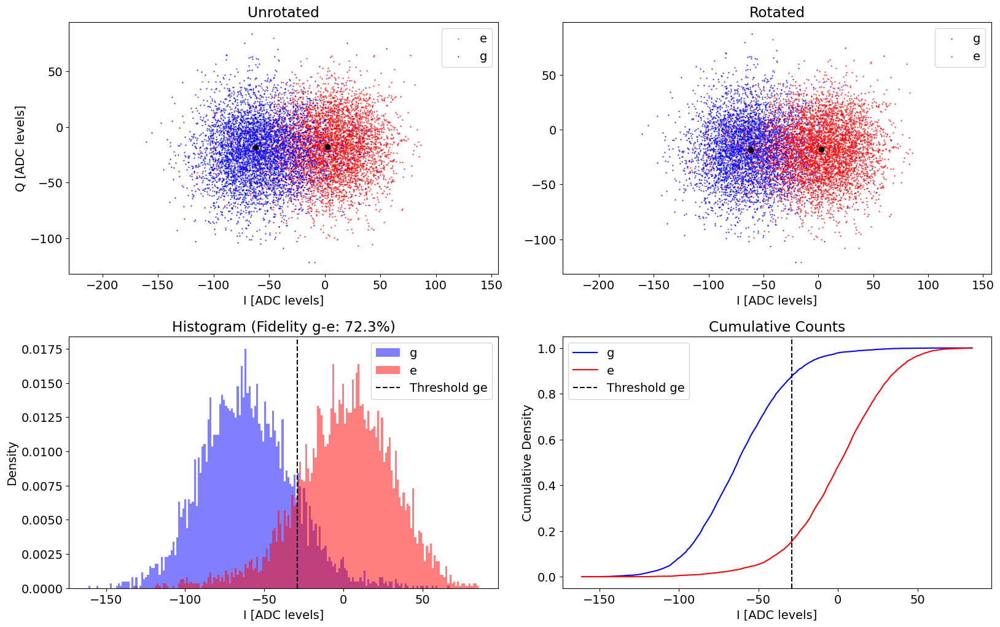

In [34]:
prepulse=False 
if prepulse: 
    postproc = None
else:
    postproc = singleshot_postproc

single_shot_runner = CharacterizationRunner(
    station = station,
    ExptClass = meas.HistogramExperiment,
    default_expt_cfg = singleshot_defaults,
    postprocessor = postproc,
    job_client=client,
    use_queue=USE_QUEUE,
)


single_shot = single_shot_runner.execute(
        go_kwargs=dict(analyze=False, display=False),
        check_f=False,
        active_reset=False, # on recalibration of readout, turn off active reset because it will be wrong for selecting when to apply the qubit pulse
        relax_delay=2000,
        pre_sweep_pulse=prepulse_seq,
        prepulse=prepulse,
        gate_based=False,
        # coupler_current = 0.15e-3
    )

Unrotated:
Ig -70.32162162162163 +/- 30.537508822522263 	 Qg -78.39054054054054 +/- 26.61123373411869 	 Amp g 105.31005324152416
Ie 26.61891891891892 +/- 34.2386057010669 	 Qe -57.37567567567567 +/- 26.800727643165065 	 Amp e 63.249782637194095
Rotated:
Ig -85.55415972391667 +/- 30.884056023065572 	 Qg -62.11432464607565 +/- 26.208248501219387 	 Amp g 105.72465924420625
Ie 14.538946868409624 +/- 34.50109162240406 	 Qe -61.33035875050348 +/- 26.461968925586838 	 Amp e 63.03010297078608


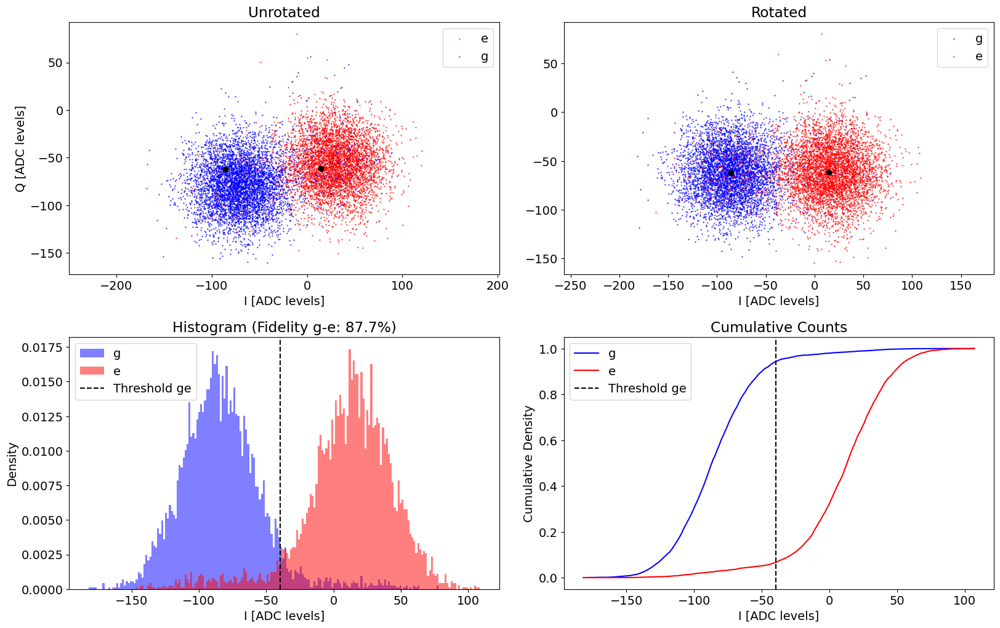

Plot saved to C:\experiments\260526calibration\plots\2026-06-02_10-38-44_histogram.png
Plot reference appended to C:\experiments\260526calibration\logs\2026-06-02.md
ge fidelity (%): 87.73867173434688
rotation angle (deg): -12.231378224529841
threshold ge: -39.50637776729013


In [28]:
single_shot.display(station)

In [25]:
station.snapshot_hardware_config(update_main=False)

[CONFIG] Created new hardware_config version CFG-HW-20260403-00003


'CFG-HW-20260403-00003'

## Photon Number Resolved  Spectroscopy

This is used to check that the fock states are well prepared before we do the tomography

In [7]:
photon_number_spectro_defaults = AttrDict(dict(
    start=3560, 
    step=0.1,
    expts=200,
    reps=2000,
    rounds=1,
    length=1,
    gain=400,
    sigma=0.1,
    qubits=[0],
    qubit=0,
    prepulse=False,
    pre_sweep_pulse=[],
    gate_based=False,
    relax_delay=250,
))

photon_number_spectro_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.single_qubit.pulse_probe_spectroscopy.PulseProbeSpectroscopyExperiment,
    default_expt_cfg=photon_number_spectro_defaults,
    job_client=client,
    use_queue=USE_QUEUE,
    # use_queue=False,
)

In [8]:
pre_sweep_pulse = mm_base_calib.prep_man_photon(man_no=1, photon_no=1)
pre_sweep_pulse = mm_base_calib.get_prepulse_creator(pre_sweep_pulse, station.hardware_cfg).pulse.tolist()
print(f"pre_sweep_pulse: {pre_sweep_pulse}")

pre_sweep_pulse: [[3563.149430155541, 3419.1760186165175, 1994.7225573664728], [9318, 8275, 8000], [0, 0, 0.5593660795923363], [0, 0, 0], [2, 2, 0], ['gauss', 'gauss', 'flat_top'], [0.035, 0.035, 0.005]]


In [9]:
span = 5
expt = 100
step = span / expt
start = station.hardware_cfg.device.qubit.f_ge[0] - span*0.9
length = 15
gain=25

if tomo_expts_to_run['photon_number_spectro']:
    photon_number_spectro = photon_number_spectro_runner.execute(
        go_kwargs=dict(analyze=True, display=True, save=True),
        pre_sweep_pulse=pre_sweep_pulse,
        prepulse=True,
        gate_based=False,
        start=start,
        length=length,
        sigma=1.,
        gain=gain,
        step=step,
        expts=expt,
        relax_delay=500,
    )

NameError: name 'tomo_expts_to_run' is not defined

In [ ]:
if tomo_expts_to_run['photon_number_spectro']:
    if USE_QUEUE:
        photon_number_spectro.display()

## Parity Delay

In [64]:
station.hardware_cfg.hw.soc.dacs.flux_high.ch[0] = 1

In [65]:
parity_delay_defaults = AttrDict(dict(
    start=0.01,
    step=0.05,
    expts=50,
    reps=250,
    rounds=1,
    qubits=[0],
    parity_fast=True,
    normalize=False,
    active_reset=False,
    man_reset=True,
    gate_based=False,
    storage_reset=True,
    man_mode_no=1,
    relax_delay=2500, 
    param_to_calib='length', # length or ac_stark_shift 
    shift_sign=1, # 1 or -1 for ac stark shift direction
    ))


def parity_delay_preproc(station, default_expt_cfg, **kwargs):
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)
    if 'param_to_calib' in expt_cfg and expt_cfg.param_to_calib =='ac_stark_shift':
        expt_cfg.prepulse = False
        expt_cfg.pre_sweep_pulse = []
    elif 'param_to_calib' in expt_cfg and expt_cfg.param_to_calib =='length':
        expt_cfg.prepulse = True
        pre_sweep_pulse = mm_base_calib.prep_man_photon(man_no=expt_cfg.man_mode_no, photon_no=1)
        pre_sweep_pulse = mm_base_calib.get_prepulse_creator(pre_sweep_pulse, station.hardware_cfg).pulse.tolist()
        expt_cfg.pre_sweep_pulse = pre_sweep_pulse
    return expt_cfg

def parity_delay_postproc(station, expt):
    from fitting.fit_display_classes import LengthRabiFitting
    # Analyze the data
    length_rabi_analysis = LengthRabiFitting(expt.data, config = expt.cfg)
    length_rabi_analysis.analyze(fitparams = [100, 1, 0, None, None, None])
    length_rabi_analysis.display(title_str='Length Rabi General F0g1')
    expt_cfg = expt.cfg.expt
    man_mode_no = expt_cfg.man_mode_no
    shift_sign = expt_cfg.shift_sign


    if expt_cfg.param_to_calib == 'length':
        delay = length_rabi_analysis.results['pi_length']
        print(f'Fitted revival time: {delay} us')
        old_delay = station.hardware_cfg.device.manipulate.revival_time[man_mode_no - 1]
        station.hardware_cfg.device.manipulate.revival_time[man_mode_no - 1] = delay
        print(f'Updated revival time for mode {man_mode_no}: {old_delay} -> {station.hardware_cfg.device.manipulate.revival_time[man_mode_no - 1]}')

    elif expt_cfg.param_to_calib == 'ac_stark_shift': 
        freq = length_rabi_analysis.data['fit_avgi'][1]
        print(f'Fitted ac Stark shift: {freq} MHz')
        old_freq = station.hardware_cfg.device.manipulate.revival_stark_shift[man_mode_no - 1]
        station.hardware_cfg.device.manipulate.revival_stark_shift[man_mode_no - 1] += shift_sign * freq
        print(f'Updated ac Stark shift for mode {man_mode_no}: {old_freq} -> {station.hardware_cfg.device.manipulate.revival_stark_shift[man_mode_no - 1]}')

    


### Calibrate first the AC stark shift

Manipulate in 0, qubit should not rotate

Job submitted: JOB-20260413-00215 (queue position: 1)

[0.2s] Job JOB-20260413-00215: pending



[2.2s] Job JOB-20260413-00215: running
[WORKER] Loading ParityDelayExperiment from experiments.single_qubit.parity_delay
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260413-00215_ParityDelayExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.3mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
100%|████████████████████████████████████████| 100/100 [00:59<00:00,  1.67it/s]
Saving D:\experiments\260403_kerr_excusion_redone\data\JOB-20260413-00215_ParityDelayExperiment.h5
[WORKER] Saving expt object to: D:\experiments\260403_kerr_excusion_redone\expt_objs\JOB-20260413-00215_expt.pkl

[68.6s] Job JOB-20260413-00215: completed

Job completed! Data: D:\experiments\260403_kerr_excusion_redone\data\JOB-20260413-00215_ParityDelayExperiment.h5
Attempted to init fitparam 0 to 100, which is out of bounds 0 to 23.308358108108102. Instead init to 11.654179054054051
Attempted to init fitparam 4 to 8.139732732732732, whic

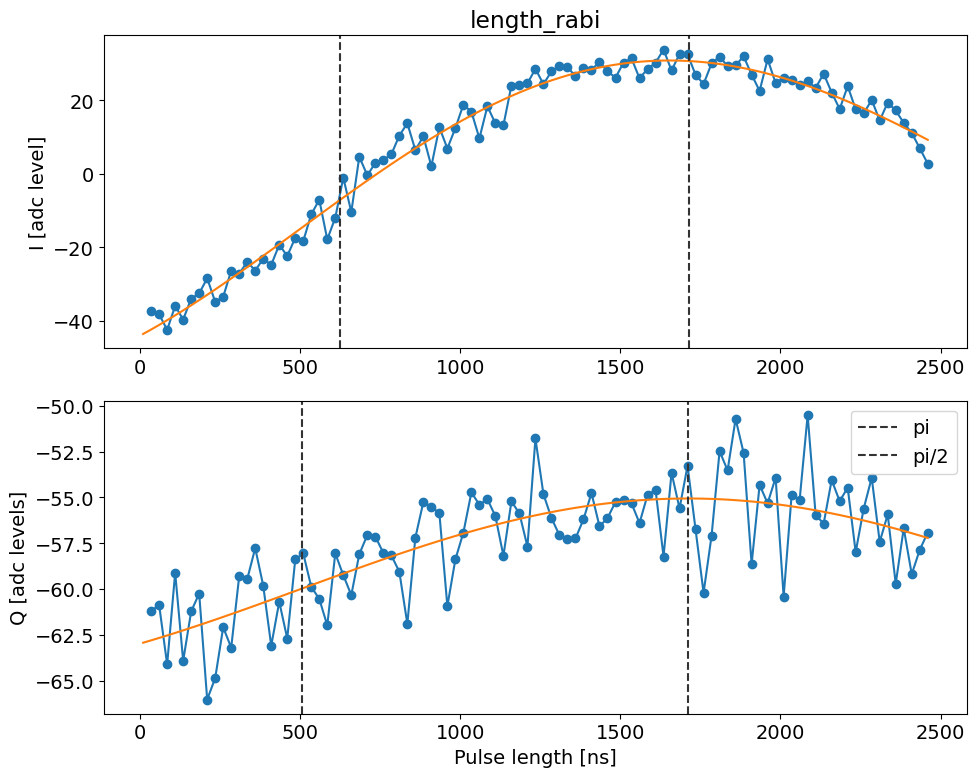

Fitted ac Stark shift: 0.22922581352162344 MHz
Updated ac Stark shift for mode 1: 1.2136740204080252 -> 1.4428998339296486


In [66]:
parity_delay_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.ParityDelayExperiment,
    default_expt_cfg=parity_delay_defaults,
    postprocessor=parity_delay_postproc,
    preprocessor=parity_delay_preproc,
    job_client=client,
    use_queue=USE_QUEUE,
)

parity_delay_ac_stark = parity_delay_runner.execute(
    param_to_calib='ac_stark_shift', 
    go_kwargs=dict(analyze=False, display=False),
    step=0.025,
    expts=100,
    reps=200,
    shift_sign=1,
)

Confirming the correction is in the right direction

In [67]:
parity_delay_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.ParityDelayExperiment,
    default_expt_cfg=parity_delay_defaults,
    preprocessor=parity_delay_preproc,
    job_client=client,
    use_queue=USE_QUEUE,
)

parity_delay_ac_stark = parity_delay_runner.execute(
    param_to_calib='ac_stark_shift', 
    go_kwargs=dict(analyze=False, display=False),
    step=0.025,
    expts=200,
    reps=100,
    shift_sign=1,
)

Job submitted: JOB-20260413-00216 (queue position: 1)

[0.1s] Job JOB-20260413-00216: pending

[2.1s] Job JOB-20260413-00216: running
[WORKER] Loading ParityDelayExperiment from experiments.single_qubit.parity_delay
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260413-00216_ParityDelayExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.3mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 98%|███████████████████████████████████████ | 195/200 [01:07<00:01,  2.84it/s]theta_2: 197.4836479486803

[76.6s] Job JOB-20260413-00216: completed
100%|████████████████████████████████████████| 200/200 [01:09<00:00,  2.87it/s]
Saving D:\experiments\260403_kerr_excusion_redone\data\JOB-20260413-00216_ParityDelayExperiment.h5
[WORKER] Saving expt object to: D:\experiments\260403_kerr_excusion_redone\expt_objs\JOB-20260413-00216_expt.pkl

Job completed! Data: D:\experiments\260403_kerr_excusion_redone\data\JOB-20260413-00216_

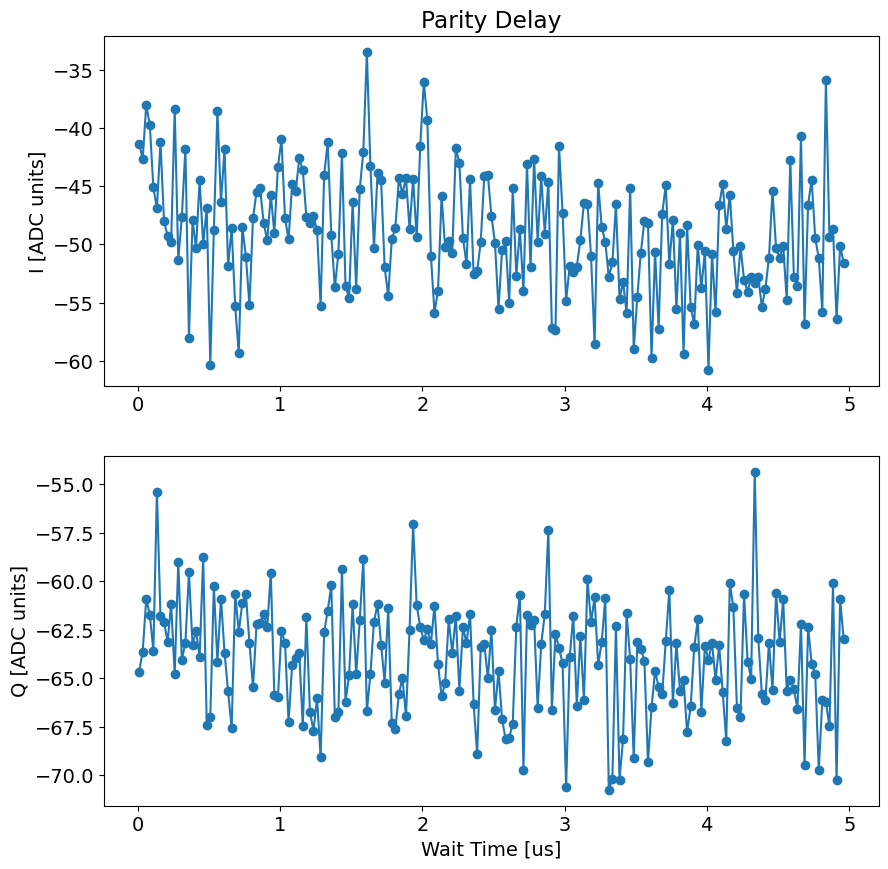

In [68]:
parity_delay_ac_stark.display(fit=False)

### Now parity length after the AC stark shift is calibrated

Job submitted: JOB-20260414-00034 (queue position: 1)

[0.1s] Job JOB-20260414-00034: pending

[2.2s] Job JOB-20260414-00034: running
[WORKER] Loading ParityDelayExperiment from experiments.single_qubit.parity_delay
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260414-00034_ParityDelayExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.3mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 96%|███████████████████████████████████████▎ | 96/100 [00:58<00:02,  1.64it/s]theta_2: 69.22362085695158

[68.5s] Job JOB-20260414-00034: completed
100%|████████████████████████████████████████| 100/100 [01:01<00:00,  1.64it/s]
Saving D:\experiments\260403_kerr_excusion_redone\data\JOB-20260414-00034_ParityDelayExperiment.h5
[WORKER] Saving expt object to: D:\experiments\260403_kerr_excusion_redone\expt_objs\JOB-20260414-00034_expt.pkl

Job completed! Data: D:\experiments\260403_kerr_excusion_redone\data\JOB-20260414-00034_

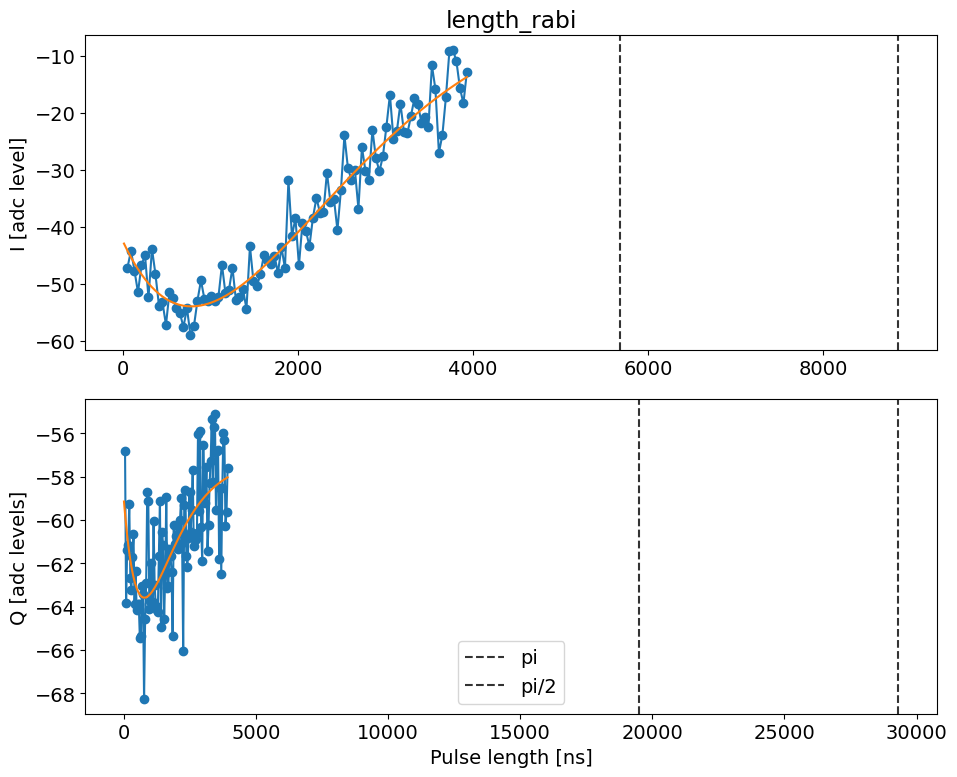

Fitted revival time: 8.85911133622357 us
Updated revival time for mode 1: 1.5017223301599547 -> 8.85911133622357


In [78]:
parity_delay_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.ParityDelayExperiment,
    default_expt_cfg=parity_delay_defaults,
    postprocessor=parity_delay_postproc,
    preprocessor=parity_delay_preproc,
    job_client=client,
    use_queue=USE_QUEUE,
)

parity_delay_ac_stark = parity_delay_runner.execute(
    param_to_calib='length', 
    go_kwargs=dict(analyze=False, display=False),
    step=0.04,
    expts=100,
    reps=200,
)

In [72]:
station.hardware_cfg.hw.soc.dacs.flux_low.ch

[1]

In [35]:
station.hardware_cfg.device.multiphoton.pi['fn-gn+1']

{'frequency': [1996.7668073887737,
  2001.8568875837166,
  2010.595323987349,
  2010.07793195468],
 'gain': [8000, 8000, 8000, 8000],
 'length': [0.5755441982476883,
  0.04687196418554968,
  0.31584821479967073,
  0.26838059127779085],
 'sigma': [0.005, 0.005, 0.005, 0.005],
 'type': ['flat_top', 'flat_top', 'flat_top', 'flat_top']}

## Manipulate Parity Spectroscopy

In [59]:
parity_freq_defaults = AttrDict(dict(
    start=4960,
    stop=5020,
    step=0.60,
    reps=500,
    rounds=1,
    qubits=[0],
    normalize=False,
    single_shot=False,
    singleshot_reps=1000,
    span=20,
    man_mode_no=1,
    displace=(True, 0.1, 1000),
    const_pulse=(False, 1),
    f0g1_cavity=0,
    prepulse=False,
    pre_sweep_pulse=None,
    relax_delay=2500,
))

def parity_freq_postproc(station, expt):
    from fitting.fit_display_classes import Spectroscopy
    spec = Spectroscopy(expt.data, config=expt.cfg)
    spec.analyze()
    spec.display(title='Parity Frequency Experiment')

    expt_cfg = expt.cfg.expt
    man_mode_no = expt_cfg.man_mode_no
    fitted_freq = spec.data['fit_avgi'][2]
    old_freq = station.hardware_cfg.device.manipulate.f_ge[man_mode_no - 1]
    station.hardware_cfg.device.manipulate.f_ge[man_mode_no - 1] = fitted_freq
    print(f'Updated manipulate f_ge for mode {man_mode_no} from {old_freq} to {fitted_freq}')


parity_freq_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.ParityFreqExperiment,
    default_expt_cfg=parity_freq_defaults,
    postprocessor=parity_freq_postproc,
    job_client=client,
    use_queue=USE_QUEUE,
)


Job submitted: JOB-20260817-00184 (queue position: 1)

[0.0s] Job JOB-20260817-00184: pending

[2.8s] Job JOB-20260817-00184: running
[WORKER] Loading ParityFreqExperiment from experiments.single_qubit.parity_freq
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260817-00184_ParityFreqExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 97%|███████████████████████████████████████▊ | 97/100 [02:13<00:04,  1.37s/it]
[139.3s] Job JOB-20260817-00184: completed
100%|████████████████████████████████████████| 100/100 [02:18<00:00,  1.38s/it]
C:\python\multimode_expts\fitting\fitting.py:56: RuntimeWarning: overflow encountered in exp
  return y0 + yscale*np.exp(-(x-x0)/decay)
Saving C:\experiments\260625DarkModeErrBudgetting\data\JOB-20260817-00184_ParityFreqExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260625DarkModeErrBudgetting\expt_

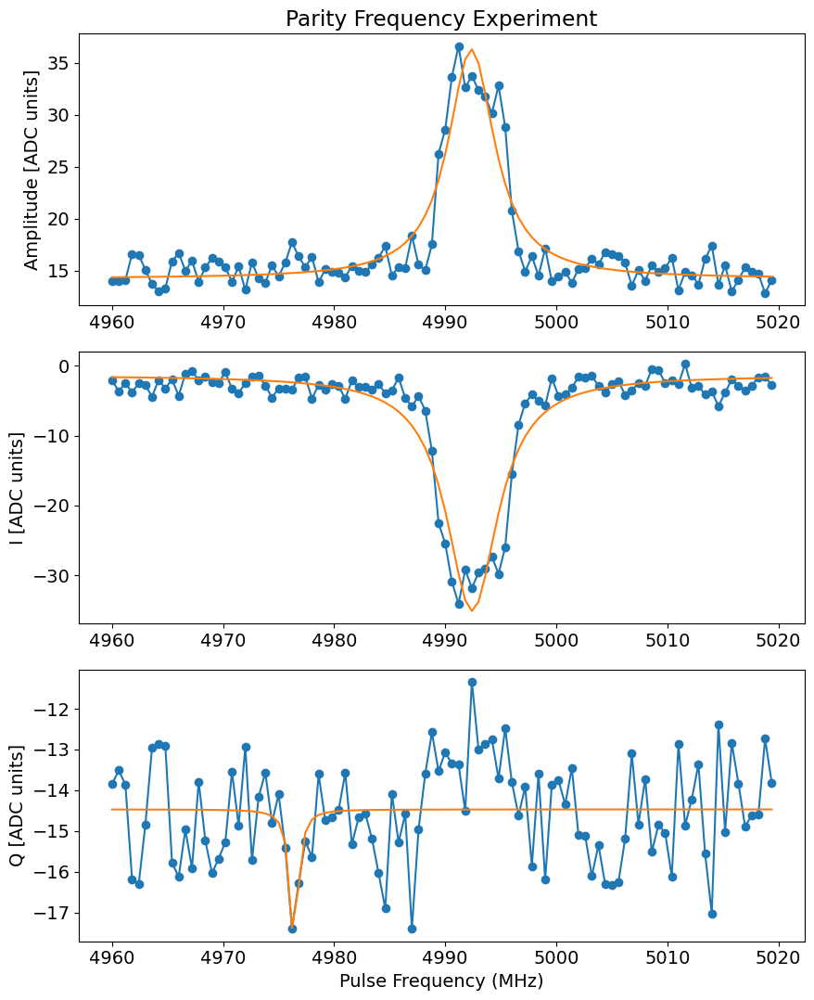

Updated manipulate f_ge for mode 1 from 4983.7967133968195 to 4992.423952841425
Fit T1 avgi [us]: 2.822873585473318
Fit T1 avgq [us]: -0.4458595035658959


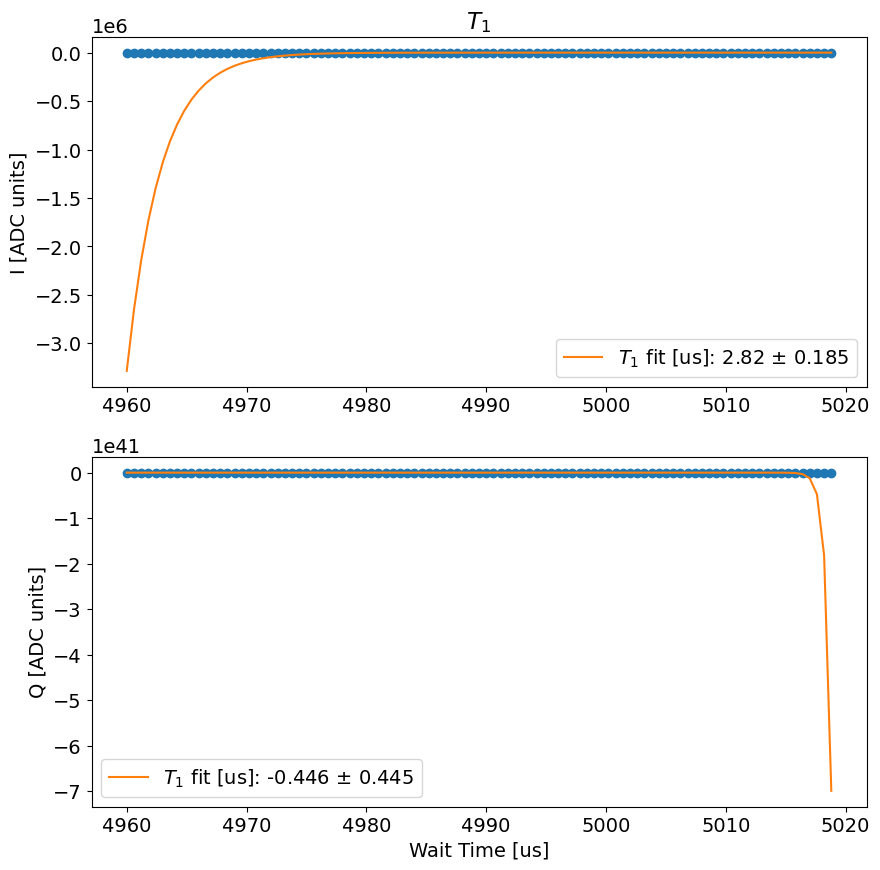

In [60]:
parity_freq = parity_freq_runner.execute(
    go_kwargs=dict(analyze=False, display=False),
    # coupler_current = 0.1e-3
)

## Manipulate Ramsey (to finetune frequency)
- This will use displace pulse instead do qubit pi/2 to calibrate; we want fine calibration of manipulate frequency not some fast way of extracting T2 time or finding stark shift on f0g1 transition
- Make sure displacements are small $(\alpha \approx 0.2)$
- Somehow i don't get full contrast, like the lowst i,q value dont correspond to g 




In [61]:
cavity_ramsey_defaults = AttrDict(dict(
    start=0.01,           # start delay
    step=0.05,            # step size
    expts=200,            # number of experiments
    ramsey_freq=3.7,      # Ramsey frequency
    reps=100,              # repetitions
    rounds=1,             # rounds
    qubits=[0],           # qubits
    checkEF=False,        # check EF
    f0g1_cavity=0,        # f0g1 cavity
    init_gf=False,        # initialize gf
    active_reset=False,   # active reset
    man_reset=True,       # manipulate reset
    storage_reset=True,   # storage reset
    user_defined_pulse=None, # [on/off, freq, gain, sigma (mus), 0, 4] # if off, use config freq
    parity_meas=True,     # parity measurement
    man_mode_no=1,
    storage_ramsey=[False, 1, True], # storage Ramsey
    man_ramsey=None,      # manipulate Ramsey
    coupler_ramsey=False, # coupler Ramsey
    custom_coupler_pulse=None, # custom coupler pulse
    echoes=[False, 0],    # echoes
    prepulse=False,       # prepulse
    postpulse=False,      # postpulse
    gate_based=False,     # gate based
    pre_sweep_pulse=None, # pre sweep pulse
    post_sweep_pulse=None,# post sweep pulse
    prep_e_first = True,
    relax_delay=2500      # relax delay
))

def cavity_ramsey_preproc(station, default_expt_cfg, **kwargs):
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)

    expt_cfg.man_idx = expt_cfg.man_mode_no - 1

    if expt_cfg.user_defined_pulse is None:
        expt_cfg.user_defined_pulse = [True, station.hardware_cfg.device.manipulate.f_ge[expt_cfg.man_mode_no-1], 10, station.hardware_cfg.device.manipulate.displace_sigma[expt_cfg.man_mode_no-1], 0, 4]

    if expt_cfg.man_ramsey is None:
        expt_cfg.man_ramsey = [False, expt_cfg.man_mode_no -1]
    if expt_cfg.custom_coupler_pulse is None:
        expt_cfg.custom_coupler_pulse = [[944.25], [1000], [0.316677658], [0], [1], ['flat_top'], [0.005]]
    if expt_cfg.pre_sweep_pulse is None:
        expt_cfg.pre_sweep_pulse = []
    if expt_cfg.post_sweep_pulse is None:
        expt_cfg.post_sweep_pulse = []
    # do we need to set the relax delay here?
    return expt_cfg

def cavity_ramsey_postproc(station, expt):

    from fitting.fit_display_classes import RamseyFitting
    ramsey_analysis = RamseyFitting(expt.data, config=expt.cfg)
    delta_f = min(ramsey_analysis.data['f_adjust_ramsey_avgi'])

    expt_cfg = expt.cfg.expt
    man_mode_no = expt_cfg.man_mode_no
    old_freq = station.hardware_cfg.device.manipulate.f_ge[man_mode_no - 1]
    station.hardware_cfg.device.manipulate.f_ge[man_mode_no - 1] = old_freq + delta_f
    print(f'Updated manipulate f_ge for mode {man_mode_no} from {old_freq} to {station.hardware_cfg.device.manipulate.f_ge[man_mode_no - 1]}')

cavity_ramsey_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.single_qubit.t2_cavity.CavityRamseyExperiment,
    default_expt_cfg=cavity_ramsey_defaults,
    preprocessor=cavity_ramsey_preproc,
    postprocessor=cavity_ramsey_postproc,
    job_client=client,
    # user=user,    
    use_queue=USE_QUEUE,
)


### Actual Running

Job submitted: JOB-20260817-00185 (queue position: 1)

[0.0s] Job JOB-20260817-00185: pending

[2.5s] Job JOB-20260817-00185: running
[WORKER] Loading CavityRamseyExperiment from experiments.single_qubit.t2_cavity
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260817-00185_CavityRamseyExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
100
 82%|█████████████████████████████▍      | 8190/10000 [00:20<00:04, 397.97it/s]
[27.2s] Job JOB-20260817-00185: completed
100%|███████████████████████████████████| 10000/10000 [00:25<00:00, 398.17it/s]
No echoes in the data
Saving C:\experiments\260625DarkModeErrBudgetting\data\JOB-20260817-00185_CavityRamseyExperiment.h5
[h5_safe_data] dropped non-numeric keys: ['fit_envelope_avgi', 'fit_envelope_avgq', 'fit_envelope']
[WORKER] Saving expt object to: C:\experiments\260625DarkModeErrBudgetting\expt_objs\JO

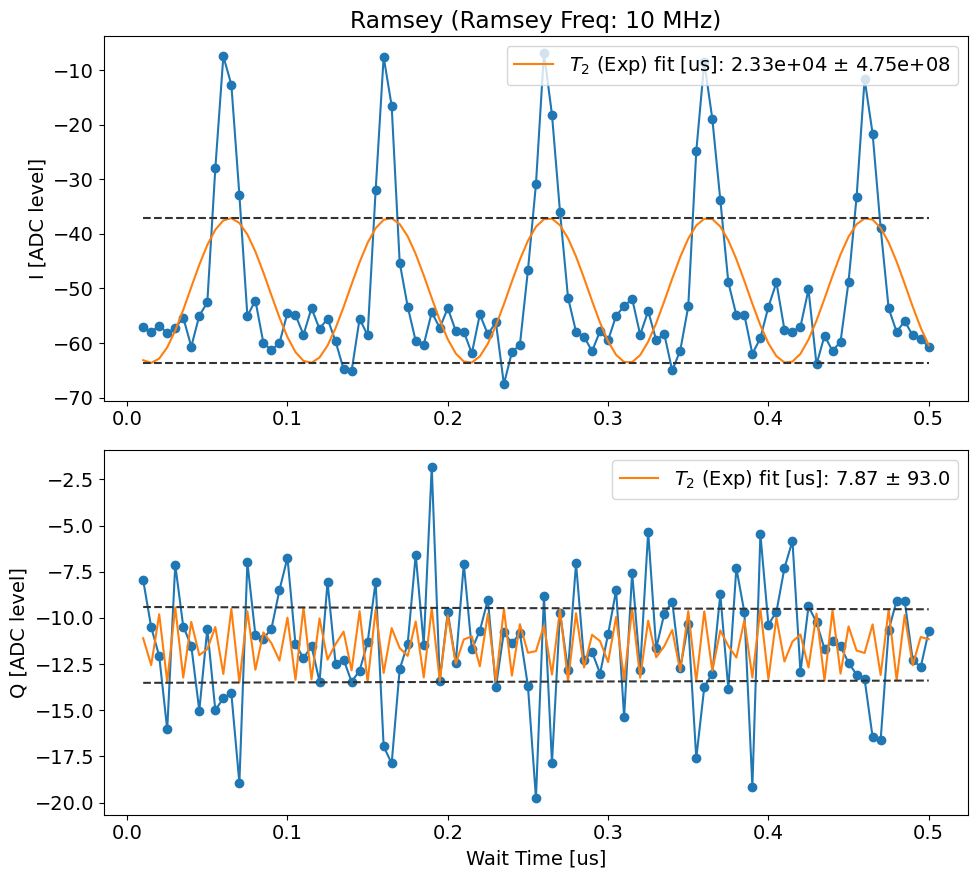

In [62]:
# station.hardware_cfg.device.manipulate.f_ge[0]=4997.563715744588
# station.hardware_cfg.device.qubit.pulses.slow_pi_ge.length[0]=5

cavity_ramsey = cavity_ramsey_runner.execute(
    # ramsey_freq=0.5,
    # step = 0.1,
    ramsey_freq=10,
    step = 0.005,
    expts = 100,
    reps = 100,
    prep_e_first = False,
    user_defined_pulse=[True, station.hardware_cfg.device.manipulate.f_ge[0], 2000, 
                                station.hardware_cfg.device.manipulate.displace_sigma[0],
                                  0, 4],
    storage_ramsey=[False, 1, True], # storage Ramsey
    # coupler_current = 0.15e-3
)

Using user defined frequency: 4987.986476445239 MHz
Current pi pulse frequency: 4987.986476445239
Envelope chosen (I): exp  (SSR exp=1.487e+04, gauss=1.487e+04)
Fit frequency from I [MHz]: 10.049251317168773 +/- 0.13150981551993718
Suggested new pi pulse frequency from fit I [MHz]:
 	4987.93722512807
 	5008.035727762407
T2 Ramsey from fit I [us]: 186618.25454558642  (envelope=exp)
Envelope chosen (Q): exp  (SSR exp=805.4, gauss=805.4)
Fit frequency from Q [MHz]: 41.37808614972299 +/- 0.36164293762826577
Suggested new pi pulse frequency from fit Q [MHz]:
 	4956.608390295516
 	5039.364562594961
T2 Ramsey from fit Q [us]: 88507.96399531611  (envelope=exp)


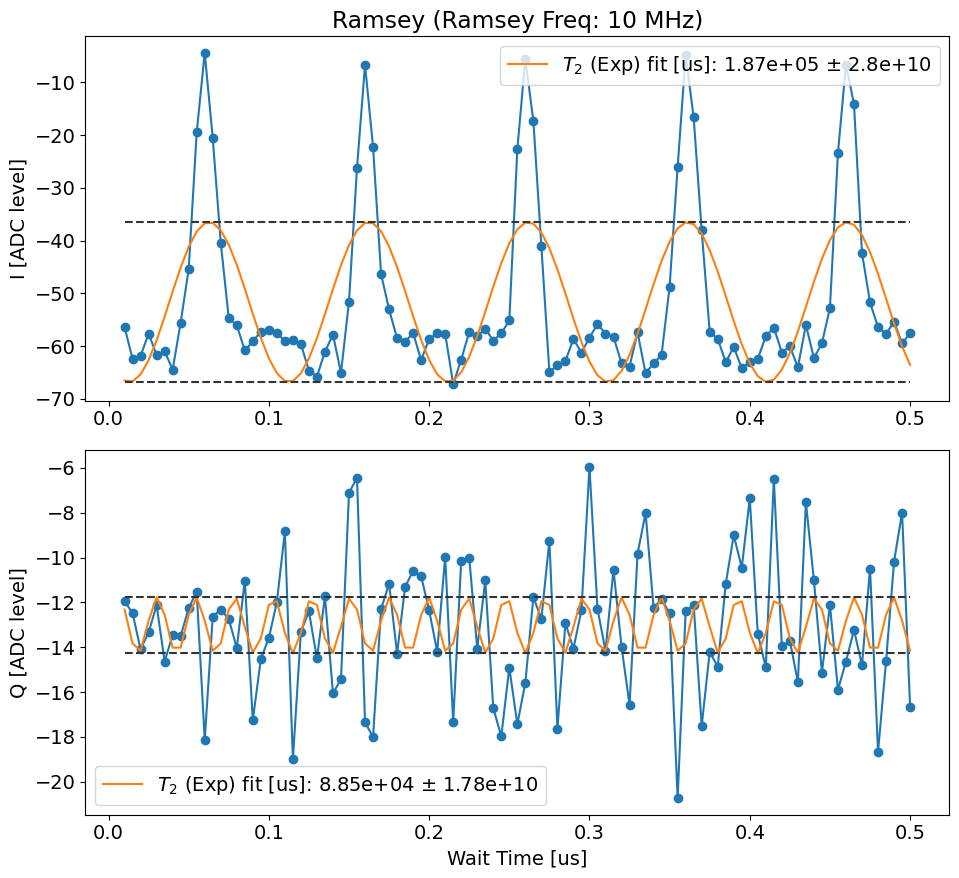

In [30]:
if USE_QUEUE:
    cavity_ramsey.display()

## Gain to alpha calibration

will do tomography on the vacuum state

$$
W_\alpha(\ket{0} \bra{0}) = \frac 2\pi e^{-2|\alpha|^2}
$$

In [63]:
do_parity_gain_defaults = AttrDict(dict(
    start=0,
    step=100,
    expts=40,
    reps=250,
    rounds=1,
    qubit=0,
    qubits=[0],
    normalize=False,
    single_shot=False,
    singleshot_reps=1000,
    singleshot_active_reset=False,
    singleshot_man_reset=True,
    singleshot_storage_reset=True,
    active_reset=False,
    man_reset=True,
    storage_reset=True,
    span=1000,
    prep_e=False,
    manipulate=1,
    displace=(True, 0.05), # [enable, sigma] (gaussian length is 4sigma)
    const_pulse=(False, 1), # [enable, length]
    f0g1_cavity=0,
    prepulse=False,
    pre_sweep_pulse=None,
    relax_delay=2500, 
    pulse_correction=False,
    parity_fast=True,
    scaling_amplitude=True,
    plot_IQ=True,
    man_mode_no=1,
))


def parity_gain_postproc(station, expt):
    expt_cfg = expt.cfg.expt
    scaling_amplitude = expt_cfg.scaling_amplitude
    man_mode_no = expt_cfg.man_mode_no
    expt.analyze(scale=scaling_amplitude, plot=False) # need to fix this (opens a plot that need to be closed on the server side also the scaling is no longer passed correctly for some reason)
    if expt_cfg.plot_IQ:
        i_data = expt.data['idata']
        q_data = expt.data['qdata']
        fig, ax = plt.subplots(1,1, figsize=(6,6))
        ax.scatter(i_data, q_data, s=1, alpha=0.5)
        ax.set_xlabel('I')
        ax.set_ylabel('Q')
        ax.set_title('IQ Scatter Plot')
        plt.show()
    gain_to_alpha = expt.data['gain_to_alpha']
    old_gain_to_alpha = station.hardware_cfg.device.manipulate.gain_to_alpha[expt_cfg.man_mode_no - 1]
    print(f'Gain to alpha for mode {expt_cfg.man_mode_no} : {old_gain_to_alpha} -> {gain_to_alpha}')
    station.hardware_cfg.device.manipulate.gain_to_alpha[man_mode_no - 1] = gain_to_alpha
    if scaling_amplitude:
        scale = expt.data['scale']
        old_scale = station.hardware_cfg.device.manipulate.alpha_scale[man_mode_no - 1]
        station.hardware_cfg.device.manipulate.alpha_scale[man_mode_no - 1] = scale
        print(f'Scaling amplitude for mode {man_mode_no} : {old_scale} -> {scale}')




Job submitted: JOB-20260817-00186 (queue position: 1)

[0.0s] Job JOB-20260817-00186: pending

[2.4s] Job JOB-20260817-00186: running
[WORKER] Loading ParityGainExperiment from experiments.single_qubit.parity_gain
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260817-00186_ParityGainExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
4992.36123147822
Updating gain register 100
100%|███████████████████████████████████| 10000/10000 [00:25<00:00, 399.38it/s]
4992.36123147822
Updating gain register 100
 82%|█████████████████████████████▍      | 8190/10000 [00:20<00:04, 399.40it/s]
[51.9s] Job JOB-20260817-00186: completed
100%|███████████████████████████████████| 10000/10000 [00:25<00:00, 399.20it/s]
plot: False
Gain to Alpha Conversion Factor: 0.0009942543324729036
alpha = 1 requires gain of : 1005.77887100
Saving C:\experiments\260625DarkModeE

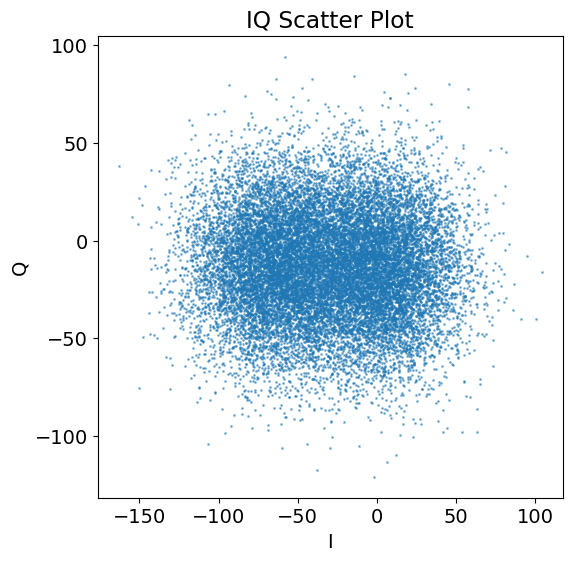

Gain to alpha for mode 1 : 0.0008864669925664553 -> 0.0009942543324729036
Scaling amplitude for mode 1 : 0.889775662668059 -> 0.9252937027825694
[runner] experiment.display() failed: 'fit_avgi'


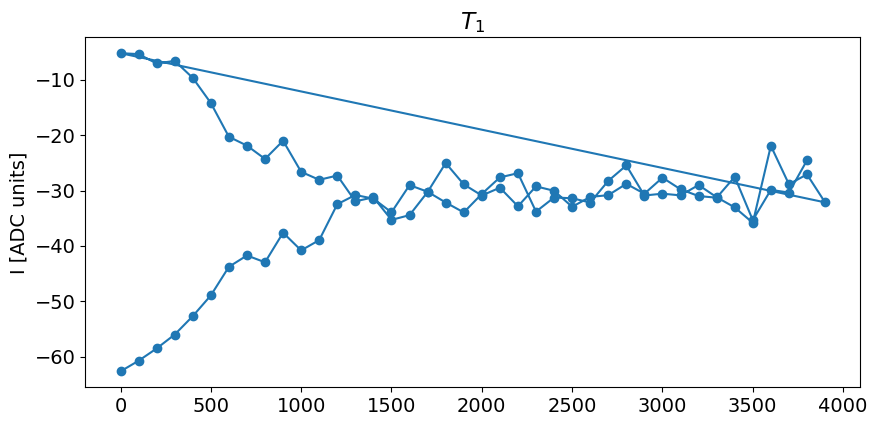

In [64]:
parity_gain_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.single_qubit.parity_gain.ParityGainExperiment,
    default_expt_cfg=do_parity_gain_defaults,
    postprocessor=parity_gain_postproc,
    job_client=client,
    use_queue=USE_QUEUE,
)

parity_gain_expt = parity_gain_runner.execute(
    pulse_correction=True,
    reps=250,
    step=100,
    go_kwargs=dict(analyze=False, display=False),
    parity_fast=False,
    )


plot: True
Gain to Alpha Conversion Factor: 0.0009942543324729036


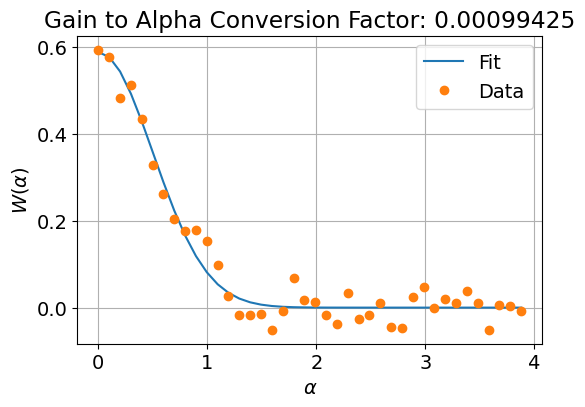

alpha = 1 requires gain of : 1005.77887100


In [65]:
if USE_QUEUE: 
    parity_gain_expt.analyze(scale=True, plot=True)

plot: True
Gain to Alpha Conversion Factor: 0.00089151410409844


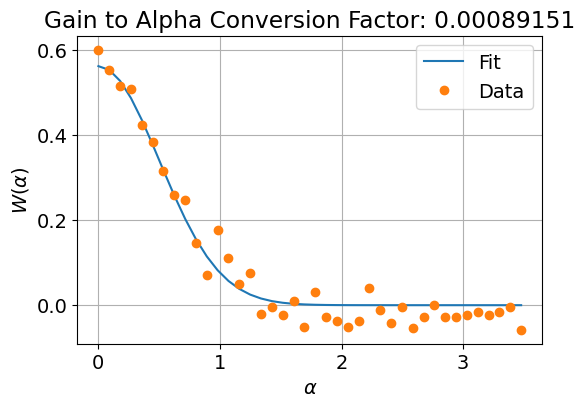

alpha = 1 requires gain of : 1121.68724578


In [14]:
if USE_QUEUE: 
    parity_gain_expt.analyze(scale=True, plot=True)

In [21]:
station.update_all_station_snapshots(update_main=False)

[CONFIG] Created new hardware_config version CFG-HW-20260529-00026
[CONFIG] Reusing existing multiphoton_config version CFG-MP-20260121-00001
[CONFIG] Reusing existing man1_storage_swap version CFG-M1-20260529-00023
[CONFIG] Reusing existing floquet_storage_swap version CFG-FL-20260529-00045
Config snapshots for current station:
  hardware_config: CFG-HW-20260529-00026
  multiphoton_config: CFG-MP-20260121-00001
  man1_storage_swap: CFG-M1-20260529-00023
  floquet_storage_swap: CFG-FL-20260529-00045


{'hardware_config': 'CFG-HW-20260529-00026',
 'multiphoton_config': 'CFG-MP-20260121-00001',
 'man1_storage_swap': 'CFG-M1-20260529-00023',
 'floquet_storage_swap': 'CFG-FL-20260529-00045'}

In [11]:
parity_gain_expt.data.keys()

dict_keys(['idata', 'qdata', 'xpts', 'avgi', 'avgq', 'amps', 'phases', 'gain_to_alpha', 'parity', 'scale'])

In [49]:
station.hardware_cfg.device.manipulate.gain_to_alpha[0] = parity_gain_expt.data['gain_to_alpha']
station.hardware_cfg.device.manipulate.alpha_scale[0] = parity_gain_expt.data['scale']

In [ ]:
station.snapshot_hardware_config(update_main=True)

## Cavity Ramsey versus gain 

This this to find out $\chi$, $\chi'$, $\Delta$ and $K_c$

In [66]:
cavity_ramsey_sweep_defaults = AttrDict(dict(
    start=0.01,           # start delay
    step=0.05,            # step size
    expts=200,            # number of experiments
    ramsey_freq=3.7,      # Ramsey frequency
    gain_start = 1000,  # start gain
    gain_step = 1000,      # step size for gain
    gain_expts = 5,        # number of experiments for gain
    reps=100,              # repetitions
    rounds=1,             # rounds
    qubits=[0],           # qubits
    checkEF=False,        # check EF
    f0g1_cavity=0,        # f0g1 cavity
    init_gf=False,        # initialize gf
    active_reset=False,   # active reset
    man_reset=True,       # manipulate reset
    storage_reset=True,   # storage reset
    user_defined_pulse=None, # [on/off, freq, gain, sigma (mus), 0, 4] # if off, use config freq
    parity_meas=True,     # parity measurement
    man_mode_no=1,            
    storage_ramsey=[False, 2, True], # storage Ramsey
    man_ramsey=None,      # manipulate Ramsey
    coupler_ramsey=False, # coupler Ramsey
    custom_coupler_pulse=None, # custom coupler pulse
    echoes=[False, 0],    # echoes
    prepulse=False,       # prepulse
    postpulse=False,      # postpulse
    gate_based=False,     # gate based
    pre_sweep_pulse=None, # pre sweep pulse
    post_sweep_pulse=None,# post sweep pulse
    relax_delay=2500,      # relax delay
    do_g_and_e=False, # do e-f first
))

def cavity_ramsey_sweep_preproc(station, default_expt_cfg, **kwargs):
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)
    man_mode_no = expt_cfg.man_mode_no

    if expt_cfg.user_defined_pulse is None:
        expt_cfg.user_defined_pulse = [True, station.hardware_cfg.device.manipulate.f_ge[man_mode_no-1], 1000, station.hardware_cfg.device.manipulate.displace_sigma[man_mode_no-1], 0, 4]

    if expt_cfg.man_ramsey is None:
        expt_cfg.man_ramsey = [False, man_mode_no -1]
    if expt_cfg.custom_coupler_pulse is None:
        expt_cfg.custom_coupler_pulse = [[944.25], [1000], [0.316677658], [0], [1], ['flat_top'], [0.005]]
    if expt_cfg.pre_sweep_pulse is None:
        expt_cfg.pre_sweep_pulse = []
    if expt_cfg.post_sweep_pulse is None:
        expt_cfg.post_sweep_pulse = []

    return expt_cfg

cavity_ramsey_sweep_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.single_qubit.t2_cavity.CavityRamseyGainSweepExperiment,
    default_expt_cfg=cavity_ramsey_sweep_defaults,
    preprocessor=cavity_ramsey_sweep_preproc,
    job_client=client,
    use_queue=USE_QUEUE,
)


In [67]:

gain_start = 3000//2
gain_stop = 6000//2
gain_step = 1000//2


gain_expts = int((gain_stop - gain_start) / gain_step) + 1
print(f'Gain start: {gain_start}, Gain stop: {gain_stop}, Gain step: {gain_step}, Gain expts: {gain_expts}')

Gain start: 1500, Gain stop: 3000, Gain step: 500, Gain expts: 4


In [45]:
station.hardware_cfg.device.qubit.pulses.slow_pi_ge

{'gain': [15], 'sigma': [0.1], 'length': [5], 'type': ['flat_top']}

In [ ]:
cavity_ramsey_sweep = cavity_ramsey_sweep_runner.execute(
    ramsey_freq=2,
    step = 0.02,
    expts = 150,
    # ramsey_freq=0.5,
    # step = 0.05,
    # expts = 150,
    gain_start=gain_start,  # start gain
    gain_step=gain_step,      # step size for gain
    gain_expts=gain_expts,        # number of experiments for gain
    reps = 150,
    do_g_and_e=False,
    go_kwargs=dict(analyze=False, display=False), 
    storage_ramsey=[False, 1, True], # storage Ramsey
    active_reset= True,
    man_reset = True,
    man_reset_print = False,
    storage_reset = False,
    relax_delay = 200,
    reset_dump_mode=2,
)


Job submitted: JOB-20260817-00188 (queue position: 1)

[0.0s] Job JOB-20260817-00188: pending


gain_to_alpha 0.0009942543324729036
kwargs {'track_peaks': True, 'debug': False}
Kerr : 8.286 +/- 0.626 kHz
detuning Ground State: -57.834 +/- 3.677 kHz


C:\python\multimode_expts\fitting\fit_display_classes.py:757: RuntimeWarning: invalid value encountered in divide
  _pop_norm = (_pop - np.max(_pop)) / (np.min(_pop) - np.max(_pop))


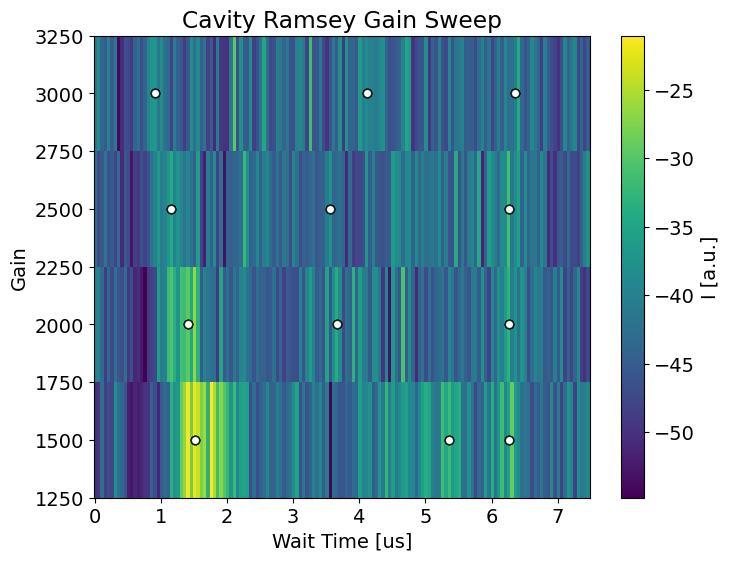

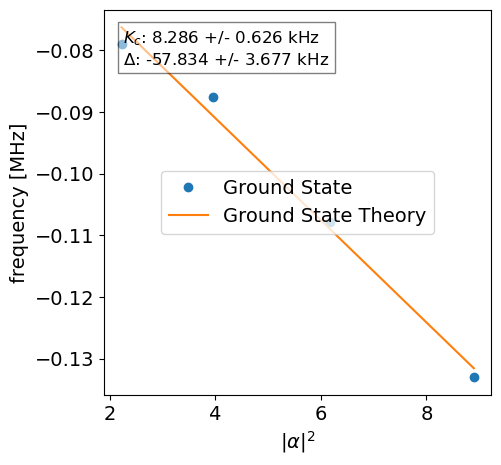

In [69]:
# cavity_ramsey_sweep.analyze(debug=False)
cavity_ramsey_sweep.analyze(track_peaks=True, 
                            # fit_indices_g=[0,1,2,3,4,5,6],
                            # fit_indices_e=[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14],
                             debug=False)
cavity_ramsey_sweep.display(save_fig=False)

In [47]:
delta_g = cavity_ramsey_sweep.data['detuning_g']
print(f"Fitted delta_g: {delta_g} MHz")
old_f_ge = station.hardware_cfg.device.manipulate.f_ge[0]
print(f"Old f_ge frequency: {old_f_ge} MHz")
station.hardware_cfg.device.manipulate.f_ge[0] -= delta_g
print(f"Updated f_ge frequency: {station.hardware_cfg.device.manipulate.f_ge[0]} MHz")

# expts_base_inst.hardware_cfg.device.manipulate.f_ge[0] -= delta_g
# print(f"Updated f_ge frequency: {expts_base_inst.hardware_cfg.device.manipulate.f_ge[0]} MHz")

Fitted delta_g: -0.1139755839432731 MHz
Old f_ge frequency: 4983.682737812876 MHz
Updated f_ge frequency: 4983.7967133968195 MHz


In [41]:
station.hardware_cfg.device.manipulate.kerr[0] 

-0.0227

In [42]:
station.update_all_station_snapshots()

[CONFIG] Created new hardware_config version CFG-HW-20260817-00024
[CONFIG] Reusing existing multiphoton_config version CFG-MP-20260121-00001
[CONFIG] Reusing existing man1_storage_swap version CFG-M1-20260817-00049
[CONFIG] Reusing existing floquet_storage_swap version CFG-FL-20260814-00076
Config snapshots for current station:
  hardware_config: CFG-HW-20260817-00024
  multiphoton_config: CFG-MP-20260121-00001
  man1_storage_swap: CFG-M1-20260817-00049
  floquet_storage_swap: CFG-FL-20260814-00076


{'hardware_config': 'CFG-HW-20260817-00024',
 'multiphoton_config': 'CFG-MP-20260121-00001',
 'man1_storage_swap': 'CFG-M1-20260817-00049',
 'floquet_storage_swap': 'CFG-FL-20260814-00076'}

## Cavity T1

This is to find out $\kappa$

In [ ]:
t1_manipulate_defaults = AttrDict(dict(
    start = 0,
    step = 8,
    expts = 120,
    reps = 500,
    rounds=1,
    man_mode_no=1,
    f0g1_param=None,
    cavity_prepulse=[False, 300, 1.5],
    f0g1_prep=True,
    resolved_pi=False,
    qubit=0,
    normalize=False,
))


def t1_manipulate_preproc(station, default_expt_cfg, **kwargs):
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)
    
    if expt_cfg.f0g1_param is None:
        pulse_param = station.hardware_cfg.device.multiphoton.pi['fn-gn+1']
        expt_cfg.f0g1_param = [pulse_param['frequency'][0],
                               pulse_param['gain'][0],
                                 pulse_param['length'][0], 
                                 pulse_param['sigma'][0],
        ]

    expt_cfg.cavity = expt_cfg.man_mode_no

    return expt_cfg


t1_manipulate_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.single_qubit.t1_cavity.T1CavityExperiment,
    default_expt_cfg=t1_manipulate_defaults,
    preprocessor=t1_manipulate_preproc,
    job_client=client,
    use_queue=USE_QUEUE,
)




In [ ]:
t1_manipulate = t1_manipulate_runner.execute()

## Cavity T2 

In [ ]:
t2_cavity_defaults = AttrDict(dict(
    start=0.01,
    step=0.02*50,
    expts=200,
    ramsey_freq=-5.55,
    # ramsey_freq=3.37,
    reps=250,
    rounds=1,
    qubits=[0],
    checkEF=False,
    f0g1_cavity=0,
    init_gf=False,
    active_reset=False,
    man_reset=True,
    storage_reset=True,
    user_defined_pulse=[False, None, None, None, None,0],
    parity_meas=False,
    man_mode_no=1,
    storage_ramsey=[False, 2, True],
    man_ramsey=[True, 1],
    coupler_ramsey=False,
    custom_coupler_pulse=[[944.25], [1000], [0.316677658], [0], [1], ['flat_top'], [0.005]],
    echoes=[False, 1],
    prepulse=True,
    postpulse=True,
    gate_based = True,
    pre_sweep_pulse= [['qubit', 'ge', 'hpi', 0], ['qubit', 'ef', 'pi', 0]],
    post_sweep_pulse=[['qubit', 'ef', 'pi', 0], ['qubit', 'ge', 'hpi', 0]]
))


t2_cavity_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.single_qubit.t2_cavity.CavityRamseyExperiment,
    default_expt_cfg=t2_cavity_defaults,
    job_client=client,
    use_queue=USE_QUEUE,
)


### T2 ramsey

In [ ]:
t2_cavity = t2_cavity_runner.execute()

### T2 echo

In [ ]:
t2_cavity = t2_cavity_runner.execute(
    echoes=[True, 1],
    ramsey_freq=3.20,
)

# Save Config

In [ ]:
station.update_all_station_snapshots(update_main=True, updated_by=user)

# Wigner Tomography

## Generate Optimal Displacements 

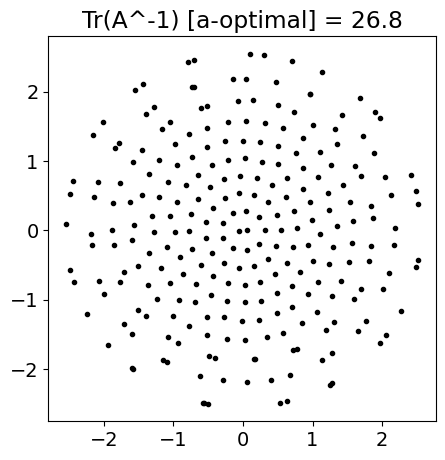

Displacements saved to C:\experiments\260625DarkModeErrBudgetting\optimized_displacements_1.npy


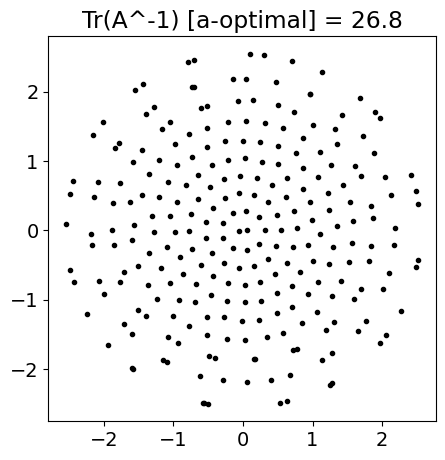

In [12]:
from fitting.wigner import OptimalDisplacementGeneration
n_photon = 10 # maximum photon number to consider
n_disps = 256 # number of displacements to use in the optimization
opt_alphas = OptimalDisplacementGeneration(FD = n_photon, n_disps=n_disps)
return_dict = opt_alphas.optimize(save_dir = station.experiment_path)


In [14]:
station.update_all_station_snapshots()

[CONFIG] Created new hardware_config version CFG-HW-20260625-00029
[CONFIG] Reusing existing multiphoton_config version CFG-MP-20260121-00001
[CONFIG] Reusing existing man1_storage_swap version CFG-M1-20260625-00032
[CONFIG] Reusing existing floquet_storage_swap version CFG-FL-20260625-00034
Config snapshots for current station:
  hardware_config: CFG-HW-20260625-00029
  multiphoton_config: CFG-MP-20260121-00001
  man1_storage_swap: CFG-M1-20260625-00032
  floquet_storage_swap: CFG-FL-20260625-00034


{'hardware_config': 'CFG-HW-20260625-00029',
 'multiphoton_config': 'CFG-MP-20260121-00001',
 'man1_storage_swap': 'CFG-M1-20260625-00032',
 'floquet_storage_swap': 'CFG-FL-20260625-00034'}

In [13]:
wigner_1mode_defaults = AttrDict(dict(
    displace_length=0.05,
    displacement_path=None,
    prepulse=False,
    pre_sweep_pulse=[],
    pre_gate_sweep_pulse=[],
    reps = 1000,
    qubits=[0],
    gate_based=True,
    pulse_correction=False,
    relax_delay=2500,
    post_select_pre_pulse=False,
    opt_pulse=None,
    IQ_table=None,
    active_reset=False,
    parity_fast=True,
))


wigner_1mode_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.qubit_cavity.single_mode_wigner_tomography.WignerTomography1ModeExperiment,
    default_expt_cfg=wigner_1mode_defaults,
    job_client=client,
    use_queue=USE_QUEUE,
)


# def do_wigner_tomography_1mode(
#     config_thisrun,
#     expt_path,
#     config_path,
#     displace_length=0.05,
#     displacement_path=None,
#     prepulse=False,
#     pre_sweep_pulse=[],
#     pre_gate_sweep_pulse=[],
#     reps = 1000,
#     qubits=[0],
#     gate_based=True,
#     pulse_correction=False,
#     relax_delay=2500,
#     post_select_pre_pulse=False,
#     opt_pulse=None,
#     IQ_table=None,
#     active_reset=False,
#     parity_fast=False,
# ):
#     """
#     Run the Wigner Tomography 1 Mode Experiment with configurable parameters.
#     """
#     expt_cfg = {
#         'displace_length': displace_length,
#         'displacement_path': displacement_path,
#         'reps': reps,
#         'rounds': 1,
#         'prepulse': prepulse,
#         'pre_sweep_pulse': pre_sweep_pulse,
#         'pre_gate_sweep_pulse': pre_gate_sweep_pulse if pre_gate_sweep_pulse is not None else [],
#         'qubits': qubits,
#         'pulse_correction': pulse_correction,
#         'post_select_pre_pulse': post_select_pre_pulse,
#         'opt_pulse': opt_pulse, 
#         'IQ_table': IQ_table,
#         'active_reset': active_reset,
#         'parity_fast': parity_fast,
#     }




#     wigner_exp = expts_base_inst.meas.qubit_cavity.single_mode_wigner_tomography.WignerTomography1ModeExperiment(
#         soccfg=expts_base_inst.soc, path=expt_path, prefix='WignerTomography1ModeExperiment', config_file=config_path
#     )
#     wigner_exp.cfg = AttrDict(deepcopy(hardware_cfg))
#     wigner_exp.cfg.expt = expt_cfg
#     wigner_exp.cfg.expt.gate_based = gate_based  # Set gate_based to False for Wigner tomography
#     wigner_exp.cfg.device.readout.relax_delay = [relax_delay]
#     # wigner_exp.cfg.device.readout.phase = 90.0  # Set readout phase to 0.0

#     wigner_exp.go(analyze=True, display=False, progress=True, save=False)
#     return wigner_exp

# print(expts_base_inst)
# # print(wigner_exp)


# def do_wigner_tomography_1mode_optimal(
#     config_thisrun,
#     expt_path,
#     config_path,
#     pulse_to_test,
#     nb_plot = 3, 
#     displace_length=0.05,
#     displacement_path=None,
#     prepulse=False,
#     pre_sweep_pulse=None,
#     pre_gate_sweep_pulse=None,
#     reps = 1000,
#     qubits=[0],
#     gate_based=True,
#     pulse_correction=False,
#     relax_delay=2500,
#     post_select_pre_pulse=False,
#     opt_pulse=None,
#     IQ_table=None,
#     active_reset=False,
#     parity_fast=False,
# ):
    

#     expt_cfg = {
#         'displace_length': displace_length,
#         'displacement_path': displacement_path,
#         'reps': reps,
#         'rounds': 1,
#         'prepulse': prepulse,
#         'pre_sweep_pulse': pre_sweep_pulse if pre_sweep_pulse is not None else [],
#         'pre_gate_sweep_pulse': pre_gate_sweep_pulse if pre_gate_sweep_pulse is not None else [],
#         'qubits': qubits,
#         'pulse_correction': pulse_correction,
#         'post_select_pre_pulse': post_select_pre_pulse,
#         'opt_pulse': opt_pulse, 
#         'IQ_table': IQ_table,
#         'pulse_to_test': pulse_to_test,  # Add pulse_to_test to the configuration   
#         'nb_plot': nb_plot,  # Number of plots to generate
#         'active_reset': active_reset,
#         'parity_fast': parity_fast,
#     }

#     wigner_exp = expts_base_inst.meas.qubit_cavity.single_mode_wigner_tomography.WignerTomographyOptimalPulseExperiment(
#         soccfg=expts_base_inst.soc, path=expt_path, prefix='WignerTomographyOptimalPulseExperiment', config_file=config_path
#     )
#     wigner_exp.cfg = AttrDict(deepcopy(hardware_cfg))
#     wigner_exp.cfg.expt = expt_cfg
#     wigner_exp.cfg.expt.gate_based = gate_based
#     wigner_exp.cfg.device.readout.relax_delay = [relax_delay]
#     # wigner_exp.cfg.device.readout.phase = 90.0  # Set readout phase to 0.0

#     wigner_exp.go(analyze=True, display=False, progress=True, save=True)
#     return wigner_exp
        

## Wigner Tomography

### Sidebands

In [ ]:
photon_list_pre = [1]
prep_man_pi = mm_base_calib.prep_fock_state(man_no=1, photon_no_list=photon_list_pre, broadband=False)
print('prep_man_pi', prep_man_pi)
pulse = mm_base_calib.get_prepulse_creator(prep_man_pi).pulse.tolist()
print('pulse', pulse)

### Optimal control 

In [ ]:
prepulse = [
            # ['optimal_control', 'test', '1', [0, 0]], 
            ['optimal_control', 'fock', '0+4', [0, 0]], 
            ]
gain_qb, gain_cav = mm_base_calib.get_gain_optimal_pulse(prepulse[0])
print(f'Gain for qubit: {gain_qb}, Gain for cavity: {gain_cav}')
expts_base_inst.hardware_cfg.device.optimal_control[prepulse[0][1]][prepulse[0][2]]['gain'][0]= gain_qb
expts_base_inst.hardware_cfg.device.optimal_control[prepulse[0][1]][prepulse[0][2]]['gain'][1]= gain_cav
expts_base_inst.hardware_cfg.device.optimal_control[prepulse[0][1]][prepulse[0][2]]['frequency'][0]= expts_base_inst.hardware_cfg.device.qubit.f_ge[0]
expts_base_inst.hardware_cfg.device.optimal_control[prepulse[0][1]][prepulse[0][2]]['frequency'][1]= expts_base_inst.hardware_cfg.device.manipulate.f_ge[0]


pulse = mm_base_calib.get_prepulse_creator(prepulse, cfg=expts_base_inst.hardware_cfg).pulse.tolist()

In [ ]:
wigner = wigner_1mode_runner.execute(
    displace_length=0.05,
    reps = 100,
    displacement_path=return_dict['path'], #optimal displacement path
    prepulse=True,
    pre_sweep_pulse=pulse,
    gate_based = False,
    pulse_correction=True,
    relax_delay=2500, 
    post_select_pre_pulse=False,
    active_reset=False,
    go_kwargs=dict(analyze=False, display=False)
)

# wigner = do_wigner_tomography_1mode(
#     config_thisrun=expts_base_inst.hardware_cfg,
#     expt_path=expts_base_inst.expt_path,
#     config_path=expts_base_inst.config_file,
#     displace_length=0.05,
#     reps = 200,
#     displacement_path=return_dict['path'], #optimal displacement path
#     prepulse=False,
#     pre_sweep_pulse=pulse,
#     gate_based = False,
#     pulse_correction=True,
#     # relax_delay=1000, 
#     relax_delay=2500, 
#     post_select_pre_pulse=False,
#     active_reset=False
# )

In [ ]:
cutoff =4
# initial_state = (qt.basis(cutoff, 0)+qt.basis(cutoff, 4)).unit()
initial_state = (qt.basis(cutoff, 1)).unit()
# initial_state = get_hex_GKP(0.377, 2, cutoff)
wigner.analyze(cutoff=cutoff, debug=True)
wigner.display(rotate=True, initial_state=initial_state, mode_state_num=cutoff, station=station, save_fig=True)


In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

pe_plus = wigner.data['pe_plus']
pe_minus = wigner.data['pe_minus']
pe = pe_plus + pe_minus
ax[0].plot(np.abs(wigner.data['alpha']), pe, 'o')
ax[0].plot(np.abs(wigner.data['alpha']), pe_plus, 'o', label='pe_plus')
ax[0].plot(np.abs(wigner.data['alpha']), pe_minus, 'o', label='pe_minus')

parity_plus = wigner.data['parity_plus']
parity_minus = wigner.data['parity_minus']
parity = wigner.data['parity']
ax[1].plot(np.abs(wigner.data['alpha']), 2 / np.pi *parity, 'o')
ax[1].plot(np.abs(wigner.data['alpha']), 2 / np.pi *parity_plus, 'o', label='parity_plus')
ax[1].plot(np.abs(wigner.data['alpha']), 2 / np.pi *parity_minus, 'o', label='parity_minus')

ax[0].set_xlabel('Alpha')
ax[0].set_ylabel('Probability')
ax[1].set_xlabel('Alpha')
ax[1].set_ylabel('Parity')
ax[0].legend()
ax[1].legend()
plt.tight_layout()

In [ ]:
# get GKP states
def get_hex_GKP(Delta,d,N):
    psi_list = [0*qt.basis(N,0) for _ in range(d)]
    e1 = np.sqrt(2*np.pi/d/np.sqrt(3))*(np.sqrt(3)/2-0.5j)
    e2 = np.sqrt(2*np.pi/d/np.sqrt(3))*1j
    for n1 in range(-30,31):
        for n2 in range(-30,31):
            for mu in range(d):
                a1 = e1*(d*n1+mu)
                a2 = e2*n2
                psi_list[mu] += np.exp((a1*np.conj(a2)-np.conj(a1)*a2)/2)*qt.coherent(N,a1+a2,method='analytic')

    psis = [((-Delta**2*qt.num(N)).expm()*psi).unit() for psi in psi_list]
    return psis[0]

In [ ]:
_result = wigner.data 
_result.keys()


In [ ]:
_result['target_state']

In [ ]:
np.savetxt(expts_base_inst.expt_path + "bin_W_fit.txt", _result["W_fit"], fmt="%.6e")
np.savetxt(expts_base_inst.expt_path + "bin_alpha_wigner.txt", _result["alpha_wigner"], fmt="%.6e")
np.savetxt(expts_base_inst.expt_path + "bin_alpha_meas.txt", _result["alpha"], fmt="%.6e")
np.savetxt(expts_base_inst.expt_path + "bin_parity.txt", _result["parity"], fmt="%.6e")
np.savetxt(expts_base_inst.expt_path + "bin_target_state.txt", _result["target_state"], fmt="%.6e")


In [ ]:
# results= wigner.data
# # save results in a npz file
# np.savez_compressed(expts_base_inst.expt_path + 'WignerResults.npz',
#                     rho = results['rho'],
#                     fidelity = results['fidelity'],
#                     target_state = initial_state.full(),
#                     Wigner = results['W_fit'],
#                     alpha_wigner = results['alpha_wigner']
#                     )

# # Define where to save results
save_path = expts_base_inst.expt_path + 'WignerResults.npz'

# Collect data in one dictionary for clarity
save_data = {
    "rho": results["rho"],
    "fidelity": results["fidelity"],
    "target_state": initial_state.full(),
    "Wigner": results["W_fit"],
    "alpha_wigner": results["alpha_wigner"],
}

# Save compressed npz file
np.savez_compressed(save_path, **save_data)

## Process Tomography

In [ ]:
def do_process_tomography_1mode(
    hardware_cfg,
    expt_path,
    config_path,
    displace_length=0.05,
    displacement_path=None,
    reps=250,
    qubits=[0],
    gate_based=True,
    pulse_correction=False,
    relax_delay=2500,
    post_select_pre_pulse=False,
    active_reset=False,
    # ProcessTomography-specific
    cardinal_states=None,  # list of list-of-lists for custom_pulse
    wait_start=0.0,
    wait_step=2.0,
    wait_expts=3,
    wait_list=None,
    repeat_list=None,
    # Optional pulses around wait
    prepulse=False,
    pre_sweep_pulse=None,  # list-of-lists (analog) or gate list if gate_based
    pre_gate_sweep_pulse=None,
    postpulse=None,        # list-of-lists (analog) or gate list if gate_based
    parity_shot=False,
    parity_fast=False,
):
    """
    Run the Process Tomography 1 Mode Experiment following the notebook convention.

    Parameters mirror the Wigner helper (do_wigner_tomography_1mode) and add:
      - cardinal_states: list of prepared states (each as list-of-lists for custom_pulse)
      - wait_*: wait sweep in microseconds
      - prepulse/pre_sweep_pulse/postpulse: optional pulses before/after the wait
    """
    if cardinal_states is None or len(cardinal_states) == 0:
        raise ValueError('cardinal_states must be a non-empty list of custom_pulse sequences')


    expt_cfg = {
    'displace_length': displace_length,
    'displacement_path': displacement_path,
    'reps': reps,
    'rounds': 1,
    'qubits': qubits,
    'pulse_correction': pulse_correction,
    'post_select_pre_pulse': post_select_pre_pulse,
    'active_reset': active_reset,
    # ProcessTomography specific
    'cardinal_states': cardinal_states,
    # Optional pulses
    'prepulse': prepulse if prepulse is not None else [],
    # 'pre_sweep_pulse': pre_sweep_pulse if pre_sweep_pulse is not None else [],
    # 'pre_gate_sweep_pulse': pre_gate_sweep_pulse if pre_gate_sweep_pulse is not None else [],
    'postpulse': postpulse if postpulse is not None else [],
    'parity_shot': parity_shot,
    'parity_fast': parity_fast,
    }

    if wait_list is not None: 
        expt_cfg['wait_list'] = wait_list
    elif wait_start is not None:
        expt_cfg['wait_start'] = wait_start
        expt_cfg['wait_step'] = wait_step
        expt_cfg['wait_expts'] = wait_expts
    else: 
        wait_list = [0]
        expt_cfg['wait_list'] = wait_list
    if repeat_list is not None:
        expt_cfg['repeat_list'] = repeat_list
    elif repeat_start: 
        expt_cfg['repeat_start'] = repeat_start
        expt_cfg['repeat_step'] = repeat_step
        expt_cfg['repeat_expts'] = repeat_expts
    else: 
        repeat_list = None 



    # Build the experiment via expts_base_inst path to match notebook style
    try:
        ProcClass = expts_base_inst.meas.qubit_cavity.single_mode_wigner_tomography.ProcessTomographyExperiment
        soc_obj = expts_base_inst.soc
    except NameError:
        raise RuntimeError('expts_base_inst is not defined. Initialize your experiment base instance first.')

    proc_exp = ProcClass(soccfg=soc_obj, path=expt_path, prefix='ProcessTomography1Mode', config_file=config_path)
    try:
        proc_exp.cfg = AttrDict(deepcopy(config_thisrun))
    except NameError:
        # Fallback if AttrDict is not available in this notebook scope
        proc_exp.cfg = deepcopy(config_thisrun)

    proc_exp.cfg.expt = expt_cfg
    proc_exp.cfg.expt.gate_based = gate_based
    # Relax delay in microseconds (list to match device schema)
    try:
        proc_exp.cfg.device.readout.relax_delay = [relax_delay]
    except Exception:
        pass

    proc_exp.go(analyze=False, display=False, progress=True, save=False)
    return proc_exp

In [ ]:
# photon_list_pre = [[0], [0, 1], [0, 1j], [1]]
# state_prep_list = []
# for photon_list in photon_list_pre:
#     prep_man_pi = mm_base_calib.prep_fock_state(man_no=1, photon_no_list=photon_list, broadband=True)
#     pulse = mm_base_calib.get_prepulse_creator(prep_man_pi).pulse.tolist()
#     state_prep_list.append(pulse)


prepulse_seq = [['storage', 'M1-S2', 'pi', 0]]
postpulse_seq = [['storage', 'M1-S2', 'pi', 0]]
prepulse_seq = mm_base_calib.get_prepulse_creator(prepulse_seq).pulse.tolist()
postpulse_seq = mm_base_calib.get_prepulse_creator(postpulse_seq).pulse.tolist()



prep_1 = mm_base_calib.prep_fock_state(man_no=1, photon_no_list=[2], broadband=False)
prep_pi = mm_base_calib.prep_fock_state(man_no=1, photon_no_list=[0,2j], broadband=False)
prep_p = mm_base_calib.prep_fock_state(man_no=1, photon_no_list=[0, 2], broadband=False)
prep_0 = []

# prep_pi = [ 
#     ['qubit', 'ge', 'hpi', 0],
#     ['qubit', 'ef', 'pi', 0],
#     ['multiphoton', 'f0-g1', 'pi', 0],
# ]

# prep_p = [ 
#     ['qubit', 'ge', 'hpi', 90],
#     ['qubit', 'ef', 'pi', 0],
#     ['multiphoton', 'f0-g1', 'pi', 0],
# ]

# prep_1 = [ 
#     ['qubit', 'ge', 'pi', 0],
#     ['qubit', 'ef', 'pi', 0],
#     ['multiphoton', 'f0-g1', 'pi', 0],
# ]

# prep_0 = [

#     ]


state_prep_list = []
# photon_list_pre = [prep_0, prep_1, prep_p, prep_pi]
photon_list_pre = [prep_1]


for photon_list in photon_list_pre:
    pulse = mm_base_calib.get_prepulse_creator(photon_list).pulse.tolist()
    print(pulse)
    state_prep_list.append(pulse)

psi0 = qt.basis(5, 0)
psi1 = qt.basis(5, 2)
psi_p = (psi0 + psi1).unit()
psi_pi = (psi0 + 1j*psi1).unit()
# target_states = [psi0, psi1, psi_p, psi_pi]
target_states = [psi1, psi_p]
analyze_state = [target_states[0]]

### Measure for $|2\rangle$ the lifetime versus parity rep time 

In [ ]:

hstgrm = do_single_shot(config_thisrun=expts_base_inst.config_thisrun,expt_path=expts_base_inst.expt_path,config_path=expts_base_inst.config_file, 
                        reps = 5000, 
                        active_reset=False,
                        prepulse=False,
                        gate_based=False,
                        check_f=False,
                        # pre_sweep_pulse=prepulse_seq,
                        # pre_sweep_pulse=parity_pulse,
                        relax_delay = 2500)

update_single_shot(hstgrm[1], expts_base_inst.config_thisrun)

In [ ]:
time_final = 1000  # in microseconds
wait_time_list = np.array([100, 150, 200, 250])  # in microseconds
# wait_time_list = np.array([40, 60, 100, 150])  # in microseconds
num_repeats = time_final // wait_time_list
print(f'Number of repeats: {num_repeats}')


for i in range(len(num_repeats)):
    repeats = np.arange(num_repeats[i])
    print(repeats)
    
    process_tomography = do_process_tomography_1mode(
        config_thisrun=expts_base_inst.config_thisrun,
        expt_path=expts_base_inst.expt_path,
        config_path=expts_base_inst.config_file,
        displace_length=0.05,
        displacement_path=return_dict['path'], #optimal displacement path
        reps = 600,
        prepulse=prepulse_seq,
        postpulse=postpulse_seq,
        gate_based = False,
        pulse_correction=True,
        relax_delay=2500, 
        post_select_pre_pulse=False,
        cardinal_states=state_prep_list,
        wait_list=[wait_time_list[i]],
        repeat_list=repeats,
        parity_shot=True,
    )
    process_tomography.analyze(target_states=analyze_state)
    process_tomography.save_data()

### Measure for all cardinal states for a given waiting time 

In [ ]:
state_prep_list = []
# photon_list_pre = [prep_0, prep_1, prep_p, prep_pi]
photon_list_pre = [prep_1, prep_p]

for photon_list in photon_list_pre:
    pulse = mm_base_calib.get_prepulse_creator(photon_list).pulse.tolist()
    print(pulse)
    state_prep_list.append(pulse)

time_final = 1500  # in microseconds
wait_time = 200  # in microseconds
num_repeats = time_final // wait_time
repeats = np.arange(0, num_repeats)
print(f'Number of repeats: {num_repeats}')

### first with parity shot

In [ ]:

hstgrm = do_single_shot(config_thisrun=expts_base_inst.config_thisrun,expt_path=expts_base_inst.expt_path,config_path=expts_base_inst.config_file, 
                        reps = 5000, 
                        active_reset=False,
                        prepulse=False,
                        gate_based=False,
                        check_f=False,
                        # pre_sweep_pulse=prepulse_seq,
                        # pre_sweep_pulse=parity_pulse,
                        relax_delay = 2500)

update_single_shot(hstgrm[1], expts_base_inst.config_thisrun)

In [ ]:
process = do_process_tomography_1mode(
    config_thisrun=expts_base_inst.config_thisrun,
    expt_path=expts_base_inst.expt_path,
    config_path=expts_base_inst.config_file,
    displace_length=0.05,
    reps=800,
    displacement_path=return_dict['path'], #optimal displacement path,  # or e.g., return_dict['path']
    cardinal_states=state_prep_list,
    gate_based=False,
    pulse_correction=True,
    relax_delay=2500,
    post_select_pre_pulse=False,
    # wait_start=0.01,
    # wait_step=60.0,
    # wait_expts=15,
    wait_list=[wait_time],
    repeat_list=repeats,
    prepulse=prepulse_seq,
    postpulse=postpulse_seq,
    parity_shot=True,
    active_reset=False,)

process.analyze(target_states=target_states)
process.save_data()

### then without

In [ ]:

hstgrm = do_single_shot(config_thisrun=expts_base_inst.config_thisrun,expt_path=expts_base_inst.expt_path,config_path=expts_base_inst.config_file, 
                        reps = 5000, 
                        active_reset=False,
                        prepulse=False,
                        gate_based=False,
                        check_f=False,
                        # pre_sweep_pulse=prepulse_seq,
                        # pre_sweep_pulse=parity_pulse,
                        relax_delay = 2500)

update_single_shot(hstgrm[1], expts_base_inst.config_thisrun)

In [ ]:
process = do_process_tomography_1mode(
    config_thisrun=expts_base_inst.config_thisrun,
    expt_path=expts_base_inst.expt_path,
    config_path=expts_base_inst.config_file,
    displace_length=0.05,
    reps=250,
    displacement_path=return_dict['path'], #optimal displacement path,  # or e.g., return_dict['path']
    cardinal_states=state_prep_list,
    gate_based=False,
    pulse_correction=True,
    relax_delay=2500,
    post_select_pre_pulse=False,
    # wait_start=0.01,
    # wait_step=60.0,
    # wait_expts=15,
    wait_list=[wait_time],
    repeat_list=repeats,
    prepulse=prepulse_seq,
    postpulse=postpulse_seq,
    parity_shot=False,
    active_reset=False,)

process.analyze(target_states=target_states)
process.save_data()

### Now do only with wait time and one repeat 

In [ ]:

hstgrm = do_single_shot(config_thisrun=expts_base_inst.config_thisrun,expt_path=expts_base_inst.expt_path,config_path=expts_base_inst.config_file, 
                        reps = 5000, 
                        active_reset=False,
                        prepulse=False,
                        gate_based=False,
                        check_f=False,
                        # pre_sweep_pulse=prepulse_seq,
                        # pre_sweep_pulse=parity_pulse,
                        relax_delay = 2500)

update_single_shot(hstgrm[1], expts_base_inst.config_thisrun)

In [ ]:
state_prep_list = []
photon_list_pre = [prep_1, prep_p]

for photon_list in photon_list_pre:
    pulse = mm_base_calib.get_prepulse_creator(photon_list).pulse.tolist()
    print(pulse)
    state_prep_list.append(pulse)

In [ ]:
time_final = 1000  # in microseconds
# wait_time_list = np.array([0, 150, 300, 450, 600, 750, 900, 1050])  # in microseconds
wait_time_list = [0]
repeat_list = np.arange(0, 20, 2)
# num_repeats = [1]

    
process_tomography = do_process_tomography_1mode(
    config_thisrun=expts_base_inst.config_thisrun,
    expt_path=expts_base_inst.expt_path,
    config_path=expts_base_inst.config_file,
    displace_length=0.05,
    displacement_path=return_dict['path'], #optimal displacement path
    reps = 300,
    gate_based = False,
    pulse_correction=True,
    relax_delay=2500, 
    post_select_pre_pulse=False,
    cardinal_states=state_prep_list,
    wait_list=wait_time_list,
    prepulse=prepulse_seq,
    postpulse=postpulse_seq,
    repeat_list=repeat_list,
    parity_shot=False,
)
    # process_tomography.analyze(target_states=analyze_state)
    # process_tomography.save_data()

In [ ]:
process_tomography.analyze(target_states=target_states)
process_tomography.save_data()

In [ ]:
process_tomography.display(state_idx=0, wait_idx=0,
                repeat_idx=0, target_state=target_states[0],
                 rotate=True, filtered=False)

### Now same for 1 

In [ ]:
prep_1 = mm_base_calib.prep_fock_state(man_no=1, photon_no_list=[1], broadband=False)
prep_pi = mm_base_calib.prep_fock_state(man_no=1, photon_no_list=[0,1j], broadband=False)
prep_p = mm_base_calib.prep_fock_state(man_no=1, photon_no_list=[0, 1], broadband=False)
prep_0 = []
state_prep_list = []
# photon_list_pre = [prep_0, prep_1, prep_p, prep_pi]
photon_list_pre = [prep_1, prep_p]
for photon_list in photon_list_pre:
    pulse = mm_base_calib.get_prepulse_creator(photon_list).pulse.tolist()
    print(pulse)
    state_prep_list.append(pulse)

time_final = 1000  # in microseconds
# wait_time_list = np.array([0, 150, 300, 450, 600, 750, 900, 1050])  # in microseconds
wait_time_list = [0]
repeat_list = np.arange(0, 20, 2)
# num_repeats = [1]

target_states = [qt.basis(5, 1), (qt.basis(5, 0) + qt.basis(5, 1)).unit()]


In [ ]:
process_tomography = do_process_tomography_1mode(
        config_thisrun=expts_base_inst.config_thisrun,
        expt_path=expts_base_inst.expt_path,
        config_path=expts_base_inst.config_file,
        displace_length=0.05,
        displacement_path=return_dict['path'], #optimal displacement path
        # reps = 250,
        reps = 300,
        gate_based = False,
        pulse_correction=True,
        relax_delay=2500, 
        post_select_pre_pulse=False,
        cardinal_states=state_prep_list,
        wait_list=wait_time_list,
        prepulse=prepulse_seq,
        postpulse=postpulse_seq,
        repeat_list=num_repeats,
        parity_shot=False,
    )

In [ ]:
process_tomography.analyze(target_states=target_states)
process_tomography.save_data()

## Debug optimal control
This is taking one optimal control pulse and measure both the qubit and cavity tomography for several time slices. 

In [ ]:
# prepulse = [['optimal_control', 'test', '2', [0, 0]]]
# gain_qb, gain_cav = mm_base_calib.get_gain_optimal_pulse(prepulse[0])
# print(f'Gain for qubit: {gain_qb}, Gain for cavity: {gain_cav}')
# expts_base_inst.config_thisrun.device.optimal_control[prepulse[0][1]][prepulse[0][2]]['gain'][0]= gain_qb
# expts_base_inst.config_thisrun.device.optimal_control[prepulse[0][1]][prepulse[0][2]]['gain'][1]= gain_cav
# prepulse = mm_base_calib.get_prepulse_creator(prepulse, cfg=expts_base_inst.config_thisrun).pulse.tolist()


pulse_to_test = [['optimal_control', 'fock', '2', [0, 0]]]
pulse_conf = expts_base_inst.config_thisrun.device.optimal_control[pulse_to_test[0][1]][pulse_to_test[0][2]]

# set gain 
gain_qb, gain_cav = mm_base_calib.get_gain_optimal_pulse(pulse_to_test[0])
print(f'Gain for qubit: {gain_qb}, Gain for cavity: {gain_cav}')
# expts_base_inst.config_thisrun.device.optimal_control[pulse_to_test[0][1]][pulse_to_test[0][2]]['gain'][0]= 20000
expts_base_inst.config_thisrun.device.optimal_control[pulse_to_test[0][1]][pulse_to_test[0][2]]['gain'][0]= gain_qb
# expts_base_inst.config_thisrun.device.optimal_control[pulse_to_test[0][1]][pulse_to_test[0][2]]['gain'][1]= 20000
expts_base_inst.config_thisrun.device.optimal_control[pulse_to_test[0][1]][pulse_to_test[0][2]]['gain'][1]= gain_cav



# import the I, Q, times 
filename = expts_base_inst.config_thisrun.device.optimal_control[pulse_to_test[0][1]][pulse_to_test[0][2]]['filename']
data = np.load(filename, allow_pickle=True)
times = data['times'] * 1e-3
Ic = data['I_c']
Qc = -data['Q_c']
Iq = data['I_q']
Qq = -data['Q_q']
qb_scale = max((np.max(np.abs(Iq)), np.max(np.abs(Qq))))
cav_scale = max((np.max(np.abs(Ic)), np.max(np.abs(Qc))))

if qb_scale !=0: 
    Iq /= qb_scale
    Qq /= qb_scale

if cav_scale !=0: 
    Ic /= cav_scale
    Qc /= cav_scale

t_length = len(times)
nb_plot = 5
# t_step = (times[-1] - times[0]) / nb_plot
t_step = (times[30] - times[0]) / nb_plot
# t_to_plot = np.arange(0, times[-1]+t_step, t_step)
t_to_plot = np.arange(0, 5*t_step, t_step)

# t_to_plot = np.array([times[-1]])
t_to_plot[0] +=0.05

data_tot = []
data.close()


In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))

ax.scatter(times, Ic, label='Cavity I')
ax.scatter(times, Qc, label='Cavity Q')
ax.scatter(times, Iq, label='Qubit I')
ax.scatter(times, Qq, label='Qubit Q')
ax.set_xlabel('Time (ms)')
ax.set_ylabel('Normalized Signal')
ax.legend()
# add vertical lines at t_to_plot
for t in t_to_plot:
    ax.axvline(t, color='k', linestyle='--', alpha=0.5)

In [ ]:
for i in range(len(t_to_plot)):

    idx_t = np.argmin(np.abs(times - t_to_plot[i]))
    IQ_table = {
        'I_c': Ic[:idx_t],
        'Q_c': Qc[:idx_t],
        'I_q': Iq[:idx_t],
        'Q_q': Qq[:idx_t],
        'times': times[:idx_t]
    }

    wigner = do_wigner_tomography_1mode(
    config_thisrun=expts_base_inst.config_thisrun,
    expt_path=expts_base_inst.expt_path,
    config_path=expts_base_inst.config_file,
    displace_length=0.05,
    reps = 250,
    displacement_path=return_dict['path'], #optimal displacement path
    prepulse=False,
    pre_sweep_pulse=None,
    gate_based = False,
    pulse_correction=True,
    active_reset=False,
    relax_delay=2500, 
    post_select_pre_pulse=True,
    IQ_table=IQ_table,
    opt_pulse=pulse_to_test
    )

    wigner.analyze()
    wigner_analysis = WignerAnalysis(wigner.data, config=wigner.cfg,
                                      mode_state_num=10, alphas = wigner.data['alpha'])
    results = wigner_analysis.wigner_analysis_results(wigner.data['parity'],
                                                       initial_state=qt.fock(wigner_analysis.m, 0), rotate=False)
    fig = wigner_analysis.plot_wigner_reconstruction_results(results, 
                                                             initial_state=qt.fock(wigner_analysis.m, 0), state_label = '')


    rho = results['rho']
    wigner.data['rho'] = rho
    data_tot.append(wigner.data)

In [ ]:
plot_wigner = True
n_distr = np.zeros((len(data_tot), wigner_analysis.m))
p_vec =np.zeros((len(data_tot), 2))
# for each time slice use the rho to compute the photon number distribution
for i in range(len(data_tot)):
    _n_distr = np.diag(data_tot[i]['rho'])
    n_distr[i, :] = _n_distr
    p_vec[i, 1] = data_tot[i]['pe_postpulse']
    p_vec[i, 0] = 1 - p_vec[i, 1]



# open simulation data
if 'pulse' in filename:
    filename_th = filename.replace('pulse', 'pop_sim\populations')
else:
    filename_th = filename.replace('optimal_control\\', 'optimal_control\\pop_sim\\populations_')
data_th = np.load(filename_th, allow_pickle=True)
n_distr_th = data_th['cavity']
p_vec_th = data_th['qubit'][1, :]
times_th = data_th['times'] * 1e-3
rho_cav_t = data_th['rho_cav_t']

F_vec = np.zeros(len(data_tot))

for i in range(len(data_tot)):
    rho_exp = qt.Qobj(data_tot[i]['rho'])
    cutoff_exp = rho_exp.shape[0]
    cutoff_th = rho_cav_t.shape[1]
    cutoff = min(cutoff_exp, cutoff_th)
    idx_t = np.argmin(np.abs(times_th - t_to_plot[i]))
    rho_th = qt.Qobj(rho_cav_t[:cutoff, :cutoff, idx_t])
    rho_exp = qt.Qobj(rho_exp[:cutoff, :cutoff])
    F_vec[i] = qt.fidelity(rho_exp, rho_th)

    if plot_wigner:
        vmin = -2 / np.pi
        vmax = 2 / np.pi
        alpha_list = data_tot[i]['alpha']
        alpha_max = np.max(np.abs(alpha_list))*1.5
        x_vec = np.linspace(-alpha_max, alpha_max, 150)
        W_exp= qt.wigner(rho_exp, x_vec, x_vec)
        W_th = qt.wigner(rho_th, x_vec, x_vec)
        fig, ax = plt.subplots(1, 2, figsize=(6, 3))
        # ax[0].set_aspect('equal')
        ax[0].pcolormesh(x_vec, x_vec, W_exp, vmin=vmin, vmax=vmax, cmap='RdBu_r')
        ax[0].set_xlabel('Re(α)')
        ax[0].set_ylabel('Im(α)')
        ax[0].set_title(f'Exp at t={t_to_plot[i]:.2f} us')

        # ax[1].set_aspect('equal')
        ax[1].pcolormesh(x_vec, x_vec, W_th, vmin=vmin, vmax=vmax, cmap='RdBu_r')
        ax[1].set_xlabel('Re(α)')
        ax[1].set_ylabel('Im(α)')
        ax[1].set_title(f'Th')
        fig.tight_layout()

        # save the figure the the filemane for pop
        fig.savefig(filename_th.replace('.npz', f'_wigner_{i}.png'), dpi=300)


    


# plot a heatmap of the photon number distribution and qubit

fig1, ax1 = plt.subplots(2, 1, figsize=(6, 6))
cax = ax1[0].imshow(n_distr.T, 
                   aspect='auto', origin='lower', cmap='viridis', 
                   extent=[t_to_plot[0], t_to_plot[-1], 0, n_distr.shape[1]-1])
ax1[0].set_xlabel('Time (us)')
ax1[0].set_ylabel('Photon Number')
ax1[0].set_title('Photon Number Distribution exp/theory')

cax2 = ax1[1].imshow(n_distr_th[:n_distr.T.shape[0], ],
                     aspect='auto', origin='lower', cmap='viridis',
                     extent=[times_th[0], times_th[-1], 0,n_distr.T.shape[0]-1])
ax1[1].set_xlabel('Time (us)')
ax1[1].set_ylabel('Photon Number')
# fig.colorbar(cax, ax=ax[0])
fig1.tight_layout()
# save the figure
fig1.savefig(filename_th.replace('.npz', '_photon_distribution.png'), dpi=300)

fig2, ax2 = plt.subplots(2, 1, figsize=(6, 6))

ax2[0].plot(t_to_plot, p_vec[:, 0], 'o-', label='e',
           color='tab:blue', markersize=4, linewidth=1.2)
ax2[0].plot(t_to_plot, p_vec[:, 1], 'o-', label='g',
           color='tab:red', markersize=4, linewidth=1.2)
ax2[0].plot(times_th, p_vec_th, linestyle='--', color = 'tab:blue')
ax2[0].plot(times_th, 1-p_vec_th, linestyle='--', color='tab:red')
ax2[0].set_xlabel('Time (us)')
ax2[0].set_ylabel('Probability')
ax2[0].set_title('Qubit Probabilities')
ax2[0].legend()

ax2[1].plot(t_to_plot, F_vec, 'o-', color='tab:green', markersize=4, linewidth=1.2)
ax2[1].set_xlabel('Time (us)')
ax2[1].set_ylabel('Fidelity')
ax2[1].set_title('Cavity state')
fig2.tight_layout()
# save the figure
fig2.savefig(filename_th.replace('.npz', '_qubit_fidelity.png'), dpi=300)


In [ ]:
# close all files npz and plt
plt.close('all')
data_th.close()

In [ ]:
# save the data
np.savez(filename_th.replace('.npz', '_data.npz'),
         n_distr=n_distr, p_vec=p_vec, F_vec=F_vec,
         n_distr_th=n_distr_th, p_vec_th=p_vec_th, times=times_th,
         t_to_plot=t_to_plot, data_tot=data_tot)

## CMA-ES solver

In [ ]:
from stable_baselines3 import PPO
from CavityQubitEnv import CavityQubitEnv
import qutip as qt
import numpy as np
import cma 


### Pulse to test 

In [ ]:

pulse_to_test = [['optimal_control', 'fock', '2', [0, 0]]]
pulse_conf = expts_base_inst.config_thisrun.device.optimal_control[pulse_to_test[0][1]][pulse_to_test[0][2]]

# set gain 
gain_qb, gain_cav = mm_base_calib.get_gain_optimal_pulse(pulse_to_test[0])
print(f'Gain for qubit: {gain_qb}, Gain for cavity: {gain_cav}')
expts_base_inst.config_thisrun.device.optimal_control[pulse_to_test[0][1]][pulse_to_test[0][2]]['gain'][0]= gain_qb
expts_base_inst.config_thisrun.device.optimal_control[pulse_to_test[0][1]][pulse_to_test[0][2]]['gain'][1]= gain_cav

# import the I, Q, times 
filename = expts_base_inst.config_thisrun.device.optimal_control[pulse_to_test[0][1]][pulse_to_test[0][2]]['filename']
data = np.load(filename, allow_pickle=True)
times = data['times'] * 1e-3
Ic = data['I_c']
Qc = -data['Q_c']
Iq = data['I_q']
Qq = -data['Q_q']
# qb_scale = max((np.max(np.abs(Iq)), np.max(np.abs(Qq))))
# cav_scale = max((np.max(np.abs(Ic)), np.max(np.abs(Qc))))

# if qb_scale !=0: 
#     Iq /= qb_scale
#     Qq /= qb_scale

# if cav_scale !=0: 
#     Ic /= cav_scale
#     Qc /= cav_scale

t_length = len(times)
nb_plot = 1
t_step = (times[-1] - times[0]) / nb_plot
t_to_plot = np.array([times[-1]])
data.close()


In [ ]:
cutoff_cav = 7
psi_0 = qt.fock(cutoff_cav, 0)  # Initial cavity state |0>
# psi_target = (qt.fock(cutoff_cav, 0)+qt.fock(cutoff_cav, 4)).unit()  # Target cavity state |1>
psi_target = (qt.fock(cutoff_cav, 2)).unit()  # Target cavity state |1>
Kc = 0.009422
Kq = -143
chi = 0.310457
system_params = {
    'cutoff_qubit': 2,
    'cutoff_cavity': cutoff_cav,
    'Kc': Kc,
    'Kq': Kq,
    'chi': chi
}
pulse_IQ = {
    'Ic': Ic,
    'Qc': Qc,
    'Iq': Iq,
    'Qq': Qq,
    'times': times
}

amplitude_bound_qb = max(np.max(np.abs(Iq)), np.max(np.abs(Qq)))*0.2
amplitude_bound_cav = max(np.max(np.abs(Ic)), np.max(np.abs(Qc)))*0.2
amplitude_bounds = [amplitude_bound_qb, amplitude_bound_cav]

fig, ax = plt.subplots(2, 1, figsize=(4, 3), sharex=True)
ax[0].plot(times, Iq, label='I')
ax[0].plot(times, Qq, label='Q')
ax[0].set_ylabel('qubit')
ax[0].legend()
ax[1].plot(times, Ic, label='I')
ax[1].plot(times, Qc, label='Q')
ax[1].set_ylabel('cavity')
ax[1].set_xlabel('Time')
ax[1].legend()
fig.tight_layout()




In [ ]:
N_points = 25  # number of points of a pulse
nb_sample = None  # number of samples per wigner
n_generations = 100
n_repeat = 4  # number of times to repeat the optimization

env = CavityQubitEnv(
    psi_0=psi_0,
    psi_target=psi_target,
    system_params=system_params,
    pulse_IQ=pulse_IQ, 
    amplitude_bounds=amplitude_bounds,
    N_points=N_points,
    nb_sample=nb_sample
)


dim = env.action_space.shape[0]  # = 4*L
sigma0 = 0.1             # initial standard deviation
x0 = np.zeros(dim)               # initial mean (all zero actions)
# popsize =(4 + int(3 * np.log(dim)))*2
popsize = 5
print(f"popsize={popsize}")

# --- CMA-ES optimizer ---
# Popsize formula: 4 + floor(3*log(dim))
es = cma.CMAEvolutionStrategy(x0, sigma0, {
    "popsize": popsize,
    "bounds": [-1.0, 1.0],  # actions are clipped to [-1,1]
})
fidelity_history = []
logger = es.logger  # attach the default logger

In [ ]:
pulse_IQ_temp = env.generate_IQ_pulse(action)
pulse_IQ_test = env.interpolate_IQ_pulse(pulse_IQ_temp)

In [ ]:
fig , ax = plt.subplots(2, 1, figsize=(4, 3), sharex=True)
ax[0].plot(pulse_IQ_test['times'], pulse_IQ_test['Iq'], label='I')
ax[0].plot(pulse_IQ_test['times'], pulse_IQ_test['Qq'], label='Q')
ax[0].plot(pulse_IQ['times'], pulse_IQ['Iq'], linestyle='--', label='I original')
ax[0].plot(pulse_IQ['times'], pulse_IQ['Qq'], linestyle='--', label='Q original')
ax[0].set_ylabel('qubit')
ax[0].legend()
ax[1].plot(pulse_IQ_test['times'], pulse_IQ_test['Ic'], label='I')
ax[1].plot(pulse_IQ_test['times'], pulse_IQ_test['Qc'], label='Q')
ax[1].plot(pulse_IQ['times'], pulse_IQ['Ic'], linestyle='--', label='I original')
ax[1].plot(pulse_IQ['times'], pulse_IQ['Qc'], linestyle='--', label='Q original')
ax[1].set_ylabel('cavity')
ax[1].set_xlabel('Time')
ax[1].legend()

In [ ]:
from IPython.display import clear_output
fig, ax = plt.subplots(figsize=(6,4))

# fig1, ax1 = plt.subplots()

for gen in range(n_generations):
    solutions = es.ask()
    rewards = []
    for idx, action in enumerate(solutions):
        vals = []
        pulse_IQ_temp = env.generate_IQ_pulse(action)
        pulse_IQ_test = env.interpolate_IQ_pulse(pulse_IQ_temp)
        gain_qb, gain_cav = mm_base_calib.get_gain_optimal_pulse(pulse_IQ=pulse_IQ_test)
        expts_base_inst.config_thisrun.device.optimal_control[pulse_to_test[0][1]][pulse_to_test[0][2]]['gain'][0]= gain_qb
        expts_base_inst.config_thisrun.device.optimal_control[pulse_to_test[0][1]][pulse_to_test[0][2]]['gain'][1]= gain_cav
        print(f'Gain for qubit: {gain_qb}, Gain for cavity: {gain_cav}')
        qb_scale = max(np.max(np.abs(pulse_IQ_test['Iq'])), np.max(np.abs(pulse_IQ_test['Qq'])))
        cav_scale = max(np.max(np.abs(pulse_IQ_test['Ic'])), np.max(np.abs(pulse_IQ_test['Qc'])))
        if qb_scale !=0: 
            pulse_IQ_test['Iq'] /= qb_scale
            pulse_IQ_test['Qq'] /= qb_scale
        if cav_scale !=0:
            pulse_IQ_test['Ic'] /= cav_scale
            pulse_IQ_test['Qc'] /= cav_scale

        IQ_table = {
            'I_c': pulse_IQ_test['Ic'],
            'Q_c': pulse_IQ_test['Qc'],
            'I_q': pulse_IQ_test['Iq'],
            'Q_q': pulse_IQ_test['Qq'],
            'times': pulse_IQ_test['times']
        }

        for r in range(n_repeat):  # repeat the experiment n_repeat times and average the reward
            print(f"  Repeat {r+1}/{n_repeat} for action {idx+1}/{len(solutions)}")

            wigner = do_wigner_tomography_1mode(
            config_thisrun=expts_base_inst.config_thisrun,
            expt_path=expts_base_inst.expt_path,
            config_path=expts_base_inst.config_file,
            displace_length=0.05,
            reps = 150,
            displacement_path=return_dict['path'], #optimal displacement path
            prepulse=False,
            pre_sweep_pulse=None,
            gate_based = False,
            pulse_correction=False,
            relax_delay=2500, 
            # relax_delay=1000,
            # active_reset=True, 
            post_select_pre_pulse=False,
            IQ_table=IQ_table,
            opt_pulse=pulse_to_test
            )

            wigner.analyze()
            wigner_analysis = WignerAnalysis(wigner.data, config=wigner.cfg,
                                            mode_state_num=cutoff_cav, alphas = wigner.data['alpha'])
            results = wigner_analysis.wigner_analysis_results(wigner.data['parity'],
                                                            initial_state=psi_target, rotate=False)
            # fig1 = wigner_analysis.plot_wigner_reconstruction_results(results, 
                                                                    # initial_state=psi_target, state_label = '')

            fidelity = results['fidelity']
            reward = 1 - fidelity  # reward is 1 - fidelity to minimize
            vals.append(reward)
            fidelity_history.append(fidelity)

        
        rewards.append(np.mean(vals))
        # --- clear notebook cell output ---
        clear_output(wait=True)
        print(f"Generation {gen+1}/{n_generations} - Action {idx+1}/{len(solutions)}")
        print(f"Fidelity: {fidelity:.4f}, Reward: {reward:.4f}")

        # --- redraw plot ---
        ax.clear()
        ax.plot(fidelity_history, marker="o")
        ax.set_title(f"Gen {gen+1}, Action {idx+1}")
        ax.set_xlabel("Action #")
        ax.set_ylabel("Fidelity")
        ylim = ax.get_ylim()
        ax.set_ylim(max(0, ylim[0]*0.9), min(1.1, ylim[1]*1.1))
        plt.grid(True)
        display(fig) 


    es.tell(solutions, rewards)
    es.disp()
    logger.add()      # <-- log this generation
    logger.save()     # <-- save to outcmaes folder



In [ ]:
# Suppose `res` is your CMAEvolutionStrategyResult
res = es.result  # replace with your actual result

# --- 1. Best objective value ---
print("Best solution (xbest):", res.xbest)
print("Best fitness (fbest):", res.fbest)
print("Found at evaluation:", res.evals_best)

# --- 2. Plot standard deviations (uncertainty per parameter) ---
plt.figure(figsize=(6,4))
plt.plot(res.stds, marker='o')
plt.title("Final stds per parameter (uncertainty)")
plt.xlabel("Parameter index")
plt.ylabel("Standard deviation")
plt.grid(True)
plt.show()

# --- 3. Compare xbest vs xfavorite ---
plt.figure(figsize=(6,4))
plt.plot(res.xbest, 'o-', label="xbest (best found)")
plt.plot(res.xfavorite, 'x-', label="xfavorite (distribution mean)")
plt.title("Comparison of xbest vs xfavorite")
plt.xlabel("Parameter index")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# save the best pulse
best_action = res.xbest
times = pulse_IQ['times']
pulse_IQ_updated = env.interpolate_IQ_pulse(env.generate_IQ_pulse(best_action)).values()

# save to the pulse folder 

np.savez_compressed(filename.replace('.npz', '_optimized.npz'),
                    times=times*1e3,  # back to us
                    I_c=pulse_IQ_updated['Ic'],
                    Q_c=pulse_IQ_updated['Qc'],
                    I_q=pulse_IQ_updated['Iq'],
                    Q_q=pulse_IQ_updated['Qq']
                    )

## CMA-ES solver filter function 

In [ ]:
from stable_baselines3 import PPO
from CavityQubitEnv import CavityQubitEnv
import qutip as qt
import numpy as np
import cma 
from CavityQubitEnv import PredistortionFilter
import CavityQubitEnv as cav 


### Pulse to test 

In [ ]:

pulse_to_test = [['optimal_control', 'fock', '0+4', [0, 0]]]
pulse_conf = expts_base_inst.config_thisrun.device.optimal_control[pulse_to_test[0][1]][pulse_to_test[0][2]]

# set gain 
gain_qb, gain_cav = mm_base_calib.get_gain_optimal_pulse(pulse_to_test[0])
print(f'Gain for qubit: {gain_qb}, Gain for cavity: {gain_cav}')
expts_base_inst.config_thisrun.device.optimal_control[pulse_to_test[0][1]][pulse_to_test[0][2]]['gain'][0]= gain_qb
expts_base_inst.config_thisrun.device.optimal_control[pulse_to_test[0][1]][pulse_to_test[0][2]]['gain'][1]= gain_cav

# import the I, Q, times 
filename = expts_base_inst.config_thisrun.device.optimal_control[pulse_to_test[0][1]][pulse_to_test[0][2]]['filename']
data = np.load(filename, allow_pickle=True)
times = data['times'] * 1e-3
Ic = data['I_c']
Qc = -data['Q_c']
Iq = data['I_q']
Qq = -data['Q_q']


t_length = len(times)
nb_plot = 1
t_step = (times[-1] - times[0]) / nb_plot
t_to_plot = np.array([times[-1]])
data.close()


In [ ]:
cutoff_cav = 5
psi_0 = qt.fock(cutoff_cav, 0)  # Initial cavity state |0>
# psi_target = (qt.fock(cutoff_cav, 0)+qt.fock(cutoff_cav, 4)).unit()  # Target cavity state |1>
psi_target = (qt.fock(cutoff_cav, 0)+qt.fock(cutoff_cav, 4)).unit()  # Target cavity state |1>
# psi_target = (qt.fock(cutoff_cav, 2)).unit()  # Target cavity state |1>
Kc = 0.009422
Kq = -143
chi = 0.310457
system_params = {
    'cutoff_qubit': 2,
    'cutoff_cavity': cutoff_cav,
    'Kc': Kc,
    'Kq': Kq,
    'chi': chi
}
pulse_IQ = {
    'Ic': Ic,
    'Qc': Qc,
    'Iq': Iq,
    'Qq': Qq,
    'times': times
}

amplitude_bound_qb = max(np.max(np.abs(Iq)), np.max(np.abs(Qq)))*0.2
amplitude_bound_cav = max(np.max(np.abs(Ic)), np.max(np.abs(Qc)))*0.2
amplitude_bounds = [amplitude_bound_qb, amplitude_bound_cav]




In [ ]:
N_points = 150  # number of points of a pulse
nb_sample = None  # number of samples per wigner
n_generations = 100
n_repeat = 1  # number of times to repeat the optimization
N_amp = [2, 2]
N_phase = [1, 2]




env = CavityQubitEnv(
    psi_0=psi_0,
    psi_target=psi_target,
    system_params=system_params,
    pulse_IQ=pulse_IQ, 
    amplitude_bounds=amplitude_bounds,
    N_points=N_points,
    nb_sample=nb_sample,
    n_times = 400
)

# upsample to t_fine
IQ_fine = env.interpolate_IQ_pulse(pulse_IQ)
env.Iq = IQ_fine['Iq']
env.Qq = IQ_fine['Qq']
env.Ic = IQ_fine['Ic']
env.Qc = IQ_fine['Qc']
env.times = IQ_fine['times']

fig, ax = plt.subplots(2, 1, figsize=(4, 3), sharex=True)
ax[0].plot(env.times, env.Iq, label='I')
ax[0].plot(env.times, env.Qq, label='Q')
ax[0].plot(times, Iq, linestyle='--', label='I original')
ax[0].plot(times, Qq, linestyle='--', label='Q original')
ax[0].set_ylabel('qubit')
ax[0].legend()
ax[1].plot(env.times, env.Ic, label='I')
ax[1].plot(env.times, env.Qc, label='Q')
ax[1].plot(times, Ic, linestyle='--', label='I original')
ax[1].plot(times, Qc, linestyle='--', label='Q original')
ax[1].set_ylabel('cavity')
ax[1].set_xlabel('Time')



# create predistortion filters
filter_qubit = PredistortionFilter(N_amp=N_amp[0], N_phase=N_phase[0])
filter_cavity = PredistortionFilter(N_amp=N_amp[1], N_phase=N_phase[1])


# ------------------------
# Bounds and rescaling functions
# ------------------------
# bounds = [
#     (0.75, 1.25),  # amp_qubit0
#     (0.75, 1.25),  # amp_qubit1
#     (-0.15, 0.15), # phase_qubit0
#     (-0.15, 0.15), # phase_qubit1
#     (0.75, 1.25),  # amp_cavity0
#     (0.75, 1.25),  # amp_cavity1
#     (-0.15, 0.15), # phase_cavity0
#     (-0.15, 0.15), # phase_cavity1
#     (-50e-3, 50e-3)       # t_offset
# ]

# bounds = [
#     (0.75, 1.25),  # amp_qubit0
#     (0.75, 1.25),  # amp_qubit1
#     (0.75, 1.25),  # amp_cavity0
#     (0.75, 1.25),  # amp_cavity1
#     (-0.005, 0.005), # phase_cavity0
#     (-200, 200), # phase_cavity1
# ]

bounds = [
    (0.75, 1.25),  # amp_qubit0
    (-10, 10),  # amp_qubit1
    (-0.15, 0.15), # phase_qubit0
    (0.75, 1.25),  # amp_cavity0
    (-10, 10),  # amp_cavity1
    (-0.15, 0.15), # phase_cavity0
    (-50, 50), # phase_cavity1
#     (-50e-3, 50e-3)       # t_offset
]

# CMA-ES setup
# ------------------------
dim = len(bounds)
# x0 = cav.scale([1, 1, 1, 1, 0, 0], bounds)
x0 = cav.scale([1, 0, 0, 1, 0, 0, 0], bounds)
sigma0 = 0.2
popsize = 4

es = cma.CMAEvolutionStrategy(x0, sigma0, {"popsize": popsize})

fidelity_history = []
fidelity_avg_history = []
logger = es.logger  # attach the default logger

In [ ]:
def objective(x_scaled, env, filter_qubit, filter_cavity, repeats=3):
    """
    CMA-ES objective function using rescaled parameters.
    Minimizes 1 - fidelity.
    """
    # Convert scaled [0,1] parameters to real values
    x = cav.unscale(x_scaled, bounds)
    print(f"Testing parameters: {x}")

    # Split x into filter coefficients and time offset
    # check if it has a length has attr or set to 0 if not
    idx = 0
    if filter_qubit.amp_coeffs is None:
        N_amp_q = 0
    else: 
        N_amp_q = len(filter_qubit.amp_coeffs)
        filter_qubit.amp_coeffs[:] = x[idx:idx+N_amp_q]; idx += N_amp_q

    if filter_qubit.phase_coeffs is None:
        N_phase_q = 0
    else:
        N_phase_q = len(filter_qubit.phase_coeffs)
        filter_qubit.phase_coeffs[:] = x[idx:idx+N_phase_q]; idx += N_phase_q
    if filter_cavity.amp_coeffs is None:
        N_amp_c = 0
    else:
        N_amp_c = len(filter_cavity.amp_coeffs)
        filter_cavity.amp_coeffs[:] = x[idx:idx+N_amp_c]; idx += N_amp_c
    if filter_cavity.phase_coeffs is None:
        N_phase_c = 0
    else:
        N_phase_c = len(filter_cavity.phase_coeffs)
        filter_cavity.phase_coeffs[:] = x[idx:idx+N_phase_c]; idx += N_phase_c

    rewards = []
    # Apply filters
    Iq_f, Qq_f = filter_qubit.apply(env.Iq, env.Qq, env.times*1e3)
    # Ic_f, Qc_f = filter_cavity.apply(env.Ic, env.Qc, env.times*1e3, t_offset=t_offset)
    Ic_f, Qc_f = filter_cavity.apply(env.Ic, env.Qc, env.times*1e3)

    pulse_IQ_test = {
        'Iq': Iq_f,
        'Qq': Qq_f,
        'Ic': Ic_f,
        'Qc': Qc_f,
        'times': env.times
    }
    fig, ax = plt.subplots(2, 1, figsize=(4, 3), sharex=True)
    ax[0].plot(env.times, Iq_f, label='I filtered')
    ax[0].plot(env.times, Qq_f, label='Q filtered')
    ax[0].plot(env.times, env.Iq, linestyle='--', label='I original')
    ax[0].plot(env.times, env.Qq, linestyle='--', label='Q original')
    ax[0].set_ylabel('qubit')
    ax[0].legend()
    ax[1].plot(env.times, Ic_f, label='I filtered')
    ax[1].plot(env.times, Qc_f, label='Q filtered')
    ax[1].plot(env.times, env.Ic, linestyle='--', label='I original')
    ax[1].plot(env.times, env.Qc, linestyle='--', label='Q original')
    ax[1].set_ylabel('cavity')

    gain_qb, gain_cav = mm_base_calib.get_gain_optimal_pulse(pulse_IQ=pulse_IQ_test)
    print(f'Gain for qubit: {gain_qb}, Gain for cavity: {gain_cav}')
    expts_base_inst.config_thisrun.device.optimal_control[pulse_to_test[0][1]][pulse_to_test[0][2]]['gain'][0]= gain_qb
    expts_base_inst.config_thisrun.device.optimal_control[pulse_to_test[0][1]][pulse_to_test[0][2]]['gain'][1]= gain_cav
    qb_scale = max(np.max(np.abs(pulse_IQ_test['Iq'])), np.max(np.abs(pulse_IQ_test['Qq'])))
    cav_scale = max(np.max(np.abs(pulse_IQ_test['Ic'])), np.max(np.abs(pulse_IQ_test['Qc'])))
    if qb_scale !=0:
        pulse_IQ_test['Iq'] /= qb_scale
        pulse_IQ_test['Qq'] /= qb_scale
    if cav_scale !=0:
        pulse_IQ_test['Ic'] /= cav_scale
        pulse_IQ_test['Qc'] /= cav_scale


    IQ_table = {
        'I_c': pulse_IQ_test['Ic'],
        'Q_c': pulse_IQ_test['Qc'],
        'I_q': pulse_IQ_test['Iq'],
        'Q_q': pulse_IQ_test['Qq'],
        'times': pulse_IQ_test['times']
    }
    for _ in range(repeats):
        print(f"  Repeat {_+1}/{repeats} for action {idx+1}/{len(solutions)}")

        wigner = do_wigner_tomography_1mode(
            config_thisrun=expts_base_inst.config_thisrun,
            expt_path=expts_base_inst.expt_path,
            config_path=expts_base_inst.config_file,
            displace_length=0.05,
            reps = 250,
            displacement_path=return_dict['path'], #optimal displacement path
            prepulse=False,
            pre_sweep_pulse=None,
            gate_based = False,
            pulse_correction=True,
            relax_delay=2500, 
            # relax_delay=1000,
            # active_reset=True, 
            post_select_pre_pulse=False,
            IQ_table=IQ_table,
            opt_pulse=pulse_to_test
            )
        idx+=1
        
        wigner.analyze()
        wigner_analysis = WignerAnalysis(wigner.data, config=wigner.cfg,
                                            mode_state_num=cutoff_cav, alphas = wigner.data['alpha'])
        results = wigner_analysis.wigner_analysis_results(wigner.data['parity'],
                                                        initial_state=psi_target, rotate=False)

        fidelity = results['fidelity']
        print(f"    Fidelity: {fidelity:.4f}")
        reward = 1 - fidelity  # reward is 1 - fidelity to minimize
        fidelity_history.append(fidelity)
        rewards.append(reward)  # CMA-ES minimizes
    fidelity_avg = 1 - np.mean(rewards)
    fidelity_avg_history.append(fidelity_avg)

    return np.mean(rewards)

In [ ]:
from IPython.display import clear_output
fig, ax = plt.subplots(2, 1, figsize=(6,7))
for gen in range(n_generations):

    if gen % 5 == 0:
    # rerun single shot calibration
        hstgrm = do_single_shot(config_thisrun=expts_base_inst.config_thisrun,expt_path=expts_base_inst.expt_path,config_path=expts_base_inst.config_file, 
                        reps = 5000, active_reset=False,
                        prepulse=False,
                        gate_based=False,
                        check_f=False,
                        pre_sweep_pulse=prepulse_seq,
                        relax_delay = 2500)
        hstgrm[1].analyze(plot = False)
        update_single_shot(hstgrm[1], expts_base_inst.config_thisrun)
        print('Single shot done!')

    solutions = es.ask()
    costs = [objective(x, env, filter_qubit, filter_cavity, repeats=n_repeat) for x in solutions]
    es.tell(solutions, costs)
    es.disp()
    logger.add()      # <-- log this generation
    logger.save()     # <-- save to outcmaes folder
    # --- clear notebook cell output ---
    clear_output(wait=True)
    print(f"Generation {gen+1}/{n_generations}")
    # print(f"Fidelity: {fidelity:.4f}, Reward: {reward:.4f}")

     # --- redraw plot ---
    ax[0].clear()
    ax[0].plot(fidelity_history, marker="o")

    ax[0].set_title(f"Gen {gen+1}")
    ax[0].set_xlabel("Action #")
    ax[0].set_ylabel("Fidelity")
    ylim = ax[0].get_ylim()
    ax[0].set_ylim(max(0, ylim[0]*0.9), min(1.1, ylim[1]*1.1))
    ax[1].clear()
    ax[1].plot(fidelity_avg_history, marker="o", color='orange')
    ax[1].set_title(f"Average Fidelity")
    ax[1].set_xlabel("Action #")    
    ax[1].set_ylabel("Fidelity")
    ylim = ax[1].get_ylim()
    ax[1].set_ylim(max(0, ylim[0]*0.9), min(1.1, ylim[1]*1.1))
    plt.grid(True)
    fig.tight_layout()
    display(fig)


        
        
        
        
    

In [ ]:
# Suppose `res` is your CMAEvolutionStrategyResult
res = es.result  # replace with your actual result

# --- 1. Best objective value ---
print("Best solution (xbest):", cav.unscale(res.xbest, bounds))
print("Best fitness (fbest):", res.fbest)
print("Found at evaluation:", res.evals_best)

# --- 2. Plot standard deviations (uncertainty per parameter) ---
plt.figure(figsize=(6,4))
plt.plot(res.stds, marker='o')
plt.title("Final stds per parameter (uncertainty)")
plt.xlabel("Parameter index")
plt.ylabel("Standard deviation")
plt.grid(True)
plt.show()

# --- 3. Compare xbest vs xfavorite ---
plt.figure(figsize=(6,4))
plt.plot(res.xbest, 'o-', label="xbest (best found)")
plt.plot(res.xfavorite, 'x-', label="xfavorite (distribution mean)")
plt.title("Comparison of xbest vs xfavorite")
plt.xlabel("Parameter index")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# save the best pulse
best_action = res.xbest

# generate the best pulse

action_real = cav.unscale(best_action, bounds)
print(f"Best parameters (real scale): {action_real}")
# Split x into filter coefficients and time offset
idx = 0
if filter_qubit.amp_coeffs is None:
    N_amp_q = 0
else: 
    N_amp_q = len(filter_qubit.amp_coeffs)
    filter_qubit.amp_coeffs[:] = action_real[idx:idx+N_amp_q]; idx += N_amp_q
if filter_qubit.phase_coeffs is None:
    N_phase_q = 0
else:
    N_phase_q = len(filter_qubit.phase_coeffs)
    filter_qubit.phase_coeffs[:] = action_real[idx:idx+N_phase_q]; idx += N_phase_q
if filter_cavity.amp_coeffs is None:
    N_amp_c = 0
else:
    N_amp_c = len(filter_cavity.amp_coeffs)
    filter_cavity.amp_coeffs[:] = action_real[idx:idx+N_amp_c]; idx += N_amp_c
if filter_cavity.phase_coeffs is None:
    N_phase_c = 0
else:
    N_phase_c = len(filter_cavity.phase_coeffs)
    filter_cavity.phase_coeffs[:] = action_real[idx:idx+N_phase_c]; idx += N_phase_c

# apply filters and save

Iq_f, Qq_f = filter_qubit.apply(env.Iq, env.Qq, env.times*1e3)
Ic_f, Qc_f = filter_cavity.apply(env.Ic, env.Qc, env.times*1e3)
pulse_IQ_updated = {
    'Iq': Iq_f,
    'Qq': Qq_f,
    'Ic': Ic_f,
    'Qc': Qc_f,
    'times': env.times
}

# plot and compare with original
fig, ax = plt.subplots(2, 1, figsize=(4, 3), sharex=True)
ax[0].plot(env.times, Iq_f, label='I filtered')
ax[0].plot(env.times, Qq_f, label='Q filtered')
ax[0].plot(env.times, env.Iq, linestyle='--', label='I original')
ax[0].plot(env.times, env.Qq, linestyle='--', label='Q original')
ax[0].set_ylabel('qubit')
ax[0].legend()
ax[1].plot(env.times, Ic_f, label='I filtered')
ax[1].plot(env.times, Qc_f, label='Q filtered')
ax[1].plot(env.times, env.Ic, linestyle='--', label='I original')
ax[1].plot(env.times, env.Qc, linestyle='--', label='Q original')
ax[1].set_ylabel('cavity')
ax[1].set_xlabel('Time')
fig.tight_layout()



# # times = pulse_IQ['times']
# # pulse_IQ_updated = env.interpolate_IQ_pulse(env.generate_IQ_pulse(best_action)).values()

# # save to the pulse folder 

np.savez_compressed(filename.replace('.npz', '_optimized.npz'),
                    times=pulse_IQ_updated['times']*1e3, 
                    I_c=pulse_IQ_updated['Ic'],
                    Q_c=-pulse_IQ_updated['Qc'],
                    I_q=pulse_IQ_updated['Iq'],
                    Q_q=-pulse_IQ_updated['Qq']
                    )

## Transduction experiment

### Parameters

In [ ]:
cutoff = 8
eta_vec = np.linspace(0.1, 0.6, 15)
print(eta_vec)
theta_vec = np.arccos(np.sqrt(eta_vec))*2
ratio = theta_vec / np.pi
use_optimal_control = False

phase_corr = [0, 0, -127.27272727272728+10.90909090909091+5.4545454545454675
, -261.8181818181818+32.72727272727273+16.363636363636402]

# define pulses before wigner

prepulse_before = [[], [], [], []]
prepulse_after = [[], [], [], []]
# photon_list_pre = [1]
# prep_man_pi = mm_base_calib.prep_fock_state(man_no=1, photon_no_list=photon_list_pre, broadband=True)
# prep_man_pi.append(['storage', 'M1-S1', 'pi', 0])  # Add a pi pulse on storage after the prepulse
# photon_list = [0, 2]
# prep_man_bis = mm_base_calib.prep_fock_state(man_no=1, photon_no_list=photon_list, broadband=True)
# for _pulse in prep_man_bis:
#     prep_man_pi.append(_pulse)
# print(f'Prepulse: {prep_man_pi}')
# pulse = mm_base_calib.get_prepulse_creator(prep_man_pi).pulse.tolist()

### Prepare fock 1

In [ ]:
fock_list = [1]
prep_fock_1 = mm_base_calib.prep_fock_state(man_no=1, photon_no_list=fock_list, broadband=True)
for _pulse in prep_fock_1:
    for j in range(len(prepulse_before)):
        prepulse_before[j].append(_pulse)
        prepulse_after[j].append(_pulse)

for j in range(len(prepulse_before)):
    prepulse_before[j].append(['storage', 'M1-S3', 'pi', 0])  # Add a pi pulse on storage after the prepulse
    prepulse_after[j].append(['storage', 'M1-S3', 'pi', 0])  # Add a pi pulse on storage after the prepulse

### Prepare the cardinal states

In [ ]:
if not use_optimal_control:
    prep_2 = mm_base_calib.prep_fock_state(man_no=1, photon_no_list=[2], broadband=True)
    prep_0_2 = mm_base_calib.prep_fock_state(man_no=1, photon_no_list=[0, 2], broadband=True)
    prep_0_2j = mm_base_calib.prep_fock_state(man_no=1, photon_no_list=[0, 2j], broadband=True)
    prep_0_2[0][-1] = phase_corr[2]
    prep_0_2j[0][-1] = phase_corr[3]

    for _pulse in prep_2:
        prepulse_before[1].append(_pulse)
        prepulse_after[1].append(_pulse)
    for _pulse in prep_0_2:
        prepulse_before[2].append(_pulse)
        prepulse_after[2].append(_pulse)
    for _pulse in prep_0_2j:
        prepulse_before[3].append(_pulse)
        prepulse_after[3].append(_pulse)
else:
    prepulse_before[1].append(['optimal_control', 'fock', '2', [0, 0]])
    prepulse_after[1].append(['optimal_control', 'fock', '2', [0, 0]])
    prepulse_before[2].append(['optimal_control', 'fock', '0+2', [0, 0]])
    prepulse_after[2].append(['optimal_control', 'fock', '0+2', [0, 0]])
    prepulse_before[3].append(['optimal_control', 'fock', '0+2i', [0, 0]])
    prepulse_after[3].append(['optimal_control', 'fock', '0+2i', [0, 0]])
   

### add the swap we want to test

In [ ]:
for j in range(len(prepulse_before)):
    prepulse_after[j].append(['storage', 'M1-S3', 'pi', 0])  # Add a pi pulse on storage after the prepulse
    

### Measure the tomography before the swap test 

In [ ]:
state_labels = ['0', '2', '0_2', '0_2i']
initial_start_qt = [0 * qt.fock(cutoff, 0) for _ in range(len(state_labels))]
initial_states = [[0], [2], [0, 2], [0, 2j]]
for idx, photon_list in enumerate(initial_states):
    print(f'Initial state: {photon_list}')
    for i in photon_list:
        n = int(np.abs(i))  # photon number
        state = qt.fock(cutoff, n)
        coeff = i/np.abs(i) if np.abs(i) > 0 else 1
        initial_start_qt[idx] += coeff * state
    

In [ ]:
mm_base_calib.get_prepulse_creator(prepulse_before[2], cfg=expts_base_inst.config_thisrun).pulse.tolist()

In [ ]:
# for j in range(len(prepulse_before)):
wigner_data_before = []
for j in range(len(prepulse_before)):
# for j in [0]:
    prepulse = mm_base_calib.get_prepulse_creator(prepulse_before[j], cfg=expts_base_inst.config_thisrun).pulse.tolist()
    print(f'Prepulse {j}: {prepulse_before[j]}')
    wigner = do_wigner_tomography_1mode(
        config_thisrun=expts_base_inst.config_thisrun,
        expt_path=expts_base_inst.expt_path,
        config_path=expts_base_inst.config_file,
        displace_length=0.05,
        reps = 250,
        displacement_path=return_dict['path'], #optimal displacement path
        prepulse=True,
        pre_sweep_pulse=prepulse,
        gate_based = False,
        pulse_correction=True,
        relax_delay=7000, 
        post_select_pre_pulse=False,
    )
    wigner_analysis = WignerAnalysis(wigner.data, config=wigner.cfg,
                                      mode_state_num=10, alphas = wigner.data['alpha'])
    results = wigner_analysis.wigner_analysis_results(wigner.data['parity'],
                                                       initial_state=initial_start_qt[j], rotate=True)
    # add the the keys of results to wigner.data
    for key in results:
        if key != 'wigner_analysis':
            wigner.data[key] = results[key].full() if isinstance(results[key], qt.Qobj) else results[key]
    
    wigner.save_data()
    fig = wigner_analysis.plot_wigner_reconstruction_results(results, 
                                                             initial_state=initial_start_qt[j],
                                                               state_label = state_labels[j] + ' initial')
    wigner_data_before.append(wigner.data)
    

### For the 4 cardinal states measure the tomography versus eta 

In [ ]:
wigner_data_after = [[], [], [], []]
# for j in tqdm(range(2,len(prepulse_after))):
for j in tqdm(range(0,2)):
    prepulse = mm_base_calib.get_prepulse_creator(prepulse_after[j], cfg=expts_base_inst.config_thisrun).pulse.tolist()
    print(f'Prepulse {j}: {prepulse}')
    pulse_length = prepulse[2][-1]
    for r in range(len(ratio)):
    # update the pulse length 
        prepulse[2][-1] = pulse_length*ratio[r]
        print(prepulse[2][-1])
        wigner = do_wigner_tomography_1mode(
            config_thisrun=expts_base_inst.config_thisrun,
            expt_path=expts_base_inst.expt_path,
            config_path=expts_base_inst.config_file,
            displace_length=0.05,
            reps = 250,
            displacement_path=return_dict['path'], #optimal displacement path
            prepulse=True,
            pre_sweep_pulse=prepulse,
            gate_based = False,
            pulse_correction=True,
            relax_delay=7000, 
            post_select_pre_pulse=False,
        )
        wigner_analysis = WignerAnalysis(wigner.data, config=wigner.cfg,
                                          mode_state_num=8, alphas = wigner.data['alpha'])
        results = wigner_analysis.wigner_analysis_results(wigner.data['parity'],
                                                           initial_state=initial_start_qt[j], rotate=True)
        # add the the keys of results to wigner.data
        for key in results:
            if key != 'wigner_analysis':
                wigner.data[key] = results[key].full() if isinstance(results[key], qt.Qobj) else results[key]

        wigner.data['pulse_length'] = prepulse[2][-1]
        wigner.data['eta'] = eta_vec[r]
        # wigner.data['state_label'] = np.array([state_labels[j]])
        
        
        wigner.save_data()
        fig = wigner_analysis.plot_wigner_reconstruction_results(results,
                                                                    initial_state=initial_start_qt[j],
                                                                    state_label = state_labels[j] + f' final r={ratio[r]:.2f}')
        wigner_data_after[j].append(wigner.data)
        


## Swap against fidelity

In [ ]:
## Checking code
# stor = 7 #storage number from 1
# fock_n = 5 #fock numbers from 0
# swap_iter = 6 #even swaps from 0
# swaps_plot = [2*i for i in range(swap_iter)]


# for k in range(stor): #storage number
#     fock_dict = {"fock_"+str(fock_n): [] for fock_n in range(fock_n)}

#     for j in range(fock_n): #fock states 0 to 4
#         photon = j
#         fid_results = []
        
#         for i in range(swap_iter): #even no. of swaps from 0 to 10
#             swaps = 2*i
#             fid_results += [swaps+j+k]

#         print(f'Fidelity-swap results for fock ' +str(j) + ' in storage ' + str(k+1) + ':')
#         print(fid_results)
#         print(swaps_plot)
#         fock_dict['fock_'+str(j)].append(fid_results)

#     print(f'Storage {k+1} swap fidelity results:')
#     print(fock_dict)
#     plt.figure(figsize=(10, 6))    
#     for l in range(fock_n):
#         fock_i = fock_dict['fock_'+str(l)][0]
#         plt.plot(swaps_plot, fock_i, marker='o', label='Fock ' + str(fock_n))
#     # plt.plot(indices, fock_0, marker='o', label='Fock 0')
#     plt.xlabel('Number of Swaps')
#     plt.ylabel('Fidelity')
#     plt.title(f'Fidelity vs Number of Swaps for Fock ' + str(j) + ' in Storage ' + str(k+1))
#     plt.grid(True)
#     plt.tight_layout()
#     plt.show()

In [ ]:
from fitting.wigner import WignerAnalysis
from qutip import fock  
from slab import AttrDict
import matplotlib.pyplot as plt

stor = 1 #storage number from 1
# fock_n = 5 #fock numbers from 0
swap_iter = 5 #even swaps from 0
swaps_plot = [2*i for i in range(swap_iter)]

prepulse = [
            ['optimal_control', 'test', '2', [0, 0]], 
            ]
gain_qb, gain_cav = mm_base_calib.get_gain_optimal_pulse(prepulse[0])
print(f'Gain for qubit: {gain_qb}, Gain for cavity: {gain_cav}')
expts_base_inst.config_thisrun.device.optimal_control[prepulse[0][1]][prepulse[0][2]]['gain'][0]= gain_qb
expts_base_inst.config_thisrun.device.optimal_control[prepulse[0][1]][prepulse[0][2]]['gain'][1]= gain_cav

wigner_swap_fid_data = []

for k in range(stor): #storage number
    fid_results = []
            
    for i in range(swap_iter): #even no. of swaps from 0 to 10
        swaps = 2*i
        prep_man_pi = prepulse
        for s in range(swaps):
            prep_man_pi.append(['storage', 'M1-S'+str(k+1), 'pi', 0])  
        pulse = mm_base_calib.get_prepulse_creator(prep_man_pi, cfg=expts_base_inst.config_thisrun).pulse.tolist()
        print(f'doing ' + str(swaps) + ' swaps for GKP in storage ' + str(k+1))

        wigner = do_wigner_tomography_1mode(
            config_thisrun=expts_base_inst.config_thisrun,
            expt_path=expts_base_inst.expt_path,
            config_path=expts_base_inst.config_file,
            displace_length=0.05,
            reps = 250,
            displacement_path=return_dict['path'],
            prepulse=True,
            pre_sweep_pulse=pulse,
            gate_based = False,
            # relax_delay=8000
            relax_delay=5000,
            pulse_correction=True
        )

        wigner_analysis = WignerAnalysis(wigner.data, config=wigner.cfg, mode_state_num=10, alphas = wigner.data['alpha'])
        initial_state = get_hex_GKP(0.408,2,wigner_analysis.m)
        # allocated_counts = wigner_analysis.bin_ss_data()
        # p_e = allocated_counts # Probability of measuring the state |e
        # p_g = 1 - allocated_counts  # Probability of measuring the state |g
        results = wigner_analysis.wigner_analysis_results(wigner.data['parity'], initial_state=initial_state, rotate=True)
        print(results['fidelity'])
        fid_results += [results['fidelity']]
        wigner.save_data()
        wigner_swap_fid_data.append(wigner.data)
        fig = wigner_analysis.plot_wigner_reconstruction_results(results, initial_state=initial_state, state_label = f'GKP after {swaps} swaps')
    
    print(f'Fidelity-swap results for GKP in storage ' + str(k+1) + ':')
    print(fid_results)
    print(swaps_plot)

    print(f'Storage {k+1} swap fidelity results:')
    plt.figure(figsize=(10, 6))    
    plt.plot(swaps_plot, fid_results, marker='o', label='GKP')
    plt.xlabel('Number of Swaps')
    plt.ylabel('Fidelity')
    plt.title(f'Fidelity vs Number of Swaps for in Storage ' + str(k+1))
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # current_time = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
    # filename = title.replace(' ', '_').replace(':', '') + '.png'
    # self.save_plot(fig, filename=filename)

In [ ]:
plt.plot(swaps_plot, fid_results, marker='o', label='GKP')
plt.xlabel('Number of Swaps')
plt.ylabel('Fidelity')
plt.title(f'Fidelity vs Number of Swaps for in Storage ' + str(k+1))
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
from fitting.wigner import WignerAnalysis
from qutip import fock  
from slab import AttrDict
import matplotlib.pyplot as plt

stor = 7 #storage number from 1
fock_n = 5 #fock numbers from 0
swap_iter = 6 #even swaps from 0
swaps_plot = [2*i for i in range(swap_iter)]

for k in range(stor): #storage number
    fock_dict = {"fock_"+str(fock_n): [] for fock_n in range(fock_n)}

    for j in range(fock_n): #fock states 0 to 4
        photon = j
        fid_results = []
        
        for i in range(swap_iter): #even no. of swaps from 0 to 10
            swaps = 2*i
            prep_man_pi = mm_base_calib.prep_man_photon(man_no=1, photon_no=photon)
            for s in range(swaps):
                prep_man_pi.append(['storage', 'M1-S'+str(k+1), 'pi', 0])  


            pulse = mm_base_calib.get_prepulse_creator(prep_man_pi).pulse.tolist()
            print(f'doing ' + str(swaps) + ' swaps for fock ' + str(photon) + ' in storage ' + str(k+1))
            wigner = do_wigner_tomography_1mode(
                config_thisrun=expts_base_inst.config_thisrun,
                expt_path=expts_base_inst.expt_path,
                config_path=expts_base_inst.config_file,
                displace_length=0.05,
                reps = 1000,
                displacement_path=return_dict['path'],
                prepulse=True,
                pre_sweep_pulse=pulse,
                gate_based = False,
                # relax_delay=8000
                relax_delay=5000
            )

            wigner_analysis = WignerAnalysis(wigner.data, config=wigner.cfg, mode_state_num=10, alphas = wigner.data['alpha'])
            initial_state = (fock(wigner_analysis.m, photon)).unit() 
            allocated_counts = wigner_analysis.bin_ss_data()
            p_e = allocated_counts # Probability of measuring the state |e
            p_g = 1 - allocated_counts  # Probability of measuring the state |g
            plt.plot(np.abs(wigner.data['alpha']), (p_g-p_e), 'o', markersize=2, color='black')
            results = wigner_analysis.wigner_analysis_results((p_g-p_e), initial_state=initial_state, rotate=True)
            print(results['fidelity'])
            fid_results += [results['fidelity']]
            

        print(f'Fidelity-swap results for fock ' +str(j) + ' in storage ' + str(k+1) + ':')
        print(fid_results)
        print(swaps_plot)
        fock_dict['fock_'+str(j)].append(fid_results)

    print(f'Storage {k+1} swap fidelity results:')
    print(fock_dict)
    plt.figure(figsize=(10, 6))    
    for l in range(fock_n):
        fock_i = fock_dict['fock_'+str(l)][0]
        plt.plot(swaps_plot, fock_i, marker='o', label='Fock ' + str(l))
    plt.xlabel('Number of Swaps')
    plt.ylabel('Fidelity')
    plt.title(f'Fidelity vs Number of Swaps for in Storage ' + str(k+1))
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()
    
    # current_time = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
    # filename = title.replace(' ', '_').replace(':', '') + '.png'
    # self.save_plot(fig, filename=filename)

## GKP T1

In [ ]:
prepulse = [
            ['optimal_control', 'test', '2', [0, 0]], 
            ]
prep_man_pi = prepulse
prep_man_pi.append(['wait', '700', '', ''])
pulse = mm_base_calib.get_prepulse_creator(prep_man_pi, cfg=expts_base_inst.config_thisrun).pulse.tolist()

print(prep_man_pi)
print(pulse)

In [ ]:
from fitting.wigner import WignerAnalysis
from qutip import fock  
from slab import AttrDict
import matplotlib.pyplot as plt

s = 12
interval = 30
time = interval*np.linspace(1,s,s).astype(int)

prepulse = [
            ['optimal_control', 'test', '2', [0, 0]], 
            ]
gain_qb, gain_cav = mm_base_calib.get_gain_optimal_pulse(prepulse[0])
print(f'Gain for qubit: {gain_qb}, Gain for cavity: {gain_cav}')
expts_base_inst.config_thisrun.device.optimal_control[prepulse[0][1]][prepulse[0][2]]['gain'][0]= gain_qb
expts_base_inst.config_thisrun.device.optimal_control[prepulse[0][1]][prepulse[0][2]]['gain'][1]= gain_cav

wigner_gkp_t1_data = []
fid_T1_results = []
        
for t in range(s): 
    prep_man_pi = prepulse
    prep_man_pi.append(['storage', 'M1-S1', 'pi', 0])  
    for r in range(t+1):
        prep_man_pi.append(['wait', str(interval), '', ''])
        print("adding wait of " + str(interval) + " us")
    prep_man_pi.append(['storage', 'M1-S1', 'pi', 0])  

    pulse = mm_base_calib.get_prepulse_creator(prep_man_pi, cfg=expts_base_inst.config_thisrun).pulse.tolist()
    print(f'wating {interval*(t)} us for GKP in storage 1')

    wigner = do_wigner_tomography_1mode(
        config_thisrun=expts_base_inst.config_thisrun,
        expt_path=expts_base_inst.expt_path,
        config_path=expts_base_inst.config_file,
        displace_length=0.05,
        reps = 250,
        displacement_path=return_dict['path'],
        prepulse=True,
        pre_sweep_pulse=pulse,
        gate_based = False,
        # relax_delay=8000
        relax_delay=5000,
        pulse_correction=True
    )

    wigner_analysis = WignerAnalysis(wigner.data, config=wigner.cfg, mode_state_num=10, alphas = wigner.data['alpha'])
    initial_state = get_hex_GKP(0.408,2,wigner_analysis.m)
    # allocated_counts = wigner_analysis.bin_ss_data()
    # p_e = allocated_counts # Probability of measuring the state |e
    # p_g = 1 - allocated_counts  # Probability of measuring the state |g
    results = wigner_analysis.wigner_analysis_results(wigner.data['parity'], initial_state=initial_state, rotate=True)
    print(results['fidelity'])
    fid_T1_results += [results['fidelity']]
    wigner.save_data()
    wigner_gkp_t1_data.append(wigner.data)
    fig = wigner_analysis.plot_wigner_reconstruction_results(results, initial_state=initial_state, state_label = f'GKP after {interval*(t+1)} us')

print(f'GKP T1 results: ')
print(fid_T1_results)
print(time)
plt.figure(figsize=(10, 6))    
plt.plot(time, fid_T1_results, marker='o', label='GKP')
plt.xlabel('Time (us)')
plt.ylabel('Fidelity')
plt.title(f'Fidelity vs Wait time in Storage ')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# current_time = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
# filename = title.replace(' ', '_').replace(':', '') + '.png'
# self.save_plot(fig, filename=filename)

In [ ]:
fid_results

In [ ]:
wigner_gkp_t1_data

## Wigner Tomography of |0+2>

In [ ]:
from experiments.MM_dual_rail_base import MM_dual_rail_base
mm_base_dummy = MM_dual_rail_base(expts_base_inst.config_thisrun)
prep_02_pulse = []
prep_02_pulse.append(['qubit', 'ge', 'hpi', 0]) # g0 + e0 
prep_02_pulse.append(['qubit', 'ef', 'pi', 0]) # g0 + f0 
prep_02_pulse.append(['qubit', 'ge', 'pi', 0])# e0 + f0
prep_02_pulse.append(['multiphoton', 'f0-g1', 'pi', 0]) # e0 + g1 
prep_02_pulse.append(['multiphoton', 'g0-e0', 'pi', 0]) # g0 + e1
prep_02_pulse.append(['multiphoton', 'e1-f1', 'pi', 0]) # g0 + f1 
prep_02_pulse.append(['multiphoton', 'f1-g2', 'pi', 0]) # g0 + g2
prep_02_pulse
## convert it to low level pulse 
pulse_02 = mm_base_dummy.get_prepulse_creator(prep_02_pulse).pulse.tolist()
pulse_02

## Wigner Tomography of |0> + |1>

### Debugging

##### Histogram Prepulse

In [ ]:
def do_histogram_prepulse_experiment(
    reps=10000,
    qubits=[0],
    active_reset=False,
    man_reset=True,
    storage_reset=True,
    prepulse=False,
    pre_sweep_pulse=None,
    gate_based=True,
    preloaded_pulses=False,
    use_arb_waveform=False,
    expts_base_inst=None,
    expt_path=None,
    config_path=None,
    config_thisrun=None,
    relax_delay=2500
):
    """
    Run the Histogram Prepulse Experiment with configurable parameters.
    """
        
    expt_cfg = {
        'reps': reps,
        'qubits': qubits,
        'active_reset': active_reset,
        'man_reset': man_reset,
        'storage_reset': storage_reset,
        'prepulse': prepulse,
        'pre_sweep_pulse': pre_sweep_pulse,
        'gate_based': gate_based,
        'preloaded_pulses': preloaded_pulses,
        'use_arb_waveform': use_arb_waveform
    }
    histogram_exp = expts_base_inst.meas.single_qubit.single_shot_prepulse.HistogramPrepulseExperiment(
        soccfg=expts_base_inst.soc, path=expt_path, prefix='HistogramPrepulseExperiment', config_file=config_path
    )
    histogram_exp.cfg = AttrDict(deepcopy(config_thisrun))
    histogram_exp.cfg.expt = expt_cfg
    histogram_exp.go(analyze=False, display=False, progress=True, save=True)
    return histogram_exp


In [ ]:
historgam_exp = do_histogram_prepulse_experiment(
    reps=10000,
    qubits=[0],
    expts_base_inst=expts_base_inst,
    expt_path=expts_base_inst.expt_path,
    config_path=expts_base_inst.config_file,
    config_thisrun=expts_base_inst.config_thisrun,
    prepulse=True,
    gate_based=True,
    pre_sweep_pulse=[['qubit', 'ge', 'hpi', 0]],  # Use the prepulse pulse created above
)

In [ ]:
historgam_exp.data['I'].shape

In [ ]:
from matplotlib import gridspec


# i, q
# plt.plot(wigner_exp_01.data['i0'][0][0], wigner_exp_01.data['q0'][0][0], 'o', markersize=2, color='black')
# Plot histograms along x and y axes

# Get data
x = historgam_exp.data['I']
y = historgam_exp.data['Q']



# Create a figure with gridspec for scatter and histograms
fig = plt.figure(figsize=(7, 7))
gs = gridspec.GridSpec(2, 2, width_ratios=[4, 1], height_ratios=[1, 4],
                       wspace=0.05, hspace=0.05)

ax_scatter = fig.add_subplot(gs[1, 0])
ax_histx = fig.add_subplot(gs[0, 0], sharex=ax_scatter)
ax_histy = fig.add_subplot(gs[1, 1], sharey=ax_scatter)

# Scatter plot
ax_scatter.plot(x, y, 'o', markersize=2, color='black')
ax_scatter.set_xlabel('i0')
ax_scatter.set_ylabel('q0')

# X histogram
ax_histx.hist(x, bins=40, color='gray')
ax_histx.axis('off')

# Y histogram
ax_histy.hist(y, bins=40, orientation='horizontal', color='gray')
ax_histy.axis('off')

threshold = -314
below_threshold = x < threshold
proportion_below = np.sum(below_threshold) / len(x)
print(f"Proportion of points below threshold {threshold}: {proportion_below:.3f} ({np.sum(below_threshold)}/{len(x)})")

# Plot threshold line and highlight points below threshold
ax_scatter.axvline(threshold, color='red', linestyle='--', label=f'Threshold {threshold}')
ax_scatter.plot(x[below_threshold], y[below_threshold], 'ro', markersize=3, label='Below threshold')
ax_scatter.legend()

plt.show()

In [ ]:
from experiments.MM_dual_rail_base import MM_dual_rail_base
mm_base_dummy = MM_dual_rail_base(expts_base_inst.config_thisrun)

prep_01_pulse = [['qubit', 'ge', 'hpi', 0], # g0 + e0 
['qubit', 'ef', 'pi', 0], # g0 + f0 
['multiphoton', 'f0-g1', 'pi', 0]] # e0 + g1 
## convert it to low level pulse 
pulse_01 = mm_base_dummy.get_prepulse_creator(prep_01_pulse).pulse.tolist()
pulse_01

In [ ]:
# choose alphas along 3 axes 
alpha_list = np.linspace(0, 1, 10) 
phase_across_three_axes = np.array([0, 90, 180])  # in degrees
alphas = []
for phase in phase_across_three_axes:
    alphas.append(alpha_list * np.exp(1j * np.deg2rad(phase)))
alpha_list_full = np.concatenate(alphas)
alpha_list_full
f_path = expts_base_inst.expt_path + '\\alphas.npy'
np.save(f_path, alpha_list_full)


In [ ]:
alpha_list_full

In [ ]:
# Now doing wigner tomography at these 3 points of 0 + 1
wigner_exp_01 = do_wigner_tomography_1mode(
    config_thisrun=expts_base_inst.config_thisrun,
    expt_path=expts_base_inst.expt_path,
    config_path=expts_base_inst.config_file,
    displace_length=0.05,
    reps = 5000,
    displacement_path=f_path,
    prepulse=True,
    pre_sweep_pulse=pulse_01,
    gate_based = False,
    relax_delay=2500
)

In [ ]:
wigner_analysis = WignerAnalysis(wigner_exp_01.data, config=wigner_exp_01.cfg, mode_state_num=10, alphas = wigner_exp_01.data['alpha'])
initial_state = (fock(wigner_analysis.m, 1)  + fock(wigner_analysis.m, 0)).unit() # Initial state |0> ?? 1,2, o4 [1,2]
allocated_counts = wigner_analysis.bin_ss_data()
p_e = allocated_counts # Probability of measuring the state |e
p_g = 1 - allocated_counts  # Probability of measuring the state |g
wigner_expec = 2/np.pi * (p_g - p_e)  # Wigner expectation value

In [ ]:
wigner_expec

In [ ]:
import numpy as np

wigner_exp_01.data['alpha']
# the array above contains alphas along the three axes, for each axes plot the corresponding wigner exppec
# I expec 3 traces on a single plot, one for each angle 
import matplotlib.pyplot as plt

alphas = wigner_exp_01.data['alpha']
wigner_expec = 2/np.pi * (p_g - p_e)

# There are 3 axes, so split the data accordingly
num_axes = 3
N = len(alphas) // num_axes

plt.figure(figsize=(7, 5))
for i, phase in enumerate(phase_across_three_axes):
    idx = slice(i*N, (i+1)*N)
    print(idx)
    plt.plot(np.abs(alphas[idx]), wigner_expec[idx], 'o-', label=f'Phase {phase}°')
plt.xlabel('|α|')
plt.ylabel('Wigner expectation')
plt.title('Wigner expectation along three axes')
plt.legend()
plt.show()

In [ ]:
np.shape(wigner_exp_01.data['i0'])

In [ ]:
from matplotlib import gridspec


# i, q
# plt.plot(wigner_exp_01.data['i0'][0][0], wigner_exp_01.data['q0'][0][0], 'o', markersize=2, color='black')
# Plot histograms along x and y axes

# Get data
x = wigner_exp_01.data['i0'][0][0]
y = wigner_exp_01.data['q0'][0][0]



# Create a figure with gridspec for scatter and histograms
fig = plt.figure(figsize=(7, 7))
gs = gridspec.GridSpec(2, 2, width_ratios=[4, 1], height_ratios=[1, 4],
                       wspace=0.05, hspace=0.05)

ax_scatter = fig.add_subplot(gs[1, 0])
ax_histx = fig.add_subplot(gs[0, 0], sharex=ax_scatter)
ax_histy = fig.add_subplot(gs[1, 1], sharey=ax_scatter)

# Scatter plot
ax_scatter.plot(x, y, 'o', markersize=2, color='black')
ax_scatter.set_xlabel('i0')
ax_scatter.set_ylabel('q0')

# X histogram
ax_histx.hist(x, bins=40, color='gray')
ax_histx.axis('off')

# Y histogram
ax_histy.hist(y, bins=40, orientation='horizontal', color='gray')
ax_histy.axis('off')

threshold = -300
below_threshold = x < threshold
proportion_below = np.sum(below_threshold) / len(x)
print(f"Proportion of points below threshold {threshold}: {proportion_below:.3f} ({np.sum(below_threshold)}/{len(x)})")

# Plot threshold line and highlight points below threshold
ax_scatter.axvline(threshold, color='red', linestyle='--', label=f'Threshold {threshold}')
ax_scatter.plot(x[below_threshold], y[below_threshold], 'ro', markersize=3, label='Below threshold')
ax_scatter.legend()

plt.show()

In [ ]:
# 

In [ ]:
wigner_exp_01.cfg.device.readout

### Normal

In [ ]:
from experiments.MM_dual_rail_base import MM_dual_rail_base
mm_base_dummy = MM_dual_rail_base(expts_base_inst.config_thisrun)

prep_01_pulse = [['qubit', 'ge', 'hpi', 0], # g0 + e0 
['qubit', 'ef', 'pi', 0], # g0 + f0 
['multiphoton', 'f0-g1', 'pi', 0]] # e0 + g1 
## convert it to low level pulse 
pulse_01 = mm_base_dummy.get_prepulse_creator(prep_01_pulse).pulse.tolist()
pulse_01

In [ ]:
wigner_exp_01 = do_wigner_tomography_1mode(
    config_thisrun=expts_base_inst.config_thisrun,
    expt_path=expts_base_inst.expt_path,
    config_path=expts_base_inst.config_file,
    displace_length=0.05,
    reps = 1000,
    displacement_path=return_dict['path'],
    prepulse=True,
    pre_sweep_pulse=pulse_01,
    gate_based = False
)

In [ ]:
from fitting.wigner import WignerAnalysis
from qutip import fock  
from slab import AttrDict
wigner_analysis = WignerAnalysis(wigner_exp_01.data, config=wigner_exp_01.cfg, mode_state_num=2, alphas = wigner_exp_01.data['alpha'])
initial_state = (fock(wigner_analysis.m, 1)  + fock(wigner_analysis.m, 0)).unit() # Initial state |0> ?? 1,2, o4 [1,2]
allocated_counts = wigner_analysis.bin_ss_data()
p_e = allocated_counts # Probability of measuring the state |e
p_g = 1 - allocated_counts  # Probability of measuring the state |g

In [ ]:
plt.plot(np.abs(wigner_exp_01.data['alpha']), (p_g-p_e), 'o', markersize=2, color='black')

In [ ]:
results = wigner_analysis.wigner_analysis_results((p_g -p_e), initial_state=initial_state)
fig = wigner_analysis.plot_wigner_reconstruction_results(results, initial_state=initial_state, state_label = '0+1')

In [ ]:
wigner_exp_02 = do_wigner_tomography_1mode(
    config_thisrun=expts_base_inst.config_thisrun,
    expt_path=expts_base_inst.expt_path,
    config_path=expts_base_inst.config_file,
    displace_length=0.05,
    reps = 200,
    displacement_path=return_dict['path'],
    prepulse=True,
    pre_sweep_pulse=pulse_02,
    gate_based = False
)

In [ ]:
from fitting.wigner import WignerAnalysis
from qutip import fock  
from slab import AttrDict
wigner_analysis = WignerAnalysis(wigner_exp_02.data, config=wigner_exp_02.cfg, mode_state_num=10, alphas = wigner_exp.data['alpha'])
initial_state = (fock(wigner_analysis.m, 2)  + fock(wigner_analysis.m, 0)).unit() # Initial state |0> ?? 1,2, o4 [1,2]
allocated_counts = wigner_analysis.bin_ss_data()
p_e = allocated_counts # Probability of measuring the state |e
p_g = 1 - allocated_counts  # Probability of measuring the state |g

In [ ]:
plt.plot(np.abs(wigner_exp_02.data['alpha']), (p_g-p_e), 'o', markersize=2, color='black')

In [ ]:
results = wigner_analysis.wigner_analysis_results((p_g -p_e), initial_state=initial_state)
fig = wigner_analysis.plot_wigner_reconstruction_results(results, initial_state=initial_state, state_label = '0+2')

In [ ]:
from qutip import wigner, fock, displace
import numpy as np
from matplotlib.ticker import MultipleLocator, FuncFormatter

import matplotlib.pyplot as plt




# Define parameters
N = 15  # Hilbert space dimension
n = 2 # Fock state |n>
xvec = np.linspace(-3, 3, 200)
yvec = np.linspace(-3, 3, 200)
X, Y = np.meshgrid(xvec, yvec)
alpha = X + 1j * Y

# Create Fock state
psi = fock(N, n)

# Compute Wigner function
W = wigner(psi, xvec, yvec)

# Plot
fig, ax = plt.subplots(figsize=(6, 5))
c = ax.pcolormesh(X, Y, W, cmap='RdBu_r', shading='auto', vmin=-2/np.pi, vmax=2/np.pi)
ax.set_xlabel('Re(α)')
ax.set_ylabel('Im(α)')
ax.set_title(f'Wigner function for Fock state |{n}>')
cb = fig.colorbar(c, ax=ax)
cb.set_label('Wigner function')
cb.set_ticks([-2/np.pi, 0, 2/np.pi])
plt.show()

# Save Config

In [ ]:
expts_base_inst.config_thisrun

In [ ]:
expts_base_inst.recursive_compare(expts_base_inst.yaml_cfg, expts_base_inst.config_thisrun)

In [ ]:
expts_base_inst.handle_config_update(updateConfig_bool=True)

# Process Tomography demo
This section builds four cardinal state-prep pulses, creates a small displacement grid, and runs the new `ProcessTomographyExperiment` to verify end-to-end behavior.

In [ ]:
# Build cardinal states, alpha grid, and run ProcessTomography
import os, numpy as np
from experiments.qubit_cavity.single_mode_wigner_tomography import ProcessTomographyExperiment

# 1) Build the 4 cardinal state-prep pulses (list-of-lists for custom_pulse)
try:
    _ = mm_base_calib  # ensure calibration helper exists in this notebook
except NameError:
    raise RuntimeError('mm_base_calib is not defined. Run your calibration/setup cell that creates mm_base_calib first.')

photon_list_pre = [[0], [0, 1], [0, 1j], [1]]
state_prep_list = []
for photon_list in photon_list_pre:
    prep_man_pi = mm_base_calib.prep_fock_state(man_no=1, photon_no_list=photon_list, broadband=True)
    pulse = mm_base_calib.get_prepulse_creator(prep_man_pi).pulse.tolist()
    state_prep_list.append(pulse)

print('Prepared', len(state_prep_list), 'state-prep pulses for cardinal states')

# 2) Create a small displacement (alpha) grid and save to .npy next to this notebook
alpha_dir = '.'
alpha_path = os.path.join(alpha_dir, 'alphas_demo.npy')
# Real axis line as a simple 1D scan
alphas = np.linspace(-1.0, 1.0, 41, dtype=np.complex128)
np.save(alpha_path, alphas)
print('Saved alphas to', os.path.abspath(alpha_path))

# 3) Pick a config file (try common relative locations)
config_candidates = [
    os.path.join('configs', 'multiphoton_config.yml'),
    os.path.join('..', '..', 'configs', 'multiphoton_config.yml'),
    os.path.join('..', 'configs', 'multiphoton_config.yml'),
]
config_file = None
for cand in config_candidates:
    if os.path.exists(cand):
        config_file = cand
        break
if config_file is None:
    raise FileNotFoundError('Could not find multiphoton_config.yml in expected locations. Please update config_candidates to point to your config.')
print('Using config file:', os.path.abspath(config_file))

# 4) Instantiate and configure the experiment
try:
    _ = soccfg  # ensure soccfg exists in this notebook
except NameError:
    raise RuntimeError('soccfg is not defined in this notebook. Please define or import it before running this cell.')

exp = ProcessTomographyExperiment(
    soccfg=soccfg,
    path='plots',
    prefix='ProcessTomographyDemo',
    config_file=config_file,
    progress=None,
)

# Core expt settings
exp.cfg.expt.qubits = [0]
exp.cfg.expt.cardinal_states = state_prep_list
exp.cfg.expt.gate_based = False  # state_prep_list are raw list-of-lists for custom_pulse

# Optional additional pulses (set to [] or None to skip)
if hasattr(exp.cfg.expt, 'prepulse'):
    exp.cfg.expt.prepulse = []
if hasattr(exp.cfg.expt, 'postpulse'):
    exp.cfg.expt.postpulse = []

# Wait-time sweep (us)
exp.cfg.expt.wait_start = 0.0
exp.cfg.expt.wait_step = 2.0
exp.cfg.expt.wait_expts = 3

# Displacement grid path
exp.cfg.expt.displacement_path = alpha_path

# Make sure displace_length exists; use device default if available
if not hasattr(exp.cfg.expt, 'displace_length') or exp.cfg.expt.displace_length is None:
    try:
        exp.cfg.expt.displace_length = exp.cfg.device.manipulate.displace_sigma[0]
        print('Set displace_length from device default:', exp.cfg.expt.displace_length)
    except Exception:
        # If not available, let the experiment's internal defaults handle it
        print('displace_length not set; proceeding with experiment defaults')

# Optional flags
if hasattr(exp.cfg.expt, 'active_reset'):
    exp.cfg.expt.active_reset = False
if hasattr(exp.cfg.expt, 'post_select_pre_pulse'):
    exp.cfg.expt.post_select_pre_pulse = False
if hasattr(exp.cfg.expt, 'pulse_correction'):
    exp.cfg.expt.pulse_correction = False  # set True to acquire parity plus in a second pass

# 5) Run acquire → analyze → display
data = exp.acquire(progress=True)
data = exp.analyze(data=data)
# Show parity for state 0, wait index 0
exp.display(data=data, state_idx=0, wait_idx=0)
print('Done: ProcessTomography demo run. Output saved under', os.path.abspath(exp.path))

In [ ]:
# Notebook-style wrapper for Process Tomography (1 mode)

def do_process_tomography_1mode(
    config_thisrun,
    expt_path,
    config_path,
    displace_length=0.05,
    displacement_path=None,
    reps=1000,
    qubits=[0],
    gate_based=True,
    pulse_correction=False,
    relax_delay=2500,
    post_select_pre_pulse=False,
    active_reset=False,
    # ProcessTomography-specific
    cardinal_states=None,  # list of list-of-lists for custom_pulse
    wait_start=0.0,
    wait_step=2.0,
    wait_expts=3,
    # Optional pulses around wait
    prepulse=False,
    pre_sweep_pulse=None,  # list-of-lists (analog) or gate list if gate_based
    pre_gate_sweep_pulse=None,
    postpulse=None,        # list-of-lists (analog) or gate list if gate_based
):
    """
    Run the Process Tomography 1 Mode Experiment following the notebook convention.

    Parameters mirror the Wigner helper (do_wigner_tomography_1mode) and add:
      - cardinal_states: list of prepared states (each as list-of-lists for custom_pulse)
      - wait_*: wait sweep in microseconds
      - prepulse/pre_sweep_pulse/postpulse: optional pulses before/after the wait
    """
    if cardinal_states is None or len(cardinal_states) == 0:
        raise ValueError('cardinal_states must be a non-empty list of custom_pulse sequences')

    expt_cfg = {
        'displace_length': displace_length,
        'displacement_path': displacement_path,
        'reps': reps,
        'rounds': 1,
        'qubits': qubits,
        'pulse_correction': pulse_correction,
        'post_select_pre_pulse': post_select_pre_pulse,
        'active_reset': active_reset,
        # ProcessTomography specific
        'cardinal_states': cardinal_states,
        'wait_start': wait_start,
        'wait_step': wait_step,
        'wait_expts': wait_expts,
        # Optional pulses
        'prepulse': bool(prepulse),
        'pre_sweep_pulse': pre_sweep_pulse if pre_sweep_pulse is not None else [],
        'pre_gate_sweep_pulse': pre_gate_sweep_pulse if pre_gate_sweep_pulse is not None else [],
        'postpulse': postpulse if postpulse is not None else [],
    }

    # Build the experiment via expts_base_inst path to match notebook style
    try:
        ProcClass = expts_base_inst.meas.qubit_cavity.single_mode_wigner_tomography.ProcessTomographyExperiment
        soc_obj = expts_base_inst.soc
    except NameError:
        raise RuntimeError('expts_base_inst is not defined. Initialize your experiment base instance first.')

    proc_exp = ProcClass(soccfg=soc_obj, path=expt_path, prefix='ProcessTomography1Mode', config_file=config_path)
    try:
        proc_exp.cfg = AttrDict(deepcopy(config_thisrun))
    except NameError:
        # Fallback if AttrDict is not available in this notebook scope
        proc_exp.cfg = deepcopy(config_thisrun)

    proc_exp.cfg.expt = expt_cfg
    proc_exp.cfg.expt.gate_based = gate_based
    # Relax delay in microseconds (list to match device schema)
    try:
        proc_exp.cfg.device.readout.relax_delay = [relax_delay]
    except Exception:
        pass

    proc_exp.go(analyze=True, display=False, progress=True, save=False)
    return proc_exp

# Example usage (adjust variables to your environment)
if 'state_prep_list' in globals():
    # Prefer prior alpha_path if created; else skip setting displacement_path
    disp_path = alpha_path if 'alpha_path' in globals() else None
    if 'expts_base_inst' in globals():
        process = do_process_tomography_1mode(
            config_thisrun=expts_base_inst.config_thisrun,
            expt_path=expts_base_inst.expt_path,
            config_path=expts_base_inst.config_file,
            displace_length=0.05,
            reps=250,
            displacement_path=disp_path,  # or e.g., return_dict['path']
            cardinal_states=state_prep_list,
            gate_based=False,
            pulse_correction=True,
            relax_delay=2500,
            post_select_pre_pulse=False,
        )
        print('ProcessTomography run complete. Results at:', process.path)
    else:
        print('Note: expts_base_inst not found. Define it to run the example call.')
else:
    print('Note: state_prep_list not found. Build your cardinal states first to run the example.')

# Manipulate Excursion Ramsey using `kerr.py`

## RFSoC Flux Amplitude Calibration (Should be moved to somewhere else; it is now just f0g1 spectroscopy with QsimBase)

In [31]:
expt_params_default = AttrDict(dict(
    start=0.01, # us
    step=0.1,
    qubits=[0],
    length = 0.1,
    freqs = [], #MHz, dummy_list
    swept_params = ['freq'],
    gain = 3000,
    flux_freq = 10,
    flux_drive_gain = 1000,
    relax_delay = 2500,
    reps = 100,
    init_stor = 0,
    ro_stor = 0,
    prepulse = False,
    postpulse = False,
    active_reset = False,
    normalize = False,
    modulate_flux_at_core = True
))

calibration_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.QsimBaseExperiment,
    ExptProgram=meas.qsim.t2_cavity_fluxexcursion.AmplitudeCalibration,
    default_expt_cfg=expt_params_default,
    job_client=client,
)

In [ ]:
def frequency_list_generator(center, bw, expts):
    
    start = center - bw/2
    step = bw / expts
    return np.arange(start, start + step * expts, step).tolist()
flux_gain_list = np.arange(0, 7001, 1000)
phase_list = np.arange(0, 271, 90)
total_res = []
for phase in tqdm(phase_list):
	calib_res = []
	for flux_gain in tqdm(flux_gain_list):
		result = calibration_runner.execute(
			freqs = frequency_list_generator(1985, 60, 120),
			flux_drive_gain = flux_gain,
			modulate_flux = False,
			flux_freq = 10,
			length = 0.5,
			active_reset = False,
			man_reset = True,
			storage_reset = False,
			modulate_flux_at_core = True,
			gain = 9000,
			flux_deg = phase,
			debug = True,
			reps = 500
		)
		calib_res.append(result)
	total_res.append(calib_res)

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Job submitted: JOB-20260428-00711 (queue position: 1)

[0.2s] Job JOB-20260428-00711: pending

[14.3s] Job JOB-20260428-00711: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260428-00711_QsimBaseExperiment.h5
[WORKER]   Program: AmplitudeCalibration from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.25mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
100%|████████████████████████████████████████| 120/120 [02:45<00:00,  1.38s/it]
Saving D:\experiments\260403_kerr_excusion_redone\data\JOB-20260428-00711_QsimBaseExperiment.h5
[WORKER] Saving expt object to: D:\experiments\260403_kerr_excusion_redone\expt_objs\JOB-20260428-00711_expt.pkl

[189.4s] Job JOB-20260428-00711: completed

Job completed! Data: D:\experiments\260403_kerr_excusion_redone\data\JOB-20260428-00711_QsimBaseExperiment.h5
Job submitted:

  0%|          | 0/8 [00:00<?, ?it/s]

Job submitted: JOB-20260428-00727 (queue position: 1)

[0.1s] Job JOB-20260428-00727: pending

[107.7s] Job JOB-20260428-00727: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260428-00727_QsimBaseExperiment.h5
[WORKER]   Program: AmplitudeCalibration from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.25mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
100%|████████████████████████████████████████| 120/120 [02:45<00:00,  1.38s/it]
Saving D:\experiments\260403_kerr_excusion_redone\data\JOB-20260428-00727_QsimBaseExperiment.h5
[WORKER] Saving expt object to: D:\experiments\260403_kerr_excusion_redone\expt_objs\JOB-20260428-00727_expt.pkl

[284.4s] Job JOB-20260428-00727: completed

Job completed! Data: D:\experiments\260403_kerr_excusion_redone\data\JOB-20260428-00727_QsimBaseExperiment.h5
Job submitted

  0%|          | 0/8 [00:00<?, ?it/s]

Job submitted: JOB-20260428-00743 (queue position: 1)

[0.1s] Job JOB-20260428-00743: pending

[111.7s] Job JOB-20260428-00743: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260428-00743_QsimBaseExperiment.h5
[WORKER]   Program: AmplitudeCalibration from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.25mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
100%|████████████████████████████████████████| 120/120 [02:45<00:00,  1.38s/it]
Saving D:\experiments\260403_kerr_excusion_redone\data\JOB-20260428-00743_QsimBaseExperiment.h5
[WORKER] Saving expt object to: D:\experiments\260403_kerr_excusion_redone\expt_objs\JOB-20260428-00743_expt.pkl

[290.6s] Job JOB-20260428-00743: completed

Job completed! Data: D:\experiments\260403_kerr_excusion_redone\data\JOB-20260428-00743_QsimBaseExperiment.h5
Job submitted

In [23]:
total_res

[[<experiments.qsim.qsim_base.QsimBaseExperiment at 0x1963d0f4a40>,

NameError: name 'result' is not defined

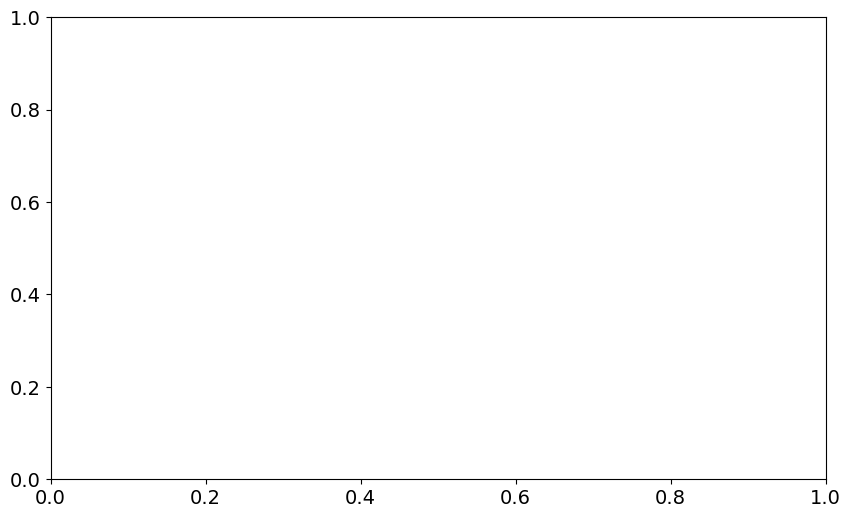

In [7]:
fig, ax = plt.subplots()
ax.plot(result.data['xpts'], result.data['avgi'])

Text(0, 0.5, 'Flux ch gain (DAC unit)')

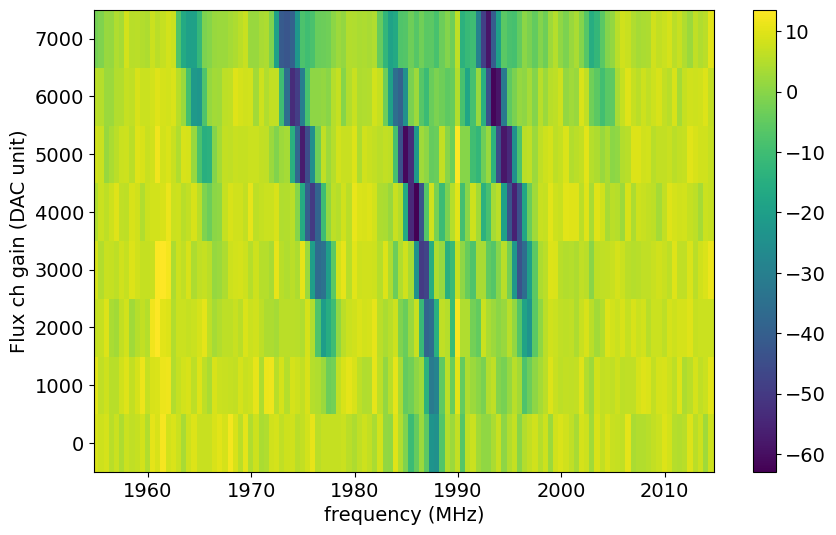

In [26]:
fig, ax = plt.subplots()
calib_res = total_res[0]
x = calib_res[0].data['xpts']
y = [res.cfg.expt['flux_drive_gain'] for res in calib_res]
z = [res.data['avgi'] for res in calib_res]
c = ax.pcolor(*np.meshgrid(x, y), z)
fig.colorbar(c)
ax.set_xlabel("frequency (MHz)")
ax.set_ylabel("Flux ch gain (DAC unit)")

## f0g1 Spectroscopy

In [ ]:
expt_params_default = AttrDict(dict(
    start=0.01, # us
    step=0.1,
    qubits=[0],
    length = 0.1,
    freqs = [], #MHz, dummy_list
    swept_params = ['freq'],
    gain = 3000,
    flux_freq = 10,
    flux_drive_gain = 1000,
    relax_delay = 2500,
    reps = 100,
    init_stor = 0,
    ro_stor = 0,
    prepulse = False,
    postpulse = False,
    active_reset = False,
    normalize = False,
    modulate_flux_at_core = False
))

calibration_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.QsimBaseExperiment,
    ExptProgram=meas.qsim.t2_cavity_fluxexcursion.AmplitudeCalibration,
    default_expt_cfg=expt_params_default,
    job_client=client,
)

In [18]:
def frequency_list_generator(center, bw, expts):
    
    start = center - bw/2
    step = bw / expts
    return np.arange(start, start + step * expts, step).tolist()

current_list = np.linspace(-1e-3, 1e-3, 41)
coup_spect = []
for current in current_list:
	result = calibration_runner.execute(
		freqs = frequency_list_generator(1990, 100, 100),
		flux_drive_gain = 0,
		modulate_flux = False,
		flux_freq = 50,
		coupler_current = round(current, 5),
        gain = 4000,
	)
	coup_spect.append(result)

Job submitted: JOB-20260428-00028 (queue position: 1)

[0.5s] Job JOB-20260428-00028: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260428-00028_QsimBaseExperiment.h5
[WORKER]   Program: AmplitudeCalibration from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to -1.0mA according to expt.cfg...

[69.1s] Job JOB-20260428-00028: failed
[WORKER] Done setting coupler current
  0%|                                                  | 0/100 [00:00<?, ?it/s]

Job failed: ValueError: cannot convert float NaN to integer
Traceback (most recent call last):
  File "D:\python\multimode_expts\job_server\worker.py", line 366, in _execute_job
    data_file_path, expt_pickle_path = self._run_experiment(ExptClass, expt_config, job)
                                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "D:\python\multimode_exp

RuntimeError: Job JOB-20260428-00028 failed: ValueError: cannot convert float NaN to integer
Traceback (most recent call last):
  File "D:\python\multimode_expts\job_server\worker.py", line 366, in _execute_job
    data_file_path, expt_pickle_path = self._run_experiment(ExptClass, expt_config, job)
                                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "D:\python\multimode_expts\job_server\worker.py", line 552, in _run_experiment
    expt.go(
  File "D:\python\multimode_expts\slab\experiment.py", line 166, in go
    data=self.acquire(progress)
         ^^^^^^^^^^^^^^^^^^^^^^
  File "D:\python\multimode_expts\experiments\qsim\qsim_base.py", line 365, in acquire
    self.prog = self.ProgramClass(soccfg=self.soccfg, cfg=self.cfg)
                ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "D:\python\multimode_expts\experiments\qsim\qsim_base.py", line 32, in __init__
    super().__init__(soccfg, cfg)
  File "D:\python\multimode_expts\experiments\MM_base.py", line 2202, in __init__
    AveragerProgram.__init__(self, soccfg, cfg)
  File "D:\python\qick\qick_lib\qick\averager_program.py", line 29, in __init__
    self.make_program()
  File "D:\python\qick\qick_lib\qick\averager_program.py", line 65, in make_program
    p.body()
  File "D:\python\multimode_expts\experiments\qsim\qsim_base.py", line 139, in body
    self.active_reset(**params)
  File "D:\python\multimode_expts\experiments\MM_base.py", line 1711, in active_reset
    self.man_stor_swap(man_idx=man_idx, stor_idx=stor_idx) #self.man_stor_swap(1, ii+1)
    ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "D:\python\multimode_expts\experiments\MM_base.py", line 955, in man_stor_swap
    self.custom_pulse(self.cfg, creator.pulse, prefix='Storage' + str(stor_idx) + 'dump')
  File "D:\python\multimode_expts\experiments\MM_base.py", line 472, in custom_pulse
    length=self.us2cycles(pulse_data[2][jj],
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "D:\python\qick\qick_lib\qick\qick_asm.py", line 630, in us2cycles
    return to_int(obtain(us), fclk, parname='length')
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "D:\python\qick\qick_lib\qick\helpers.py", line 40, in to_int
    return int(quantize * np.round(val*scale/quantize))
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
ValueError: cannot convert float NaN to integer


In [25]:
import pickle
# D:\experiments\260403_kerr_excusion_redone\expt_objs\JOB-20260414-00178_expt.pkl
base_dir = "D:\\experiments\\260403_kerr_excusion_redone\\expt_objs\\"
pkl_files = [
    # "JOB-20260224-00259_expt.pkl", #S1
    # "JOB-20260224-00261_expt.pkl"  #S7
    # # "JOB-20260224-00247_expt.pkl", #S1
    # # "JOB-20260224-00251_expt.pkl"  #S7
]

for i in range(33, 74, 1):
    try:
        if i <100:
            pkl_files.append(f"JOB-20260416-000{i}_expt.pkl")
        else:
            pkl_files.append(f"JOB-20260416-000{i}_expt.pkl")
    except:
        pass
coup_spect = []
for i, pkl_file in enumerate(pkl_files):
    try:
        with open(base_dir+pkl_file, "rb") as f:
            coup_spect.append( pickle.load(f))
    except:
        pass
current_list = np.linspace(-1e-3, 1e-3, 41)[0:len(coup_spect)]

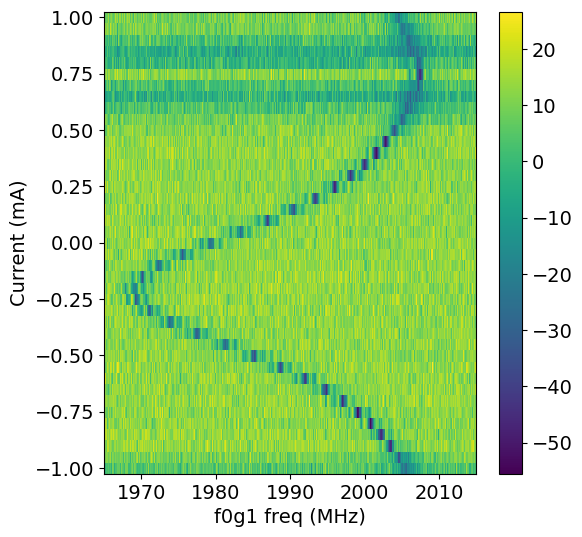

In [26]:
data = []
freq_array = np.array(coup_spect[0].cfg.expt.freqs)
for idx, each_trace in enumerate(coup_spect):
    data.append(each_trace.data['avgi'])
data = np.array(data)
fig, ax =  plt.subplots(figsize = (6, 6))
c = ax.pcolor(*np.meshgrid(freq_array, current_list * 1e3), data)
ax.set_xlabel("f0g1 freq (MHz)")
ax.set_ylabel("Current (mA)")
fig.colorbar(c, ax = ax)

In [28]:
print("dip_freqs_list =", dip_freqs.tolist())
print("current_list =", (np.round(current_list, 5)).tolist())

dip_freqs_list = [2005.4999999999632, 2004.599999999964, 2003.499999999965, 2002.399999999966, 2000.7999999999674, 1999.099999999969, 1997.0999999999708, 1994.8999999999728, 1991.8999999999755, 1988.7999999999784, 1985.2999999999815, 1981.2999999999852, 1977.4999999999886, 1973.799999999992, 1971.0999999999945, 1969.299999999996, 1969.1999999999962, 1970.1999999999953, 1972.3999999999933, 1975.5999999999904, 1979.399999999987, 1983.3999999999833, 1986.99999999998, 1990.5999999999767, 1993.499999999974, 1995.9999999999718, 1998.1999999999698, 1999.9999999999682, 2001.6999999999666, 2002.8999999999655, 2004.0999999999644, 2004.9999999999636, 2005.8999999999628, 2006.1999999999625, 2007.2999999999615, 2007.4999999999613, 2007.1999999999616, 2006.1999999999625, 2006.0999999999626, 2005.4999999999632, 2004.599999999964]
current_list = [-0.001, -0.00095, -0.0009, -0.00085, -0.0008, -0.00075, -0.0007, -0.00065, -0.0006, -0.00055, -0.0005, -0.00045, -0.0004, -0.00035, -0.0003, -0.00025, -0.000

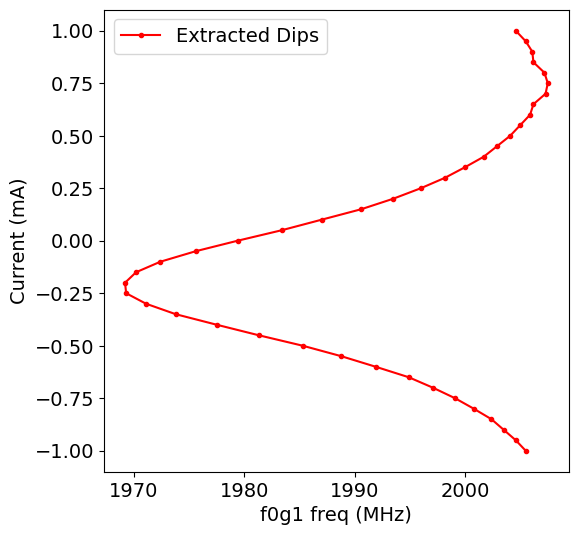

In [27]:
dip_indices = np.argmin(data, axis=1)

dip_freqs = freq_array[dip_indices]

fig, ax = plt.subplots(figsize=(6, 6))

ax.plot(dip_freqs, current_list * 1e3, marker='o', markersize=3, linestyle='-', color='red', label='Extracted Dips')

ax.set_xlabel("f0g1 freq (MHz)")
ax.set_ylabel("Current (mA)")
ax.legend()

plt.show()

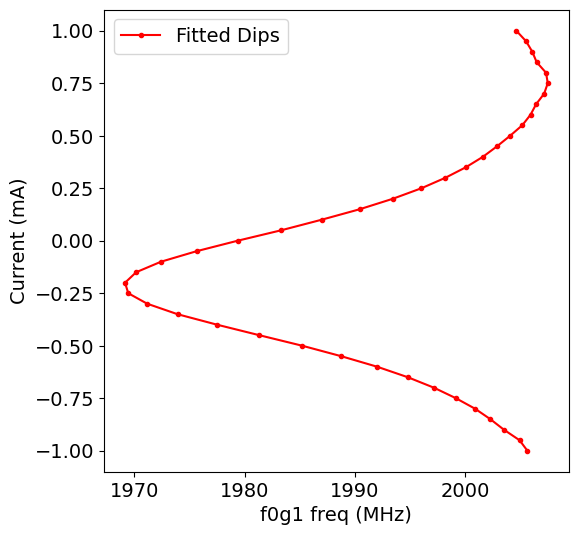

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

def lorfunc(x, *p):
    y0, yscale, x0, xscale = p
    return y0 + yscale/(1+(x-x0)**2/xscale**2)

fitted_dip_freqs = []

for idx, row_data in enumerate(data):
    idx_min = np.argmin(row_data)
    x0_guess = freq_array[idx_min]
    
    y0_guess = np.median(row_data)
    
    yscale_guess = row_data[idx_min] - y0_guess
    
    xscale_guess = 2.0 
    
    p0 = [y0_guess, yscale_guess, x0_guess, xscale_guess]
    
    try:
        popt, pcov = curve_fit(lorfunc, freq_array, row_data, p0=p0, maxfev=10000)
        
        fit_x0 = popt[2]
        fitted_dip_freqs.append(fit_x0)
        
    except Exception as e:
        print(f"Fit failed at index {idx}, falling back to argmin.")
        fitted_dip_freqs.append(x0_guess)

fitted_dip_freqs = np.array(fitted_dip_freqs)

fig, ax = plt.subplots(figsize=(6, 6))

ax.plot(fitted_dip_freqs, current_list * 1e3, marker='o', markersize=3, 
        linestyle='-', color='red', label='Fitted Dips')

ax.set_xlabel("f0g1 freq (MHz)")
ax.set_ylabel("Current (mA)")
ax.legend()

plt.show()

## Transition Prob with Kerr Excursion

In [3]:
expt_params_default = AttrDict(dict(
    start=0.01, # us
    step=0.1,
    qubits=[0],
    length = 1,
    freqs = [], #MHz, dummy_list
    swept_params = ['kerr_gain', 'kerr_length'],
    gain = 3000,
    kerr_gains = [0],
    kerr_freq = 200,
    kerr_lengths = np.linspace(0.007, 10, 101),
    use_flat_top = True,
    relax_delay = 2500,
    reps = 100,
    init_stor = 0,
    ro_stor = 0,
    prepulse = False,
    postpulse = False,
    active_reset = False,
    normalize = False
))

kerrtransitionpinvrunner = CharacterizationRunner(
    station=station,
    ExptClass=meas.QsimBaseExperiment,
    ExptProgram=meas.qsim.t2_cavity_fluxexcursion.ExcursionTransitionDebuggingProgram,
    default_expt_cfg=expt_params_default,
    job_client=client,
)

In [9]:
kerr_gains = np.arange(0, 20001, 2000).tolist()
# kerr_gains = [13000]
trans_result_list = []
for kg in tqdm(kerr_gains):
	trans_result = kerrtransitionpinvrunner.execute(
		# kerr_lengths = np.linspace(0.007, 10, 101).tolist(),
		kerr_lengths = np.arange(0.1, 10, 0.5).tolist(),
		kerr_gains = [kg],
		reps = 100,
		active_reset = True,
		man_reset = True,
		storage_reset = False,
		reset_dump_mode = 1,
		relax_delay = 20,
    	kerr_freq = 10,
		debug = False,
		prepulse = False,
		init_fock = False,
		init_man_fock_state = '1',
		skip_all = False,
  		# flat_top_sigma = 0.2
	)
	trans_result_list.append(trans_result)

  0%|          | 0/11 [00:00<?, ?it/s]

Job submitted: JOB-20260427-00238 (queue position: 1)

[0.1s] Job JOB-20260427-00238: pending

[2.1s] Job JOB-20260427-00238: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260427-00238_QsimBaseExperiment.h5
[WORKER]   Program: ExcursionTransitionDebuggingProgram from experiments.qsim.t2_cavity_fluxexcursion

[INTERRUPT] Keyboard interrupt received for job JOB-20260427-00238
[INTERRUPT] ERROR: Job is currently running on worker
[INTERRUPT] Cannot interrupt running jobs remotely
[INTERRUPT] The job will continue running until completion
[INTERRUPT] Check status later with: client.get_status('JOB-20260427-00238')


KeyboardInterrupt: 

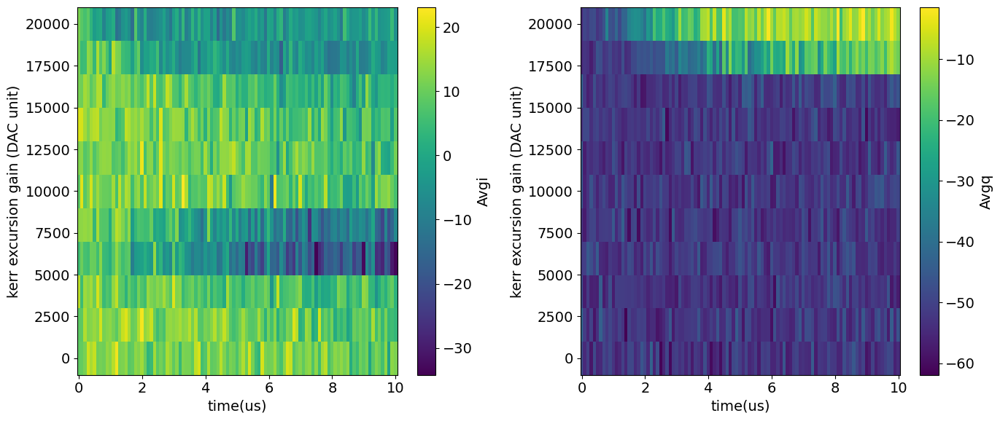

In [23]:
x_data = trans_result_list[0].data['xpts']
y_data = [result.cfg.expt.kerr_gains[0] for result in trans_result_list]
z_data_i = [result.data['avgi'][0] for result in trans_result_list]
z_data_q = [result.data['avgq'][0] for result in trans_result_list]

fig, ax = plt.subplots(1, 2, figsize = (14, 6))
c = ax[0].pcolor(*np.meshgrid(x_data, y_data), z_data_i)
ax[0].set_xlabel("time(us)")
ax[0].set_ylabel("kerr excursion gain (DAC unit)")
fig.colorbar(c, ax = ax[0], label = "Avgi")
c = ax[1].pcolor(*np.meshgrid(x_data, y_data), z_data_q)
ax[1].set_xlabel("time(us)")
ax[1].set_ylabel("kerr excursion gain (DAC unit)")
fig.colorbar(c, ax = ax[1], label = "Avgq")
fig.tight_layout()

#### fine gain sweep

In [59]:
kerr_lengths = np.arange(1.0, 11.0, 1.0).tolist()
# kerr_gains = [13000]
trans_result_list = []
for kl in tqdm(kerr_lengths):
	trans_result = kerrtransitionpinvrunner.execute(
		kerr_lengths = [kl],
		kerr_gains = np.arange(0, 30001, 200).tolist(),
		reps = 100,
		active_reset = True,
		man_reset = True,
		storage_reset = False,
		reset_dump_mode = 1,
		swept_params = ['kerr_gain', 'kerr_length'],
		relax_delay = 20,
    	kerr_freq = 30,
		debug = True,
		prepulse = False,
		init_fock = False,
		init_man_fock_state = '1',
		skip_all = False,
  		# flat_top_sigma = 0.2
	)
	trans_result_list.append(trans_result)

  0%|          | 0/10 [00:00<?, ?it/s]

Job submitted: JOB-20260424-00483 (queue position: 1)

[0.2s] Job JOB-20260424-00483: pending

[2.2s] Job JOB-20260424-00483: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260424-00483_QsimBaseExperiment.h5
[WORKER]   Program: ExcursionTransitionDebuggingProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.25mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
  0%|                                                  | 0/151 [00:00<?, ?it/s]kerr pulse length = 1.0
performing prep manipulate photon pulse
performing kerr pulse
performing man pi and qubit ef
  1%|▎                                         | 1/151 [00:00<00:41,  3.59it/s]kerr pulse length = 1.0
performing prep manipulate photon pulse
performing kerr pulse
performing man pi and qubit ef
  1%|▌                                         | 2/1

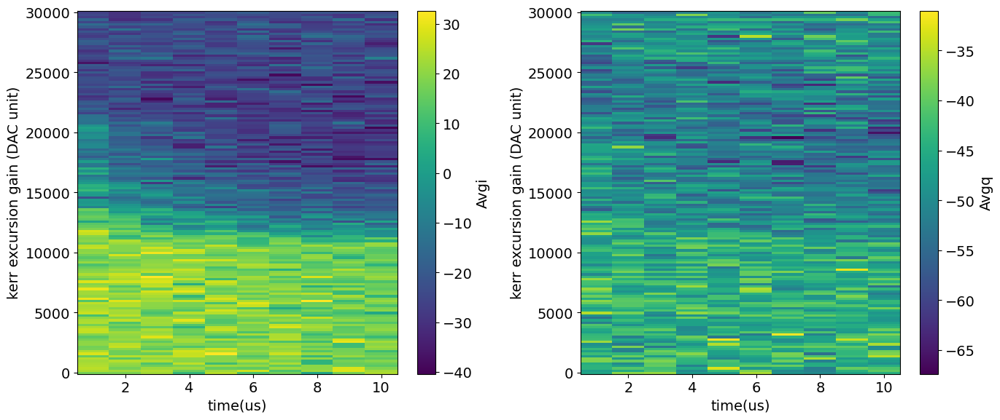

In [32]:
x_data = kerr_lengths
y_data = trans_result_list[0].data['ypts']
z_data_i = [result.data['avgi'][ :, 0] for result in trans_result_list]
z_data_q = [result.data['avgq'][ :, 0] for result in trans_result_list]

fig, ax = plt.subplots(1, 2, figsize = (14, 6)) 
c = ax[0].pcolor(*np.meshgrid(x_data, y_data), np.transpose(z_data_i))
ax[0].set_xlabel("time(us)")
ax[0].set_ylabel("kerr excursion gain (DAC unit)")
fig.colorbar(c, ax = ax[0], label = "Avgi")
c = ax[1].pcolor(*np.meshgrid(x_data, y_data), np.transpose(z_data_q))
ax[1].set_xlabel("time(us)")
ax[1].set_ylabel("kerr excursion gain (DAC unit)")
fig.colorbar(c, ax = ax[1], label = "Avgq")
fig.tight_layout()

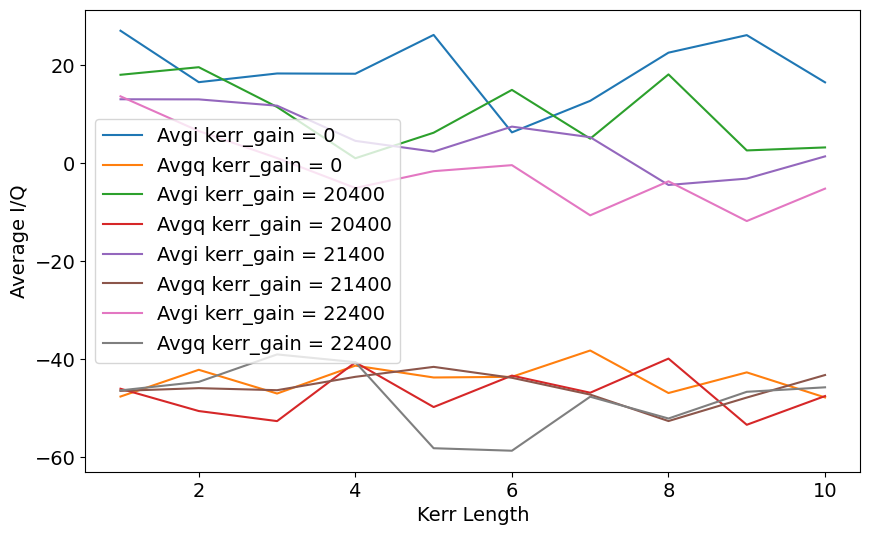

In [20]:
idx_to_plot = [0, -49, -44, -39]
for idx in idx_to_plot:
	plt.plot(kerr_lengths, [trans_result_list[idxx].data['avgi'][idx, 0] for idxx in range(len(trans_result_list))], label = f"Avgi kerr_gain = {trans_result_list[0].cfg.expt.kerr_gains[idx]}")
	plt.plot(kerr_lengths, [trans_result_list[idxx].data['avgq'][idx, 0] for idxx in range(len(trans_result_list))], label = f"Avgq kerr_gain = {trans_result_list[0].cfg.expt.kerr_gains[idx]}")
	plt.xlabel('Kerr Length')
	plt.ylabel('Average I/Q')
	plt.legend()
	# plt.title(f"kerr_gain = {trans_result_list[0].cfg.expt.kerr_gains[idx]}")
plt.show()

### Freq vs Gain

  0%|          | 0/10 [00:00<?, ?it/s]

Job submitted: JOB-20260430-00147 (queue position: 1)

[0.1s] Job JOB-20260430-00147: pending

[184.0s] Job JOB-20260430-00147: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260430-00147_QsimBaseExperiment.h5
[WORKER]   Program: ExcursionTransitionDebuggingProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to -0.213mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
  0%|                                                  | 0/151 [00:00<?, ?it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debugging purpose
  1%|▎                                         | 1/151 [00:00<01:31,  1.64it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debugging purpose
  1%|▌                                         | 2/151 [00:01<01:30,  1.65it/s]kerr pulse length = 10
performing ONLY kerr pulse f

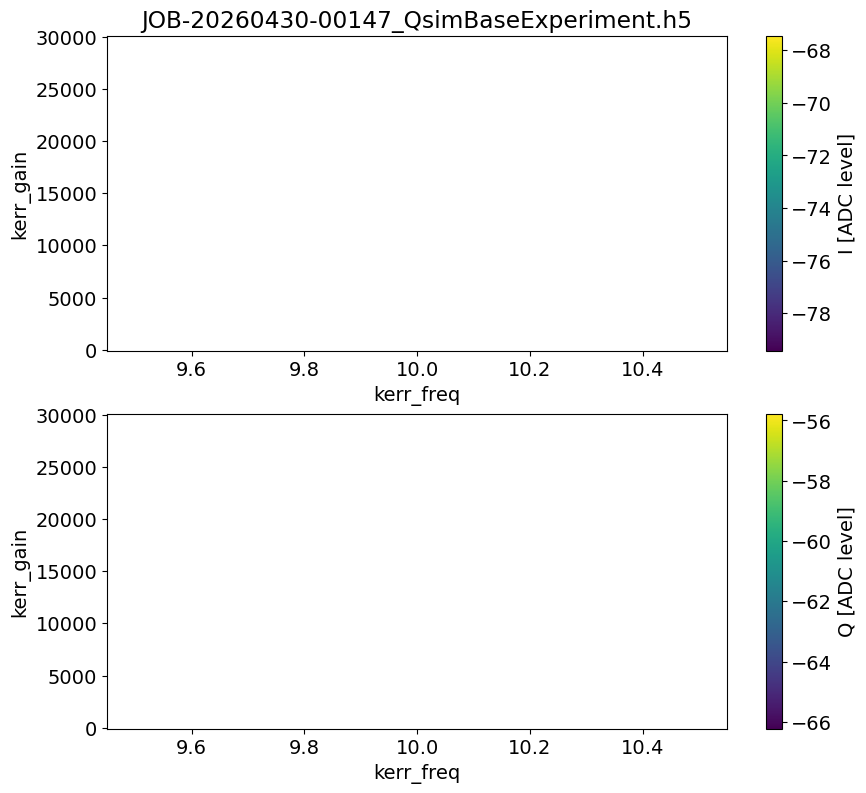

[log_measurement] vault_root not configured; skipping. Add 'data_management.vault_root: <path>' to the hardware config.
Job submitted: JOB-20260430-00149 (queue position: 1)

[0.1s] Job JOB-20260430-00149: pending

[228.3s] Job JOB-20260430-00149: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260430-00149_QsimBaseExperiment.h5
[WORKER]   Program: ExcursionTransitionDebuggingProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to -0.213mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
  0%|                                                  | 0/151 [00:00<?, ?it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debugging purpose
  1%|▎                                         | 1/151 [00:00<01:34,  1.58it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debugging purpose
  1%|▌    

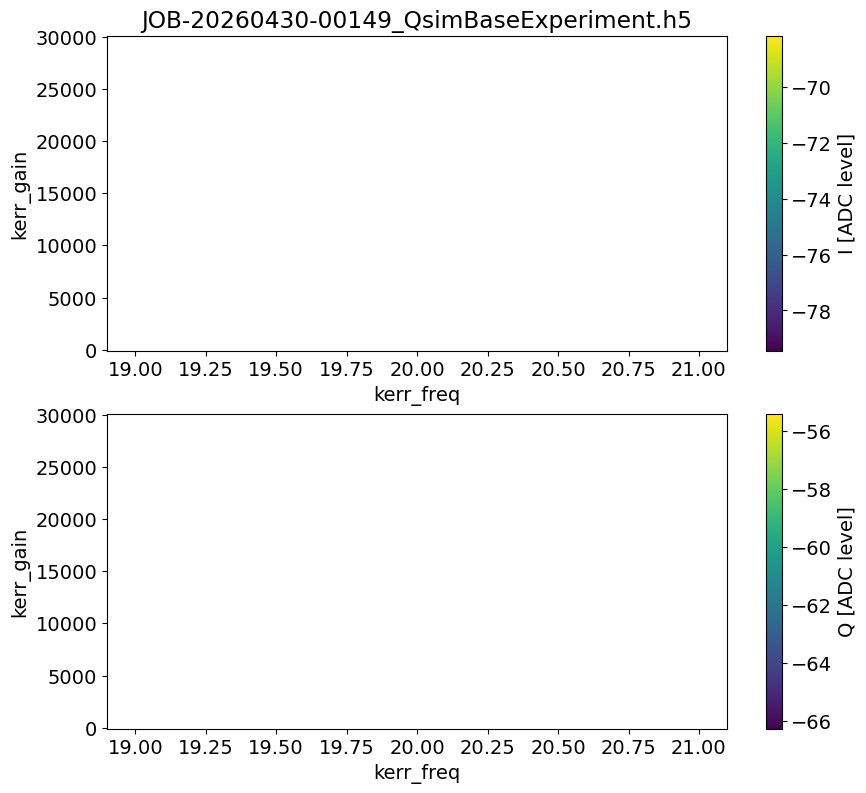

[log_measurement] vault_root not configured; skipping. Add 'data_management.vault_root: <path>' to the hardware config.
Job submitted: JOB-20260430-00151 (queue position: 1)

[0.1s] Job JOB-20260430-00151: pending

[236.1s] Job JOB-20260430-00151: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260430-00151_QsimBaseExperiment.h5
[WORKER]   Program: ExcursionTransitionDebuggingProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to -0.213mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
  0%|                                                  | 0/151 [00:00<?, ?it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debugging purpose
  1%|▎                                         | 1/151 [00:00<01:32,  1.63it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debugging purpose
  1%|▌    

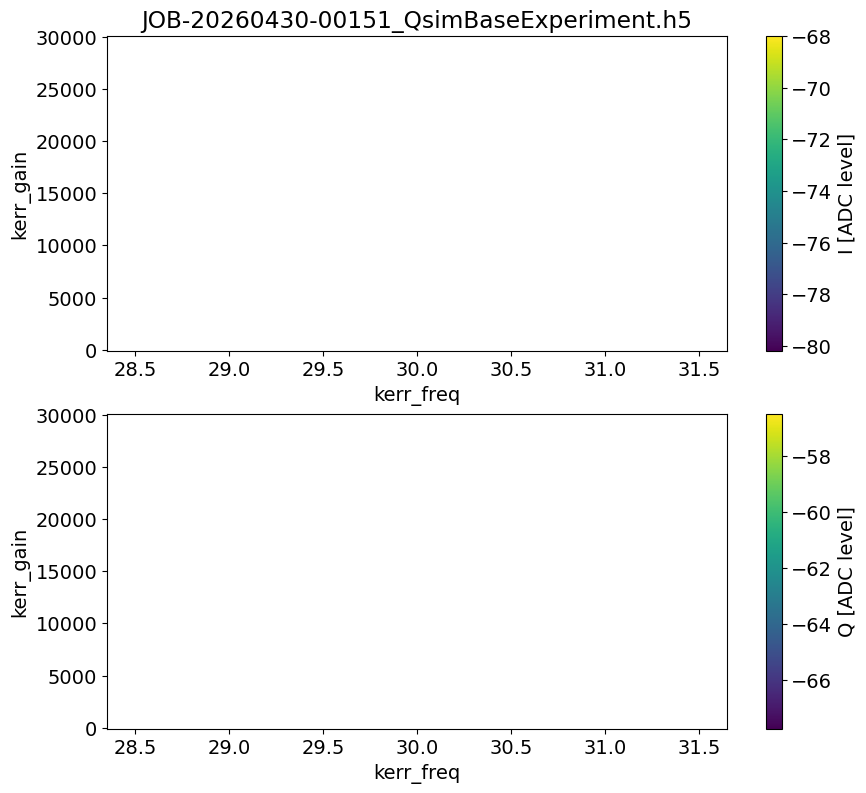

[log_measurement] vault_root not configured; skipping. Add 'data_management.vault_root: <path>' to the hardware config.
Job submitted: JOB-20260430-00152 (queue position: 1)

[0.1s] Job JOB-20260430-00152: pending

[2.6s] Job JOB-20260430-00152: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260430-00152_QsimBaseExperiment.h5
[WORKER]   Program: ExcursionTransitionDebuggingProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to -0.213mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
  0%|                                                  | 0/151 [00:00<?, ?it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debugging purpose
  1%|▎                                         | 1/151 [00:00<01:31,  1.64it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debugging purpose
  1%|▌      

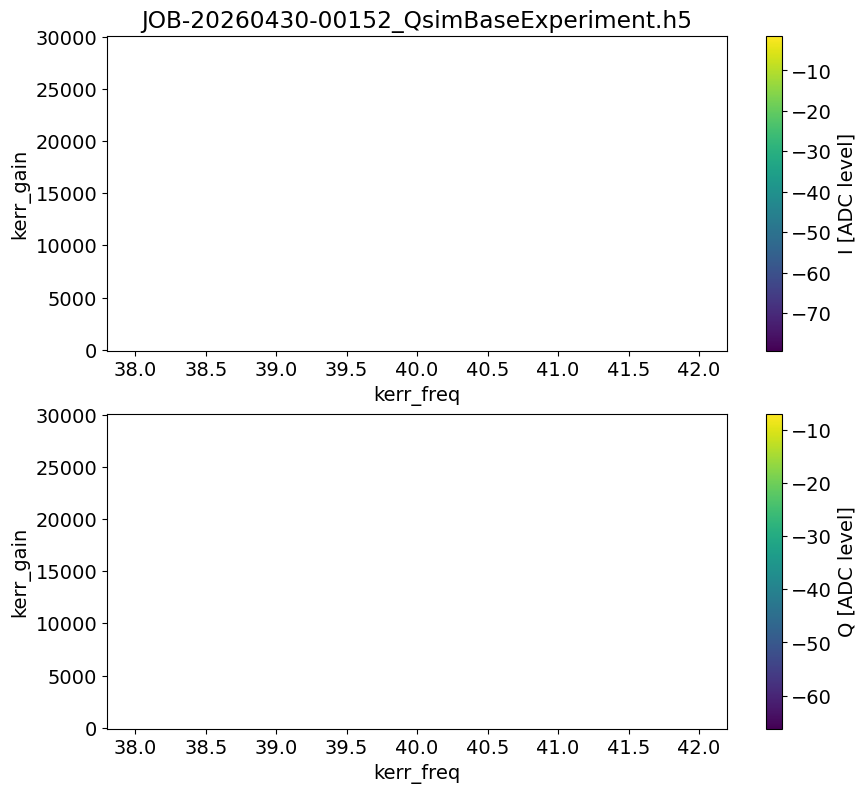

[log_measurement] vault_root not configured; skipping. Add 'data_management.vault_root: <path>' to the hardware config.
Job submitted: JOB-20260430-00153 (queue position: 1)

[0.3s] Job JOB-20260430-00153: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260430-00153_QsimBaseExperiment.h5
[WORKER]   Program: ExcursionTransitionDebuggingProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to -0.213mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
  0%|                                                  | 0/151 [00:00<?, ?it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debugging purpose
  1%|▎                                         | 1/151 [00:00<01:31,  1.65it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debugging purpose
  1%|▌                                         | 2/1

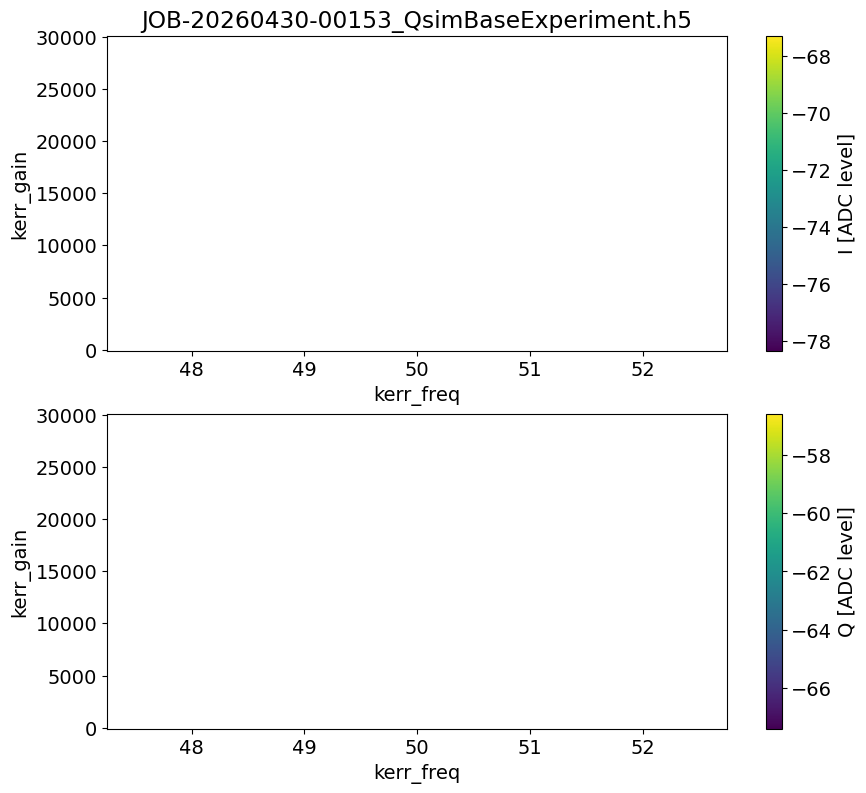

[log_measurement] vault_root not configured; skipping. Add 'data_management.vault_root: <path>' to the hardware config.
Job submitted: JOB-20260430-00155 (queue position: 1)

[0.2s] Job JOB-20260430-00155: pending

[428.3s] Job JOB-20260430-00155: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260430-00155_QsimBaseExperiment.h5
[WORKER]   Program: ExcursionTransitionDebuggingProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to -0.213mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
  0%|                                                  | 0/151 [00:00<?, ?it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debugging purpose
  1%|▎                                         | 1/151 [00:00<01:31,  1.64it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debugging purpose
  1%|▌    

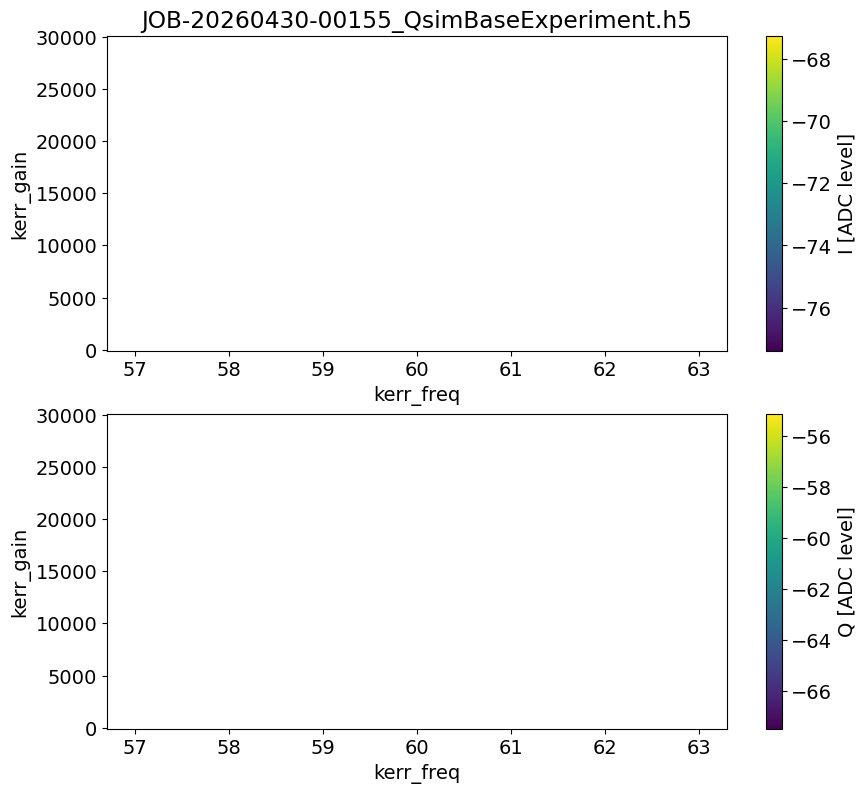

[log_measurement] vault_root not configured; skipping. Add 'data_management.vault_root: <path>' to the hardware config.
Job submitted: JOB-20260430-00157 (queue position: 1)

[0.1s] Job JOB-20260430-00157: pending

[427.6s] Job JOB-20260430-00157: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260430-00157_QsimBaseExperiment.h5
[WORKER]   Program: ExcursionTransitionDebuggingProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to -0.213mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
  0%|                                                  | 0/151 [00:00<?, ?it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debugging purpose
  1%|▎                                         | 1/151 [00:00<01:31,  1.64it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debugging purpose
  1%|▌    

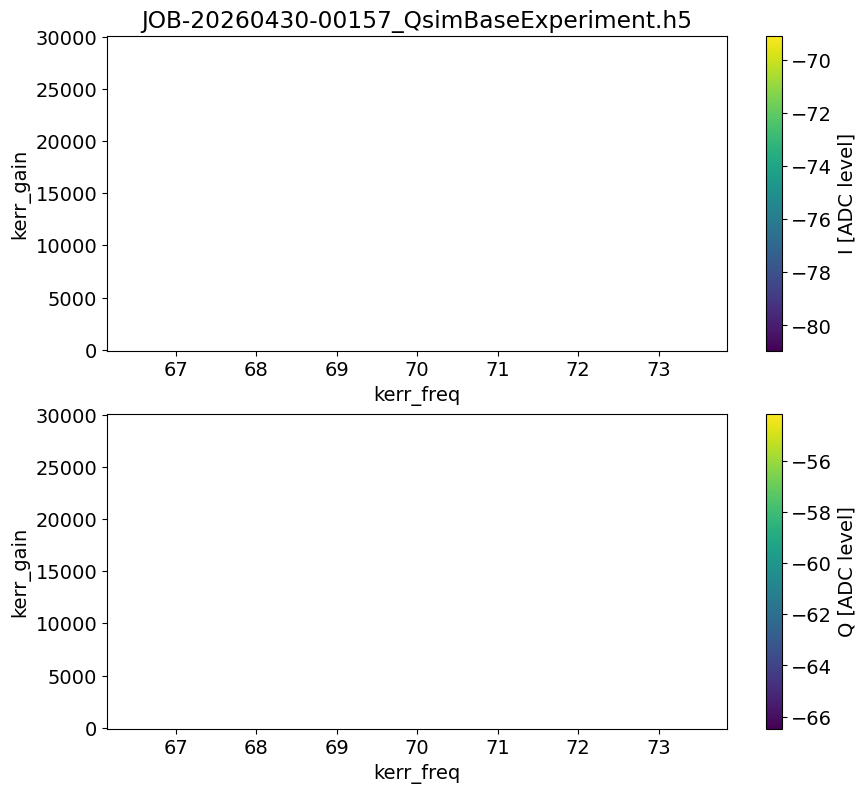

[log_measurement] vault_root not configured; skipping. Add 'data_management.vault_root: <path>' to the hardware config.
Job submitted: JOB-20260430-00159 (queue position: 1)

[0.1s] Job JOB-20260430-00159: pending

[438.8s] Job JOB-20260430-00159: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260430-00159_QsimBaseExperiment.h5
[WORKER]   Program: ExcursionTransitionDebuggingProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to -0.213mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
  0%|                                                  | 0/151 [00:00<?, ?it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debugging purpose
  1%|▎                                         | 1/151 [00:00<01:34,  1.58it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debugging purpose
  1%|▌    

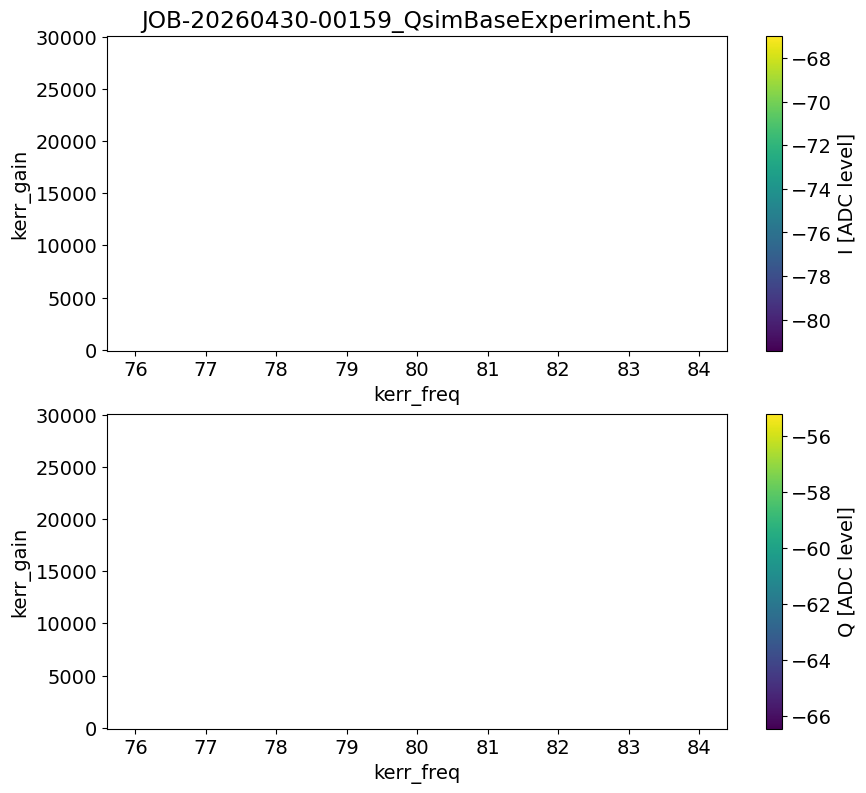

[log_measurement] vault_root not configured; skipping. Add 'data_management.vault_root: <path>' to the hardware config.
Job submitted: JOB-20260430-00161 (queue position: 1)

[0.1s] Job JOB-20260430-00161: pending

[433.5s] Job JOB-20260430-00161: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260430-00161_QsimBaseExperiment.h5
[WORKER]   Program: ExcursionTransitionDebuggingProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to -0.213mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
  0%|                                                  | 0/151 [00:00<?, ?it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debugging purpose
  1%|▎                                         | 1/151 [00:00<01:39,  1.51it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debugging purpose
  1%|▌    

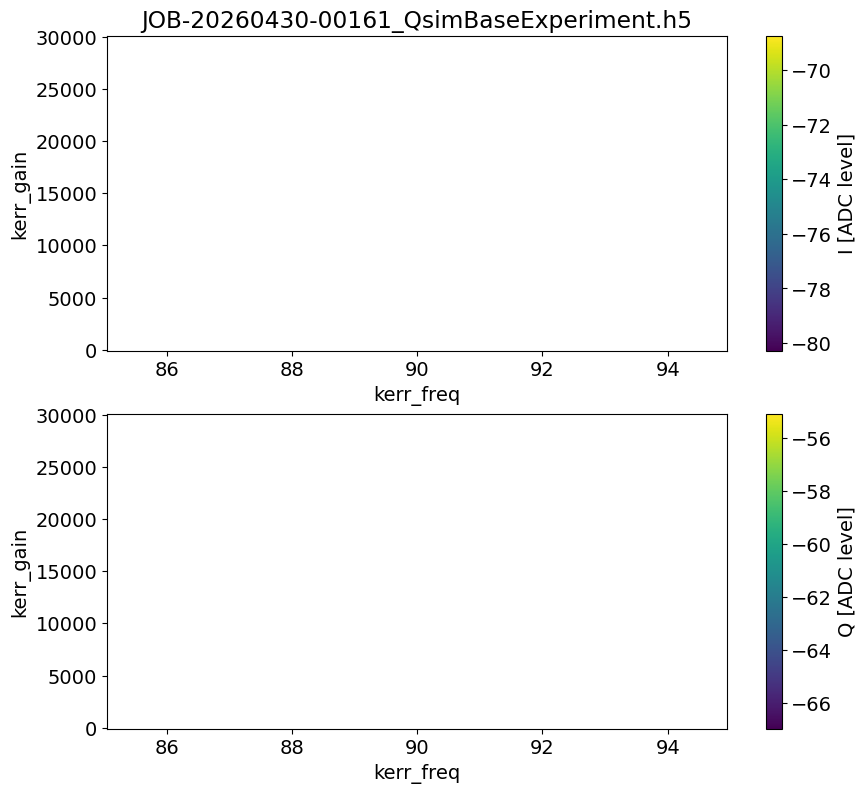

[log_measurement] vault_root not configured; skipping. Add 'data_management.vault_root: <path>' to the hardware config.
Job submitted: JOB-20260430-00163 (queue position: 1)

[0.2s] Job JOB-20260430-00163: pending

[432.6s] Job JOB-20260430-00163: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260430-00163_QsimBaseExperiment.h5
[WORKER]   Program: ExcursionTransitionDebuggingProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to -0.213mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
  0%|                                                  | 0/151 [00:00<?, ?it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debugging purpose
  1%|▎                                         | 1/151 [00:00<01:33,  1.61it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debugging purpose
  1%|▌    

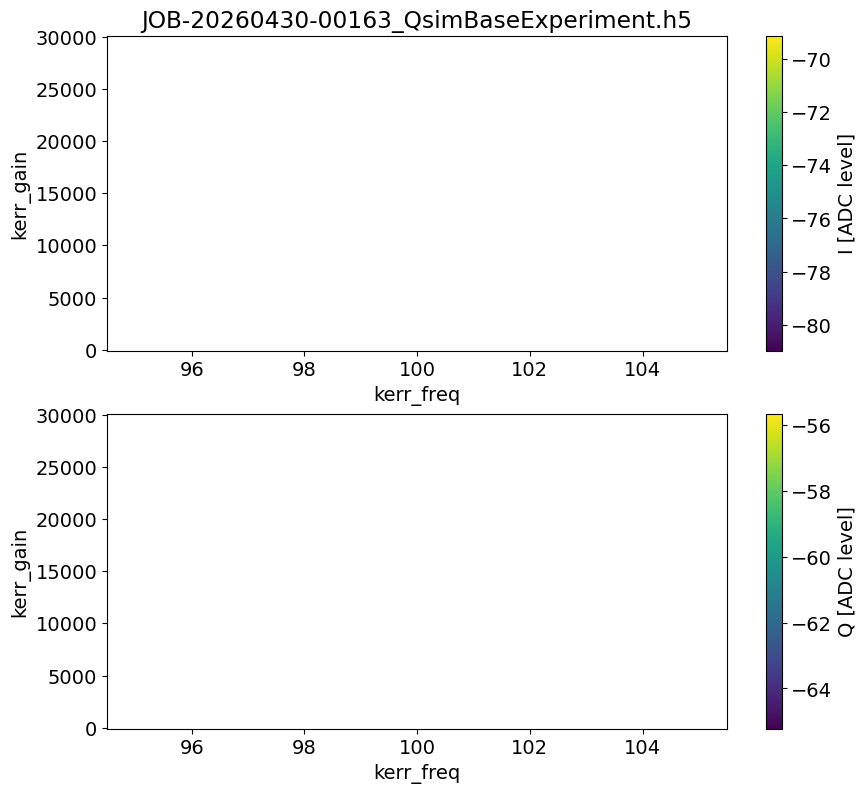

[log_measurement] vault_root not configured; skipping. Add 'data_management.vault_root: <path>' to the hardware config.


In [15]:
kerr_freqs = np.arange(10.0, 101.0, 10.0).tolist()
# kerr_gains = [13000]
trans_result_list = []
for kf in tqdm(kerr_freqs):
	trans_result = kerrtransitionpinvrunner.execute(
		kerr_length = 10,
		kerr_gains = np.arange(0, 30001, 200).tolist(),
		reps = 200,
		active_reset = False,
		man_reset = True,
		storage_reset = False,
		reset_dump_mode = 1,
		swept_params = ['kerr_gain', 'kerr_freq'],
		relax_delay = 2500,
    	kerr_freqs = [kf],
		debug = True,
		prepulse = False,
		init_fock = False,
		init_man_fock_state = '1',
  		skip_man_conv = True,
		skip_gef = False,
		skip_all = False,
		skip_prep_man = True,
		only_flux_excursion = True,
		kerr_nqz = 1,
		# coupler_current = 0.3e-3,
  		# flat_top_sigma = 0.2
	)
	trans_result_list.append(trans_result)

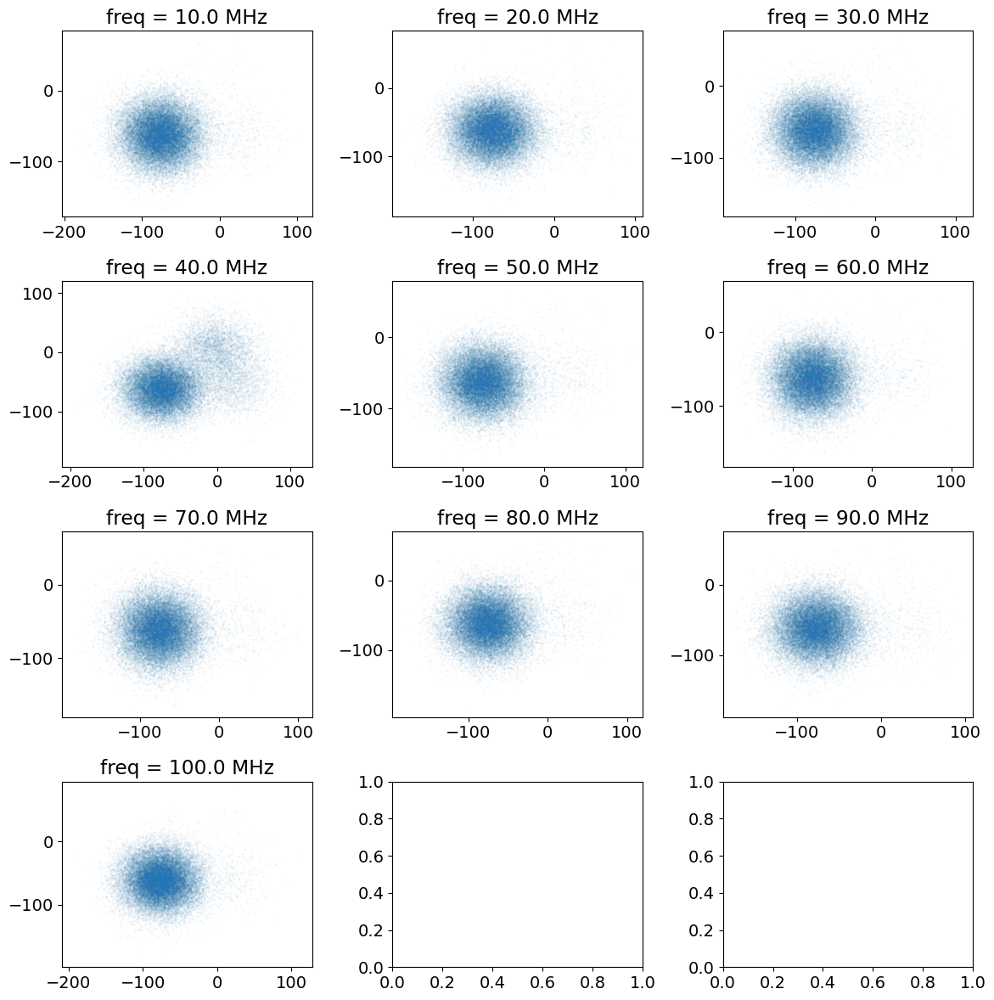

In [18]:
fig, ax = plt.subplots(4, 3, figsize = (12, 12))

for i in range(len(trans_result_list)):
	ax[i // 3, i % 3].scatter(trans_result_list[i].data['idata'], trans_result_list[i].data['qdata'], s = 0.1, alpha = 0.1)
	ax[i // 3, i % 3].set_title(f"freq = {kerr_freqs[i]} MHz")
fig.tight_layout()

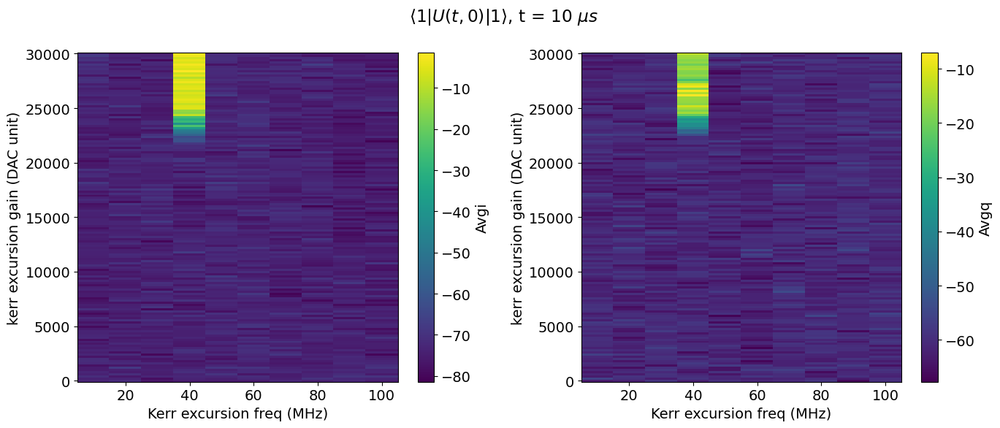

In [17]:
x_data = kerr_freqs
y_data = trans_result_list[0].data['ypts']
z_data_i = [result.data['avgi'][ :, 0] for result in trans_result_list]
z_data_q = [result.data['avgq'][ :, 0] for result in trans_result_list]

fig, ax = plt.subplots(1, 2, figsize = (14, 6)) 
c = ax[0].pcolor(*np.meshgrid(x_data, y_data), np.transpose(z_data_i))
ax[0].set_xlabel("Kerr excursion freq (MHz)")
ax[0].set_ylabel("kerr excursion gain (DAC unit)")
# ax[0].set_ylim(0, 20000)
fig.colorbar(c, ax = ax[0], label = "Avgi")
c = ax[1].pcolor(*np.meshgrid(x_data, y_data), np.transpose(z_data_q))
ax[1].set_xlabel("Kerr excursion freq (MHz)")
ax[1].set_ylabel("kerr excursion gain (DAC unit)")
# ax[1].set_ylim(0, 20000)
fig.colorbar(c, ax = ax[1], label = "Avgq")
fig.suptitle("$\\langle 1 |U(t, 0)| 1 \\rangle$, t = 10 $\\mu s$")
fig.tight_layout()

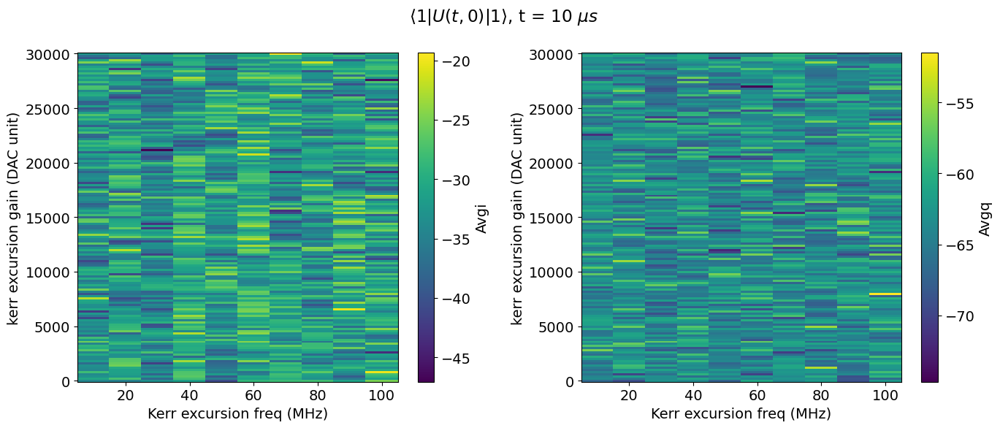

In [25]:
x_data = kerr_freqs
y_data = trans_result_list[0].data['ypts']
z_data_i = [result.data['avgi'][ :, 0] for result in trans_result_list]
z_data_q = [result.data['avgq'][ :, 0] for result in trans_result_list]

fig, ax = plt.subplots(1, 2, figsize = (14, 6)) 
c = ax[0].pcolor(*np.meshgrid(x_data, y_data), np.transpose(z_data_i))
ax[0].set_xlabel("Kerr excursion freq (MHz)")
ax[0].set_ylabel("kerr excursion gain (DAC unit)")
# ax[0].set_ylim(0, 20000)
fig.colorbar(c, ax = ax[0], label = "Avgi")
c = ax[1].pcolor(*np.meshgrid(x_data, y_data), np.transpose(z_data_q))
ax[1].set_xlabel("Kerr excursion freq (MHz)")
ax[1].set_ylabel("kerr excursion gain (DAC unit)")
# ax[1].set_ylim(0, 20000)
fig.colorbar(c, ax = ax[1], label = "Avgq")
fig.suptitle("$\\langle 1 |U(t, 0)| 1 \\rangle$, t = 10 $\\mu s$")
fig.tight_layout()

  0%|          | 0/10 [00:00<?, ?it/s]

Job submitted: JOB-20260430-00168 (queue position: 1)

[0.1s] Job JOB-20260430-00168: pending

[350.2s] Job JOB-20260430-00168: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260430-00168_QsimBaseExperiment.h5
[WORKER]   Program: ExcursionTransitionDebuggingProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to -0.213mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
  0%|                                                  | 0/151 [00:00<?, ?it/s]kerr pulse length = 10
performing prep manipulate photon pulse
performing kerr pulse
performing man pi and qubit ef
  1%|▎                                         | 1/151 [00:00<01:40,  1.49it/s]kerr pulse length = 10
performing prep manipulate photon pulse
performing kerr pulse
performing man pi and qubit ef
  1%|▌                                         | 2

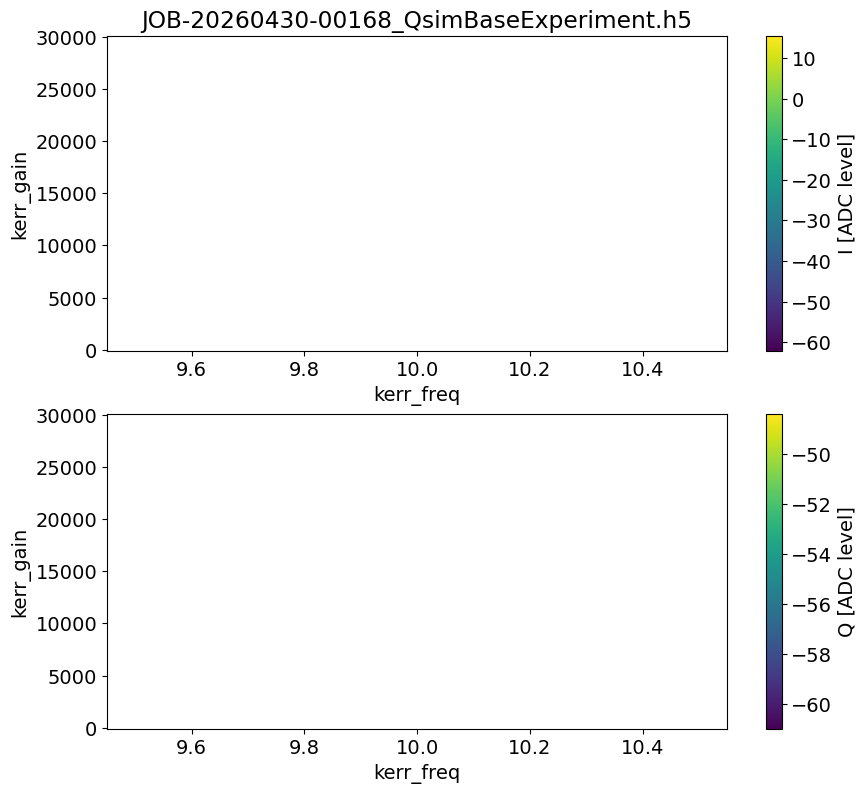

[log_measurement] vault_root not configured; skipping. Add 'data_management.vault_root: <path>' to the hardware config.
Job submitted: JOB-20260430-00170 (queue position: 1)

[0.1s] Job JOB-20260430-00170: pending

[427.7s] Job JOB-20260430-00170: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260430-00170_QsimBaseExperiment.h5
[WORKER]   Program: ExcursionTransitionDebuggingProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to -0.213mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
  0%|                                                  | 0/151 [00:00<?, ?it/s]kerr pulse length = 10
performing prep manipulate photon pulse
performing kerr pulse
performing man pi and qubit ef
  1%|▎                                         | 1/151 [00:00<01:36,  1.55it/s]kerr pulse length = 10
performing prep manipul

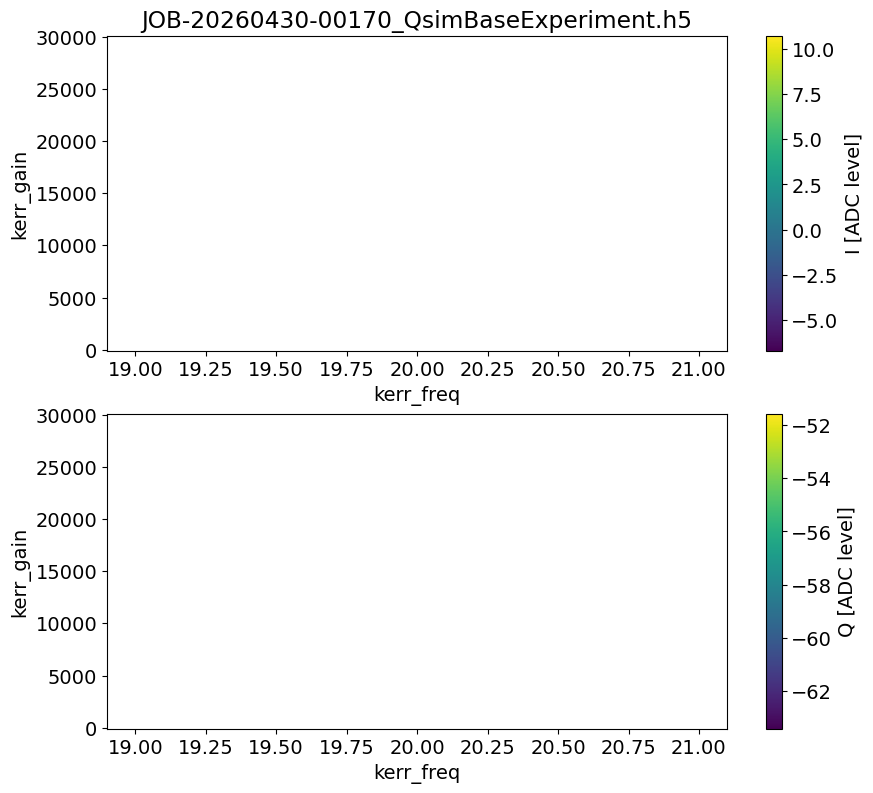

[log_measurement] vault_root not configured; skipping. Add 'data_management.vault_root: <path>' to the hardware config.
Job submitted: JOB-20260430-00172 (queue position: 1)

[0.1s] Job JOB-20260430-00172: pending

[425.8s] Job JOB-20260430-00172: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260430-00172_QsimBaseExperiment.h5
[WORKER]   Program: ExcursionTransitionDebuggingProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to -0.213mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
  0%|                                                  | 0/151 [00:00<?, ?it/s]kerr pulse length = 10
performing prep manipulate photon pulse
performing kerr pulse
performing man pi and qubit ef
  1%|▎                                         | 1/151 [00:00<01:35,  1.57it/s]kerr pulse length = 10
performing prep manipul

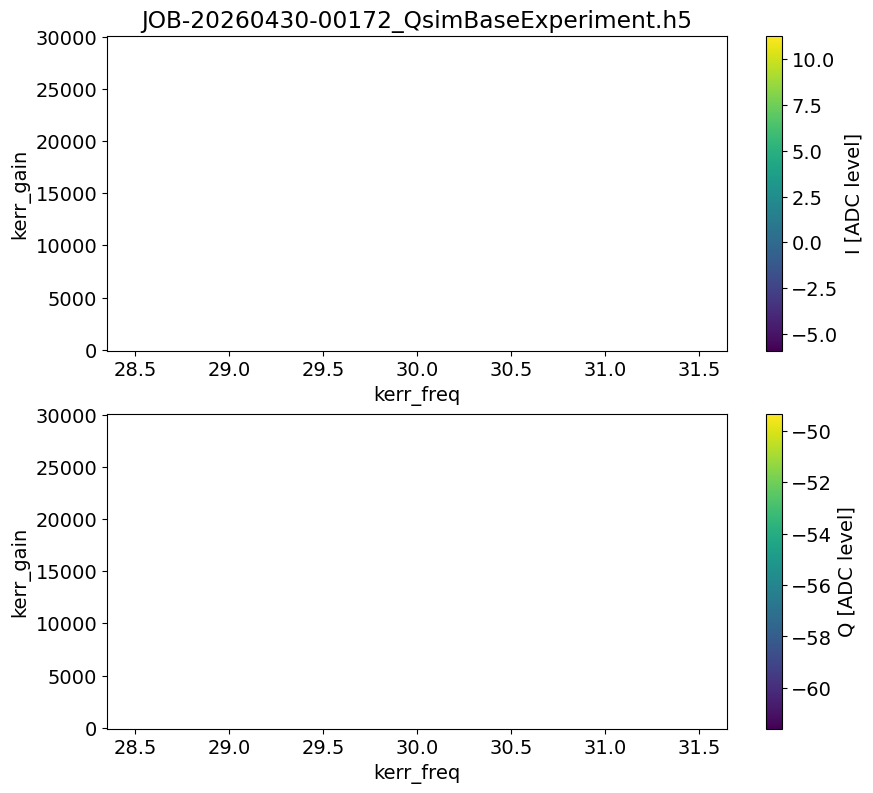

[log_measurement] vault_root not configured; skipping. Add 'data_management.vault_root: <path>' to the hardware config.
Job submitted: JOB-20260430-00173 (queue position: 1)

[0.2s] Job JOB-20260430-00173: pending

[2.2s] Job JOB-20260430-00173: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260430-00173_QsimBaseExperiment.h5
[WORKER]   Program: ExcursionTransitionDebuggingProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to -0.213mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
  0%|                                                  | 0/151 [00:00<?, ?it/s]kerr pulse length = 10
performing prep manipulate photon pulse
performing kerr pulse
performing man pi and qubit ef
  1%|▎                                         | 1/151 [00:00<01:39,  1.51it/s]kerr pulse length = 10
performing prep manipulat

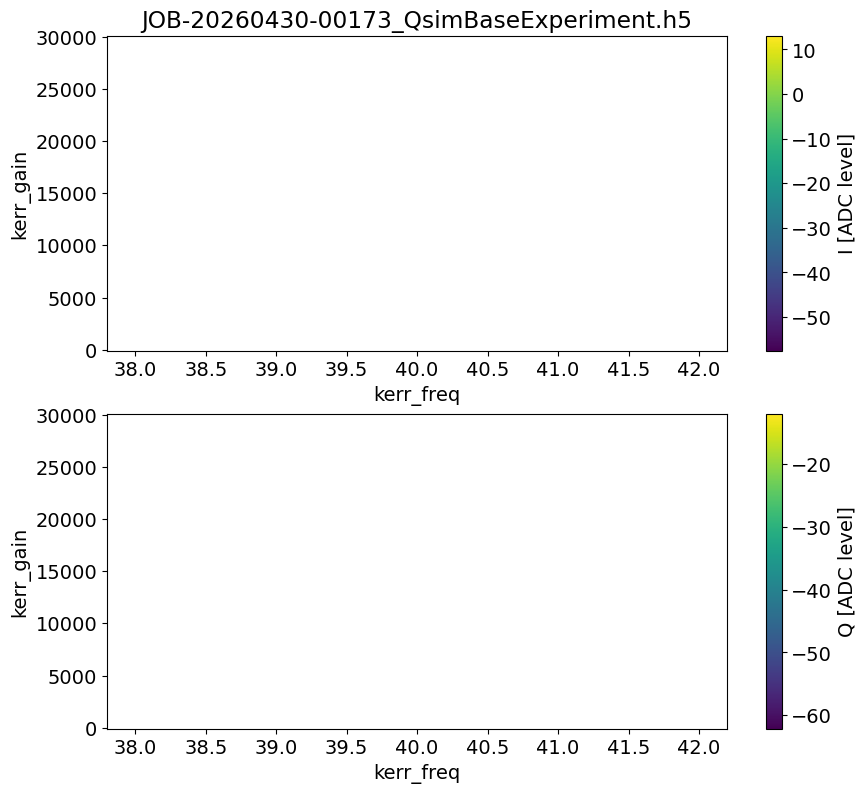

[log_measurement] vault_root not configured; skipping. Add 'data_management.vault_root: <path>' to the hardware config.
Job submitted: JOB-20260430-00174 (queue position: 1)

[0.1s] Job JOB-20260430-00174: pending

[2.1s] Job JOB-20260430-00174: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260430-00174_QsimBaseExperiment.h5
[WORKER]   Program: ExcursionTransitionDebuggingProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to -0.213mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
  0%|                                                  | 0/151 [00:00<?, ?it/s]kerr pulse length = 10
performing prep manipulate photon pulse
performing kerr pulse
performing man pi and qubit ef
  1%|▎                                         | 1/151 [00:00<01:35,  1.57it/s]kerr pulse length = 10
performing prep manipulat

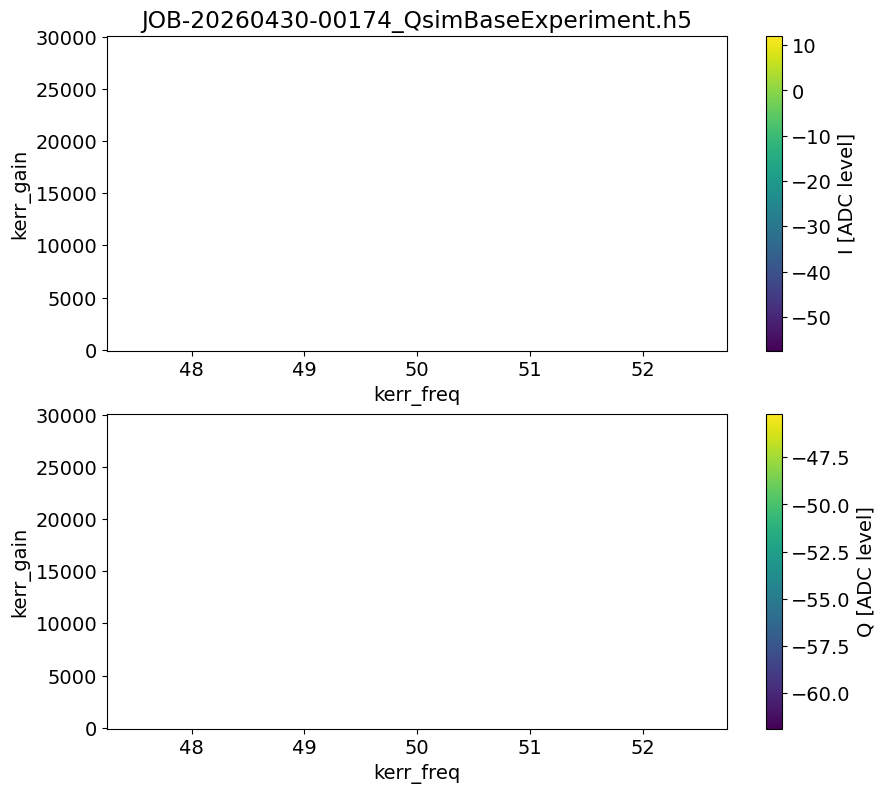

[log_measurement] vault_root not configured; skipping. Add 'data_management.vault_root: <path>' to the hardware config.
Job submitted: JOB-20260430-00175 (queue position: 1)

[0.1s] Job JOB-20260430-00175: pending

[2.8s] Job JOB-20260430-00175: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260430-00175_QsimBaseExperiment.h5
[WORKER]   Program: ExcursionTransitionDebuggingProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to -0.213mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
  0%|                                                  | 0/151 [00:00<?, ?it/s]kerr pulse length = 10
performing prep manipulate photon pulse
performing kerr pulse
performing man pi and qubit ef
  1%|▎                                         | 1/151 [00:00<01:36,  1.55it/s]kerr pulse length = 10
performing prep manipulat

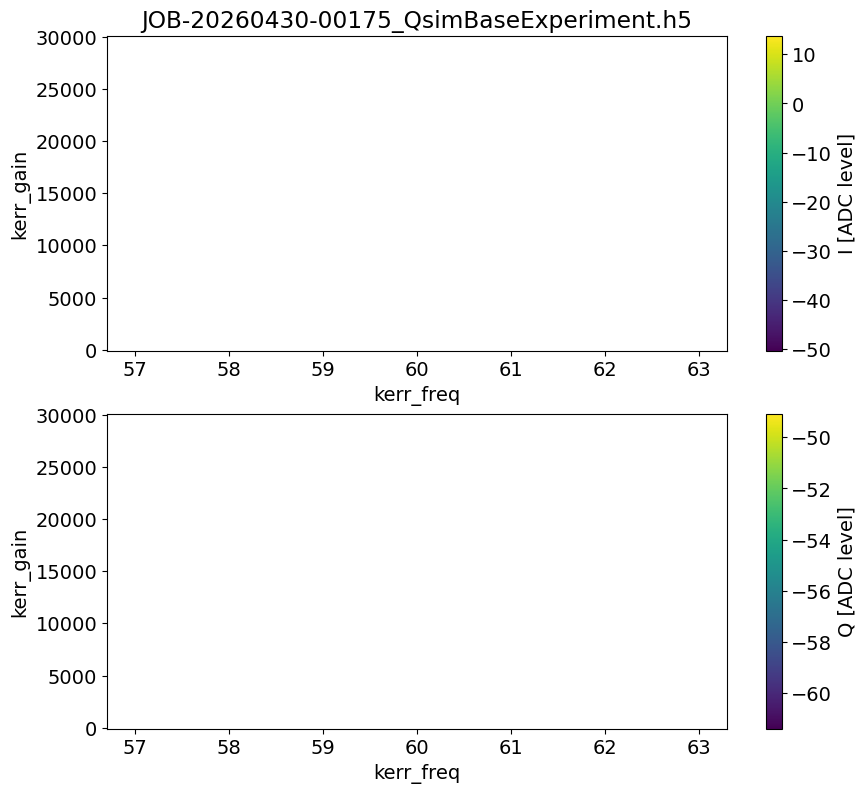

[log_measurement] vault_root not configured; skipping. Add 'data_management.vault_root: <path>' to the hardware config.
Job submitted: JOB-20260430-00176 (queue position: 1)

[0.1s] Job JOB-20260430-00176: pending

[2.2s] Job JOB-20260430-00176: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260430-00176_QsimBaseExperiment.h5
[WORKER]   Program: ExcursionTransitionDebuggingProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to -0.213mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
  0%|                                                  | 0/151 [00:00<?, ?it/s]kerr pulse length = 10
performing prep manipulate photon pulse
performing kerr pulse
performing man pi and qubit ef
  1%|▎                                         | 1/151 [00:00<01:35,  1.57it/s]kerr pulse length = 10
performing prep manipulat

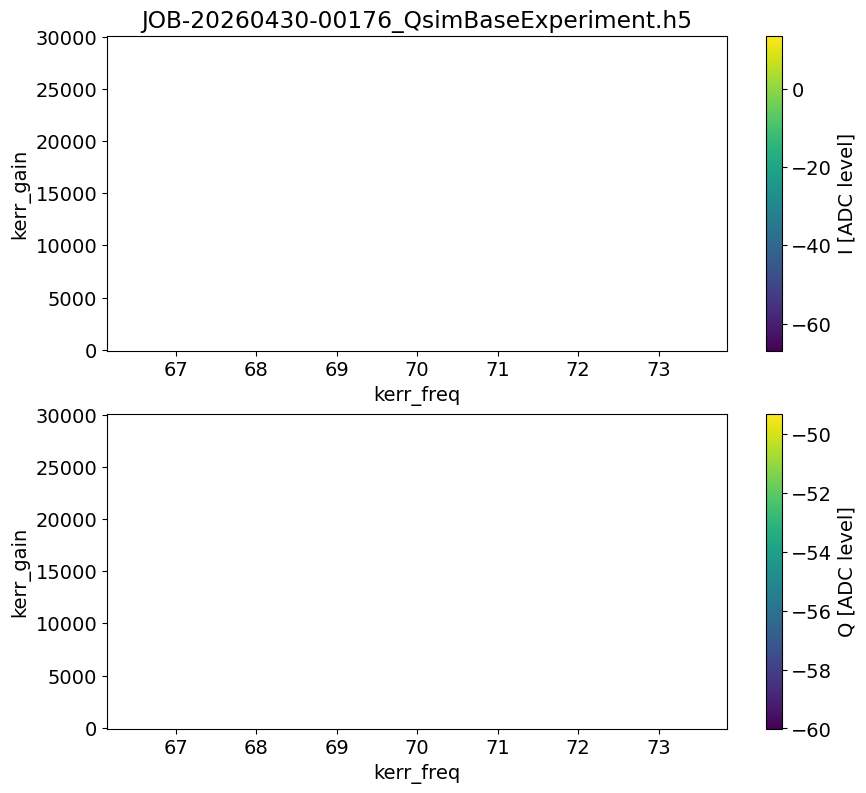

[log_measurement] vault_root not configured; skipping. Add 'data_management.vault_root: <path>' to the hardware config.
Job submitted: JOB-20260430-00177 (queue position: 1)

[0.1s] Job JOB-20260430-00177: pending

[2.6s] Job JOB-20260430-00177: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260430-00177_QsimBaseExperiment.h5
[WORKER]   Program: ExcursionTransitionDebuggingProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to -0.213mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
  0%|                                                  | 0/151 [00:00<?, ?it/s]kerr pulse length = 10
performing prep manipulate photon pulse
performing kerr pulse
performing man pi and qubit ef
  1%|▎                                         | 1/151 [00:00<01:36,  1.55it/s]kerr pulse length = 10
performing prep manipulat

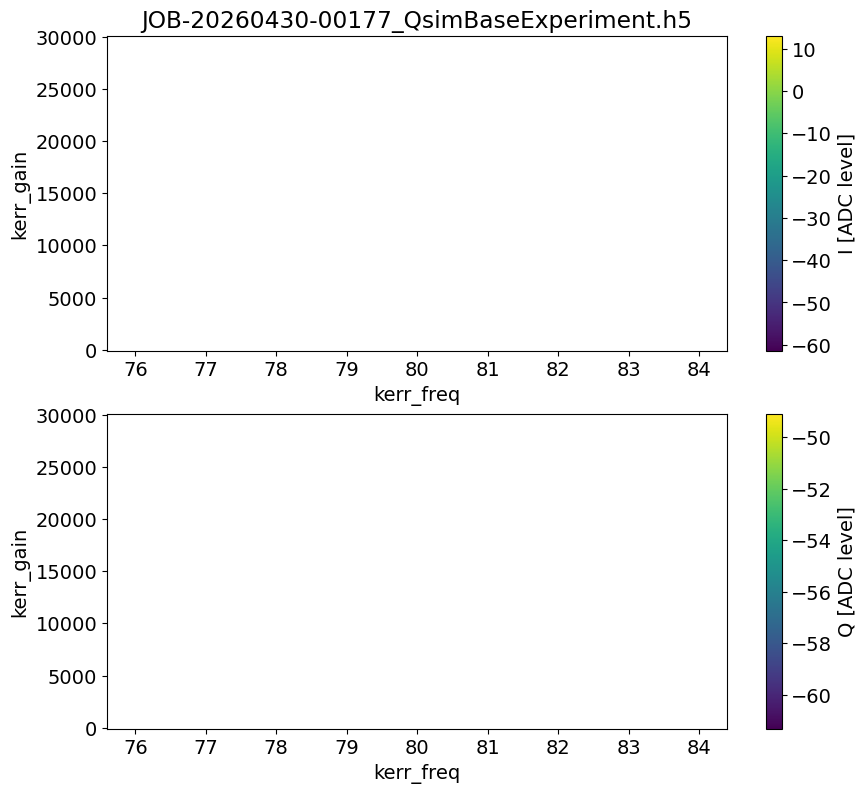

[log_measurement] vault_root not configured; skipping. Add 'data_management.vault_root: <path>' to the hardware config.
Job submitted: JOB-20260430-00179 (queue position: 1)

[0.2s] Job JOB-20260430-00179: pending

[426.7s] Job JOB-20260430-00179: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260430-00179_QsimBaseExperiment.h5
[WORKER]   Program: ExcursionTransitionDebuggingProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to -0.213mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
  0%|                                                  | 0/151 [00:00<?, ?it/s]kerr pulse length = 10
performing prep manipulate photon pulse
performing kerr pulse
performing man pi and qubit ef
  1%|▎                                         | 1/151 [00:00<01:40,  1.49it/s]kerr pulse length = 10
performing prep manipul

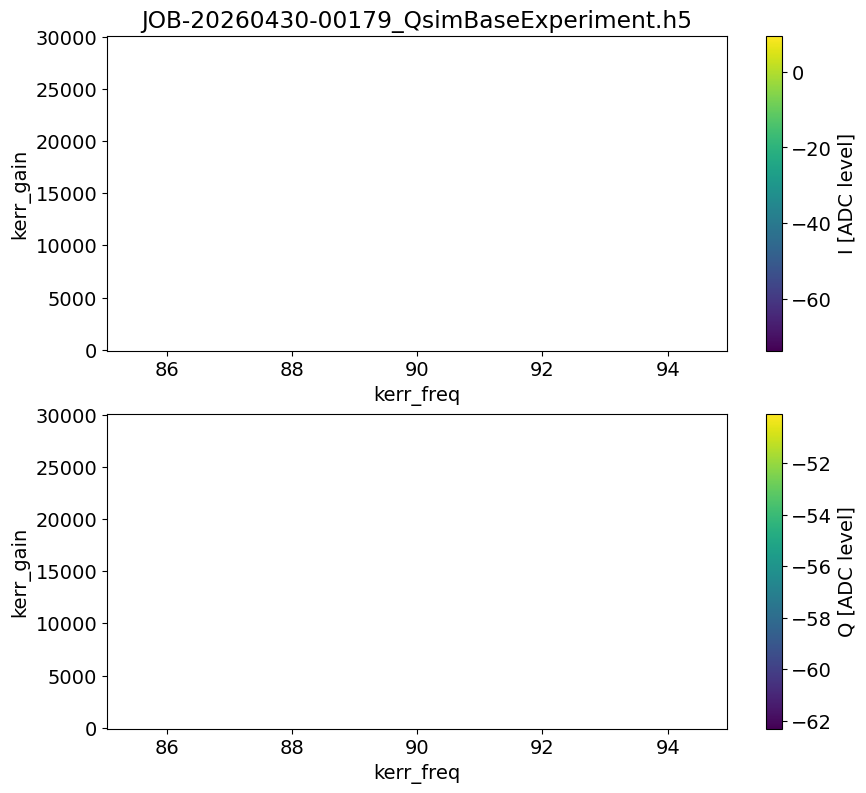

[log_measurement] vault_root not configured; skipping. Add 'data_management.vault_root: <path>' to the hardware config.
Job submitted: JOB-20260430-00181 (queue position: 1)

[0.1s] Job JOB-20260430-00181: pending

[437.7s] Job JOB-20260430-00181: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260430-00181_QsimBaseExperiment.h5
[WORKER]   Program: ExcursionTransitionDebuggingProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to -0.213mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
  0%|                                                  | 0/151 [00:00<?, ?it/s]kerr pulse length = 10
performing prep manipulate photon pulse
performing kerr pulse
performing man pi and qubit ef
  1%|▎                                         | 1/151 [00:00<02:10,  1.15it/s]kerr pulse length = 10
performing prep manipul

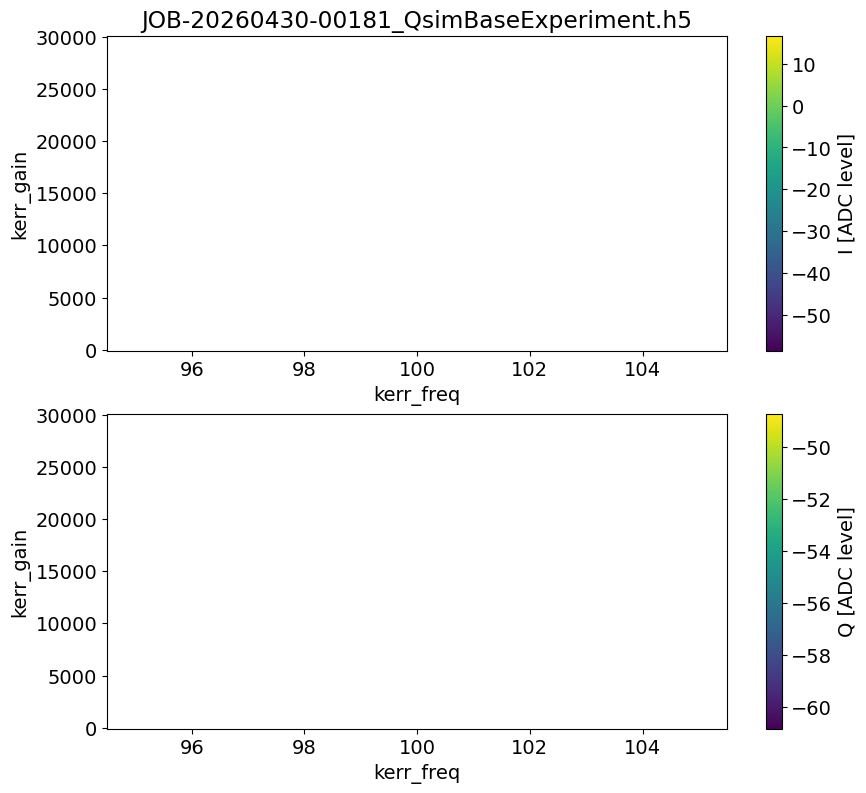

[log_measurement] vault_root not configured; skipping. Add 'data_management.vault_root: <path>' to the hardware config.


In [20]:
kerr_freqs = np.arange(10.0, 101.0, 10.0).tolist()
# kerr_gains = [13000]
trans_result_list1 = []
for kf in tqdm(kerr_freqs):
	trans_result = kerrtransitionpinvrunner.execute(
		kerr_length = 10,
		kerr_gains = np.arange(0, 30001, 200).tolist(),
		reps = 200,
		active_reset = False,
		man_reset = True,
		storage_reset = False,
		reset_dump_mode = 1,
		swept_params = ['kerr_gain', 'kerr_freq'],
		relax_delay = 2500,
    	kerr_freqs = [kf],
		debug = True,
		prepulse = False,
		init_fock = False,
		init_man_fock_state = '1',
  		skip_man_conv = False,
		skip_gef = False,
		skip_all = False,
		skip_prep_man = False,
		only_flux_excursion = False,
		kerr_nqz = 1,
		# coupler_current = 0.3e-3,
  		# flat_top_sigma = 0.2
	)
	trans_result_list1.append(trans_result)

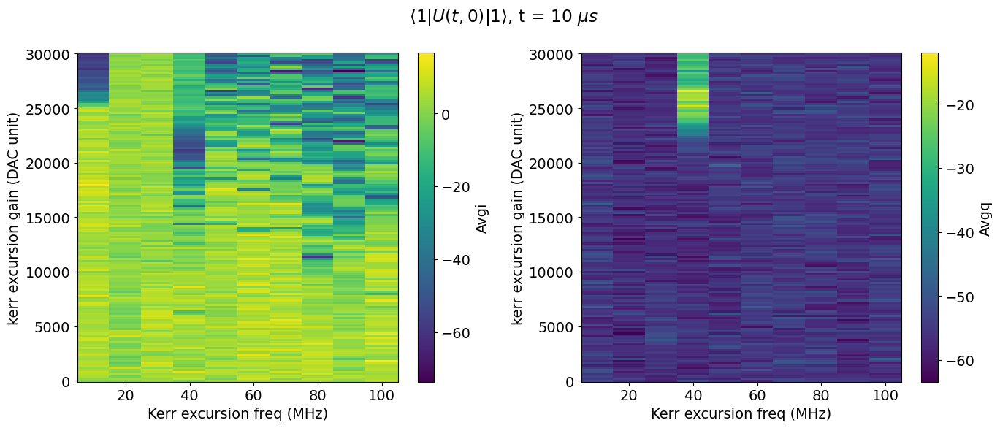

In [21]:
x_data = kerr_freqs
y_data = trans_result_list1[0].data['ypts']
z_data_i = [result.data['avgi'][ :, 0] for result in trans_result_list1]
z_data_q = [result.data['avgq'][ :, 0] for result in trans_result_list1]

fig, ax = plt.subplots(1, 2, figsize = (14, 6)) 
c = ax[0].pcolor(*np.meshgrid(x_data, y_data), np.transpose(z_data_i))
ax[0].set_xlabel("Kerr excursion freq (MHz)")
ax[0].set_ylabel("kerr excursion gain (DAC unit)")
# ax[0].set_ylim(0, 20000)
fig.colorbar(c, ax = ax[0], label = "Avgi")
c = ax[1].pcolor(*np.meshgrid(x_data, y_data), np.transpose(z_data_q))
ax[1].set_xlabel("Kerr excursion freq (MHz)")
ax[1].set_ylabel("kerr excursion gain (DAC unit)")
# ax[1].set_ylim(0, 20000)
fig.colorbar(c, ax = ax[1], label = "Avgq")
fig.suptitle("$\\langle 1 |U(t, 0)| 1 \\rangle$, t = 10 $\\mu s$")
fig.tight_layout()

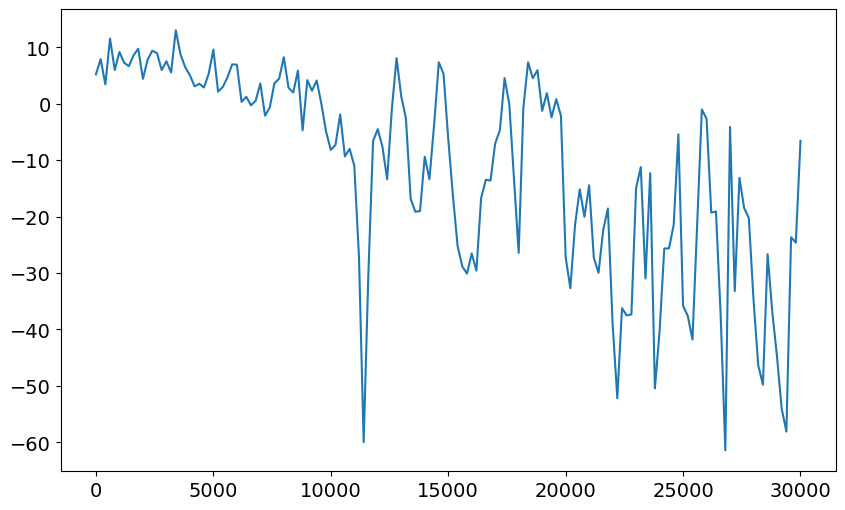

In [26]:
idx = 7
plt.plot(y_data, trans_result_list1[idx].data['avgi'][ :, 0])

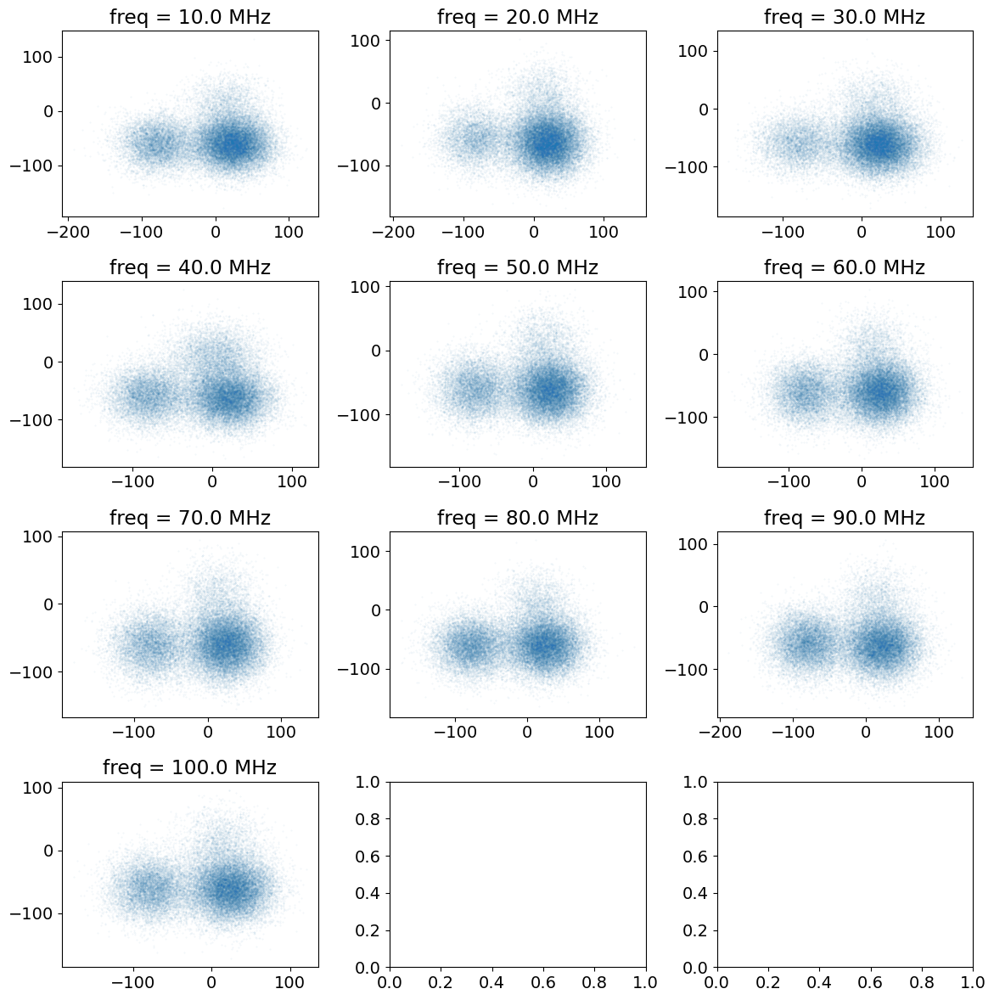

In [22]:
fig, ax = plt.subplots(4, 3, figsize = (12, 12))

for i in range(len(trans_result_list1)):
	ax[i // 3, i % 3].scatter(trans_result_list1[i].data['idata'], trans_result_list1[i].data['qdata'], s = 0.1, alpha = 0.1)
	ax[i // 3, i % 3].set_title(f"freq = {kerr_freqs[i]} MHz")
fig.tight_layout()

### Freq vs DC set point

In [47]:
dc_set_points = np.arange(0.3e-3, 0.199e-3, -0.025e-3)
dc_set_points

array([0.0003  , 0.000275, 0.00025 , 0.000225, 0.0002  ])

In [ ]:
kerr_freqs = np.arange(35.0, 46.0, 1.0).tolist()
dc_set_points = np.arange(0.3e-3, 0.199e-3, -0.025e-3)
trans_result_list = []
for dc_p in tqdm(dc_set_points):
	trans_result = kerrtransitionpinvrunner.execute(
		kerr_length = 10,
		kerr_gains = [15000],
		reps = 200,
		active_reset = True,
		man_reset = True,
		storage_reset = False,
		reset_dump_mode = 1,
		swept_params = ['kerr_freq', 'kerr_gain'],
		relax_delay = 20,
    	kerr_freqs = kerr_freqs,
		debug = True,
		prepulse = False,
		init_fock = False,
		init_man_fock_state = '1',
  		skip_man_conv = True,
		skip_gef = False,
		skip_all = False,
		skip_prep_man = True,
		only_flux_excursion = True,
		kerr_nqz = 1,
		coupler_current = dc_p
  		# flat_top_sigma = 0.2
	)
	trans_result_list.append(trans_result)

  0%|          | 0/3 [00:00<?, ?it/s]

Job submitted: JOB-20260427-00380 (queue position: 1)

[0.1s] Job JOB-20260427-00380: pending

[180.8s] Job JOB-20260427-00380: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260427-00380_QsimBaseExperiment.h5
[WORKER]   Program: ExcursionTransitionDebuggingProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.3mA according to expt.cfg...
[WORKER] Done setting coupler current
  0%|                                                   | 0/11 [00:00<?, ?it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debugging purpose
  9%|███▉                                       | 1/11 [00:00<00:02,  4.11it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debugging purpose
 18%|███████▊                                   | 2/11 [00:00<00:01,  4.64it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debug

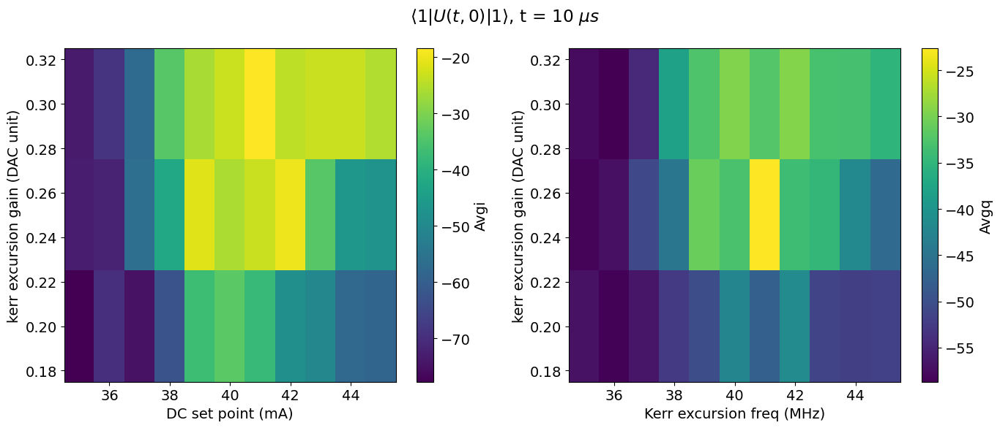

In [46]:
y_data = dc_set_points * 1e3
x_data = trans_result_list[0].data['ypts']
z_data_i = np.transpose([result.data['avgi'][ :, 0] for result in trans_result_list])
z_data_q = np.transpose([result.data['avgq'][ :, 0] for result in trans_result_list])

fig, ax = plt.subplots(1, 2, figsize = (14, 6)) 
c = ax[0].pcolor(*np.meshgrid(x_data, y_data), np.transpose(z_data_i))
ax[0].set_xlabel("DC set point (mA)")
ax[0].set_ylabel("kerr excursion gain (DAC unit)")
# ax[0].set_ylim(0, 20000)
fig.colorbar(c, ax = ax[0], label = "Avgi")
c = ax[1].pcolor(*np.meshgrid(x_data, y_data), np.transpose(z_data_q))
ax[1].set_xlabel("Kerr excursion freq (MHz)")
ax[1].set_ylabel("kerr excursion gain (DAC unit)")
# ax[1].set_ylim(0, 20000)
fig.colorbar(c, ax = ax[1], label = "Avgq")
fig.suptitle("$\\langle 1 |U(t, 0)| 1 \\rangle$, t = 10 $\\mu s$")
fig.tight_layout()

### AC vs DC set point

In [4]:

dc_set_points = np.round(np.arange(0.3e-3, -0.21e-3, -0.05e-3), 5)
print(dc_set_points)

[ 3.0e-04  2.5e-04  2.0e-04  1.5e-04  1.0e-04  5.0e-05 -0.0e+00 -5.0e-05
 -1.0e-04 -1.5e-04 -2.0e-04]


In [ ]:
dc_set_points = np.round(np.arange(0.3e-3, -0.21e-3, -0.05e-3), 5)
kerr_freqs = np.arange(60.0, 101.0, 10.0).tolist()
total_result_list = []
for kf in kerr_freqs:
	trans_result_list = []
	for dc_p in tqdm(dc_set_points):
		trans_result = kerrtransitionpinvrunner.execute(
			kerr_length = 10,
			kerr_gains = np.arange(0, 30001, 200).tolist(),
			reps = 200,
			active_reset = True,
			man_reset = True,
			storage_reset = False,
			reset_dump_mode = 1,
			swept_params = ['kerr_gain'],
			relax_delay = 20,
			kerr_freq = kf,
			debug = True,
			prepulse = False,
			init_fock = False,
			init_man_fock_state = '1',
			skip_man_conv = True,
			skip_gef = False,
			skip_all = False,
			skip_prep_man = True,
			only_flux_excursion = True,
			kerr_nqz = 1,
			coupler_current = dc_p
			# flat_top_sigma = 0.2
		)
		trans_result_list.append(trans_result)
	total_result_list.append(trans_result_list)

  0%|          | 0/11 [00:00<?, ?it/s]

Job submitted: JOB-20260501-00041 (queue position: 1)

[0.1s] Job JOB-20260501-00041: pending

[10.2s] Job JOB-20260501-00041: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260501-00041_QsimBaseExperiment.h5
[WORKER]   Program: ExcursionTransitionDebuggingProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.3mA according to expt.cfg...
[WORKER] Done setting coupler current
  0%|                                                  | 0/151 [00:00<?, ?it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debugging purpose
  1%|▎                                         | 1/151 [00:00<00:32,  4.56it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debugging purpose
  1%|▌                                         | 2/151 [00:00<00:32,  4.57it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debugg

  0%|          | 0/11 [00:00<?, ?it/s]

Job submitted: JOB-20260501-00063 (queue position: 1)

[0.1s] Job JOB-20260501-00063: pending

[116.8s] Job JOB-20260501-00063: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260501-00063_QsimBaseExperiment.h5
[WORKER]   Program: ExcursionTransitionDebuggingProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.3mA according to expt.cfg...
[WORKER] Done setting coupler current
  0%|                                                  | 0/151 [00:00<?, ?it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debugging purpose
  1%|▎                                         | 1/151 [00:00<00:34,  4.35it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debugging purpose
  1%|▌                                         | 2/151 [00:00<00:31,  4.76it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debug

50

In [14]:
total_result_list[2][0].cfg.expt.kerr_freq

50

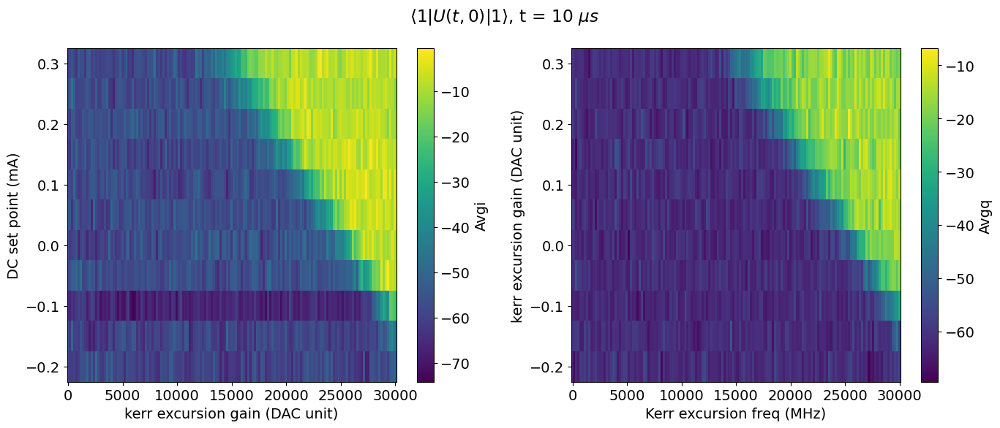

In [10]:
trans_result_list = total_result_list[1]

y_data = dc_set_points * 1e3
x_data = trans_result_list[0].cfg.expt.kerr_gains
z_data_i = np.transpose([result.data['avgi'] for result in trans_result_list])
z_data_q = np.transpose([result.data['avgq'] for result in trans_result_list])

fig, ax = plt.subplots(1, 2, figsize = (14, 6)) 
c = ax[0].pcolor(*np.meshgrid(x_data, y_data), np.transpose(z_data_i))
ax[0].set_xlabel("kerr excursion gain (DAC unit)")
ax[0].set_ylabel("DC set point (mA)")
# ax[0].set_ylim(0, 20000)
fig.colorbar(c, ax = ax[0], label = "Avgi")
c = ax[1].pcolor(*np.meshgrid(x_data, y_data), np.transpose(z_data_q))
ax[1].set_xlabel("Kerr excursion freq (MHz)")
ax[1].set_ylabel("kerr excursion gain (DAC unit)")
# ax[1].set_ylim(0, 20000)
fig.colorbar(c, ax = ax[1], label = "Avgq")
fig.suptitle("$\\langle 1 |U(t, 0)| 1 \\rangle$, t = 10 $\\mu s$")
fig.tight_layout()

Estimated Slope (dCurrent/dGain): -2.9789e-05


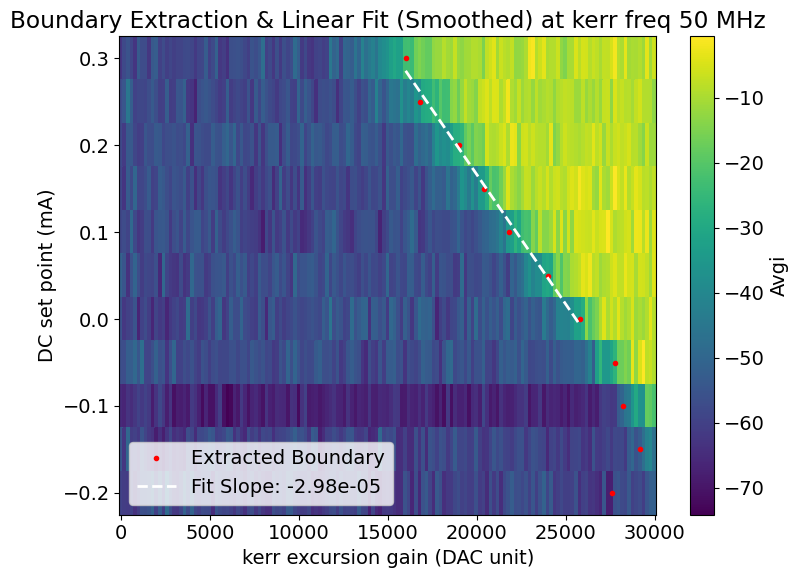

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d

Z_grid = np.transpose(z_data_i) 

boundary_x = []
boundary_y = []

for i, y_val in enumerate(y_data):
    row_data = Z_grid[i, :]
    
    smoothed_data = gaussian_filter1d(row_data, sigma=2) 
    
    diff_data = np.diff(smoothed_data)
    
    boundary_idx = np.argmax(diff_data) 
    
    boundary_x.append(x_data[boundary_idx])
    boundary_y.append(y_val)

boundary_x = np.array(boundary_x)
boundary_y = np.array(boundary_y)

valid_idx = (boundary_y > -0.05) & (boundary_x > 10000)

fit_x = boundary_x[valid_idx]
fit_y = boundary_y[valid_idx]

slope, intercept = np.polyfit(fit_x, fit_y, 1)

print(f"Estimated Slope (dCurrent/dGain): {slope:.4e}")

plt.figure(figsize=(8, 6))

c = plt.pcolor(*np.meshgrid(x_data, y_data), Z_grid)
plt.colorbar(c, label="Avgi")

plt.plot(boundary_x, boundary_y, 'r.', label='Extracted Boundary')

plt.plot(fit_x, slope * fit_x + intercept, 'w--', linewidth=2, label=f'Fit Slope: {slope:.2e}')

plt.xlabel("kerr excursion gain (DAC unit)")
plt.ylabel("DC set point (mA)")
plt.title(f"Boundary Extraction & Linear Fit (Smoothed) at kerr freq {trans_result_list[0].cfg.expt.kerr_freq} MHz")
plt.legend(loc='lower left') 
plt.tight_layout()
plt.show()

### Historgram Analysis

In [97]:
histogra_results = []
gain_list = [5000, 25000]
for kg in gain_list:
	hist_result = kerrtransitionpinvrunner.execute(
		kerr_length = 10,
		kerr_gains = [kg],
		reps = 10000,
		active_reset = True,
		man_reset = True,
		storage_reset = False,
		reset_dump_mode = 1,
		swept_params = ['kerr_gain', 'kerr_freq'],
		relax_delay = 20,
		kerr_freqs = [20],
		debug = True,
		prepulse = False,
		init_fock = False,
		init_man_fock_state = '1',
		skip_man_conv = True,
		skip_gef = False,
		skip_all = False,
		skip_prep_man = True,
		only_flux_excursion = True
		# flat_top_sigma = 0.2
	)
	histogra_results.append(hist_result)

Job submitted: JOB-20260424-00733 (queue position: 1)

[0.1s] Job JOB-20260424-00733: pending

[60.6s] Job JOB-20260424-00733: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260424-00733_QsimBaseExperiment.h5
[WORKER]   Program: ExcursionTransitionDebuggingProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.25mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
  0%|                                                    | 0/1 [00:00<?, ?it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debugging purpose

[72.7s] Job JOB-20260424-00733: completed
100%|████████████████████████████████████████████| 1/1 [00:04<00:00,  4.24s/it]
Saving D:\experiments\260403_kerr_excusion_redone\data\JOB-20260424-00733_QsimBaseExperiment.h5
[WORKER] Saving expt object to: D:\experiments\260403_kerr_excusion_r

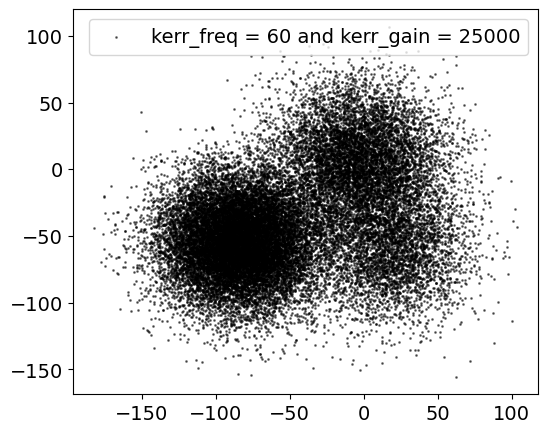

In [96]:
fig, ax = plt.subplots(figsize = (6,5))
idx = 1
hist_result = histogra_results[idx]
ax.scatter(hist_result.data["idata"], hist_result.data["qdata"], 
		label = f"kerr_freq = {hist_result.cfg.expt.kerr_freq} and kerr_gain = {hist_result.cfg.expt.kerr_gain}",
		s = 1, alpha = 0.5, color = "black")
ax.legend()

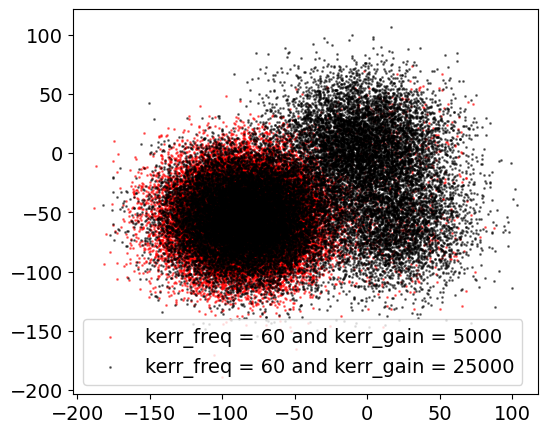

In [94]:

fig, ax = plt.subplots(figsize = (6,5))
color_list = ['red', 'black']
for hist_result in histogra_results:
	ax.scatter(hist_result.data["idata"], hist_result.data["qdata"], 
            label = f"kerr_freq = {hist_result.cfg.expt.kerr_freq} and kerr_gain = {hist_result.cfg.expt.kerr_gain}",
            s = 1, alpha = 0.5, color = color_list[histogra_results.index(hist_result)])
ax.legend()

In [47]:
station.update_all_station_snapshots()

[CONFIG] Reusing existing hardware_config version CFG-HW-20260424-00002
[CONFIG] Reusing existing multiphoton_config version CFG-MP-20260121-00001
[CONFIG] Reusing existing man1_storage_swap version CFG-M1-20260416-00014
[CONFIG] Reusing existing floquet_storage_swap version CFG-FL-20260401-00021
Config snapshots for current station:
  hardware_config: CFG-HW-20260424-00002
  multiphoton_config: CFG-MP-20260121-00001
  man1_storage_swap: CFG-M1-20260416-00014
  floquet_storage_swap: CFG-FL-20260401-00021


{'hardware_config': 'CFG-HW-20260424-00002',
 'multiphoton_config': 'CFG-MP-20260121-00001',
 'man1_storage_swap': 'CFG-M1-20260416-00014',
 'floquet_storage_swap': 'CFG-FL-20260401-00021'}

### Active Reset Verification

In [55]:
kerr_freqs = np.arange(10.0, 101.0, 10.0).tolist()
# kerr_gains = [13000]
trans_result_list = []
for kf in tqdm(kerr_freqs):
	trans_result = kerrtransitionpinvrunner.execute(
		kerr_length = 10,
		kerr_gains = np.arange(0, 30001, 5000).tolist(),
		reps = 200,
		active_reset = False,
		relax_delay = 8000,
		man_reset = True,
		storage_reset = False,
		reset_dump_mode = 1,
		swept_params = ['kerr_gain', 'kerr_freq'],
    	kerr_freqs = [kf],
		debug = True,
		prepulse = False,
		init_fock = False,
		init_man_fock_state = '1',
  		skip_man_conv = True,
		skip_gef = False,
		skip_all = False,
		skip_prep_man = True,
		only_flux_excursion = True,
		kerr_nqz = 1,
		coupler_current = 0.3e-3
  		# flat_top_sigma = 0.2
	)
	trans_result_list.append(trans_result)

  0%|          | 0/10 [00:00<?, ?it/s]

Job submitted: JOB-20260428-00053 (queue position: 1)

[0.2s] Job JOB-20260428-00053: pending

[2.2s] Job JOB-20260428-00053: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260428-00053_QsimBaseExperiment.h5
[WORKER]   Program: ExcursionTransitionDebuggingProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.3mA according to expt.cfg...
[WORKER] Done setting coupler current
  0%|                                                    | 0/7 [00:00<?, ?it/s]kerr pulse length = 10
performing ONLY kerr pulse for the debugging purpose
 14%|██████▎                                     | 1/7 [00:01<00:11,  1.95s/it]kerr pulse length = 10
performing ONLY kerr pulse for the debugging purpose
 29%|████████████▌                               | 2/7 [00:03<00:09,  1.81s/it]kerr pulse length = 10
performing ONLY kerr pulse for the debuggi

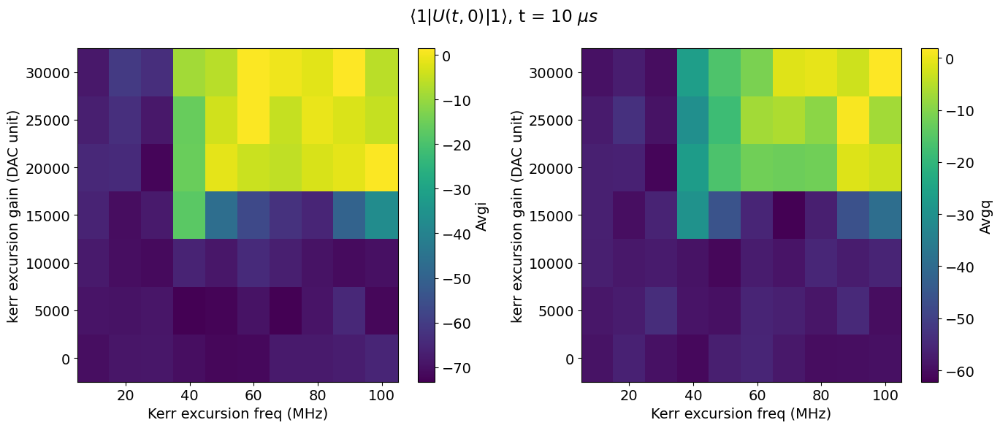

In [56]:
x_data = kerr_freqs
y_data = trans_result_list[0].data['ypts']
z_data_i = [result.data['avgi'][ :, 0] for result in trans_result_list]
z_data_q = [result.data['avgq'][ :, 0] for result in trans_result_list]

fig, ax = plt.subplots(1, 2, figsize = (14, 6)) 
c = ax[0].pcolor(*np.meshgrid(x_data, y_data), np.transpose(z_data_i))
ax[0].set_xlabel("Kerr excursion freq (MHz)")
ax[0].set_ylabel("kerr excursion gain (DAC unit)")
# ax[0].set_ylim(0, 20000)
fig.colorbar(c, ax = ax[0], label = "Avgi")
c = ax[1].pcolor(*np.meshgrid(x_data, y_data), np.transpose(z_data_q))
ax[1].set_xlabel("Kerr excursion freq (MHz)")
ax[1].set_ylabel("kerr excursion gain (DAC unit)")
# ax[1].set_ylim(0, 20000)
fig.colorbar(c, ax = ax[1], label = "Avgq")
fig.suptitle("$\\langle 1 |U(t, 0)| 1 \\rangle$, t = 10 $\\mu s$")
fig.tight_layout()

## Transition Prob Wigner Tomography

In [2]:
expt_params_default = AttrDict(dict(
    expts=1,
    reps = 100,
    rounds = 1,
    qubits=[0],
    ro_stor = 0,
    
	init_fock = False,
    displacement_path= r'D:\\experiments\\260217_qsim_wigner_prac\\optimized_displacements_19.npy',
    # displacement_path= return_dict['path'],
	perform_wigner=True,
    parity_fast=True,
    pulse_correction=True,
    
    kerr_gains = [0],
    kerr_lengths = np.linspace(0.007, 3, 31),
    swept_params = ['kerr_gain', 'kerr_length'],
    kerr_freq = 200,
    
    # start=0.01, # us
    # step=0.1,
    use_flat_top = True,
    
    relax_delay = 2500,
    normalize = False,
    post_select_pre_pulse=False,
    active_reset = False,
    man_reset = False,
    storage_reset = False,
    init_stor = 0,
    prepulse = True,
    postpulse = True,
))

kerrtransitionpinvrunnerWigner = CharacterizationRunner(
    station=station,
    ExptClass=meas.QsimWignerBaseExperiment,
    ExptProgram=meas.qsim.t2_cavity_fluxexcursion.ExcursionTransitionDebuggingProgram,
    default_expt_cfg=expt_params_default,
    job_client=client,
)

In [34]:
kerr_length_test = np.round(np.linspace(0, 10, 21), 3)
kerr_length_test[0] = 0.007
print("kerr_lengths =", kerr_length_test.tolist())

kerr_lengths = [0.007, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, 7.5, 8.0, 8.5, 9.0, 9.5, 10.0]


In [ ]:
kerr_length_list = kerr_length_test
kerr_gain_list = [0, 5000,10000, 15000, 17000, 20000]
# kerr_length_list = [1]
# kerr_gain_list = np.arange(0, 30001, 5000)
excursion_wigner_results = []
for each_kerr_gain in kerr_gain_list:
	excursion_wigner_results_per_gain = []
	for each_kerr_length in kerr_length_list:
		trans_wig_result = kerrtransitionpinvrunnerWigner.execute(
			reps = 1000,
			init_fock = False,
			init_alpha = 1.0,
			init_stor=0,
			ro_stor=0,
			relax_delay = 20,
			parity_fast = False,
			init_man_fock_state = '1',
			kerr_lengths = [each_kerr_length],
			kerr_gains = [each_kerr_gain],
	
			active_reset = True,
			man_reset = True,
			storage_reset = False,
			reset_dump_mode = 1,
	
			
			parity_check = False,
			parity_post_select = False,
	
			skip_kerr_pulse = False,
			skip_all = False,
			debug = True,
			prepulse = True,
		)
		excursion_wigner_results_per_gain.append(trans_wig_result)
		try:
			trans_wig_result.analyze_wigner(cutoff=cutoff, debug=True)
			trans_wig_result.display(rotate=True, initial_state=ideal_state, mode_state_num=cutoff, station=station, save_fig=False)
		except:
			pass
	excursion_wigner_results.append(excursion_wigner_results_per_gain)

Job submitted: JOB-20260418-00026 (queue position: 1)

[0.1s] Job JOB-20260418-00026: pending

[2.1s] Job JOB-20260418-00026: running
[WORKER] Loading QsimWignerBaseExperiment from experiments.qsim.qsim_base_wigner
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260418-00026_QsimWignerBaseExperiment.h5
[WORKER]   Program: ExcursionTransitionDebuggingProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.3mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
  0%|                                                  | 0/201 [00:00<?, ?it/s]running
performing kerr pulse
running
performing kerr pulse

  0%|▏                                         | 1/201 [00:01<03:35,  1.08s/it]running
performing kerr pulse
running
performing kerr pulse

  1%|▍                                         | 2/201 [00:02<03:33,  1.07s/it]running
performing kerr pulse
running
performing kerr pulse

  1%|▋

In [4]:
list(range(26, 152, 1))

[26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151]

15000 1.5
shape (201, 1000)
max parity: 0.2843698573966803
max parity before scaling: 0.24802458296751528
Analyzing for kerr_gain=15000, kerr_length=1.5
[[0.4183363592911085]]
15000 1.5


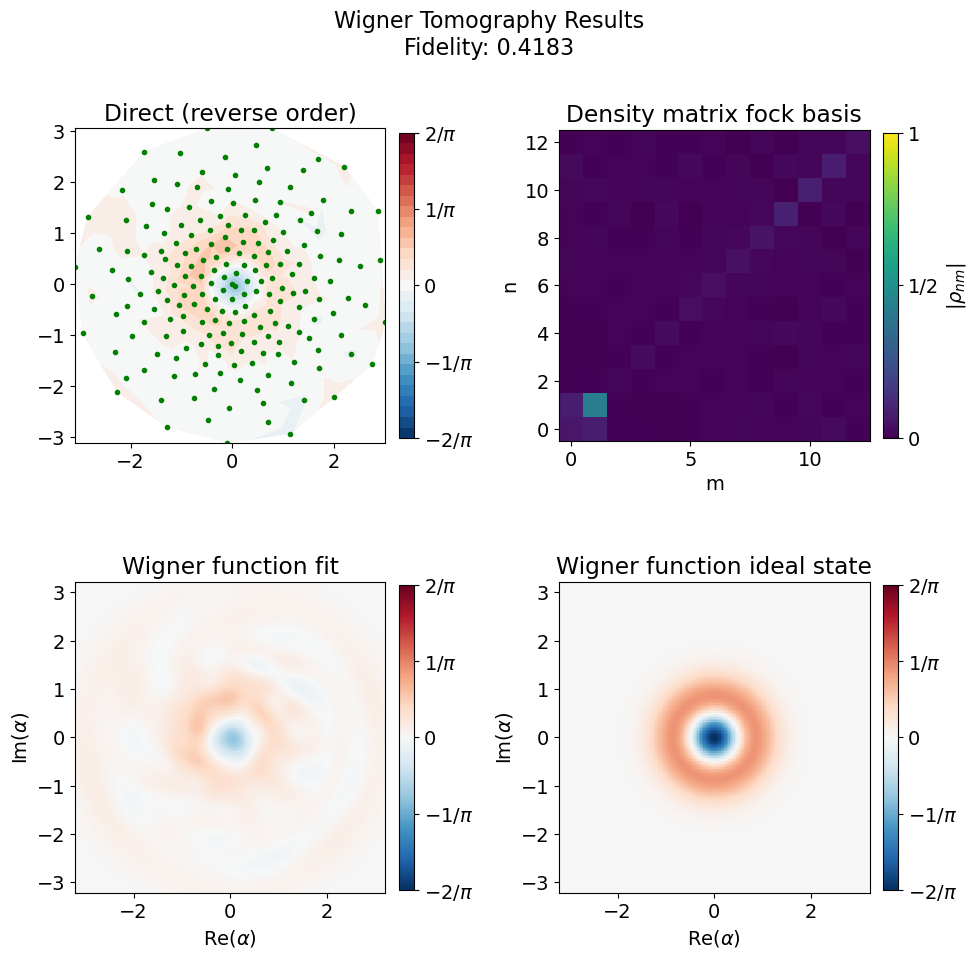

In [17]:
import pickle
_base_str = "D:\\experiments\\260403_kerr_excusion_redone\\expt_objs\\JOB-20260418-"
_end_str = "expt.pkl"
loaded_pickles = []
for jobnum in range(26, 152, 1):
    with open(f"{_base_str}{jobnum:05d}_{_end_str}", "rb") as f:
        loaded_pickles.append(pickle.load(f))

cutoff = 13
ideal_state = (qt.basis(cutoff, 1)).unit()
# ideal_state = (qt.coherent(cutoff, 1.0)).unit()

result_to_draw = loaded_pickles[-60]
result_to_draw.cfg.expt.parity_post_select = False
result_to_draw.analyze_wigner(cutoff=cutoff, debug=True)
result_to_draw.display(rotate=True, initial_state=ideal_state, mode_state_num=cutoff, station=station, save_fig=False)
print(result_to_draw.data['wigner_outputs']['fidelity'])
print(result_to_draw.cfg.expt.kerr_gain, result_to_draw.cfg.expt.kerr_length)


0 0.007
shape (201, 1000)
max parity: 0.4315878809162007
max parity before scaling: 0.37642669007901663
Analyzing for kerr_gain=0, kerr_length=0.007
0 0.5
shape (201, 1000)
max parity: 0.3925813960520541
max parity before scaling: 0.34240561896400334
Analyzing for kerr_gain=0, kerr_length=0.5
0 1.0
shape (201, 1000)
max parity: 0.3661576482408583
max parity before scaling: 0.31935908691834936
Analyzing for kerr_gain=0, kerr_length=1.0
0 1.5
shape (201, 1000)
max parity: 0.3787403852938086
max parity before scaling: 0.3303336259877083
Analyzing for kerr_gain=0, kerr_length=1.5
0 2.0
shape (201, 1000)
max parity: 0.35860800600908804
max parity before scaling: 0.31277436347673393
Analyzing for kerr_gain=0, kerr_length=2.0
0 2.5
shape (201, 1000)
max parity: 0.36867419565144843
max parity before scaling: 0.32155399473222124
Analyzing for kerr_gain=0, kerr_length=2.5
0 3.0
shape (201, 1000)
max parity: 0.3548331848932029
max parity before scaling: 0.3094820017559262
Analyzing for kerr_gain=

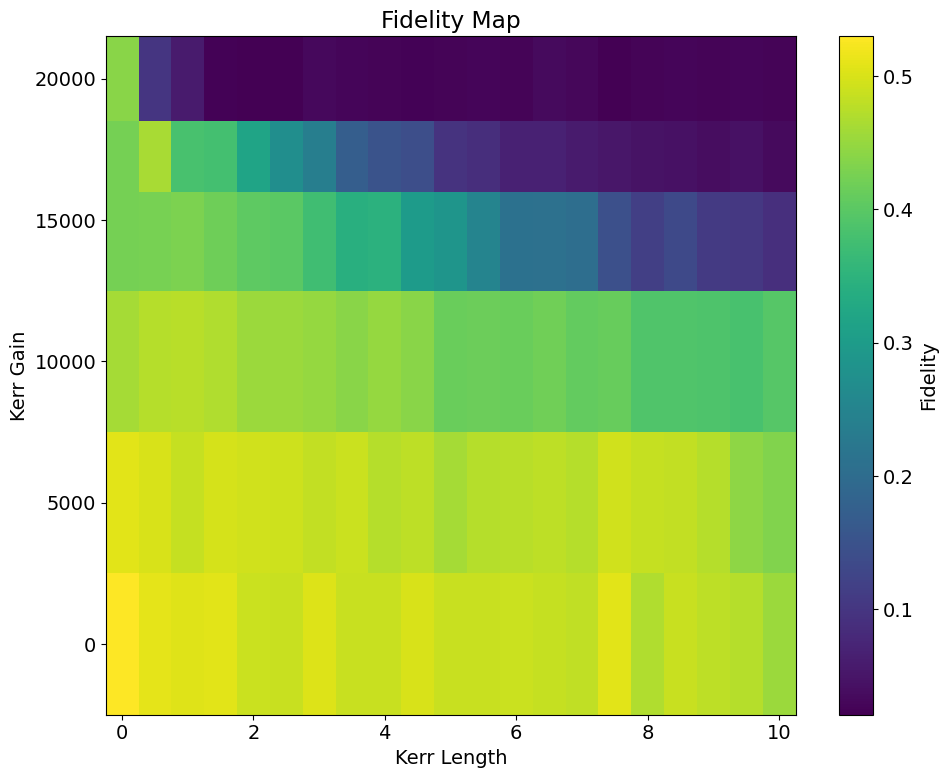

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import qutip as qt


data_list = []

for res in loaded_pickles:
    res.cfg.expt.parity_post_select = False
    
    res.analyze_wigner(cutoff=cutoff, debug=False)
    res.display(rotate=True, initial_state=ideal_state, mode_state_num=cutoff, station=station, save_fig=False)
    
    plt.close() 

    gain = res.cfg.expt.kerr_gains[0]
    length = res.cfg.expt.kerr_lengths[0]
    raw_fidelity = res.data['wigner_outputs']['fidelity']
    fidelity = float(np.squeeze(raw_fidelity))
    
    data_list.append({
        'kerr_gain': gain, 
        'kerr_length': length, 
        'fidelity': fidelity
    })

df = pd.DataFrame(data_list)
pivot_df = df.pivot_table(index='kerr_gain', columns='kerr_length', values='fidelity')

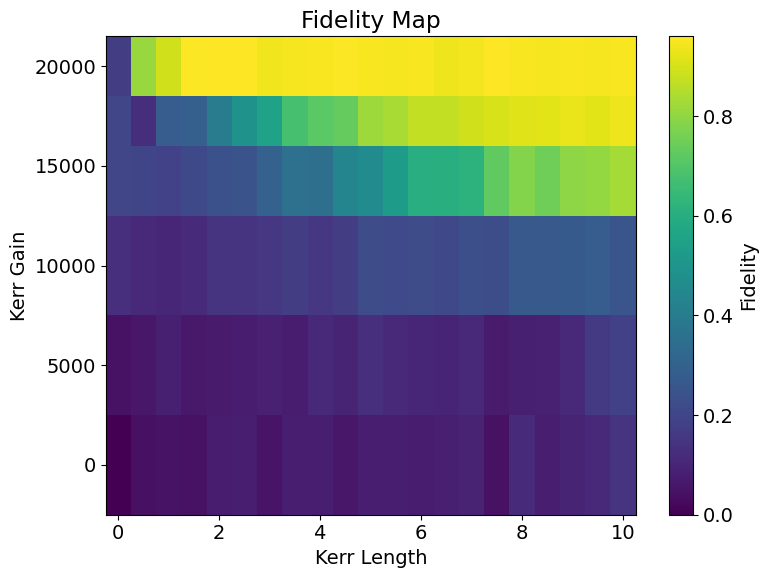

In [25]:
plt.figure(figsize=(8, 6))

X, Y = np.meshgrid(pivot_df.columns, pivot_df.index)
Z = 1- pivot_df.values/pivot_df.values[0][0]

heatmap = plt.pcolormesh(X, Y, Z, shading='auto', cmap='viridis')

plt.colorbar(heatmap, label='Fidelity')
plt.xlabel('Kerr Length')
plt.ylabel('Kerr Gain')
plt.title('Fidelity Map')
plt.tight_layout()

plt.show()

In [ ]:
plt.figure(figsize=(8, 6))

X, Y = np.meshgrid(pivot_df.columns, pivot_df.index)
Z = 1- pivot_df.values/pivot_df.values[0][0]

heatmap = plt.pcolormesh(X, Y, Z, shading='auto', cmap='viridis')

plt.colorbar(heatmap, label='Fidelity')
plt.xlabel('Kerr Length')
plt.ylabel('Kerr Gain')
plt.title('Fidelity Map')
plt.tight_layout()

plt.show()

0 1
shape (201, 1000)
max parity: 0.5200231142694287
max parity before scaling: 0.4535590277777777
Analyzing for kerr_gain=0, kerr_length=1
0 1


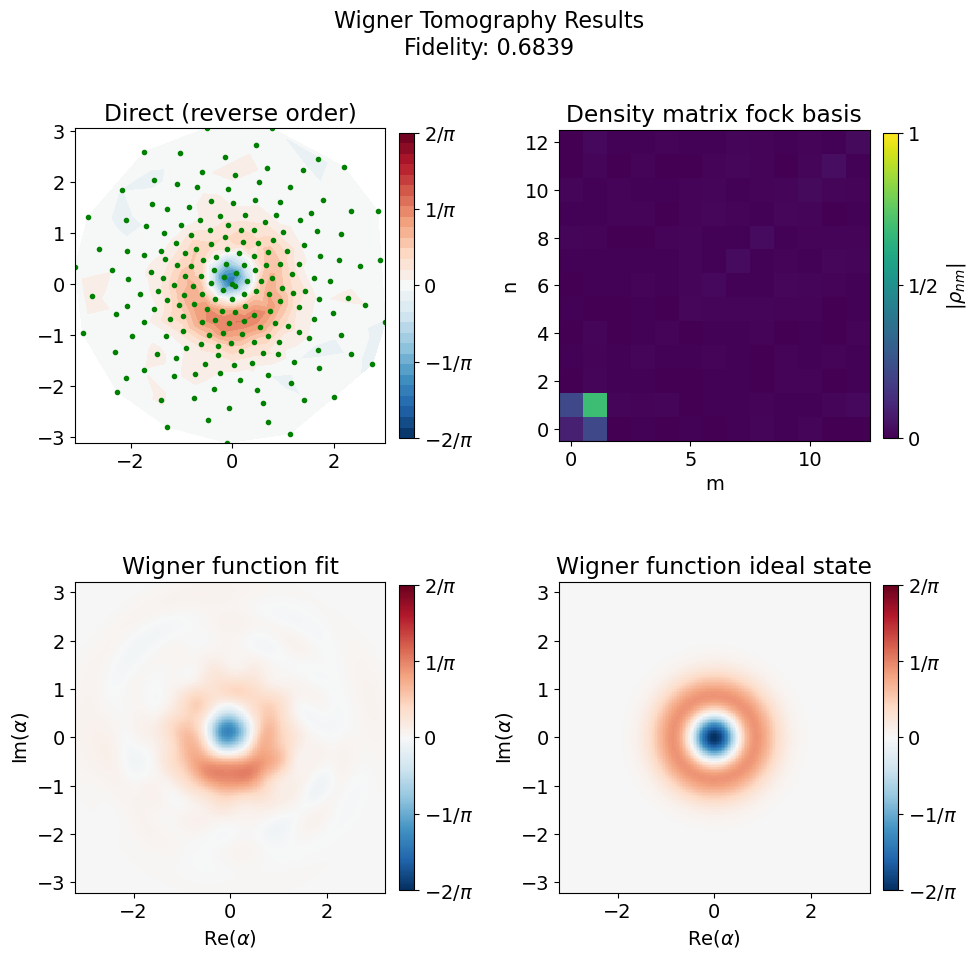

In [166]:
idx_to_plot_gain = 0
idx_to_plot_length = 0

cutoff = 13
ideal_state = (qt.basis(cutoff, 1)).unit()
# ideal_state = (qt.coherent(cutoff, 1.0)).unit()

result_to_draw = excursion_wigner_results[idx_to_plot_gain][idx_to_plot_length]
result_to_draw.cfg.expt.parity_post_select = False
result_to_draw.analyze_wigner(cutoff=cutoff, debug=True)
result_to_draw.display(rotate=True, initial_state=ideal_state, mode_state_num=cutoff, station=station, save_fig=False)
print(result_to_draw.cfg.expt.kerr_gain, result_to_draw.cfg.expt.kerr_length)


0 1
  parity post-select: keeping 163335/201000 shots (81.3%)
shape (201, 1000)
max parity: 0.5722742405835817
max parity before scaling: 0.4991319444444442
Analyzing for kerr_gain=0, kerr_length=1
0 1


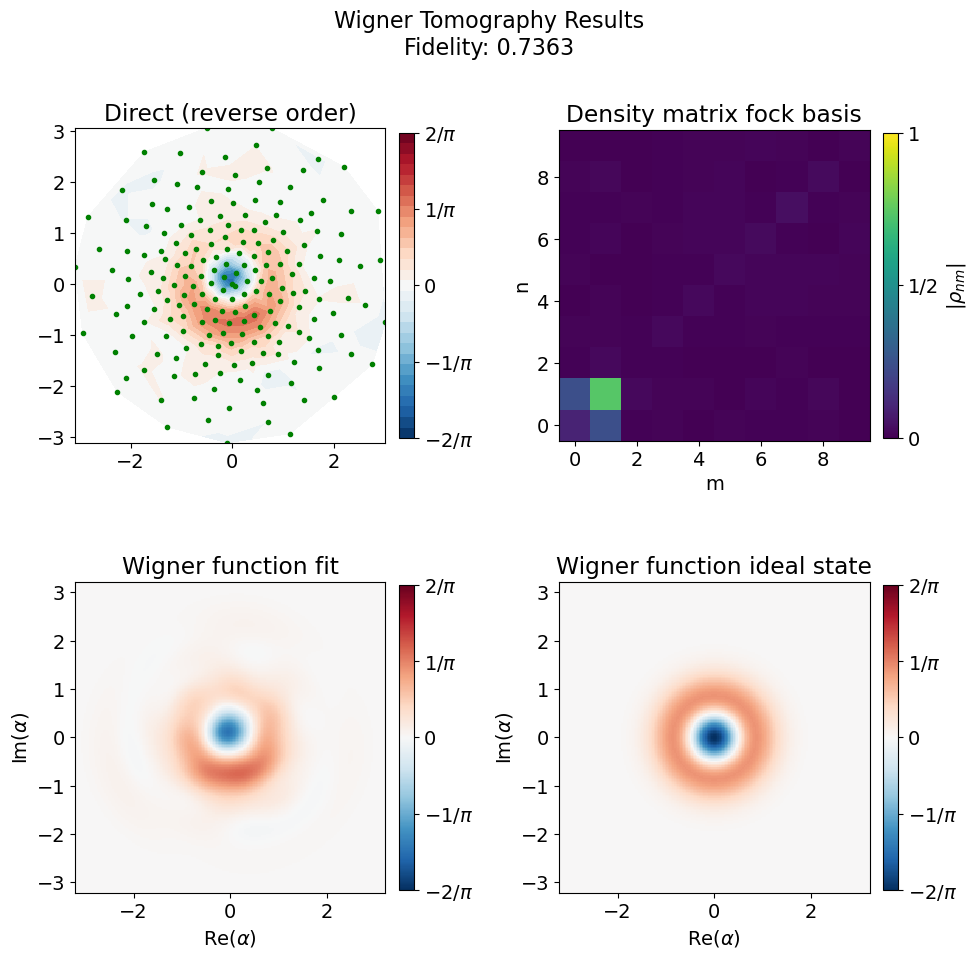

In [168]:
idx_to_plot_gain = 0
idx_to_plot_length = 0

cutoff = 10
ideal_state = (qt.basis(cutoff, 1)).unit()
# ideal_state = (qt.coherent(cutoff, 1.0)).unit()

result_to_draw = excursion_wigner_results[idx_to_plot_gain][idx_to_plot_length]
result_to_draw.cfg.expt.parity_post_select = True
result_to_draw.analyze_wigner(cutoff=cutoff, debug=True)
result_to_draw.display(rotate=True, initial_state=ideal_state, mode_state_num=cutoff, station=station, save_fig=False)
print(result_to_draw.cfg.expt.kerr_gain, result_to_draw.cfg.expt.kerr_length)


In [149]:
idx_to_plot_gain = 0
idx_to_plot_length = 0

cutoff = 10
ideal_state = (qt.basis(cutoff, 1)).unit()
# ideal_state = (qt.coherent(cutoff, 1.0)).unit()

result_to_draw = excursion_wigner_results[idx_to_plot_gain][idx_to_plot_length]
result_to_draw.analyze_wigner(cutoff=cutoff, debug=True)
result_to_draw.display(rotate=True, initial_state=ideal_state, mode_state_num=cutoff, station=station, save_fig=False)
print(result_to_draw.cfg.expt.kerr_gain, result_to_draw.cfg.expt.kerr_length)


0 1


IndexError: index 3 is out of bounds for axis 1 with size 2

In [132]:
import io
import matplotlib.pyplot as plt
from PIL import Image
# import qutip as qt (Assuming it's already imported)

# Initialize settings
idx_to_plot_gain = 0
cutoff = 12
ideal_state = (qt.basis(cutoff, 1)).unit()

# List to store the generated image frames
frames = []

# Get the total number of length steps for the selected gain
num_lengths = len(excursion_wigner_results[idx_to_plot_gain])

# Extract the kerr_gain value from the first item to use in the filename
kerr_gain_val = excursion_wigner_results[idx_to_plot_gain][0].cfg.expt.kerr_gain

print(f"Starting GIF generation for Gain = {kerr_gain_val}...")

for idx_to_plot_length in range(num_lengths):
    result_to_draw = excursion_wigner_results[idx_to_plot_gain][idx_to_plot_length]
    
    current_gain = result_to_draw.cfg.expt.kerr_gain
    current_length = result_to_draw.cfg.expt.kerr_length

    # Analyze Wigner function (debug=False is recommended to keep the console clean)
    result_to_draw.analyze_wigner(cutoff=cutoff, debug=False) 
    
    # Execute custom display function (draws on the screen but doesn't save to disk)
    result_to_draw.display(rotate=True, initial_state=ideal_state, mode_state_num=cutoff, station=station, save_fig=False)
    
    # Grab the current figure and add a title with the Gain and Length
    fig = plt.gcf()
    fig.suptitle(f"Kerr Gain: {current_gain} | Kerr Length: {current_length}", fontsize=14, fontweight='bold')
    
    # Adjust layout to prevent the title from overlapping with the plot
    fig.tight_layout()

    # Save the current matplotlib figure to a memory buffer as a PNG
    buf = io.BytesIO()
    plt.savefig(buf, format='png', bbox_inches='tight')
    buf.seek(0)
    
    # Read the image from the buffer using PIL and append a safe copy to our list
    img = Image.open(buf)
    frames.append(img.copy()) 
    buf.close()
    
    # Clear and close the figure so the next frame doesn't overlap
    plt.close('all') 
    
    print(f"Processed frame {idx_to_plot_length + 1}/{num_lengths} "
          f"(Gain: {current_gain}, Length: {current_length})")

# Combine the collected frames and save as a single GIF
if frames:
    # Save the file with the gain value explicitly in the filename
    gif_filename = f'wigner_evolution_gain_{kerr_gain_val}.gif'
    
    frames[0].save(
        gif_filename,
        save_all=True,
        append_images=frames[1:],
        duration=200,  # Duration of each frame in milliseconds (200ms = 5 fps)
        loop=0         # 0 means infinite loop
    )
    print(f"Successfully saved GIF as: {gif_filename}")

Starting GIF generation for Gain = 13000...
13000 0.007
shape (201, 100)
max parity: 0.5971557293046071
max parity before scaling: 0.5208333333333333
Analyzing for kerr_gain=13000, kerr_length=0.007
Processed frame 1/21 (Gain: 13000, Length: 0.007)
13000 0.05
shape (201, 100)
max parity: 0.5847149849440945
max parity before scaling: 0.5099826388888888
Analyzing for kerr_gain=13000, kerr_length=0.05
Processed frame 2/21 (Gain: 13000, Length: 0.05)
13000 0.1
shape (201, 100)
max parity: 0.5225112631415313
max parity before scaling: 0.45572916666666663
Analyzing for kerr_gain=13000, kerr_length=0.1
Processed frame 3/21 (Gain: 13000, Length: 0.1)
13000 0.15
shape (201, 100)
max parity: 0.5100705187810184
max parity before scaling: 0.444878472222222
Analyzing for kerr_gain=13000, kerr_length=0.15
Processed frame 4/21 (Gain: 13000, Length: 0.15)
13000 0.2
shape (201, 100)
max parity: 0.43542605261794276
max parity before scaling: 0.3797743055555556
Analyzing for kerr_gain=13000, kerr_length=

In [119]:
station.update_all_station_snapshots()

[CONFIG] Reusing existing hardware_config version CFG-HW-20260416-00011
[CONFIG] Reusing existing multiphoton_config version CFG-MP-20260121-00001
[CONFIG] Reusing existing man1_storage_swap version CFG-M1-20260416-00012
[CONFIG] Reusing existing floquet_storage_swap version CFG-FL-20260401-00021
Config snapshots for current station:
  hardware_config: CFG-HW-20260416-00011
  multiphoton_config: CFG-MP-20260121-00001
  man1_storage_swap: CFG-M1-20260416-00012
  floquet_storage_swap: CFG-FL-20260401-00021


{'hardware_config': 'CFG-HW-20260416-00011',
 'multiphoton_config': 'CFG-MP-20260121-00001',
 'man1_storage_swap': 'CFG-M1-20260416-00012',
 'floquet_storage_swap': 'CFG-FL-20260401-00021'}

## Manipulate f0g1 Ramsey

In [3]:
f0g1_expt_params_default = AttrDict(dict(
    expts=1,
    reps = 100,
    rounds = 1,
    qubits=[0],
    ro_stor = 0,
    
	init_fock = False,
	perform_wigner=False,
    parity_fast=False,
    pulse_correction=True,
    
    kerr_gains = [0],
    kerr_lengths = np.linspace(0.007, 3, 31),
    swept_params = ['kerr_length'],
    kerr_freq = 200,
    
    # start=0.01, # us
    # step=0.1,
    use_flat_top = True,
    
    relax_delay = 2500,
    normalize = False,
    post_select_pre_pulse=False,
    active_reset = False,
    man_reset = False,
    storage_reset = False,
    init_stor = 0,
    prepulse = True,
    postpulse = True,
))

manf0g1ramseyrunner = CharacterizationRunner(
    station=station,
    ExptClass=meas.QsimBaseExperiment,
    ExptProgram=meas.qsim.t2_cavity_fluxexcursion.Manf0g1RamseyProgram,
    default_expt_cfg=f0g1_expt_params_default,
    job_client=client,
)

In [120]:
f0g1_result_list = []
# kerr_gain_list = np.arange(0, 101, 50)
kerr_gain_list = [0]
ramsey_freq_list = [0, 25, 50, 75] #for debugging virtual ramsey. Should be in MHz, and should be smaller than 1/(kerr_length) to see clear oscillation.
# for kerr_gain in tqdm(kerr_gain_list):
for ramsey_freq in tqdm(ramsey_freq_list): #for debugging virtual ramsey. 
	man_f0g1_ramsey_result = manf0g1ramseyrunner.execute(
		reps = 100,
		init_fock = False,
		init_alpha = 1.0,
		init_stor=0,
		ro_stor=0,
		relax_delay = 20,
		parity_fast = False,
		init_man_fock_state = '1',
		# kerr_lengths = np.linspace(0.007, 5, 501).tolist(),
		kerr_lengths = np.arange(4, 201, 2).tolist(),
  		do_virtual_ramsey = True,
  		virtual_ramsey_freq = ramsey_freq, #MHz
		use_clock = True,
  
		# kerr_gain = kerr_gain,
		kerr_gain = 0, #for debugging virtual ramsey. 
    	kerr_freq = 0,
		active_reset = True,
		man_reset = True,
		storage_reset = False,
		reset_dump_mode = 1,
  		use_flat_top = False,

		
		parity_check = False,
		parity_post_select = False,

		skip_kerr_pulse = False,
		skip_all = False,
		debug = True,
		prepulse = False,
		postpulse = False
	)
	f0g1_result_list.append(man_f0g1_ramsey_result)

  0%|          | 0/4 [00:00<?, ?it/s]

Job submitted: JOB-20260420-00308 (queue position: 2)

[0.1s] Job JOB-20260420-00308: pending

[81.5s] Job JOB-20260420-00308: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260420-00308_QsimBaseExperiment.h5
[WORKER]   Program: Manf0g1RamseyProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.3mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
  0%|                                                   | 0/99 [00:00<?, ?it/s]using clock for kerr length. the time is 0.009300595238095238
Applying virtual ramsey phase shift of 0.0 degrees to compensate for frequency detuning during kerr pulse
[['man', 'M1', 'hpi', 0.0], ['qubit', 'ef', 'pi', 0]]
using clock for kerr length. the time is  0.009300595238095238
playing man_hpi_seq
  1%|▍                                          | 1/99 [00:00<00:27,  3.62i

### For Virtual Ramsey Debugging

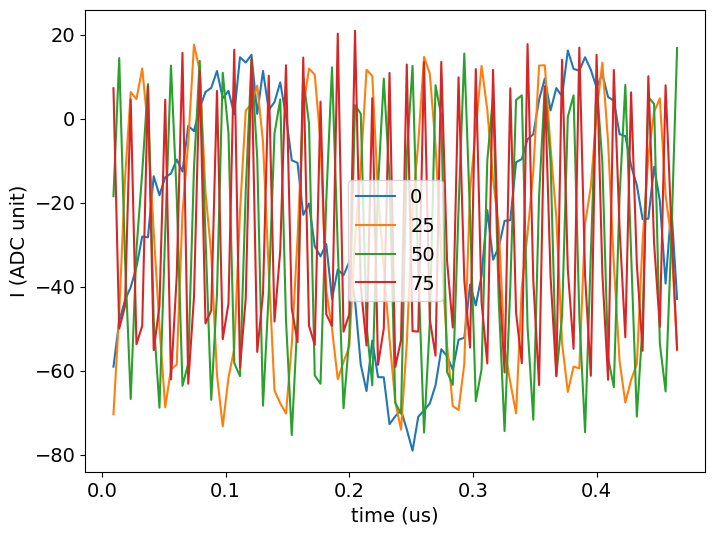

In [121]:
idx_to_plot_list = [0, 1, 2, 3]
fig, ax = plt.subplots(figsize = (8,6))
for idx_to_plot in idx_to_plot_list:
	time_x = f0g1_result_list[idx_to_plot].cfg.expt.kerr_lengths
	if f0g1_result_list[idx_to_plot].cfg.expt.use_clock:
		time_x = [station.soccfg.cycles2us(int(x)) for x in time_x]
	idata_z = f0g1_result_list[idx_to_plot].data['avgi']
	ax.plot(time_x, idata_z, label = f"{ramsey_freq_list[idx_to_plot]}")
ax.set_xlabel("time (us)")
ax.set_ylabel("I (ADC unit)")
ax.legend()

Text(0, 0.5, 'gain (ADC unit)')

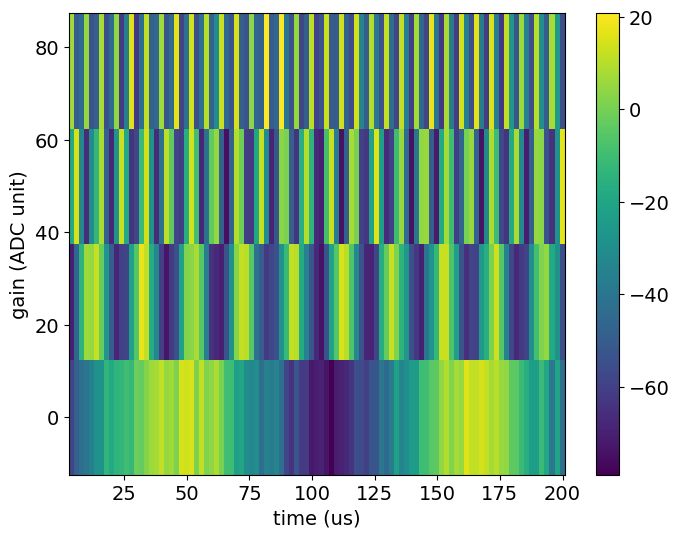

In [122]:

time_x = f0g1_result_list[0].cfg.expt.kerr_lengths
gain_y = ramsey_freq_list
data_z = np.array([f0g1_result.data['avgi'] for f0g1_result in f0g1_result_list])
fig, ax = plt.subplots(figsize = (8,6))
c = ax.pcolor(*np.meshgrid(time_x, gain_y), data_z)
fig.colorbar(c)
ax.set_xlabel("time (us)")
ax.set_ylabel("gain (ADC unit)")

### Gain vs Ramsey

In [ ]:
f0g1_result_list = []
kerr_gain_list = np.arange(0, 5001, 1000)
# kerr_gain_list = [0]
for kerr_gain in tqdm(kerr_gain_list):
	man_f0g1_ramsey_result = manf0g1ramseyrunner.execute(
		reps = 100,
		init_fock = False,
		init_alpha = 1.0,
		init_stor=0,
		ro_stor=0,
		relax_delay = 20,
		parity_fast = False,
		init_man_fock_state = '1',
		# kerr_lengths = np.linspace(0.007, 5, 501).tolist(),
		kerr_lengths = np.arange(4, 36, 1).tolist(),
  		do_virtual_ramsey = True,
  		virtual_ramsey_freq = 30, #MHz
		use_clock = True,
  
		kerr_gain = kerr_gain,
		
    	kerr_freq = 0,
		active_reset = True,
		man_reset = True,
		storage_reset = False,
		reset_dump_mode = 1,
  		use_flat_top = False,

		
		parity_check = False,
		parity_post_select = False,

		skip_kerr_pulse = False,
		skip_all = False,
		debug = True,
		prepulse = False,
		postpulse = False
	)
	f0g1_result_list.append(man_f0g1_ramsey_result)

  0%|          | 0/6 [00:00<?, ?it/s]

Job submitted: JOB-20260420-00331 (queue position: 1)

[0.2s] Job JOB-20260420-00331: pending

[2.2s] Job JOB-20260420-00331: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260420-00331_QsimBaseExperiment.h5
[WORKER]   Program: Manf0g1RamseyProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.3mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
  0%|                                                   | 0/32 [00:00<?, ?it/s]using clock for kerr length. the time is 0.009300595238095238
Applying virtual ramsey phase shift of 100.44642857142857 degrees to compensate for frequency detuning during kerr pulse
[['man', 'M1', 'hpi', 100.44642857142857], ['qubit', 'ef', 'pi', 0]]
using clock for kerr length. the time is  0.009300595238095238
playing man_hpi_seq
  3%|█▎                                       

Text(0, 0.5, 'gain (ADC unit)')

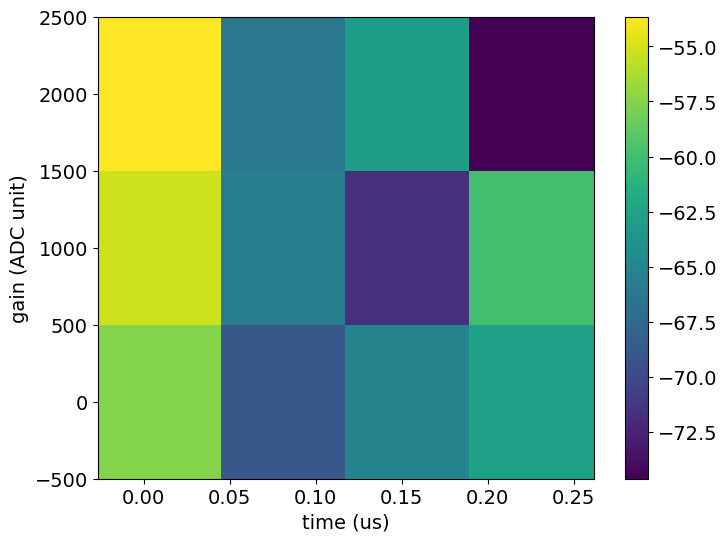

In [135]:
cutoff_idx = 3
time_x = f0g1_result_list[0].cfg.expt.kerr_lengths
if f0g1_result_list[0].cfg.expt.use_clock:
	time_x = [station.soccfg.cycles2us(int(x)) for x in time_x]
gain_y = kerr_gain_list[:cutoff_idx]
data_z = np.array([f0g1_result.data['avgi'] for f0g1_result in f0g1_result_list[:cutoff_idx]])
fig, ax = plt.subplots(figsize = (8,6))
c = ax.pcolor(*np.meshgrid(time_x, gain_y), data_z)
fig.colorbar(c)
ax.set_xlabel("time (us)")
ax.set_ylabel("gain (ADC unit)")

Text(0, 0.5, 'gain (ADC unit)')

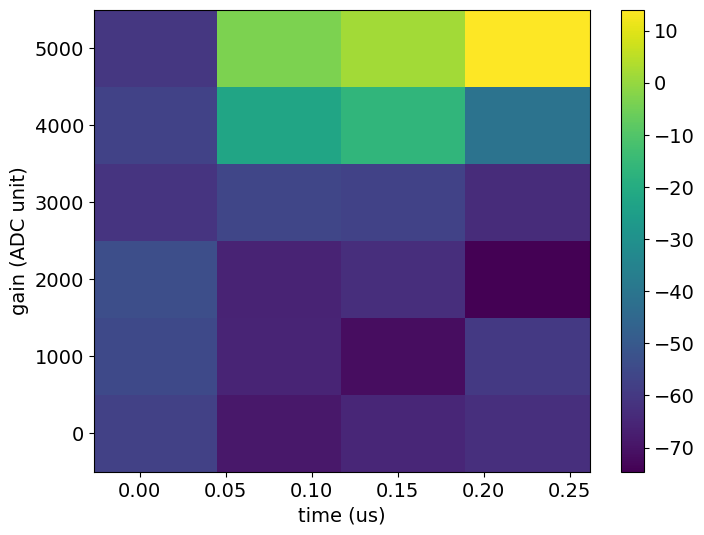

In [134]:
time_x = f0g1_result_list[0].cfg.expt.kerr_lengths
if f0g1_result_list[0].cfg.expt.use_clock:
	time_x = [station.soccfg.cycles2us(int(x)) for x in time_x]
gain_y = kerr_gain_list
data_z = np.array([f0g1_result.data['avgi'] for f0g1_result in f0g1_result_list])
fig, ax = plt.subplots(figsize = (8,6))
c = ax.pcolor(*np.meshgrid(time_x, gain_y), data_z)
fig.colorbar(c)
ax.set_xlabel("time (us)")
ax.set_ylabel("gain (ADC unit)")

Fitting started...
Fitting completed!


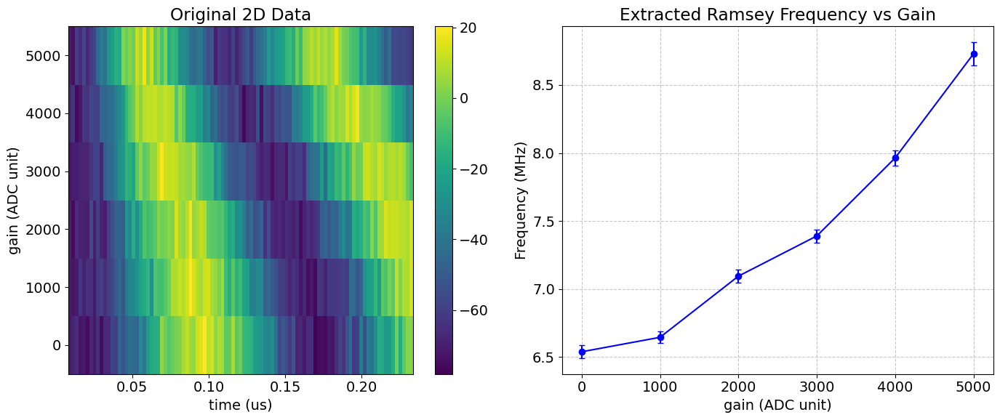

In [130]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.fft import rfft, rfftfreq
from fitting.fit_utils import guess_sinusoidal_params, guess_decaysin_params


def decaysin_func(x, amp, freq, phase_deg, decay, offset):
    phase_rad = phase_deg * np.pi / 180.0
    return amp * np.sin(2 * np.pi * freq * x + phase_rad) * np.exp(-x / decay) + offset

extracted_freqs = []
extracted_freqs_err = []

print("Fitting started...")
for i, gain in enumerate(gain_y):
    z_slice = data_z[i, :]
    
    p0 = guess_decaysin_params(time_x, z_slice)
    
    try:
        popt, pcov = curve_fit(decaysin_func, time_x, z_slice, p0=p0, maxfev=10000)
        
        freq = popt[1]
        freq_err = np.sqrt(pcov[1][1]) 
        
        extracted_freqs.append(abs(freq))
        extracted_freqs_err.append(freq_err)
        
    except Exception as e:
        print(f"Fit failed for gain {gain}: {e}")
        extracted_freqs.append(np.nan)
        extracted_freqs_err.append(np.nan)

print("Fitting completed!")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

c = ax1.pcolor(*np.meshgrid(time_x, gain_y), data_z)
fig.colorbar(c, ax=ax1)
ax1.set_title("Original 2D Data")
ax1.set_xlabel("time (us)")
ax1.set_ylabel("gain (ADC unit)")

ax2.errorbar(gain_y, extracted_freqs, yerr=extracted_freqs_err, fmt='-o', color='b', capsize=3)
ax2.set_title("Extracted Ramsey Frequency vs Gain")
ax2.set_xlabel("gain (ADC unit)")
ax2.set_ylabel("Frequency (MHz)")
ax2.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

Robust Fitting started...
Fitting completed!


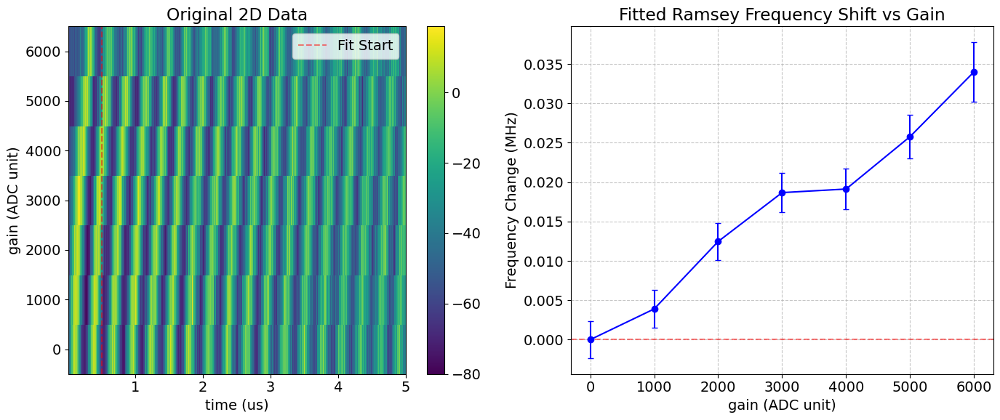

In [55]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.fft import rfft, rfftfreq

def decaysin_func(x, amp, freq, phase_deg, decay, offset):
    phase_rad = phase_deg * np.pi / 180.0
    return amp * np.sin(2 * np.pi * freq * x + phase_rad) * np.exp(-x / decay) + offset

crop_time_us = 0.5
crop_idx = np.searchsorted(time_x, crop_time_us)

t_fit = time_x[crop_idx:]
dt = t_fit[1] - t_fit[0]

extracted_freqs = []
extracted_freqs_err = []

print("Robust Fitting started...")
for i, gain in enumerate(gain_y):
    z_slice = data_z[i, :]
    
    z_fit = z_slice[crop_idx:]
    
    z_centered = z_fit - np.mean(z_fit)
    yf = rfft(z_centered, n=len(t_fit)*10) 
    xf = rfftfreq(len(t_fit)*10, d=dt)
    f_guess = xf[np.argmax(np.abs(yf))]
    
    amp_guess = (np.max(z_fit) - np.min(z_fit)) / 2
    offset_guess = np.mean(z_fit)
    decay_guess = 10.0  # 적당히 긴 값
    
    p0 = [amp_guess, f_guess, 0, decay_guess, offset_guess]
    
    lower_bounds = [0,      f_guess - 0.1, -360, 0.001,  -np.inf]
    upper_bounds = [np.inf, f_guess + 0.1,  360, np.inf,  np.inf]
    
    try:
        popt, pcov = curve_fit(
            decaysin_func, 
            t_fit, 
            z_fit, 
            p0=p0, 
            bounds=(lower_bounds, upper_bounds), 
            method='trf', 
            maxfev=10000
        )
        
        freq = popt[1]
        freq_err = np.sqrt(pcov[1][1]) 
        
        extracted_freqs.append(abs(freq))
        extracted_freqs_err.append(freq_err)
        
    except Exception as e:
        print(f"Fit failed for gain {gain}: {e}")
        extracted_freqs.append(np.nan)
        extracted_freqs_err.append(np.nan)

print("Fitting completed!")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

c = ax1.pcolor(*np.meshgrid(time_x, gain_y), data_z)
fig.colorbar(c, ax=ax1)
ax1.set_title("Original 2D Data")
ax1.set_xlabel("time (us)")
ax1.set_ylabel("gain (ADC unit)")
ax1.axvline(crop_time_us, color='red', linestyle='--', alpha=0.5, label='Fit Start')
ax1.legend(loc='upper right')

freqs_arr = np.array(extracted_freqs)
errs_arr = np.array(extracted_freqs_err)

freq_diff = freqs_arr - freqs_arr[0]
diff_err = np.sqrt(errs_arr**2 + errs_arr[0]**2)

ax2.errorbar(gain_y, freq_diff, yerr=diff_err, fmt='-o', color='b', capsize=3)
ax2.set_title("Fitted Ramsey Frequency Shift vs Gain")
ax2.set_xlabel("gain (ADC unit)")
ax2.set_ylabel("Frequency Change (MHz)")
ax2.axhline(0, color='red', linestyle='--', alpha=0.5)
ax2.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

In [132]:
station.ds_storage.df

,stor_name,freq (MHz),precision (MHz),pi (mus),h_pi (mus),gain (DAC units),last_update,bs_rate_coeffs_g,bs_rate_coeffs_e,freq_coeffs_g,freq_coeffs_e,gain_range_g,gain_range_e,joint_parity,dr_ac_stark_rate,dr_jp_phase
0,M1-S1,337.911465,NaN,1.160766,0.580383,1988,2026-02-18 15:08:57.056086,"[2.71800440497595e-10, 3.5345716702085755e-05,...","[2.617101263255993e-10, 3.5294007231684914e-05...","[-5.581106410081517e-38, 3.497594370968036e-33...","[-5.787229142339564e-38, 3.802111265047564e-33...","[2823.494166114352, 10936.689003179721]","[2834.8504180018463, 11002.012121829115]","[352.95224967922866, 3259, 3.513105914802541, ...",NaN,NaN
1,M1-S2,519.165991,NaN,NaN,NaN,8000,2026-02-16 11:03:05.923149,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,M1-S3,704.773842,NaN,NaN,NaN,8000,2026-02-16 11:03:50.953771,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,M1-S4,884.800000,NaN,NaN,NaN,8000,2026-02-16 11:14:55.518073,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,M1-S5,1059.095666,NaN,NaN,NaN,8000,2026-02-16 11:05:21.322244,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,M1-S6,1247.520031,NaN,NaN,NaN,15000,2026-02-16 11:17:28.123789,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,M1-S7,1409.677237,NaN,1.185817,0.592909,15025,2026-02-18 15:12:49.264886,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,M1-S8,-1.000000,-1.00,-1.000000,-1.000000,-1,51:31.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,M1-S9,-1.000000,-1.00,-1.000000,-1.000000,-1,51:31.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,M1-S10,-1.000000,-1.00,-1.000000,-1.000000,-1,51:31.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


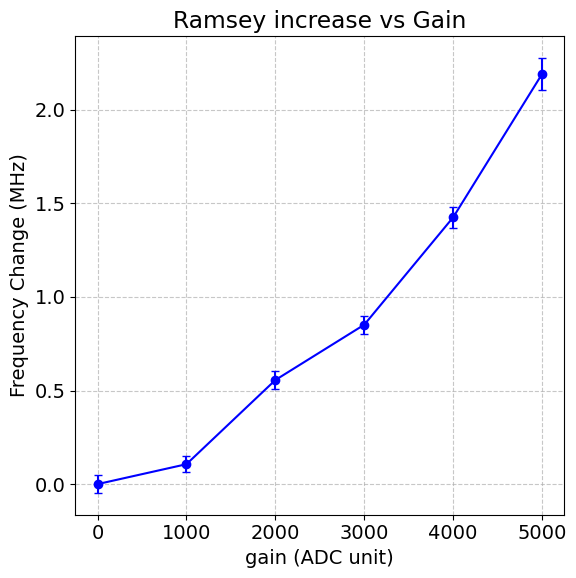

In [131]:
fig, ax = plt.subplots( figsize=(6, 6))
freq_diff = np.abs(extracted_freqs - extracted_freqs[0])
ax.errorbar(gain_y, freq_diff, yerr=extracted_freqs_err, fmt='-o', color='b', capsize=3)
ax.set_title("Ramsey increase vs Gain")
ax.set_xlabel("gain (ADC unit)")
ax.set_ylabel("Frequency Change (MHz)")
ax.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

In [24]:
print("freq_diff (MHz)", freq_diff)
print("freq_err (MHz)", extracted_freqs_err)
print("gain (ADC unit)", gain_y)

freq_diff (MHz) [0.         0.01009223 0.04090202 0.11405636 0.19416141 0.30704937
 0.44455451 0.60490885 0.79844512 1.01214203 1.25158611 1.50708458
 1.72622237 2.35901997 2.74293378]
freq_err (MHz) [0.002960399250187353, 0.0026598724918562014, 0.003089771928986843, 0.00296464386207969, 0.0026111380628938623, 0.0030968088389552503, 0.0028287352028000634, 0.0029282985406491693, 0.0028169293747353965, 0.0030391837300716273, 0.0030400259658626733, 0.0035206489365641742, 0.0041372546684371484, 0.05574630037862021, 0.005754078632993864]
gain (ADC unit) [    0  1000  2000  3000  4000  5000  6000  7000  8000  9000 10000 11000
 12000 13000 14000]


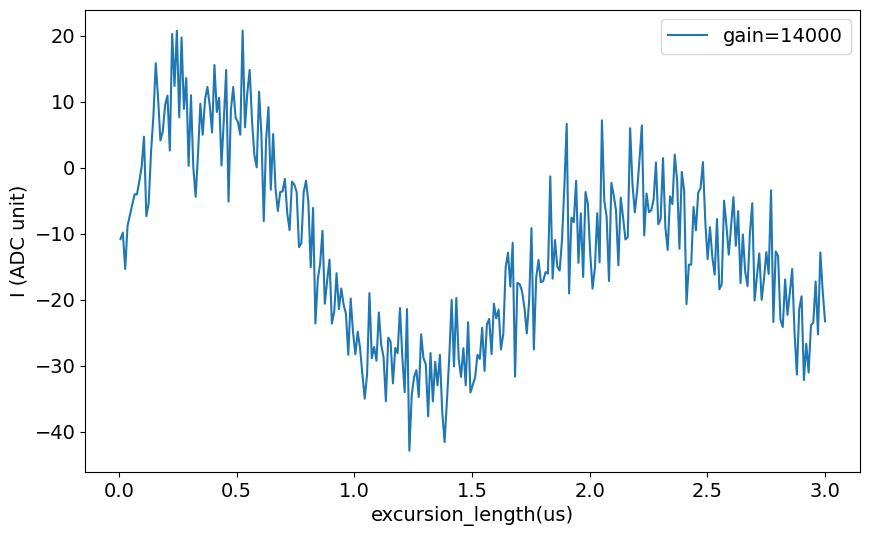

In [6]:
plt.plot(man_f0g1_ramsey_result.cfg.expt.kerr_lengths, man_f0g1_ramsey_result.data['avgi'], label = f"gain={man_f0g1_ramsey_result.cfg.expt.kerr_gain}")
plt.xlabel('excursion_length(us)')
plt.ylabel("I (ADC unit)")
plt.legend()

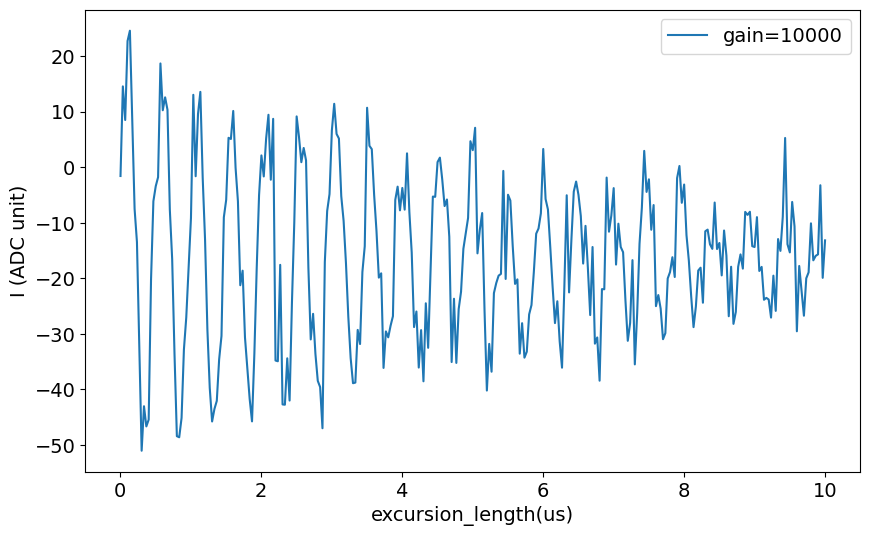

In [5]:
plt.plot(man_f0g1_ramsey_result.cfg.expt.kerr_lengths, man_f0g1_ramsey_result.data['avgi'], label = f"gain={man_f0g1_ramsey_result.cfg.expt.kerr_gain}")
plt.xlabel('excursion_length(us)')
plt.ylabel("I (ADC unit)")
plt.legend()

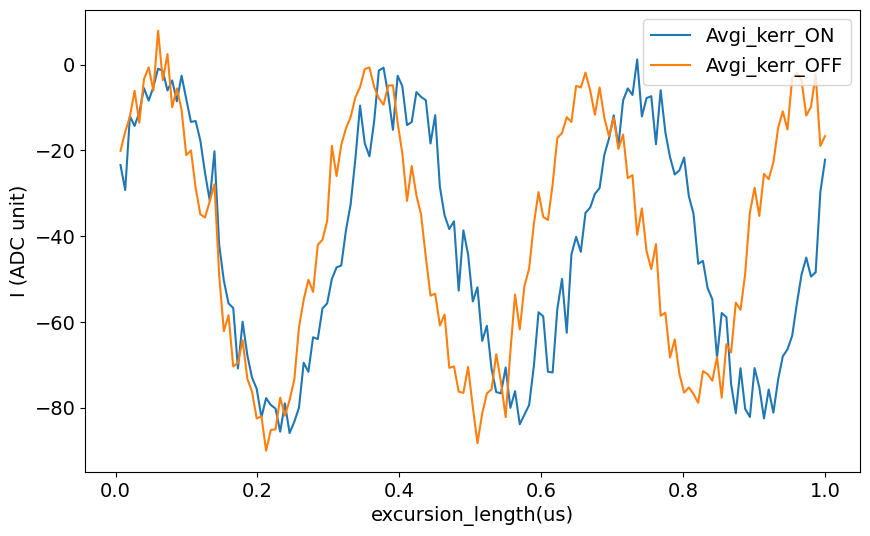

In [207]:
plt.plot(man_f0g1_ramsey_result.cfg.expt.kerr_lengths, man_f0g1_ramsey_result.data['avgi'], label = "Avgi_kerr_ON")
plt.plot(data_1_x, data_1_y, label = "Avgi_kerr_OFF")
plt.xlabel('excursion_length(us)')
plt.ylabel("I (ADC unit)")
plt.legend()

### Excursion Freq vs Ramsey

In [52]:
f0g1_result_list = []
# kerr_gain_list = np.arange(0, 5001, 1000)
kerr_freq_list = np.arange(0, 401, 40).tolist()
# kerr_freq_list = [0] 
for kerr_freq in tqdm(kerr_freq_list):
	man_f0g1_ramsey_result = manf0g1ramseyrunner.execute(
		reps = 100,
		init_fock = False,
		init_alpha = 1.0,
		init_stor=0,
		ro_stor=0,
		relax_delay = 20,
		parity_fast = False,
		init_man_fock_state = '1',
		# kerr_lengths = np.linspace(0.007, 5, 501).tolist(),
		kerr_lengths = np.arange(5, 1001, 5).tolist(),
  		do_virtual_ramsey = True,
  		virtual_ramsey_freq = 0, #MHz
		use_clock = True,
  
		kerr_gain = 1000,
		
    	kerr_freq = kerr_freq,
		active_reset = True,
		man_reset = True,
		storage_reset = False,
		reset_dump_mode = 1,
  		use_flat_top = False,

		
		parity_check = False,
		parity_post_select = False,

		skip_kerr_pulse = False,
		skip_all = False,
		debug = False,
		prepulse = False,
		postpulse = False
	)
	f0g1_result_list.append(man_f0g1_ramsey_result)

  0%|          | 0/11 [00:00<?, ?it/s]

Job submitted: JOB-20260421-00210 (queue position: 1)

[0.1s] Job JOB-20260421-00210: pending

[3.2s] Job JOB-20260421-00210: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260421-00210_QsimBaseExperiment.h5
[WORKER]   Program: Manf0g1RamseyProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.3mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 94%|█████████████████████████████████████▌  | 188/200 [00:33<00:02,  5.45it/s]
[41.9s] Job JOB-20260421-00210: completed
100%|████████████████████████████████████████| 200/200 [00:35<00:00,  5.58it/s]
Saving D:\experiments\260403_kerr_excusion_redone\data\JOB-20260421-00210_QsimBaseExperiment.h5
[WORKER] Saving expt object to: D:\experiments\260403_kerr_excusion_redone\expt_objs\JOB-20260421-00210_expt.pkl

Job completed! Data: D:\experiments\260403_kerr_

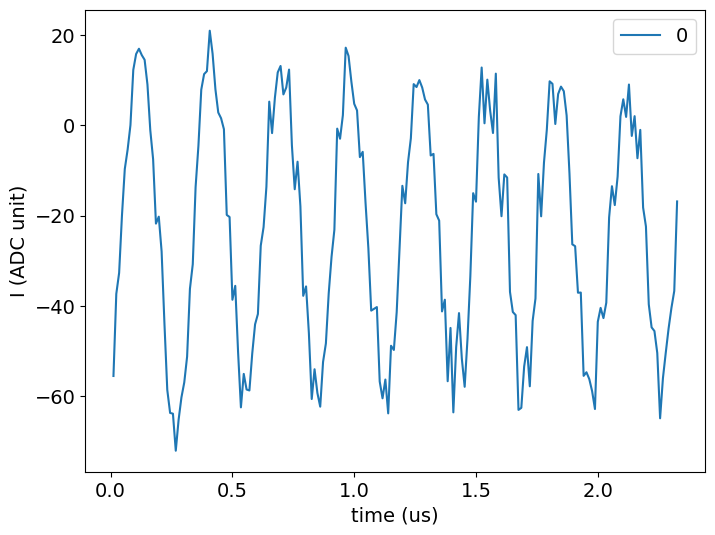

In [53]:
idx_to_plot_list = [0]
fig, ax = plt.subplots(figsize = (8,6))
for idx_to_plot in idx_to_plot_list:
	time_x = f0g1_result_list[idx_to_plot].cfg.expt.kerr_lengths
	if f0g1_result_list[idx_to_plot].cfg.expt.use_clock:
		time_x = [station.soccfg.cycles2us(int(x)) for x in time_x]
	idata_z = f0g1_result_list[idx_to_plot].data['avgi']
	ax.plot(time_x, idata_z, label = f"{kerr_freq_list[idx_to_plot]}")
ax.set_xlabel("time (us)")
ax.set_ylabel("I (ADC unit)")
ax.legend()

Text(0.5, 1.0, 'Ramsey at kerr gain = 1000')

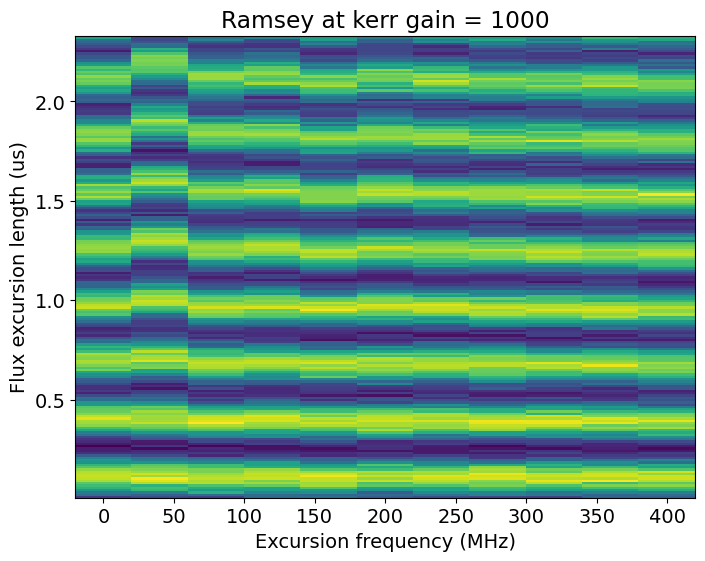

In [56]:
fig, ax = plt.subplots(figsize = (8,6))
z_data = []
time_x = f0g1_result_list[0].cfg.expt.kerr_lengths
if f0g1_result_list[0].cfg.expt.use_clock:
	time_x = [station.soccfg.cycles2us(int(x)) for x in time_x]
for idx in range(len(kerr_freq_list)):
	z_data.append(f0g1_result_list[idx].data['avgi'])
z_data = np.array(z_data)
ax.pcolor(*np.meshgrid(kerr_freq_list, time_x), np.transpose(z_data))
ax.set_xlabel("Excursion frequency (MHz)")
ax.set_ylabel("Flux excursion length (us)")
ax.set_title(f"Ramsey at kerr gain = {f0g1_result_list[0].cfg.expt.kerr_gain}")

## Man Spectroscopy using Flux line

In [27]:
# Configuration defaults
stor_spec_defaults = AttrDict(dict(
    step=0.08,  # bw/expts = 20/250
    expts=250,
    reps=200,
    qubit=[0],
    qubits=[0], # oh well
    man_mode_no=1, 
    stor_mode_no=1, 
    bw=20, 
    flux_drive_ch = None, # if None, will default to value in ds_storage
    flux_drive_gain = None, # if None, will default to value in ds_storage
    flux_drive_duration=5,
    prepulse=True,
    postpulse=True,
    active_reset=False,
    relax_delay=500,
))

# Storage Spectroscopy - New Pattern with CharacterizationRunner
from experiments.MM_dual_rail_base import MM_dual_rail_base

def get_storage_mode_parameters(ds_storage, config_thisrun, man_mode_no, stor_mode_no):
    """Get pulse parameters for a given storage mode."""
    stor_name = 'M' + str(man_mode_no) + '-S' + str(stor_mode_no)
    freq = ds_storage.get_freq(stor_name)
    gain = ds_storage.get_gain(stor_name)
    pi_len = ds_storage.get_pi(stor_name)
    h_pi_len = ds_storage.get_h_pi(stor_name)
    # flux_low_ch = config_thisrun.hw.soc.dacs.flux_low.ch
    # flux_high_ch = config_thisrun.hw.soc.dacs.flux_high.ch
    # ch = flux_low_ch if freq < 1000 else flux_high_ch
    ch = 'low' if freq < 1800 else 'high'

    mm_base_dummy = MM_dual_rail_base(config_thisrun, soccfg=station.soccfg)
    prep_man_pi = mm_base_dummy.prep_man_photon(man_mode_no)
    prepulse = mm_base_dummy.get_prepulse_creator(prep_man_pi).pulse.tolist()
    postpulse = mm_base_dummy.get_prepulse_creator(prep_man_pi[-1:-3:-1]).pulse.tolist()

    return freq, gain, pi_len, h_pi_len, ch, prepulse, postpulse

def stor_spec_preproc(station, default_expt_cfg, **kwargs):
    """Preprocessor for storage spectroscopy."""
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)
    
    # Get storage mode parameters
    freq, gain, pi_len, h_pi_len, ch, prepulse, postpulse = get_storage_mode_parameters(
        station.ds_storage, station.hardware_cfg, expt_cfg.man_mode_no, expt_cfg.stor_mode_no
    )
    # # manually chaning freq for testing
    if kwargs.get("center_freq", 0) != 0:
        print(" manually chaning freq for testing")
        freq = expt_cfg.center_freq
    
    
    # Set sweep range centered on current frequency
    expt_cfg.start = freq - expt_cfg.bw/2
    expt_cfg.step = expt_cfg.bw / expt_cfg.expts
    
    # Override flux drive channel and gain if specified
    if expt_cfg.flux_drive_gain:
        gain = expt_cfg.flux_drive_gain
    if expt_cfg.flux_drive_ch:
        ch = expt_cfg.flux_drive_ch
    expt_cfg.flux_drive = [ch, 1, gain, expt_cfg.flux_drive_duration]
    # [ch, freq_placeholder, gain, length(us)]

    # and prepulse/postpulse
    expt_cfg.pre_sweep_pulse = prepulse
    expt_cfg.post_sweep_pulse = postpulse
    
    print(f'Storage spectroscopy for M{expt_cfg.man_mode_no}-S{expt_cfg.stor_mode_no}: freq={freq:.3f} MHz, bw={expt_cfg.bw} MHz')
    
    return expt_cfg

def stor_spec_postproc(station, expt):
    """Postprocessor for storage spectroscopy - updates frequency."""
    man_mode_no = expt.cfg.expt.man_mode_no
    stor_mode_no = expt.cfg.expt.stor_mode_no
    stor_name = f'M{man_mode_no}-S{stor_mode_no}'
    new_freq = expt.data['fit_avgi'][2]
    station.ds_storage.update_freq(stor_name, new_freq)
    print(f'Updated frequency for {stor_name}: {new_freq:.4f} MHz')

# Create runner
stor_spec_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.FluxSpectroscopyF0g1Experiment,
    default_expt_cfg=stor_spec_defaults,
    preprocessor=stor_spec_preproc,
    postprocessor=stor_spec_postproc,
    job_client=client,
)


  0%|          | 0/1 [00:00<?, ?it/s]

 manually chaning freq for testing
Storage spectroscopy for M1-S1: freq=300.000 MHz, bw=240 MHz
Job submitted: JOB-20260430-00186 (queue position: 1)

[0.1s] Job JOB-20260430-00186: pending

[126.8s] Job JOB-20260430-00186: running
[WORKER] Loading FluxSpectroscopyF0g1Experiment from experiments.single_qubit.rf_flux_spectroscopy_f0g1
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260430-00186_FluxSpectroscopyF0g1Experiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to -0.213mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
100%|██████████████████████████████████████| 1200/1200 [04:21<00:00,  4.59it/s]
Saving D:\experiments\260403_kerr_excusion_redone\data\JOB-20260430-00186_FluxSpectroscopyF0g1Experiment.h5
[WORKER] Saving expt object to: D:\experiments\260403_kerr_excusion_redone\expt_objs\JOB-20260430-00186_expt.pkl

[408.3s] Job JOB-20260430-00186: completed

Job completed! Data: D:\experiments\260403_kerr_excu

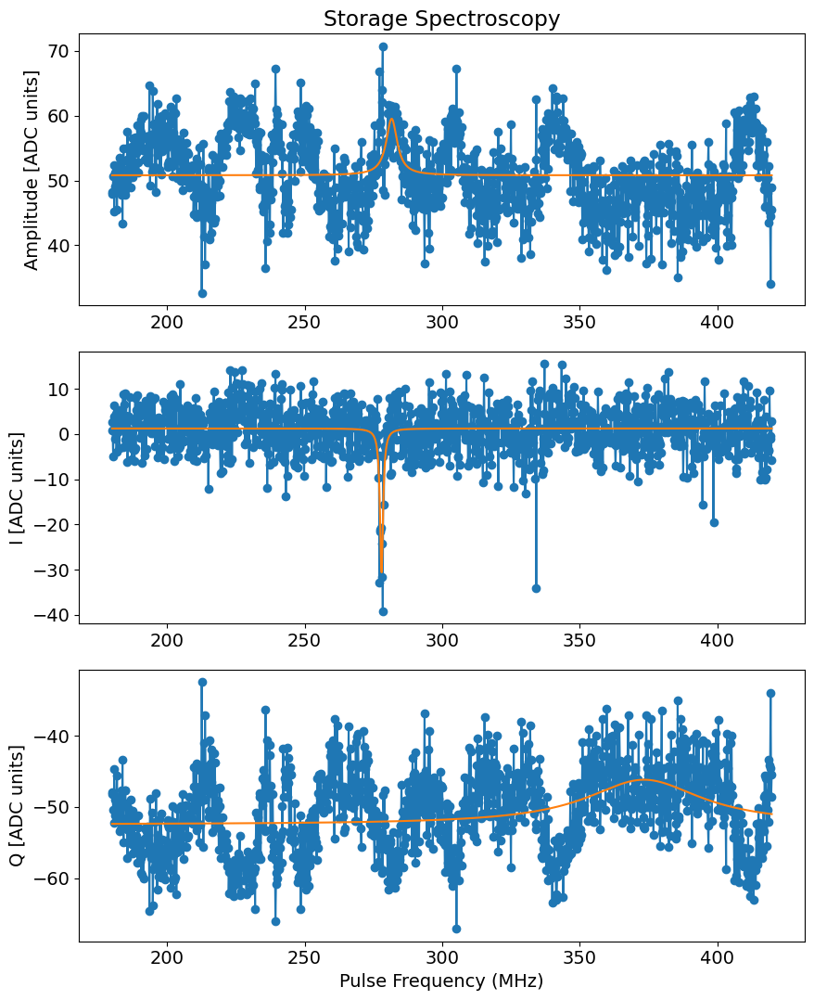

[log_measurement] vault_root not configured; skipping. Add 'data_management.vault_root: <path>' to the hardware config.


In [29]:
# Execute for all storage modes
spec_res_list = []
# gain_list = np.arange(3000, 10001, 1000).tolist()
gain_list = [2000]
for drvie_gain in tqdm(gain_list): 
	spec_res = stor_spec_runner.execute(
		man_mode_no=1,
		stor_mode_no=1,
		# coupler_current=coupler_current,
		flux_drive_gain=drvie_gain,
		flux_drive_duration=5,
		postproc=False,
		expts = 240*5,
		reps = 100,
		relax_delay = 800,
		bw = 240,
		center_freq = 300
	)
	# stor_specs[stor_mode_no].display()
	spec_res_list.append(spec_res)

In [5]:
import pickle

with open("D:\\experiments\\260403_kerr_excusion_redone\\expt_objs\\JOB-20260423-00022_expt.pkl", "rb") as f:
    imported_obj = pickle.load(f)


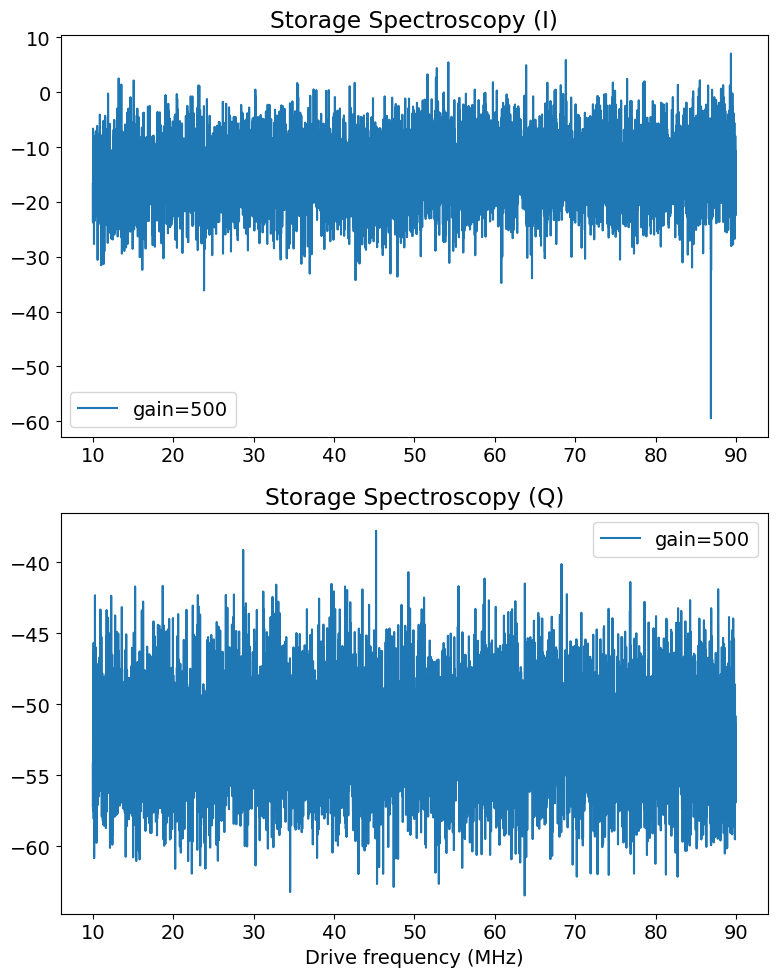

In [6]:
fig, ax = plt.subplots(2, 1, figsize=(8, 10))
ax[0].plot(imported_obj.data['xpts'], imported_obj.data['avgi'], label = f"gain={imported_obj.cfg.expt.flux_drive_gain}")
ax[1].plot(imported_obj.data['xpts'], imported_obj.data['avgq'], label = f"gain={imported_obj.cfg.expt.flux_drive_gain}")
ax[1].set_xlabel("Drive frequency (MHz)")
ax[0].set_title("Storage Spectroscopy (I)")
ax[1].set_title("Storage Spectroscopy (Q)")
ax[0].legend()
ax[1].legend()
plt.tight_layout()
plt.show()

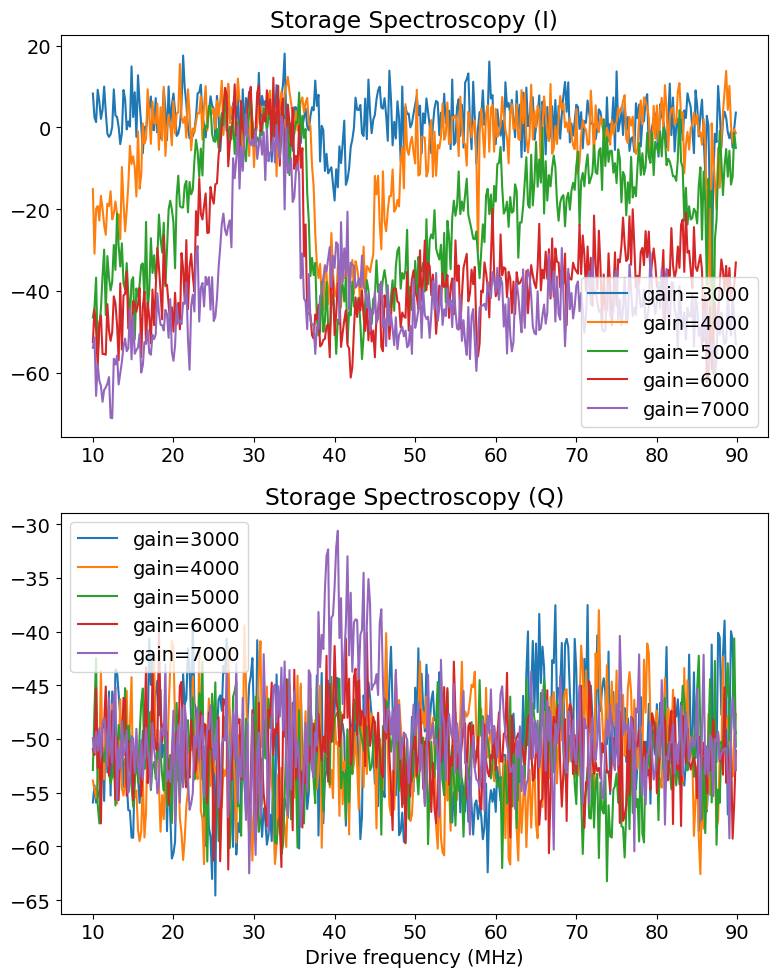

In [8]:
fig, ax = plt.subplots(2, 1, figsize=(8, 10))
idxes_to_plot = [0, 1, 2, 3, 4]
for idx_to_plot in idxes_to_plot:
	ax[0].plot(spec_res_list[0].data['xpts'], spec_res_list[idx_to_plot].data['avgi'], label = f"gain={spec_res_list[idx_to_plot].cfg.expt.flux_drive_gain}")
	ax[1].plot(spec_res_list[0].data['xpts'], spec_res_list[idx_to_plot].data['avgq'], label = f"gain={spec_res_list[idx_to_plot].cfg.expt.flux_drive_gain}")
ax[1].set_xlabel("Drive frequency (MHz)")
ax[0].set_title("Storage Spectroscopy (I)")
ax[1].set_title("Storage Spectroscopy (Q)")
ax[0].legend()
ax[1].legend()
plt.tight_layout()
plt.show()

In [16]:
np.shape(np.array([spec_res.data['avgi'] for spec_res in spec_res_list]))

(8, 400)

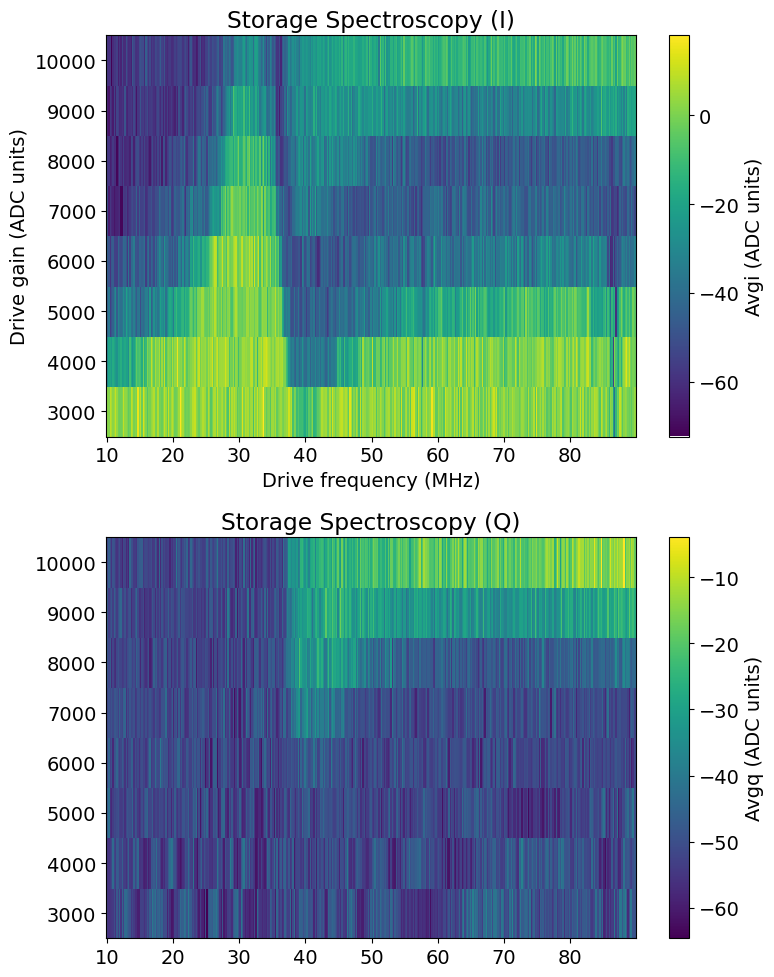

In [25]:
fig, ax = plt.subplots(2, 1, figsize=(8, 10))
c = ax[0].pcolor(*np.meshgrid(spec_res_list[0].data['xpts'], gain_list), 
             np.array([spec_res.data['avgi'] for spec_res in spec_res_list]))
d = ax[1].pcolor(*np.meshgrid(spec_res_list[0].data['xpts'], gain_list), 
             np.array([spec_res.data['avgq'] for spec_res in spec_res_list]))
fig.colorbar(c, ax=ax[0], label='Avgi (ADC units)')
fig.colorbar(d, ax=ax[1], label='Avgq (ADC units)')
ax[0].set_title("Storage Spectroscopy (I)")
ax[1].set_title("Storage Spectroscopy (Q)")	
ax[0].set_xlabel("Drive frequency (MHz)")
ax[0].set_ylabel("Drive gain (ADC units)")
# ax[1].pcolor(spec_res_list[0].data['xpts'], spec_res_list[idx_to_plot].data['avgq'], label = f"gain={spec_res_list[idx_to_plot].cfg.expt.flux_drive_gain}")
fig.tight_layout()
plt.show()


## Excursion Ramsey Code

In [33]:
expt_params = AttrDict(dict(
    start=0.01,           # start delay
    step=0.02,            # step size
    expts=100,            # number of experiments
    ramsey_freq=3.7,      # Ramsey frequencys
    kerr_gain=0,
    kerr_detune=-10,
    reps=100,              # repetitions
    rounds=1,             # rounds
    qubits=[0],           # qubits
    checkEF=False,        # check EF
    f0g1_cavity=0,        # f0g1 cavity
    init_gf=False,        # initialize gf
    active_reset=False,   # active reset
    man_reset=True,       # manipulate reset
    storage_reset=True,   # storage reset
    user_defined_pulse=None, # [on/off, freq, gain, sigma (mus), 0, 4] # if off, use config freq
    parity_meas=True,     # parity measurement
    man_mode_no=1,            
    storage_ramsey=[False, 2, True], # storage Ramsey
    man_ramsey=None,      # manipulate Ramsey
    coupler_ramsey=False, # coupler Ramsey
    custom_coupler_pulse=None, # custom coupler pulse
    echoes=[False, 0],    # echoes
    prepulse=False,       # prepulse
    postpulse=False,      # postpulse
    gate_based=False,     # gate based
    pre_sweep_pulse=None, # pre sweep pulse
    post_sweep_pulse=None,# post sweep pulse
    prep_e_first = True,
    relax_delay=2500,      # relax delay
    normalize = False,
    swept_params = ['displace_gain', 'kerr_length'],
    kerr_lengths = np.linspace(0.007,3,101).tolist(),
    # displace_gains = np.arange(2000,8001,1000).tolist(),
    displace_gains = [6000],
    # displace_gain = 5000,
    drive_coupler=False,
    cavity_excursion = True,
    kerr_freq = 150,
    # ds_thisrun = station.ds_storage,
))


def cavity_ramsey_preproc(station, default_expt_cfg, **kwargs):
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)

    expt_cfg.man_idx = expt_cfg.man_mode_no - 1

    if expt_cfg.user_defined_pulse is None:
        expt_cfg.user_defined_pulse = [True, station.hardware_cfg.device.manipulate.f_ge[expt_cfg.man_mode_no-1], 10, station.hardware_cfg.device.manipulate.displace_sigma[expt_cfg.man_mode_no-1], 0, 4]

    if expt_cfg.man_ramsey is None:
        expt_cfg.man_ramsey = [False, expt_cfg.man_mode_no -1]
    if expt_cfg.custom_coupler_pulse is None:
        expt_cfg.custom_coupler_pulse = [[944.25], [1000], [0.316677658], [0], [1], ['flat_top'], [0.005]]
    if expt_cfg.pre_sweep_pulse is None:
        expt_cfg.pre_sweep_pulse = []
    if expt_cfg.post_sweep_pulse is None:
        expt_cfg.post_sweep_pulse = []
    # do we need to set the relax delay here?
    return expt_cfg

def plotter_fixed(cavity_ramseies,
                  plot_kerr = False,
                  plotkcerror = True,
                  title = 0):
    if not isinstance(cavity_ramseies, list):
        items = [cavity_ramseies]
    else:
        items = cavity_ramseies
    
    n = len(items)
    if plot_kerr == True:
        n += 1
    n_cols = 2
    
    if n == 1:
        n_cols = 1
        n_rows = 1
    else:
        n_rows = int(np.ceil(n / n_cols))

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows), constrained_layout=True)
    
    if n == 1:
        axes_flat = [axes]
    else:
        axes_flat = axes.flatten()

    for i, cavity_ramsey_n in enumerate(items):
        ax = axes_flat[i]
        _x, _y = np.meshgrid(cavity_ramsey_n.cfg.expt.kerr_lengths, cavity_ramsey_n.cfg.expt.displace_gains)
        c = ax.pcolormesh(_x, _y, cavity_ramsey_n.data['avgi'], shading='auto')
        ax.set_title(f"{cavity_ramsey_n.cfg.expt.kerr_gain}")
        
        ax.set_xlabel(r'Kerr lengths ($\mu$s)')
        ax.set_ylabel('Displace gains (DAC unit)')
        fig.colorbar(c, ax=ax, label='I')

    if n > 1:
        for j in range(n, len(axes_flat)):
            axes_flat[j].axis('off')
    if plot_kerr == True:
        ax = axes_flat[n-1]
        _kc_list = np.zeros(len(items))
        _kc_error_list = np.zeros(len(items))
        _kerr_gain_list = np.zeros(len(items))
        for i in range(len(items)):
            _cr = cavity_ramseies[i]
            try:
                _kc_list[i] = _cr.fit_results['kc']
                _kc_error_list[i] = _cr.fit_results['linear_fit_result'].params['kc'].stderr
            except:
                pass
            _kerr_gain_list[i] = _cr.cfg.expt.kerr_gain
        if plotkcerror == False:
            ax.scatter(_kerr_gain_list,
                    _kc_list)
        else:
            ax.errorbar(_kerr_gain_list,
                        _kc_list,
                        _kc_error_list,
                        fmt='o', 
                        capsize=3)
        ax.plot(_kerr_gain_list,
                _kc_list,
                ls = '--')
        ax.set_xlabel("Kerr Gain (DAC unit)")
        ax.set_ylabel("$K_c$")
    if title != 0:
        fig.suptitle(title)
    plt.show()
    return None


cavity_ramsey_runner = CharacterizationRunner(
    station=station,
    ExptClass= meas.KerrCavityRamseyExcursionExperiment,
    # ExptProgram = meas.CavityRamseyExcursionQsimProgram,
    default_expt_cfg=expt_params,
    preprocessor=cavity_ramsey_preproc,
    # postprocessor=,
    job_client=client,
    # user=user,    
    use_queue=USE_QUEUE,
)

def kerr_legnth_generator(_step: float, 
                          _expts: int):
    _offset = 2
    _start = _step
    _n = _expts
    _criteria = 0.007
    _temp = _step
    if _temp < _criteria:
        _start = _criteria
        while _temp < _criteria:
            _temp = _temp + _step
            _offset = _offset + 1
    _to_return = np.zeros(_n)
    _to_return[0] = _start
    for i in range(_n-1):
        _to_return[i+1] = (i+_offset) * _step
    return _to_return

Freq (Outer):   0%|          | 0/1 [00:00<?, ?it/s]

Kerr Gain (Inner):   0%|          | 0/1 [00:00<?, ?it/s]

Job submitted: JOB-20260430-00195 (queue position: 1)

[0.1s] Job JOB-20260430-00195: pending

[338.1s] Job JOB-20260430-00195: running
[WORKER] Loading KerrCavityRamseyExcursionExperiment from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260430-00195_KerrCavityRamseyExcursionExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to -0.213mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
100%|████████████████████████████████████████████| 6/6 [04:03<00:00, 40.60s/it]
Saving D:\experiments\260403_kerr_excusion_redone\data\JOB-20260430-00195_KerrCavityRamseyExcursionExperiment.h5
[WORKER] Saving expt object to: D:\experiments\260403_kerr_excusion_redone\expt_objs\JOB-20260430-00195_expt.pkl

[611.9s] Job JOB-20260430-00195: completed

Job completed! Data: D:\experiments\260403_kerr_excusion_redone\data\JOB-20260430-00195_KerrCavityRamseyExcursionExperiment.h5


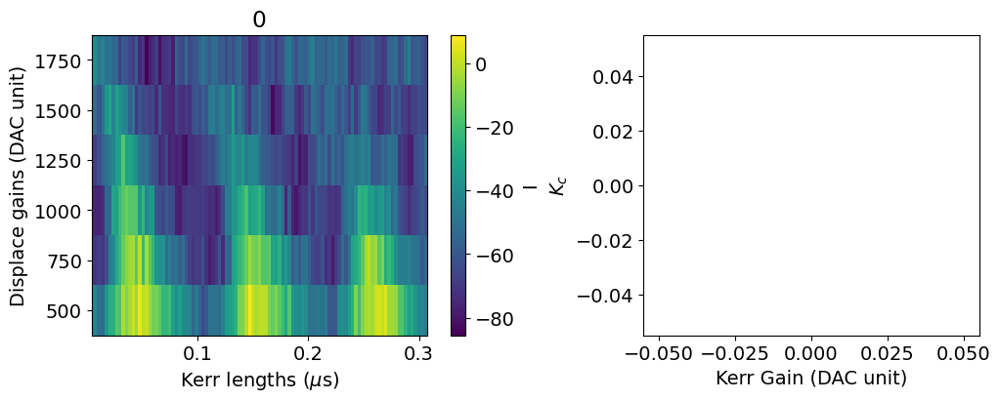

In [44]:
# station.hardware_cfg.device.manipulate.f_ge[0]=4997.563715744588 # 0.15 mA
station.hardware_cfg.device.qubit.pulses.slow_pi_ge.length[0]=5

# kerr_gain_list = [1000]
# kerr_gain_list = np.arange(16000, 20001, 1000)
kerr_gain_list = [0]
freq_list = [100]
# freq_list = [100]
# disp_gain_list = [4000, 4250, 4500, 4750, 5000, 6000, 7000, 8000]
disp_gain_list = np.arange(500, 1751, 250)	
_ramsey_freq = 9
_step = 0.003
_expts = 100

cavity_list_list = []
kc_list = []

kerr_legnth_generator

for freq in tqdm(freq_list, desc="Freq (Outer)", position=0):
    cavity_list = []
    for kg in tqdm(kerr_gain_list, desc="Kerr Gain (Inner)", position=1, leave=False):
        cavity_ramsey_n = cavity_ramsey_runner.execute(

            # ramsey_freq= 3.7,
            ramsey_freq = _ramsey_freq,
            step = 0.035,
            expts = 1,
            reps = 100,
            prep_e_first = False,
            user_defined_pulse=[True, station.hardware_cfg.device.manipulate.f_ge[0], 6000, 
                                        station.hardware_cfg.device.manipulate.displace_sigma[0],
                                        0, 4],
            kerr_lengths = kerr_legnth_generator(_step, _expts),
            displace_gains = disp_gain_list,
            # displace_gains = [1000, 2000],
            kerr_gain = kg,
            kerr_freq = freq,
            # coupler_current = 0.10e-3
            storage_ramsey=[False, 1, True], # storage Ramsey
            active_reset= False,
            man_reset = True, 
            man_reset_print = False,
            storage_reset = False,
            reset_dump_mode = 1,
            relax_delay = 2500,
            go_kwargs = dict(analyze = False, display = False)
        )
        cavity_list.append(cavity_ramsey_n)
    cavity_list_list.append(cavity_list)
plotter_fixed(cavity_list,
              plot_kerr = True)	


In [22]:
station.hardware_cfg.hw.soc.dacs.flux_low.ch

[1]

data['gain_list']
gain_to_alpha 0.00106128107453785
kwargs {'fit_indices_g': [0, 1, 2, 4], 'track_peaks': True, 'release_constraint': False}
Kerr : -507.623 +/- 16.034 kHz
detuning Ground State: -37.704 +/- 22.917 kHz
excursion gain = 0


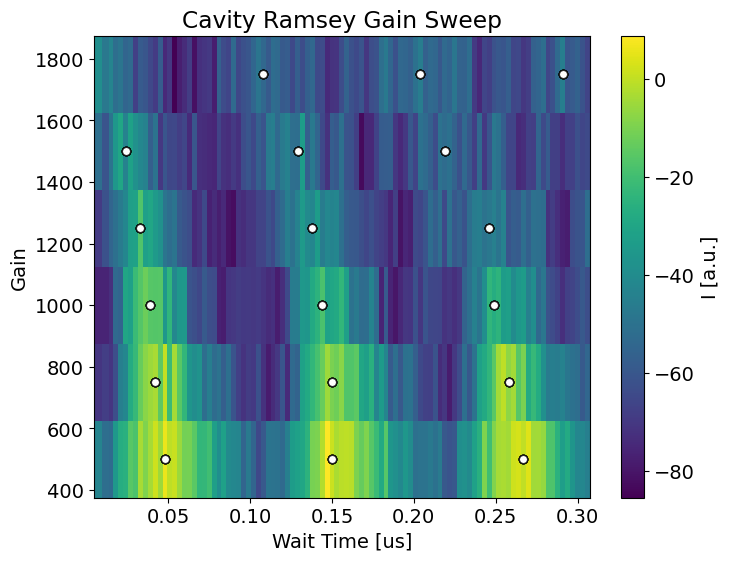

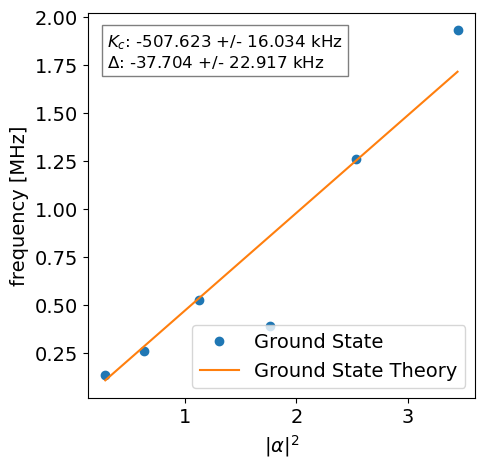

In [46]:
idx_freq = 0
idx_gain = -1
cavity_list_list[idx_freq][idx_gain].analyze_peak(fit_indices_g=[0, 1, 2, 4],
                                    track_peaks=True,
                                    release_constraint = False,
                                    )
cavity_list_list[idx_freq][idx_gain].display_peak(legend_loc = "lower right")
print(f"excursion gain = {cavity_list_list[idx_freq][idx_gain].cfg.expt.kerr_gain}")

In [16]:
idx_freq = 0
idx_gain = -1
cavity_list_list[idx_freq][idx_gain].analyze()
cavity_list_list[idx_freq][idx_gain].display()

IndexError: index 1 is out of bounds for axis 0 with size 1

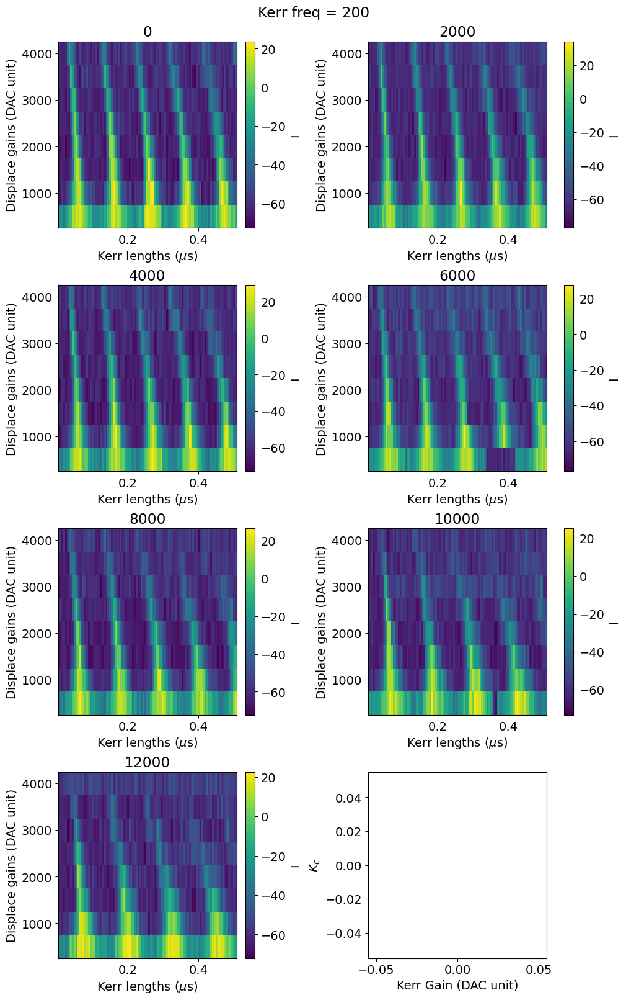

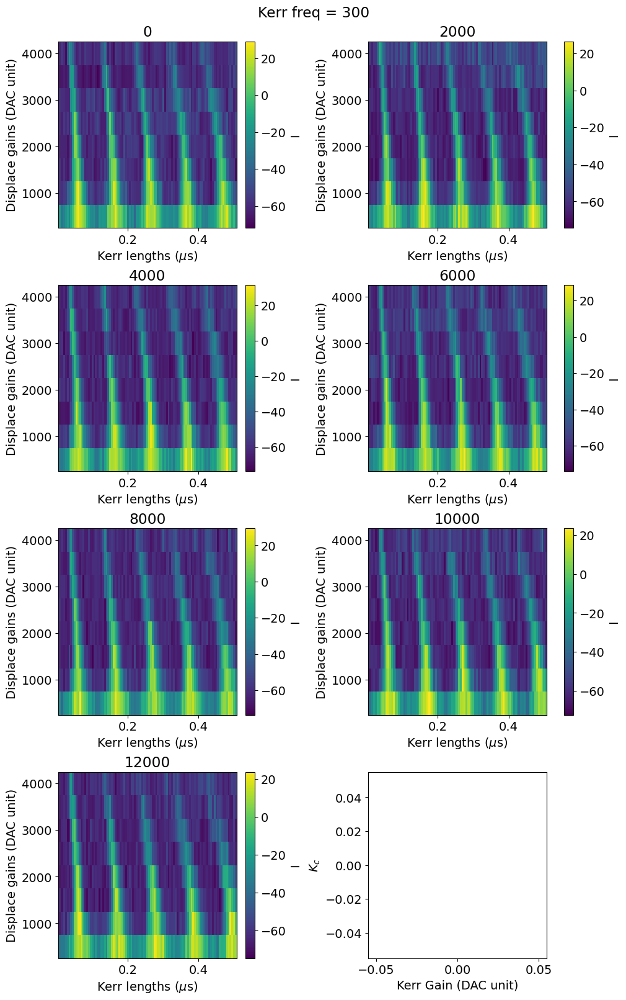

In [56]:
for cavity_list in cavity_list_list:
    plotter_fixed(cavity_list,
                plot_kerr = True,
                title = f"Kerr freq = {cavity_list[0].cfg.expt.kerr_freq}")

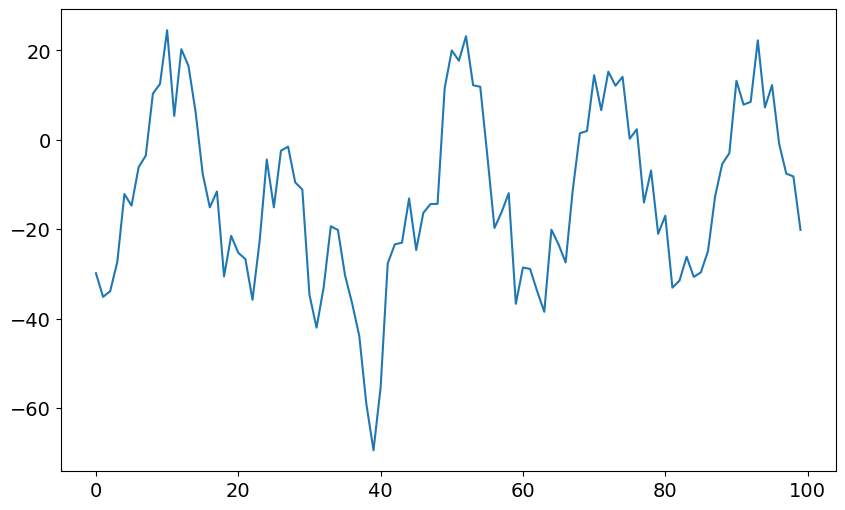

In [50]:
plt.plot(cavity_list_list[0][0].data['avgi'][0])

## Data Retrieve

In [3]:
import os, sys, pickle, glob
from collections import defaultdict

REPO_ROOT = r"D:\python\multimode_expts" 
BASE_DIR  = r"D:\experiments\260403_kerr_excusion_redone"
OBJ_DIR   = os.path.join(BASE_DIR, "expt_objs")

RUN_PREFIX = "JOB-20260414"  
JOB_START  = 45
JOB_END    = 61  # inclusive

# freq_list_force = [50, 100]
# kerr_gain_list_force = [0, 10000]
freq_list_force = None
kerr_gain_list_force = None

if REPO_ROOT not in sys.path:
    sys.path.insert(0, REPO_ROOT)

try:
    from experiments.qsim.t2_cavity_fluxexcursion import KerrCavityRamseyExcursionExperiment  # noqa: F401
except Exception as e:
    print("[WARN] Pre-import failed (may still load):", e)

def _pkl_path_for_job(job_num: int) -> str:
    return os.path.join(OBJ_DIR, f"{RUN_PREFIX}-{job_num:05d}_expt.pkl")

def load_expt_from_pkl(pkl_path: str):
    try:
        with open(pkl_path, "rb") as f:
            return pickle.load(f)
    except Exception as e_pickle:
        try:
            import dill
            with open(pkl_path, "rb") as f:
                return dill.load(f)
        except Exception as e_dill:
            raise RuntimeError(
                f"Failed to load: {pkl_path}\n"
                f"pickle error: {e_pickle}\n"
                f"dill error: {e_dill}"
            )

def safe_postprocess(expt):

    for fn in ["analyze", "postprocess", "process"]:
        if hasattr(expt, fn):
            try:
                getattr(expt, fn)()
            except Exception as e:
                print(f"[WARN] {fn} failed on {getattr(expt, 'fname', 'expt')}: {e}")

def rebuild_cavity_list_list(expts, freq_list=None, kerr_gain_list=None):

    by_freq_gain = defaultdict(dict)

    kept = []
    skipped = 0
    for e in expts:
        try:
            f = float(e.cfg.expt.kerr_freq)
            g = float(e.cfg.expt.kerr_gain)
            by_freq_gain[f][g] = e
            kept.append(e)
        except Exception:
            skipped += 1

    if freq_list is None:
        freq_list = sorted(by_freq_gain.keys())
    if kerr_gain_list is None:
        all_gains = set()
        for d in by_freq_gain.values():
            all_gains |= set(d.keys())
        kerr_gain_list = sorted(all_gains)

    cavity_list_list = []
    missing = []
    for f in freq_list:
        row = []
        for g in kerr_gain_list:
            if f in by_freq_gain and g in by_freq_gain[f]:
                row.append(by_freq_gain[f][g])
            else:
                missing.append((f, g))
        cavity_list_list.append(row)

    return cavity_list_list, freq_list, kerr_gain_list, kept, skipped, missing

expts = []
missing_pkls = []
for j in range(JOB_START, JOB_END + 1):
    p = _pkl_path_for_job(j)
    if os.path.exists(p):
        expts.append(load_expt_from_pkl(p))
    else:
        missing_pkls.append(p)

print(f"Loaded expts: {len(expts)}")
if missing_pkls:
    print(f"[WARN] Missing pkl files: {len(missing_pkls)} (first 3 shown)")
    for p in missing_pkls[:3]:
        print(" ", p)

cavity_list_list, freq_list, kerr_gain_list, kept, skipped, missing = rebuild_cavity_list_list(
    expts,
    freq_list=freq_list_force,
    kerr_gain_list=kerr_gain_list_force,
)

print("Rebuilt cavity_list_list.")
print("  freq_list      =", freq_list)
print("  kerr_gain_list =", kerr_gain_list)
print("  row lengths    =", [len(r) for r in cavity_list_list])
print("  skipped(no cfg.expt.kerr_*) =", skipped)
if missing:
    print(f"[WARN] Missing (freq,gain) combos: {len(missing)} (first 10 shown)")
    print(missing[:10])


Loaded expts: 17
Rebuilt cavity_list_list.
  freq_list      = [10.0, 20.0, 30.0]
  kerr_gain_list = [0.0, 5000.0, 10000.0, 15000.0, 20000.0, 25000.0, 30000.0]
  row lengths    = [7, 7, 3]
  skipped(no cfg.expt.kerr_*) = 0
[WARN] Missing (freq,gain) combos: 4 (first 10 shown)
[(30.0, 15000.0), (30.0, 20000.0), (30.0, 25000.0), (30.0, 30000.0)]


In [115]:
x = cavity_list_list[idx_1][idx_2].data['xpts']
x[1]

0.015

data['gain_list']
gain_to_alpha 0.0007585984259805169
kwargs {'fit_indices_g': [0, 1, 2, 3, 4], 'track_peaks': False, 'release_constraint': True}
Kerr : -11.213 +/- 0.413 kHz
detuning Ground State: -276.409 +/- 3.329 kHz
10000
30


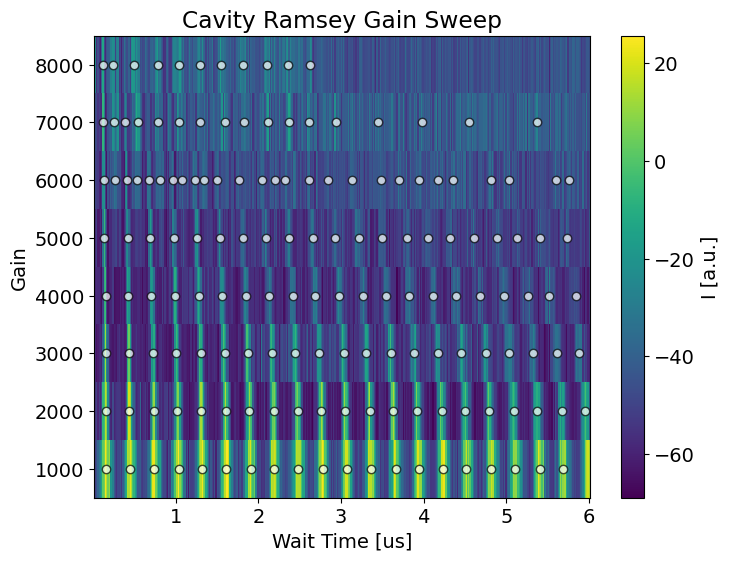

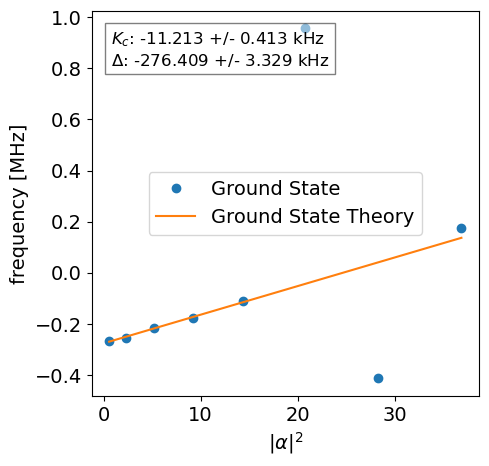

In [20]:
idx_1 = 2
idx_2 = 2
# cavity_list_list[idx_1][idx_2].analyze()
# cavity_list_list[idx_1][idx_2].display()

cavity_list_list[idx_1][idx_2].analyze_peak(fit_indices_g=[0, 1, 2, 3,4],
											track_peaks=False,
											release_constraint = True)
cavity_list_list[idx_1][idx_2].display_peak()
print(cavity_list_list[idx_1][idx_2].cfg.expt.kerr_gain)
print(cavity_list_list[idx_1][idx_2].cfg.expt.kerr_freq)

Failed to read module file 'D:\python\multimode_expts\experiments\qsim\t2_cavity_fluxexcursion.py' for module 'experiments.qsim.t2_cavity_fluxexcursion': UnicodeDecodeError
Traceback (most recent call last):
  File "d:\python\multimode_expts\.pixi\envs\default\Lib\site-packages\IPython\extensions\deduperreload\deduperreload.py", line 556, in maybe_reload_module
    new_source_code = f.read()
                      ^^^^^^^^
  File "d:\python\multimode_expts\.pixi\envs\default\Lib\encodings\cp1252.py", line 23, in decode
    return codecs.charmap_decode(input,self.errors,decoding_table)[0]
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
UnicodeDecodeError: 'charmap' codec can't decode byte 0x8f in position 3793: character maps to <undefined>


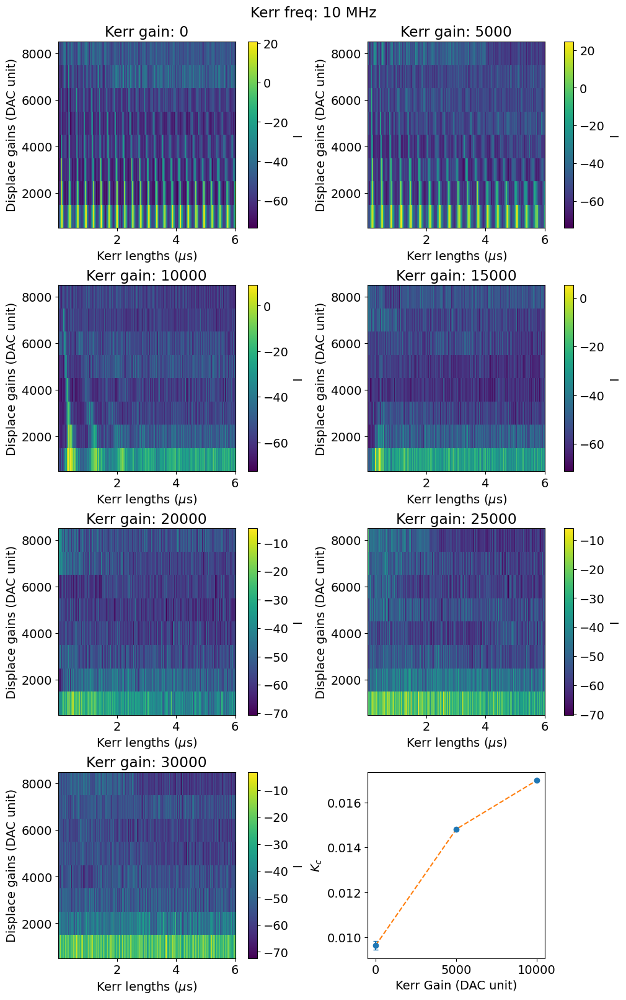

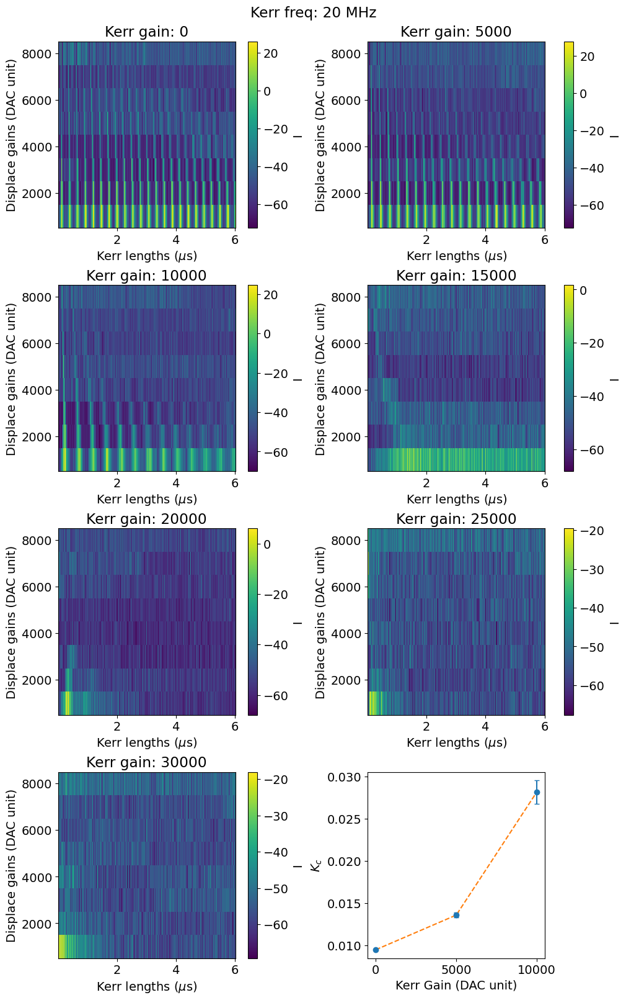

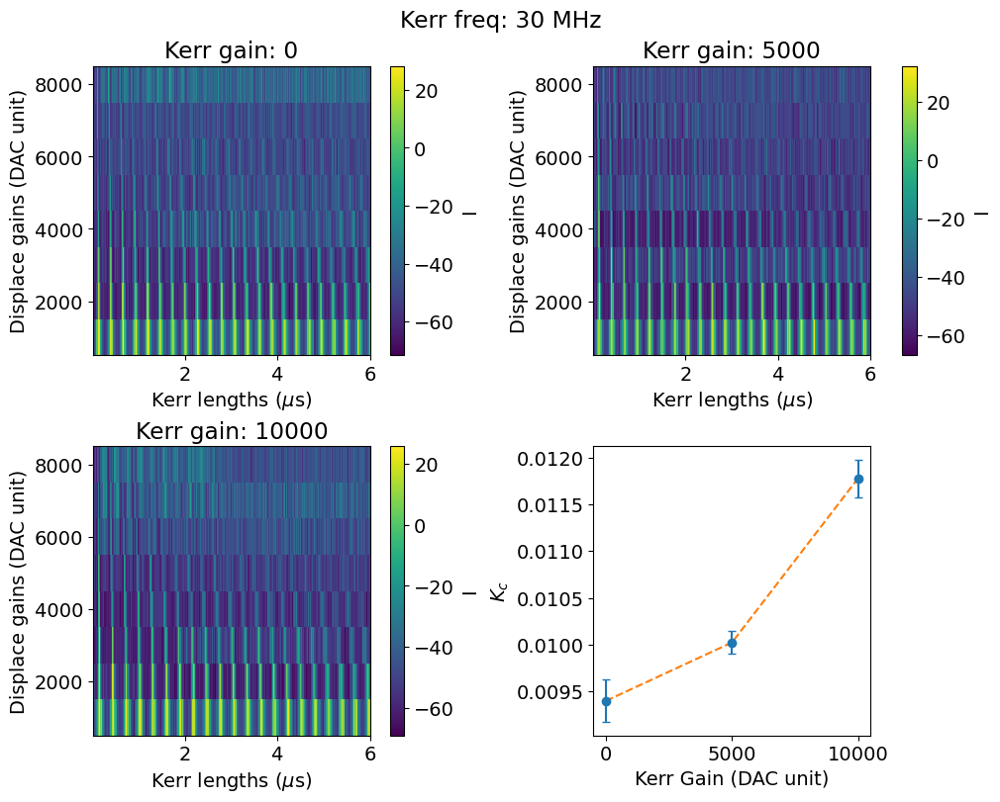

In [14]:
def plotter_fixed(cavity_ramseies,
                  plot_kerr = False,
                  plotkcerror = True):
    if not isinstance(cavity_ramseies, list):
        items = [cavity_ramseies]
    else:
        items = cavity_ramseies
    
    n = len(items)
    if plot_kerr == True:
        n += 1
    n_cols = 2
    
    if n == 1:
        n_cols = 1
        n_rows = 1
    else:
        n_rows = int(np.ceil(n / n_cols))

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows), constrained_layout=True)
    
    if n == 1:
        axes_flat = [axes]
    else:
        axes_flat = axes.flatten()

    for i, cavity_ramsey in enumerate(items):
        ax = axes_flat[i]
        _x, _y = np.meshgrid(cavity_ramsey.cfg.expt.kerr_lengths, cavity_ramsey.cfg.expt.displace_gains)
        c = ax.pcolormesh(_x, _y, cavity_ramsey.data['avgi'], shading='auto')
        
        ax.set_xlabel(r'Kerr lengths ($\mu$s)')
        ax.set_ylabel('Displace gains (DAC unit)')
        ax.set_title(f"Kerr gain: {cavity_ramsey.cfg.expt.kerr_gain}")
        fig.colorbar(c, ax=ax, label='I')

    if n > 1:
        for j in range(n, len(axes_flat)):
            axes_flat[j].axis('off')
    if plot_kerr == True:
        ax = axes_flat[n-1]
        _kc_list = np.zeros(len(items))
        _kc_error_list = np.zeros(len(items))
        _kerr_gain_list = np.zeros(len(items))
        for i in range(len(items)):
            _cr = cavity_ramseies[i]
            _kc_list[i] = _cr.fit_results['kc']
            try:
                _kc_error_list[i] = _cr.fit_results['linear_fit_result'].params['kc'].stderr
            except:
                pass
            _kerr_gain_list[i] = _cr.cfg.expt.kerr_gain
        if plotkcerror == False:
            ax.scatter(_kerr_gain_list,
                    _kc_list)
        else:
            ax.errorbar(_kerr_gain_list,
                        _kc_list,
                        _kc_error_list,
                        fmt='o', 
                        capsize=3)
        ax.plot(_kerr_gain_list,
                _kc_list,
                ls = '--')
        ax.set_xlabel("Kerr Gain (DAC unit)")
        ax.set_ylabel("$K_c$")
    fig.suptitle(f"Kerr freq: {cavity_ramseies[0].cfg.expt.kerr_freq} MHz")
    # fig.tight_layout()
    plt.show()
    return None
for cav_list in cavity_list_list:
    plotter_fixed(cav_list,
                plot_kerr = True)

## Plot each trace

<>:41: SyntaxWarning: invalid escape sequence '\d'
<>:41: SyntaxWarning: invalid escape sequence '\d'
C:\Users\26049\AppData\Local\Temp\ipykernel_4884\2929772247.py:41: SyntaxWarning: invalid escape sequence '\d'
  ax.set_ylabel('Frequency shift (f - $\delta$)')


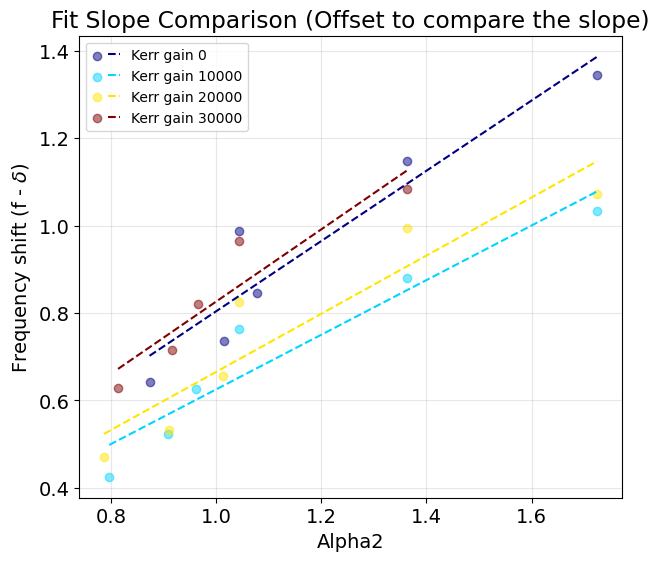

In [ ]:
from matplotlib.legend_handler import HandlerTuple

fig, ax = plt.subplots(figsize=(7, 6)) 
num_cavities = len(cavity_list)
colors = plt.cm.jet(np.linspace(0, 1, num_cavities)) 

handles_list = []
labels_list = []

for idx, cavity in enumerate(cavity_list):

    results = cavity.fit_results
    kc = results['kc']
    delta = results['delta']
    x = np.array(results['alpha2'])
    y_data = results['f'] 
    
    c = colors[idx]
    
    y_shifted = y_data - delta
    
    sc = ax.scatter(x, y_shifted, 
                    alpha=0.5, 
                    color=c, 
                    label=f'Kerr gain {cavity_list[idx].cfg.expt.kerr_gain}') 
    
    
    sort_idx = np.argsort(x)
    pl, = ax.plot(x[sort_idx], (kc * x)[sort_idx], 
                  ls="--", 
                  color=c)
    
    handles_list.append((sc, pl))
    labels_list.append(f'Kerr gain {cavity_list[idx].cfg.expt.kerr_gain}')

ax.legend(handles_list, labels_list, 
          handler_map={tuple: HandlerTuple(ndivide=None)},
          fontsize=10)

ax.set_xlabel('Alpha2')
ax.set_ylabel('Frequency shift (f - $\delta$)') 
ax.set_title('Fit Slope Comparison (Offset to compare the slope)')
plt.grid(True, alpha=0.3)
plt.show()

## Compare with the previous code

<>:23: SyntaxWarning: invalid escape sequence '\ '
<>:23: SyntaxWarning: invalid escape sequence '\ '
C:\Users\26049\AppData\Local\Temp\ipykernel_35876\1901542632.py:23: SyntaxWarning: invalid escape sequence '\ '
  ax.set_title("Comparison at $I_c = 150 \\mu A$, Disp\ 4000")


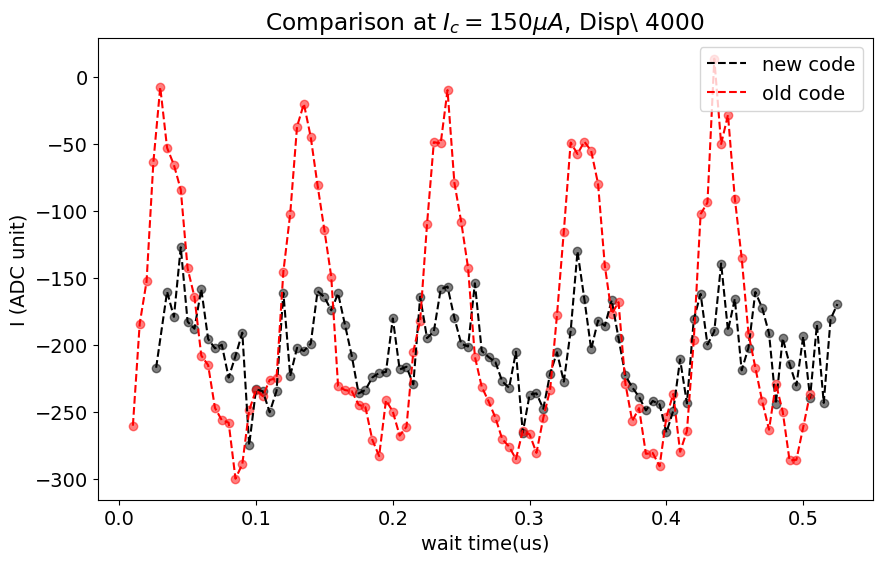

In [ ]:
fig, ax = plt.subplots()
offset = 0.02
ax.plot(np.array(cavity_list_list[0][0].data['xpts'])+offset, 
        cavity_list_list[0][0].data['avgi'][0],
        label = 'new code',
        color = 'black',
        ls = '--')
ax.scatter(np.array(cavity_list_list[0][0].data['xpts'])+offset, 
        cavity_list_list[0][0].data['avgi'][0],
        color = 'black',
        alpha = 0.5)
ax.plot(cavity_ramsey.data['xpts'], 
        cavity_ramsey.data['avgi'],
        label = "old code",
        color = 'red',
        ls = '--')
ax.scatter(cavity_ramsey.data['xpts'], 
        cavity_ramsey.data['avgi'],
        color = 'red',
        alpha = 0.5)
ax.set_xlabel("wait time(us)")
ax.set_ylabel("I (ADC unit)")
ax.set_title("Comparison at $I_c = 150 \\mu A$, Disp\ 4000")
ax.legend()

## Refitting

In [55]:
def _get_fit_map(cavity_ramsey, normalize_fit=True):
    """
    Returns a 2D array fit_map with the same shape as cavity_ramsey.data['avgi'].
    If some lines were not fit, they will be filled with NaN.
    """
    data2d = cavity_ramsey.data['avgi']
    n_lines, n_x = data2d.shape

    # Fit curves are in normalized units in your analyze() (you fit 'line' from z = normalize(avgi)).
    # So convert raw data to normalized too for fair residuals/compare unless user wants raw-fit overlay.
    if normalize_fit:
        data_norm2d = cavity_ramsey.normalize(data2d)
    else:
        data_norm2d = data2d  # not recommended

    fit_map = np.full_like(data_norm2d, np.nan, dtype=float)

    fr = getattr(cavity_ramsey, "fit_results", None)
    if fr is None:
        return fit_map, data_norm2d

    z_fits = fr.get("z_fits", None)
    results = fr.get("results", None)

    if z_fits is None or results is None:
        return fit_map, data_norm2d

    z_fits = np.array(z_fits)

    # Best: explicit mapping
    fit_lids = fr.get("fit_lids", None)
    if fit_lids is not None:
        fit_lids = np.array(fit_lids, dtype=int)
        for j, lid in enumerate(fit_lids):
            if 0 <= lid < n_lines and z_fits.shape[1] == n_x:
                fit_map[lid, :] = z_fits[j, :]
        return fit_map, data_norm2d

    # Fallback: assume same ordering and full success (unsafe)
    if z_fits.shape[0] == n_lines and z_fits.shape[1] == n_x:
        fit_map[:, :] = z_fits
        return fit_map, data_norm2d

    # Otherwise: cannot map reliably
    return fit_map, data_norm2d


def plotter_fixed_compare(cavity_ramseies,
                          plot_kerr=False,
                          plotkcerror=True,
                          show_residual=True,
                          normalize_fit=True,
                          cmap_data=None,
                          cmap_fit=None,
                          cmap_resid=None):
    """
    For each cavity_ramsey, plot:
      - Data 2D colormap (avgi)
      - Fit 2D colormap reconstructed from fit_results
      - (optional) Residual colormap (data_norm - fit_norm)
    plus optional Kerr summary panel like your original plotter_fixed.

    Notes:
      - Fit curves stored in fit_results['z_fits'] are in normalized units (because analyze fits z=normalize(avgi)).
      - This plotter compares in normalized units by default for apples-to-apples.
    """
    if not isinstance(cavity_ramseies, list):
        items = [cavity_ramseies]
    else:
        items = cavity_ramseies

    n_items = len(items)

    panels_per_item = 2 + (1 if show_residual else 0)  # data, fit, (resid)
    n_extra = 1 if plot_kerr else 0

    n_total = n_items * panels_per_item + n_extra

    # layout: 2 columns looks nice when panels_per_item is 2; for 3, use 3 columns
    n_cols = panels_per_item
    if n_total == panels_per_item:  # only one item, no extra
        n_rows = 1
    else:
        n_rows = int(np.ceil(n_total / n_cols))

    fig, axes = plt.subplots(n_rows, n_cols,
                             figsize=(5 * n_cols, 4 * n_rows),
                             constrained_layout=True)

    if n_rows == 1 and n_cols == 1:
        axes_flat = [axes]
    else:
        axes_flat = np.array(axes).reshape(-1).tolist()

    ax_idx = 0

    for cavity_ramsey in items:
        # x/y grids from cfg
        x = np.array(cavity_ramsey.cfg.expt.kerr_lengths)
        y = np.array(cavity_ramsey.cfg.expt.displace_gains)
        _x, _y = np.meshgrid(x, y)

        # Get data + fit maps in normalized units (recommended)
        fit_map, data_map = _get_fit_map(cavity_ramsey, normalize_fit=normalize_fit)

        # DATA
        ax = axes_flat[ax_idx]; ax_idx += 1
        c = ax.pcolormesh(_x, _y, data_map, shading='auto')
        ax.set_xlabel(r'Kerr lengths ($\mu$s)')
        ax.set_ylabel('Displace gains (DAC unit)')
        ax.set_title(f"DATA | Kerr gain: {cavity_ramsey.cfg.expt.kerr_gain}")
        fig.colorbar(c, ax=ax, label=('I (norm)' if normalize_fit else 'I'))
        if cmap_data is not None:
            c.set_cmap(cmap_data)

        # FIT
        ax = axes_flat[ax_idx]; ax_idx += 1
        c2 = ax.pcolormesh(_x, _y, fit_map, shading='auto')
        ax.set_xlabel(r'Kerr lengths ($\mu$s)')
        ax.set_ylabel('Displace gains (DAC unit)')
        ax.set_title("FIT (reconstructed)")
        fig.colorbar(c2, ax=ax, label=('I_fit (norm)' if normalize_fit else 'I_fit'))
        if cmap_fit is not None:
            c2.set_cmap(cmap_fit)

        # RESIDUAL
        if show_residual:
            ax = axes_flat[ax_idx]; ax_idx += 1
            resid = data_map - fit_map
            c3 = ax.pcolormesh(_x, _y, resid, shading='auto')
            ax.set_xlabel(r'Kerr lengths ($\mu$s)')
            ax.set_ylabel('Displace gains (DAC unit)')
            ax.set_title("RESIDUAL (data - fit)")
            fig.colorbar(c3, ax=ax, label='resid')
            if cmap_resid is not None:
                c3.set_cmap(cmap_resid)

    # Optional Kerr panel (same as your original)
    if plot_kerr:
        ax = axes_flat[ax_idx]; ax_idx += 1
        _kc_list = np.zeros(n_items)
        _kc_error_list = np.zeros(n_items)
        _kerr_gain_list = np.zeros(n_items)

        for i in range(n_items):
            _cr = items[i]
            _kc_list[i] = _cr.fit_results.get('kc', np.nan)
            try:
                _kc_error_list[i] = _cr.fit_results['linear_fit_result'].params['kc'].stderr
            except Exception:
                _kc_error_list[i] = np.nan
            _kerr_gain_list[i] = _cr.cfg.expt.kerr_gain

        if not plotkcerror:
            ax.scatter(_kerr_gain_list, _kc_list)
        else:
            ax.errorbar(_kerr_gain_list, _kc_list, _kc_error_list, fmt='o', capsize=3)

        ax.plot(_kerr_gain_list, _kc_list, ls='--')
        ax.set_xlabel("Kerr Gain (DAC unit)")
        ax.set_ylabel(r"$K_c$")
        ax.set_title("Kc vs Kerr gain")

    # Turn off unused axes
    for j in range(ax_idx, len(axes_flat)):
        axes_flat[j].axis('off')

    # Title
    try:
        fig.suptitle(f"Kerr freq: {items[0].cfg.expt.kerr_freq} MHz")
    except Exception:
        pass

    plt.show()
    return None

In [56]:
import numpy as np
from scipy.ndimage import gaussian_filter1d
from lmfit import Model

try:
    from slab import AttrDict
except Exception:
    class AttrDict(dict):
        def __getattr__(self, k):
            try: return self[k]
            except KeyError as e: raise AttributeError(k) from e
        def __setattr__(self, k, v): self[k] = v


def _cfg_get(cfg, path, default=None):
    cur = cfg
    for key in path.split("."):
        if cur is None:
            return default
        if isinstance(cur, dict):
            cur = cur.get(key, None)
        else:
            cur = getattr(cur, key, None)
    return default if cur is None else cur


def _normalize_from_obj_or_cfg(obj, avgi_2d):
    if hasattr(obj, "normalize") and callable(getattr(obj, "normalize")):
        try:
            return obj.normalize(avgi_2d)
        except Exception:
            pass

    Ig = _cfg_get(obj.cfg, "device.readout.Ig", None)
    Ie = _cfg_get(obj.cfg, "device.readout.Ie", None)
    if Ig is None or Ie is None:
        return np.array(avgi_2d, float)

    Ig = float(Ig[0] if isinstance(Ig, (list, tuple, np.ndarray)) else Ig)
    Ie = float(Ie[0] if isinstance(Ie, (list, tuple, np.ndarray)) else Ie)
    denom = (Ie - Ig)
    if denom == 0:
        return np.array(avgi_2d, float)
    return (np.array(avgi_2d, float) - Ig) / denom


def kerr_ramsey_model_phi(x, alpha2, f, phi0, scale, offset):
    return scale * np.exp(-2.0 * alpha2 * (1.0 + np.cos(2.0*np.pi*f*x + phi0))) + offset


def linear_model(x, kc, delta):
    return kc * x + delta


def post_refit_one_cavity_ramsey_v2(
    obj,
    *,
    smooth_sigma=1.5,
    rsq_threshold=0.2,
    f_window_mhz=5.0,       
    alpha2_mode="bounded",     
    alpha2_bound_ratio=(0.3, 3.0),
    use_smoothed_for_fit=True,
    robust=True,
    verbose=False,
):
    # x/y
    x = np.array(obj.data.get("xpts", _cfg_get(obj.cfg, "expt.kerr_lengths")), float)
    y = np.array(obj.data.get("ypts", _cfg_get(obj.cfg, "expt.displace_gains")), float)

    avgi_2d = np.array(obj.data["avgi"], float)
    n_lines, n_x = avgi_2d.shape

    z = _normalize_from_obj_or_cfg(obj, avgi_2d)

    virtual_freq = float(_cfg_get(obj.cfg, "expt.ramsey_freq", 0.0) or 0.0)
    kerr_gain = _cfg_get(obj.cfg, "expt.kerr_gain", None)
    kerr_freq = _cfg_get(obj.cfg, "expt.kerr_freq", None)

    g2a = _cfg_get(obj.cfg, "device.manipulate.gain_to_alpha", None)
    if isinstance(g2a, (list, tuple, np.ndarray)):
        g2a = g2a[0] if len(g2a) else None

    model = Model(kerr_ramsey_model_phi)

    fit_lids, fit_results, z_fits, rsqs = [], [], [], []
    alpha2_fits, f_fits, phi0_fits = [], [], []

    for lid in range(n_lines):
        line = np.array(z[lid, :], float)
        line_sm = gaussian_filter1d(line, sigma=smooth_sigma)

        yfit = line_sm if use_smoothed_for_fit else line

        off0 = float(np.nanmin(yfit))
        sc0 = float(np.nanmax(yfit) - off0)
        sc0 = max(sc0, 1e-3)

        if g2a is not None:
            alpha_guess = float(y[lid]) * float(g2a)
            alpha2_0 = max(alpha_guess*alpha_guess, 0.0)
        else:
            alpha2_0 = 0.2  # fallback

        params = model.make_params(
            alpha2=alpha2_0,
            f=virtual_freq,
            phi0=0.0,
            scale=sc0,
            offset=off0,
        )

        if alpha2_mode == "fixed":
            params["alpha2"].set(value=alpha2_0, vary=False)
        elif alpha2_mode == "bounded":
            lo, hi = alpha2_bound_ratio
            params["alpha2"].set(value=alpha2_0,
                                 min=max(lo*alpha2_0, 0.0),
                                 max=max(hi*alpha2_0, 1e-12),
                                 vary=True)
        elif alpha2_mode == "free":
            params["alpha2"].set(value=alpha2_0, min=0.0, vary=True)
        else:
            raise ValueError("alpha2_mode must be fixed|bounded|free")

        params["f"].set(value=virtual_freq,
                        min=virtual_freq - f_window_mhz,
                        max=virtual_freq + f_window_mhz)

        params["phi0"].set(value=0.0, min=-np.pi, max=np.pi)

        params["scale"].set(value=sc0, min=0.0, max=2.0)
        params["offset"].set(value=off0, min=-0.5, max=1.5)

        try:
            fit_kws = {}
            if robust:
                fit_kws = dict(method="least_squares", loss="soft_l1", f_scale=0.05)

            res = model.fit(yfit, params, x=x, nan_policy="omit", **fit_kws)

            fit_lids.append(lid)
            fit_results.append(res)
            z_fits.append(res.best_fit)

            alpha2_fits.append(float(res.params["alpha2"].value))
            f_fits.append(float(res.params["f"].value))
            phi0_fits.append(float(res.params["phi0"].value))
            rsq = float(getattr(res, "rsquared", np.nan))
            rsqs.append(rsq)

            if verbose:
                print(f"lid={lid:3d} rsq={rsq:.3f} f={f_fits[-1]:.4f} phi0={phi0_fits[-1]:+.3f} alpha2={alpha2_fits[-1]:.3g}")

        except Exception as e:
            if verbose:
                print(f"lid={lid:3d} failed: {e!r}")
            continue

    fit_lids = np.array(fit_lids, int)
    rsqs = np.array(rsqs, float)
    alpha2_fits = np.array(alpha2_fits, float)
    f_fits = np.array(f_fits, float)
    phi0_fits = np.array(phi0_fits, float)
    z_fits = np.array(z_fits, float) if len(z_fits) else np.zeros((0, n_x), float)

    fit_good = np.isfinite(rsqs) & (rsqs > rsq_threshold)

    alpha2_good = alpha2_fits[fit_good]
    f_det = (f_fits[fit_good] - virtual_freq)

    # linear fit
    kc = np.nan
    delta = np.nan
    linear_fit_result = None
    try:
        if len(alpha2_good) >= 2:
            lm = Model(linear_model, independent_vars=["x"])
            lp = lm.make_params(kc=1.0, delta=0.0)
            linear_fit_result = lm.fit(f_det, lp, x=alpha2_good, nan_policy="omit")
            kc = float(linear_fit_result.params["kc"].value)
            delta = float(linear_fit_result.params["delta"].value)
    except Exception:
        pass

    obj.fit_results = AttrDict(dict(
        alpha2=alpha2_good,
        f=f_det,
        kc=kc,
        delta=delta,
        linear_fit_result=linear_fit_result,

        results=fit_results,
        z_fits=z_fits,
        rsquared=rsqs,
        fit_lids=fit_lids,
        fit_good=fit_good,

        virtual_freq=virtual_freq,
        kerr_gain=kerr_gain,
        kerr_freq=kerr_freq,
        f_window_mhz=f_window_mhz,
        alpha2_mode=alpha2_mode,
    ))

    return obj.fit_results


def post_refit_cavity_list_list_v2(cavity_list_list, **kwargs):
    out = []
    for cavity_list in cavity_list_list:
        row = []
        for obj in cavity_list:
            row.append(post_refit_one_cavity_ramsey_v2(obj, **kwargs))
        out.append(row)
    return out


## Actual Refitting

In [57]:
post_refit_cavity_list_list_v2(
    cavity_list_list,
    smooth_sigma=1.5,
    rsq_threshold=0.5,
    f_window_mhz=1.0,         
    alpha2_mode="fixed",    
    alpha2_bound_ratio=(0.3, 3.0),
    use_smoothed_for_fit=True,
    robust=True,
    verbose=False
)


cavity_list = cavity_list_list[1]
plotter_fixed(cavity_list, plot_kerr=True)


D:\python\multimode_expts\.pixi\envs\default\Lib\site-packages\lmfit\model.py:1127: UserWarning: The keyword argument loss does not match any arguments of the model function. It will be ignored.
  warnings.warn(f"The keyword argument {name} does not " +
D:\python\multimode_expts\.pixi\envs\default\Lib\site-packages\lmfit\model.py:1127: UserWarning: The keyword argument f_scale does not match any arguments of the model function. It will be ignored.
  warnings.warn(f"The keyword argument {name} does not " +


IndexError: list index out of range

In [59]:
cavity_list = cavity_list_list[0]

In [60]:
idx = 0
idx_z = 0
x = cavity_list[idx].cfg.expt.kerr_lengths
data = cavity_list[idx].normalize(cavity_list[idx].data['avgi'][idx_z])
results = cavity_list[idx].fit_results['z_fits']
plt.plot(x, results[idx_z])
plt.scatter(x, data)
plt.plot(x, data, ls = '--')

IndexError: index 0 is out of bounds for axis 0 with size 0

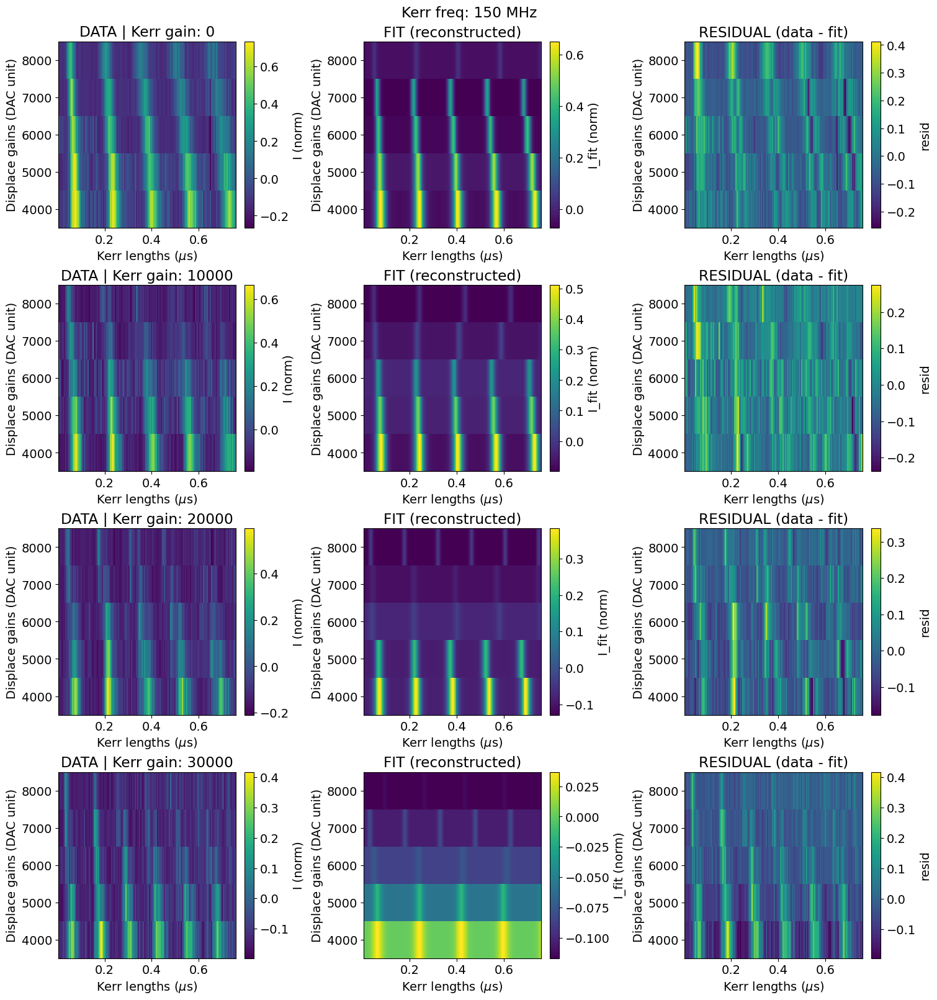

In [72]:
cavity_list = cavity_list_list[1]
plotter_fixed_compare(cavity_list)

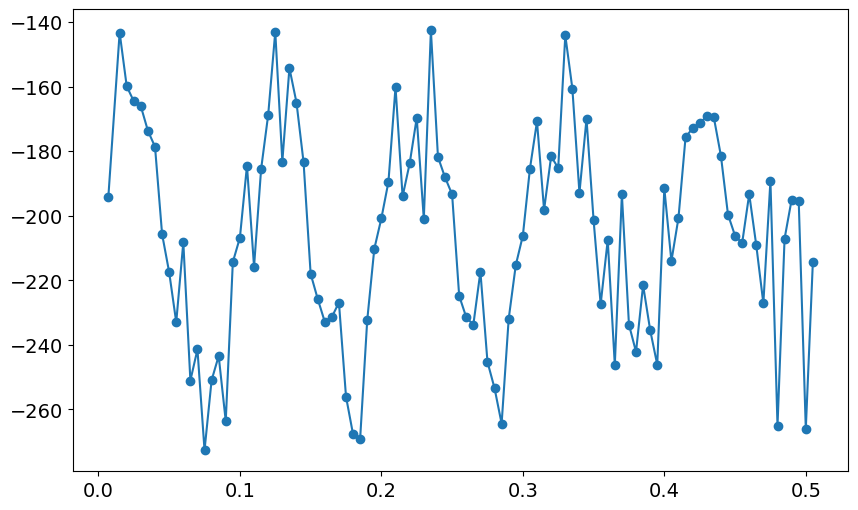

In [ ]:
plt.plot(cavity_ramsey_n.data["xpts"], cavity_ramsey_n.data["avgi"][0])
plt.scatter(cavity_ramsey_n.data["xpts"], cavity_ramsey_n.data["avgi"][0])

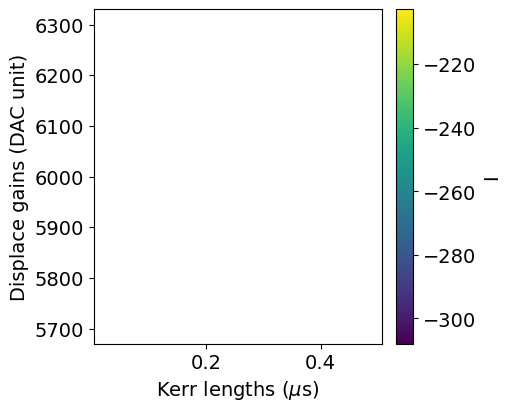

In [ ]:
plotter_fixed(cavity_ramsey_n)

# Storage Cavity Ramsey (To Be Fixed and Refined)

In [2]:
expt_params = AttrDict(dict(
    start=0.01,           # start delay
    step=0.02,            # step size
    expts=100,            # number of experiments
    ramsey_freq=3.7,      # Ramsey frequency
    kerr_gain=0,
    kerr_detune=-10,
    reps=100,              # repetitions
    rounds=1,             # rounds
    qubits=[0],           # qubits
    checkEF=False,        # check EF
    f0g1_cavity=0,        # f0g1 cavity
    init_gf=False,        # initialize gf
    active_reset=False,   # active reset
    man_reset=True,       # manipulate reset
    storage_reset=True,   # storage reset
    user_defined_pulse=None, # [on/off, freq, gain, sigma (mus), 0, 4] # if off, use config freq
    parity_meas=True,     # parity measurement
    man_mode_no=1,            
    storage_ramsey=[False, 1, True], # storage Ramsey
    man_ramsey=None,      # manipulate Ramsey
    coupler_ramsey=False, # coupler Ramsey
    custom_coupler_pulse=None, # custom coupler pulse
    echoes=[False, 0],    # echoes
    prepulse=False,       # prepulse
    postpulse=False,      # postpulse
    gate_based=False,     # gate based
    pre_sweep_pulse=None, # pre sweep pulse
    post_sweep_pulse=None,# post sweep pulse
    prep_e_first = True,
    relax_delay=2500,      # relax delay
    normalize = False,
    swept_params = ['displace_gain', 'kerr_length'],
    kerr_lengths = np.linspace(0.007,3,101).tolist(),
    # displace_gains = np.arange(2000,8001,1000).tolist(),
    displace_gains = [6000],
    # displace_gain = 5000,
    drive_coupler=False,
    cavity_excursion = True,
    kerr_freq = 100,
    # ds_thisrun = station.ds_storage,
))


def cavity_ramsey_preproc(station, default_expt_cfg, **kwargs):
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)

    expt_cfg.man_idx = expt_cfg.man_mode_no - 1

    if expt_cfg.user_defined_pulse is None:
        expt_cfg.user_defined_pulse = [True, station.hardware_cfg.device.manipulate.f_ge[expt_cfg.man_mode_no-1], 10, station.hardware_cfg.device.manipulate.displace_sigma[expt_cfg.man_mode_no-1], 0, 4]

    if expt_cfg.man_ramsey is None:
        expt_cfg.man_ramsey = [False, expt_cfg.man_mode_no -1]
    if expt_cfg.custom_coupler_pulse is None:
        expt_cfg.custom_coupler_pulse = [[944.25], [1000], [0.316677658], [0], [1], ['flat_top'], [0.005]]
    if expt_cfg.pre_sweep_pulse is None:
        expt_cfg.pre_sweep_pulse = []
    if expt_cfg.post_sweep_pulse is None:
        expt_cfg.post_sweep_pulse = []
    # do we need to set the relax delay here?
    return expt_cfg

def plotter_fixed(cavity_ramseies,
                  plot_kerr = False,
                  plotkcerror = True):
    if not isinstance(cavity_ramseies, list):
        items = [cavity_ramseies]
    else:
        items = cavity_ramseies
    
    n = len(items)
    if plot_kerr == True:
        n += 1
    n_cols = 2
    
    if n == 1:
        n_cols = 1
        n_rows = 1
    else:
        n_rows = int(np.ceil(n / n_cols))

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows), constrained_layout=True)
    
    if n == 1:
        axes_flat = [axes]
    else:
        axes_flat = axes.flatten()

    for i, cavity_ramsey_n in enumerate(items):
        ax = axes_flat[i]
        _x, _y = np.meshgrid(cavity_ramsey_n.cfg.expt.kerr_lengths, cavity_ramsey_n.cfg.expt.displace_gains)
        c = ax.pcolormesh(_x, _y, cavity_ramsey_n.data['avgi'], shading='auto')
        
        ax.set_xlabel(r'Kerr lengths ($\mu$s)')
        ax.set_ylabel('Displace gains (DAC unit)')
        fig.colorbar(c, ax=ax, label='I')

    if n > 1:
        for j in range(n, len(axes_flat)):
            axes_flat[j].axis('off')
    if plot_kerr == True:
        ax = axes_flat[n-1]
        _kc_list = np.zeros(len(items))
        _kc_error_list = np.zeros(len(items))
        _kerr_gain_list = np.zeros(len(items))
        for i in range(len(items)):
            _cr = cavity_ramseies[i]
            try:
                _kc_list[i] = _cr.fit_results['kc']
                _kc_error_list[i] = _cr.fit_results['linear_fit_result'].params['kc'].stderr
            except:
                pass
            _kerr_gain_list[i] = _cr.cfg.expt.kerr_gain
        if plotkcerror == False:
            ax.scatter(_kerr_gain_list,
                    _kc_list)
        else:
            ax.errorbar(_kerr_gain_list,
                        _kc_list,
                        _kc_error_list,
                        fmt='o', 
                        capsize=3)
        ax.plot(_kerr_gain_list,
                _kc_list,
                ls = '--')
        ax.set_xlabel("Kerr Gain (DAC unit)")
        ax.set_ylabel("$K_c$")
    plt.show()
    return None


cavity_ramsey_runner = CharacterizationRunner(
    station=station,
    ExptClass= meas.KerrCavityRamseyExcursionExperiment,
    # ExptProgram = meas.CavityRamseyExcursionQsimProgram,
    default_expt_cfg=expt_params,
    preprocessor=cavity_ramsey_preproc,
    # postprocessor=,
    job_client=client,
    # user=user,    
    use_queue=USE_QUEUE,
)

def kerr_legnth_generator(_step: float, 
                          _expts: int):
    _offset = 2
    _start = _step
    _n = _expts
    _criteria = 0.007
    _temp = _step
    if _temp < _criteria:
        _start = _criteria
        while _temp < _criteria:
            _temp = _temp + _step
            _offset = _offset + 1
    _to_return = np.zeros(_n)
    _to_return[0] = _start
    for i in range(_n-1):
        _to_return[i+1] = (i+_offset) * _step
    return _to_return

Job submitted: JOB-20260223-00172 (queue position: 1)

[0.1s] Job JOB-20260223-00172: pending

[49.2s] Job JOB-20260223-00172: running
[WORKER] Loading KerrCavityRamseyExcursionExperiment from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260223-00172_KerrCavityRamseyExcursionExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.1mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
  0%|                                                    | 0/1 [00:00<?, ?it/s]
[113.7s] Job JOB-20260223-00172: completed
100%|████████████████████████████████████████████| 1/1 [00:41<00:00, 41.26s/it]
Saving D:\experiments\250223_storage_swap_adding\data\JOB-20260223-00172_KerrCavityRamseyExcursionExperiment.h5
[WORKER] Saving expt object to: D:\experiments\250223_storage_swap_adding\expt_objs\JOB-20260223-00172_expt.pkl

Job completed! Data: D:\experiments\250223_storage_swap_adding\data\JO

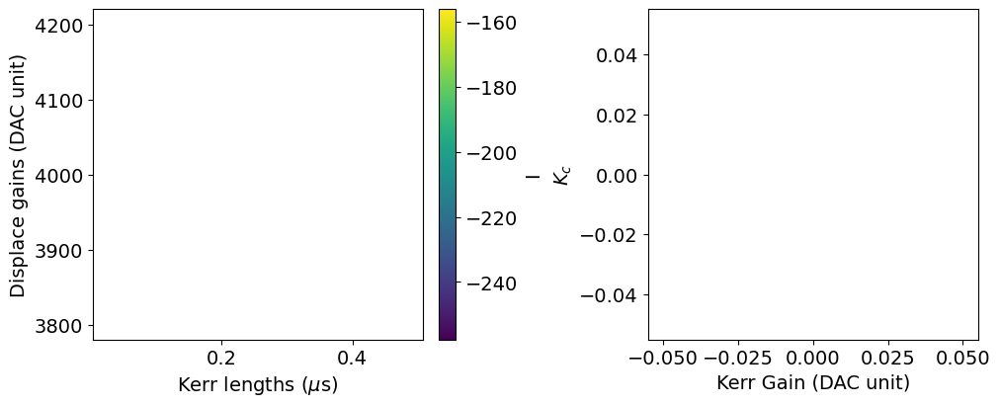

In [ ]:
# station.hardware_cfg.device.manipulate.f_ge[0]=4997.563715744588 # 0.15 mA
station.hardware_cfg.device.qubit.pulses.slow_pi_ge.length[0]=9

kerr_gain_list = [0]
freq_list = [0]
disp_gain_list = [4000]
_step = 0.005
_expts = 100


cavity_list_list = []
kc_list = []



for freq in freq_list:
    cavity_list = []
    for kg in kerr_gain_list:
        cavity_ramsey_n = cavity_ramsey_runner.execute(

            ramsey_freq= 10,
            step = 0.025,
            expts = 1,
            reps = 100,
            prep_e_first = False,
            user_defined_pulse=[True, station.hardware_cfg.device.manipulate.f_ge[0], 6000, 
                                        station.hardware_cfg.device.manipulate.displace_sigma[0],
                                        0, 4],
            kerr_lengths = kerr_legnth_generator(_step, _expts),
            displace_gains = disp_gain_list,
            # displace_gains = [1000, 2000],
            kerr_gain = kg,
            kerr_freq = freq,
            # coupler_current = 0.10e-3
            storage_ramsey=[True, 1, True], # storage Ramsey
        )
        cavity_list.append(cavity_ramsey_n)
    cavity_list_list.append(cavity_list)
plotter_fixed(cavity_list,
              plot_kerr = True)


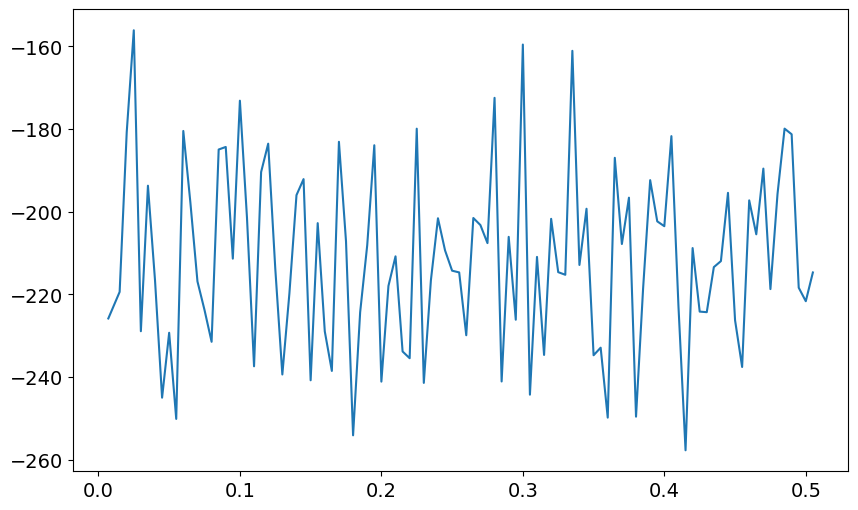

In [ ]:
plt.plot(cavity_list[0].data['xpts'],
         cavity_list[0].data['avgi'][0])

## Self Kerr fitting from the data by gain vs.

In [ ]:
import numpy as np
from scipy.ndimage import gaussian_filter1d
from lmfit import Model

try:
    from slab import AttrDict
except Exception:
    class AttrDict(dict):
        def __getattr__(self, k):
            try: return self[k]
            except KeyError as e: raise AttributeError(k) from e
        def __setattr__(self, k, v): self[k] = v


def _cfg_get(cfg, path, default=None):
    cur = cfg
    for key in path.split("."):
        if cur is None:
            return default
        if isinstance(cur, dict):
            cur = cur.get(key, None)
        else:
            cur = getattr(cur, key, None)
    return default if cur is None else cur


def _normalize_from_obj_or_cfg(obj, avgi_2d):
    if hasattr(obj, "normalize") and callable(getattr(obj, "normalize")):
        try:
            return obj.normalize(avgi_2d)
        except Exception:
            pass

    Ig = _cfg_get(obj.cfg, "device.readout.Ig", None)
    Ie = _cfg_get(obj.cfg, "device.readout.Ie", None)
    if Ig is None or Ie is None:
        return np.array(avgi_2d, float)

    Ig = float(Ig[0] if isinstance(Ig, (list, tuple, np.ndarray)) else Ig)
    Ie = float(Ie[0] if isinstance(Ie, (list, tuple, np.ndarray)) else Ie)
    denom = (Ie - Ig)
    if denom == 0:
        return np.array(avgi_2d, float)
    return (np.array(avgi_2d, float) - Ig) / denom


def kerr_ramsey_model_phi(x, alpha2, f, phi0, scale, offset):
    return scale * np.exp(-2.0 * alpha2 * (1.0 + np.cos(2.0*np.pi*f*x + phi0))) + offset


def linear_model(x, kc, delta):
    return kc * x + delta


def post_refit_one_cavity_ramsey_v2(
    obj,
    *,
    smooth_sigma=1.5,
    rsq_threshold=0.2,
    f_window_mhz=5.0,       
    # alpha2_mode="bounded",     
    alpha2_bound_ratio=(0.3, 3.0),
    use_smoothed_for_fit=True,
    verbose=False,
):
    # x/y
    x = np.array(obj.data.get("xpts", _cfg_get(obj.cfg, "expt.kerr_lengths")), float)
    y = np.array(obj.data.get("gain_list", _cfg_get(obj.cfg, "expt.displace_gains")), float)

    avgi_2d = np.array(obj.data["g_avgi"], float)
    n_lines, n_x = avgi_2d.shape

    z = _normalize_from_obj_or_cfg(obj, avgi_2d)

    virtual_freq = float(_cfg_get(obj.cfg, "expt.ramsey_freq", 0.0) or 0.0)

    g2a = _cfg_get(obj.cfg, "device.manipulate.gain_to_alpha", None)
    man_mode_no = obj.cfg.expt.get('man_mode_no', 1)
    if isinstance(g2a, (list, tuple, np.ndarray)):
        g2a = g2a[man_mode_no-1] if len(g2a) else None

    model = Model(kerr_ramsey_model_phi)

    fit_lids, fit_results, z_fits, rsqs = [], [], [], []
    alpha2_fits, f_fits, phi0_fits = [], [], []

    for lid in range(n_lines):
        line = np.array(z[lid, :], float)
        line_sm = gaussian_filter1d(line, sigma=smooth_sigma)

        yfit = line_sm if use_smoothed_for_fit else line

        off0 = float(np.nanmin(yfit))
        sc0 = float(np.nanmax(yfit) - off0)
        sc0 = max(sc0, 1e-3)

        if g2a is not None:
            alpha_guess = float(y[lid]) * float(g2a)
            alpha2_0 = max(alpha_guess*alpha_guess, 0.0)
        else:
            alpha2_0 = 0.2  # fallback

        params = model.make_params(
            alpha2=alpha2_0,
            f=virtual_freq,
            phi0=0.0,
            scale=sc0,
            offset=off0,
        )

        # if alpha2_mode == "fixed":
        params["alpha2"].set(value=alpha2_0, vary=False)
        # elif alpha2_mode == "bounded":
        #     lo, hi = alpha2_bound_ratio
        #     params["alpha2"].set(value=alpha2_0,
        #                          min=max(lo*alpha2_0, 0.0),
        #                          max=max(hi*alpha2_0, 1e-12),
        #                          vary=True)
        # elif alpha2_mode == "free":
        #     params["alpha2"].set(value=alpha2_0, min=0.0, vary=True)
        # else:
        #     raise ValueError("alpha2_mode must be fixed|bounded|free")

        params["f"].set(value=virtual_freq #)
                        , min=virtual_freq - f_window_mhz
                        , max=virtual_freq + f_window_mhz)

        params["phi0"].set(value=0.0, min=-np.pi, max=np.pi)

        params["scale"].set(value=sc0, min=0.0, max=2.0)
        params["offset"].set(value=off0, min=-0.5, max=1.5)

        try:
            res = model.fit(yfit, params, x=x[lid], nan_policy="omit",
                            method = "basinhopping")

            fit_lids.append(lid)
            fit_results.append(res)
            z_fits.append(res.best_fit)

            alpha2_fits.append(float(res.params["alpha2"].value))
            f_fits.append(float(res.params["f"].value))
            phi0_fits.append(float(res.params["phi0"].value))
            rsq = float(getattr(res, "rsquared", np.nan))
            rsqs.append(rsq)

            if verbose:
                print(f"lid={lid:3d} rsq={rsq:.3f} f={f_fits[-1]:.4f} phi0={phi0_fits[-1]:+.3f} alpha2={alpha2_fits[-1]:.3g}")

        except Exception as e:
            if verbose:
                print(f"lid={lid:3d} failed: {e!r}")
            continue

    fit_lids = np.array(fit_lids, int)
    rsqs = np.array(rsqs, float)
    alpha2_fits = np.array(alpha2_fits, float)
    f_fits = np.array(f_fits, float)
    phi0_fits = np.array(phi0_fits, float)
    z_fits = np.array(z_fits, float) if len(z_fits) else np.zeros((0, n_x), float)

    fit_good = np.isfinite(rsqs) & (rsqs > rsq_threshold)

    alpha2_good = alpha2_fits[fit_good]
    f_det = (f_fits[fit_good] - virtual_freq)

    # linear fit
    kc = np.nan
    delta = np.nan
    linear_fit_result = None
    try:
        if len(alpha2_good) >= 2:
            lm = Model(linear_model, independent_vars=["x"])
            lp = lm.make_params(kc=1.0, delta=0.0)
            linear_fit_result = lm.fit(f_det, lp, x=alpha2_good, nan_policy="omit")
            kc = float(linear_fit_result.params["kc"].value)
            delta = float(linear_fit_result.params["delta"].value)
    except Exception:
        pass

    obj.fit_results = AttrDict(dict(
        alpha2=alpha2_good,
        f=f_det,
        kc=kc,
        delta=delta,
        linear_fit_result=linear_fit_result,

        results=fit_results,
        z_fits=z_fits,
        rsquared=rsqs,
        fit_lids=fit_lids,
        fit_good=fit_good,

        virtual_freq=virtual_freq,
        f_window_mhz=f_window_mhz,
        # alpha2_mode=alpha2_mode,
    ))

    return obj.fit_results


In [55]:
import pickle

base_dir = "D:\\experiments\\260403_kerr_excusion_redone\\expt_objs\\"
pkl_files = [
    # "JOB-20260224-00259_expt.pkl", #S1
    # "JOB-20260224-00261_expt.pkl"  #S7
    # # "JOB-20260224-00247_expt.pkl", #S1
    # # "JOB-20260224-00251_expt.pkl"  #S7
]

for i in range(99, 110, 1):
    try:
        if i <100:
            pkl_files.append(f"JOB-20260403-000{i}_expt.pkl")
        else:
            pkl_files.append(f"JOB-20260403-00{i}_expt.pkl")
    except:
        pass
cavity_kerr_list = []
for i, pkl_file in enumerate(pkl_files):
    try:
        with open(base_dir+pkl_file, "rb") as f:
            cavity_kerr_list.append( pickle.load(f))
    except:
        pass

gain_to_alpha 0.00031959890733082726
kwargs {'track_peaks': True}
Kerr : 133.985 +/- 94.566 kHz
detuning Ground State: -115.991 +/- 402.320 kHz
20000
100


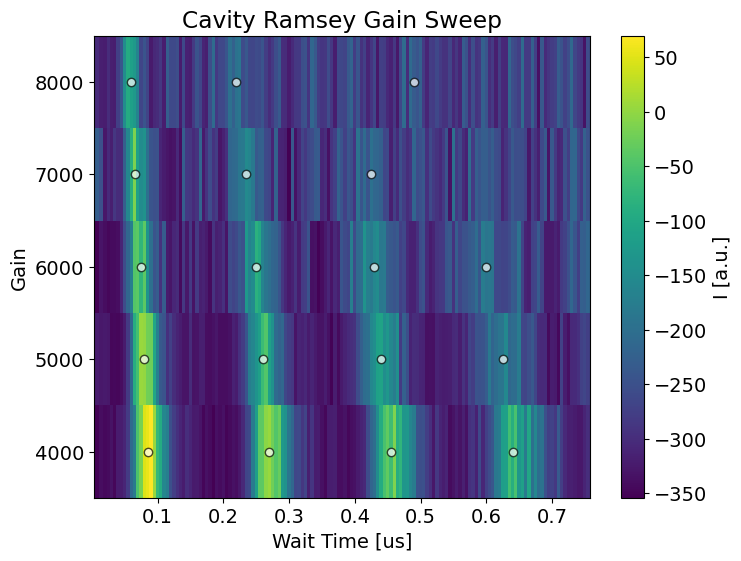

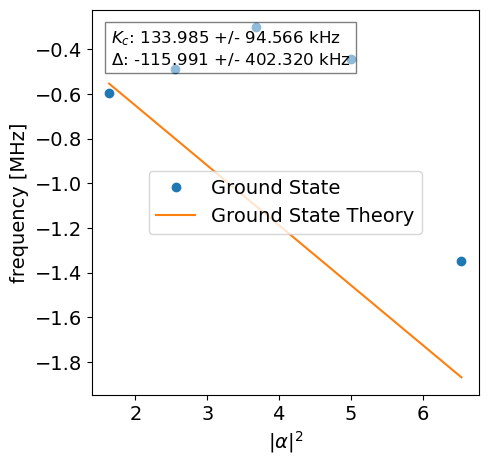

In [58]:
from fitting.fit_display_classes import CavityRamseyGainSweepFitting
idx = 2
cavity_kerr_to_a = cavity_kerr_list[idx]
cavity_kerr_to_a.cfg.expt.expts = 150
cavity_kerr_to_a.cfg.expt.do_g_and_e = False
cavity_kerr_to_a.analyze(track_peaks=True)
cavity_kerr_to_a.data['gain_list'] = np.array(cavity_kerr_to_a.cfg.expt['displace_gains'])
cavity_kerr_to_a.data['g_avgi'] = np.zeros((len(cavity_kerr_to_a.data['gain_list']), cavity_kerr_to_a.cfg.expt.expts))
cavity_kerr_to_a.data['e_avgi'] = np.zeros((len(cavity_kerr_to_a.data['gain_list']), cavity_kerr_to_a.cfg.expt.expts))
x_pts = cavity_kerr_list[idx].data['xpts']
cavity_kerr_to_a.data['xpts'] = np.zeros((len(cavity_kerr_to_a.data['gain_list']), cavity_kerr_to_a.cfg.expt.expts))
cavity_kerr_to_a.data['g_avgi'] = cavity_kerr_to_a.data['avgi']
for i_gain, gain in enumerate(cavity_kerr_to_a.data['gain_list']):



    cavity_kerr_to_a.data['xpts'][i_gain] = np.array(x_pts)

    # data['g_avgi'][i_gain] = avgi
    # data['g_avgq'][i_gain] = avgq
    # data['g_amps'][i_gain] = amps
    # data['g_phases'][i_gain] = phases


cavity_ramsey_analysis = CavityRamseyGainSweepFitting(
    data = cavity_kerr_to_a.data, config=cavity_kerr_to_a.cfg, 
)
cavity_ramsey_analysis.analyze(fit=True,
                                track_peaks = True)

cavity_ramsey_analysis.display(
    save_fig=False)
print(cavity_kerr_to_a.cfg.expt.kerr_gain)
print(cavity_kerr_to_a.cfg.expt.kerr_freq)

In [9]:
test = cavity_kerr_list[0]
tests=post_refit_one_cavity_ramsey_v2(test,
                                      f_window_mhz = 20)
# test.data.keys()
data_attr = AttrDict(test.data)
fig, ax = plt.subplots(1, 3, figsize = (21,7))
X, y = data_attr.xpts, data_attr.gain_list
y_fine = np.linspace(y[0], y[-1], 1001)
Y = np.ones(np.shape(X))
# freq = np.array([tests.results[i].params["f"].value for i in range(len(y))])
freq = tests.f
kc, delta = tests.linear_fit_result.params["kc"].value, tests.linear_fit_result.params["delta"].value
alpha_2 = tests.alpha2
for i in range(len(y)):
    Y[i, :] *= y[i]
ax[0].pcolor(X, Y,
             data_attr.g_avgi)
ax[1].pcolor(X, Y,
             tests.z_fits)
ax[2].scatter(y[tests.fit_good], freq)
ax[2].plot(y_fine, kc * y_fine *test.cfg.device.manipulate.gain_to_alpha[0]+delta)

NameError: name 'post_refit_one_cavity_ramsey_v2' is not defined

In [ ]:
for cav_kerr_obj in cavity_kerr_list:
    

TypeError: join() argument must be str, bytes, or os.PathLike object, not 'AttrDict'

# `Slow_pi_ge` Calibration

In [45]:
from pathlib import Path
import numpy as np
import fitting.fitting as fitter
from fitting.fit_display_classes import LengthRabiFitting
from experiments.qsim.t2_cavity_fluxexcursion import SlowLengthRabiProgram


SLOW_PI_GE_MIN_R2 = 0.75
SLOW_PI_GE_MAX_REL_FREQ_ERROR = 0.15
SLOW_PI_GE_MIN_OBSERVED_CYCLES = 1.25

slow_pi_ge_length_defaults = AttrDict(dict(
    reps=200,
    rounds=1,
    qubits=[0],
    swept_params=['length_to_sweep'],
    length_to_sweeps=np.linspace(0.01, 30.0, 151).tolist(),
    active_reset=True,
    man_reset=False,
    storage_reset=False,
    prepulse=False,
    postpulse=False,
    init_stor=0,
    ro_stor=0,
    normalize=False,
    relax_delay=200,
))


def _slow_pi_first(value):
    return np.asarray(value).reshape(-1)[0]


def slow_pi_ge_length_preproc(
        station, default_expt_cfg, lengths=None,
        coupler_current=None, **kwargs):
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)

    pulse = station.hardware_cfg.device.qubit.pulses.slow_pi_ge
    pulse_type = str(_slow_pi_first(pulse.type))
    if pulse_type != 'flat_top':
        raise ValueError(
            f"slow_pi_ge must be flat_top, got {pulse_type!r}"
        )

    if lengths is None:
        lengths = expt_cfg.length_to_sweeps
    lengths = np.asarray(lengths, dtype=float)
    if lengths.ndim != 1 or len(lengths) < 20:
        raise ValueError('lengths must be a 1D array with at least 20 points')
    if not np.all(np.isfinite(lengths)) or np.any(lengths < 0):
        raise ValueError('lengths must be finite and nonnegative')
    if np.any(np.diff(lengths) <= 0):
        raise ValueError('lengths must be strictly increasing')
    expt_cfg.length_to_sweeps = lengths.tolist()

    if coupler_current is None:
        coupler_current = station.hardware_cfg.hw.yoko_coupler.current
    expt_cfg.coupler_current = float(coupler_current)

    print(
        'slow_pi_ge acquisition settings:',
        f"gain={int(_slow_pi_first(pulse.gain))},",
        f"type={pulse_type},",
        f"sigma={float(_slow_pi_first(pulse.sigma)):.6f} us,",
        f"f_ge={float(_slow_pi_first(station.hardware_cfg.device.qubit.f_ge)):.9f} MHz,",
        f"coupler={1e3 * expt_cfg.coupler_current:.6f} mA",
    )
    return expt_cfg


def slow_pi_ge_length_postproc(station, expt):
    x = np.asarray(expt.data['xpts'], dtype=float)
    for key in ('avgi', 'avgq'):
        if np.asarray(expt.data[key]).shape != x.shape:
            raise RuntimeError(f'{key} shape does not match xpts')

    # Fit the five-parameter exp(-x/T) model.  The six-parameter
    # variant has a redundant amplitude/x0 pair and can make an
    # otherwise good frequency covariance singular.
    x_fit = x
    metrics = {}
    for channel in ('avgi', 'avgq'):
        y = np.asarray(expt.data[channel], dtype=float)
        p, covariance = fitter.fitdecaysin(
            x_fit, y, use_x0=False
        )
        p = np.asarray(p, dtype=float)
        covariance = np.asarray(covariance, dtype=float)
        expt.data[f'fit_{channel}'] = p
        expt.data[f'fit_err_{channel}'] = covariance
        y_fit = fitter.decaysin1(x_fit, *p)
        total_ss = float(np.sum((y - np.mean(y)) ** 2))
        residual_ss = float(np.sum((y - y_fit) ** 2))
        r2 = 1.0 - residual_ss / total_ss if total_ss > 0 else -np.inf
        frequency_MHz = abs(float(p[1]))
        frequency_error_MHz = (
            float(np.sqrt(covariance[1, 1]))
            if covariance.shape == (len(p), len(p))
            and np.isfinite(covariance[1, 1])
            and covariance[1, 1] >= 0
            else np.inf
        )
        metrics[channel] = dict(
            r2=float(r2),
            frequency_MHz=frequency_MHz,
            frequency_error_MHz=frequency_error_MHz,
            relative_frequency_error=(
                frequency_error_MHz / frequency_MHz
                if frequency_MHz > 0 else np.inf
            ),
            observed_cycles=float(
                frequency_MHz * (x_fit[-1] - x_fit[0])
            ),
        )

    valid_channels = [
        channel for channel, metric in metrics.items()
        if np.isfinite(metric['frequency_MHz'])
        and metric['frequency_MHz'] > 0
        and metric['r2'] >= SLOW_PI_GE_MIN_R2
        and metric['observed_cycles'] >= SLOW_PI_GE_MIN_OBSERVED_CYCLES
        and np.isfinite(metric['relative_frequency_error'])
        and metric['relative_frequency_error'] <= SLOW_PI_GE_MAX_REL_FREQ_ERROR
    ]
    if not valid_channels:
        raise RuntimeError(
            f'No calibration-quality slow_pi_ge length-Rabi fit: {metrics}'
        )

    if len(valid_channels) == 2:
        i_metric = metrics['avgi']
        q_metric = metrics['avgq']
        frequency_difference = abs(
            i_metric['frequency_MHz'] - q_metric['frequency_MHz']
        )
        agreement_tolerance = max(
            0.10 * np.mean([
                i_metric['frequency_MHz'], q_metric['frequency_MHz']
            ]),
            3.0 * np.hypot(
                i_metric['frequency_error_MHz'],
                q_metric['frequency_error_MHz'],
            ),
        )
        if frequency_difference > agreement_tolerance:
            raise RuntimeError(
                'I/Q slow_pi_ge fits disagree: '
                f'difference={frequency_difference:.6g} MHz, '
                f'tolerance={agreement_tolerance:.6g} MHz; metrics={metrics}'
            )

    fit_channel = max(
        valid_channels, key=lambda channel: metrics[channel]['r2']
    )
    fit = np.asarray(
        expt.data[f'fit_{fit_channel}'], dtype=float
    ).copy()
    phase_deg = (float(fit[2]) + 180.0) % 360.0 - 180.0
    frequency_MHz = abs(float(fit[1]))
    if phase_deg < 0:
        pi_length = (0.5 - phase_deg / 180.0) / (2.0 * frequency_MHz)
    else:
        pi_length = (1.5 - phase_deg / 180.0) / (2.0 * frequency_MHz)
    hpi_length = pi_length - 1.0 / (4.0 * frequency_MHz)
    period = 1.0 / abs(float(fit[1]))
    while pi_length < x.min():
        pi_length += period
        hpi_length += period
    if not (x.min() <= pi_length <= x.max()):
        raise RuntimeError(
            f'Fitted pi length {pi_length:.6f} us lies outside '
            f'[{x.min():.6f}, {x.max():.6f}] us'
        )

    # Never apply an old job's fit to a differently configured station.
    saved_pulse = expt.cfg.device.qubit.pulses.slow_pi_ge
    current_pulse = station.hardware_cfg.device.qubit.pulses.slow_pi_ge
    mismatches = []
    if int(_slow_pi_first(saved_pulse.gain)) != int(_slow_pi_first(current_pulse.gain)):
        mismatches.append(
            f"gain {int(_slow_pi_first(saved_pulse.gain))} != "
            f"{int(_slow_pi_first(current_pulse.gain))}"
        )
    if str(_slow_pi_first(saved_pulse.type)) != str(_slow_pi_first(current_pulse.type)):
        mismatches.append(
            f"type {str(_slow_pi_first(saved_pulse.type))} != "
            f"{str(_slow_pi_first(current_pulse.type))}"
        )
    for name, saved_value, current_value in (
        (
            'sigma',
            float(_slow_pi_first(saved_pulse.sigma)),
            float(_slow_pi_first(current_pulse.sigma)),
        ),
        (
            'f_ge',
            float(_slow_pi_first(expt.cfg.device.qubit.f_ge)),
            float(_slow_pi_first(station.hardware_cfg.device.qubit.f_ge)),
        ),
        (
            'coupler_current',
            float(expt.cfg.expt.coupler_current),
            float(station.hardware_cfg.hw.yoko_coupler.current),
        ),
    ):
        if not np.isclose(saved_value, current_value, rtol=0.0, atol=1e-12):
            mismatches.append(
                f'{name} {saved_value} != {current_value}'
            )
    if mismatches:
        raise RuntimeError(
            'Refusing to update slow_pi_ge from stale/incompatible data: '
            + '; '.join(mismatches)
        )

    old_length = float(_slow_pi_first(current_pulse.length))
    current_pulse.length[0] = float(pi_length)
    expt.data['slow_pi_ge_fit_channel'] = fit_channel
    expt.data['slow_pi_ge_fit_metrics'] = metrics
    expt.data['pi_length'] = float(pi_length)
    expt.data['hpi_length'] = float(hpi_length)
    expt.slow_pi_ge_length_analysis = dict(
        model='five-parameter decaying sine', metrics=metrics
    )

    print(
        f'Updated in-memory slow_pi_ge plateau length: '
        f'{old_length:.6f} -> {pi_length:.6f} us; '
        f"channel={fit_channel}, R^2={metrics[fit_channel]['r2']:.4f}"
    )
    print(f'slow_pi_ge hpi plateau length: {hpi_length:.6f} us')
    print('YAML was not written; snapshot the hardware config after validation.')

In [46]:
station.hardware_cfg.device.qubit.f_ge

[3566.0857356340016]

In [47]:
slow_pi_ge_length_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.QsimBaseExperiment,
    ExptProgram=SlowLengthRabiProgram,
    default_expt_cfg=slow_pi_ge_length_defaults,
    preprocessor=slow_pi_ge_length_preproc,
    postprocessor=slow_pi_ge_length_postproc,
    job_client=client,
    use_queue=USE_QUEUE,
    show=False,
)

# This must be a NEW acquisition. The saved April job used an old gain,
# ramp sigma, and coupler current and is deliberately rejected above.
slow_pi_ge_lengths = np.linspace(0.01, 30.0, 151)
slow_pi_ge_coupler_current = float(
    station.hardware_cfg.hw.yoko_coupler.current
)
slow_pi_ge_length_rabi = slow_pi_ge_length_runner.execute(
    lengths=slow_pi_ge_lengths,
    coupler_current=slow_pi_ge_coupler_current,
    postprocess=True,
    show=False,
    log=False,
)

slow_pi_ge acquisition settings: gain=15, type=flat_top, sigma=0.100000 us, f_ge=3566.085735634 MHz, coupler=0.070000 mA
Job submitted: JOB-20260817-00183 (queue position: 1)

[0.0s] Job JOB-20260817-00183: pending

[2.2s] Job JOB-20260817-00183: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260817-00183_QsimBaseExperiment.h5
[WORKER]   Program: SlowLengthRabiProgram from experiments.qsim.t2_cavity_fluxexcursion
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to expt.cfg...
[WORKER] Done setting coupler current
 95%|█████████████████████████████████████▉  | 143/151 [00:31<00:01,  4.45it/s]slow ge pulse params: gain 15, length 28.600466666666666 us, sigma 0.1 us

[36.6s] Job JOB-20260817-00183: completed
100%|████████████████████████████████████████| 151/151 [00:32<00:00,  4.62it/s]
Saving C:\experiments\260625DarkModeErrBudgetting\data\

In [58]:
station.hardware_cfg.device.qubit.pulses.slow_pi_ge

{'gain': [15],
 'sigma': [0.1],
 'length': [8.370472694827567],
 'type': ['flat_top']}

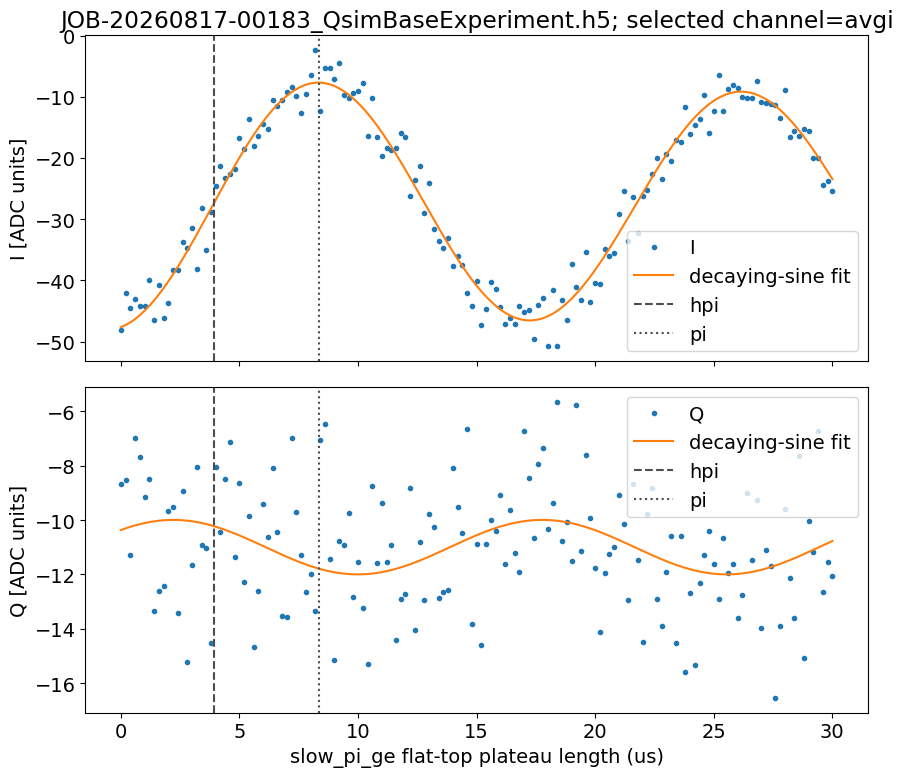

In [49]:
x = np.asarray(slow_pi_ge_length_rabi.data['xpts'], dtype=float)
x_dense = np.linspace(x.min(), x.max(), 2000)
pi_length = float(slow_pi_ge_length_rabi.data['pi_length'])
hpi_length = float(slow_pi_ge_length_rabi.data['hpi_length'])
fit_channel = slow_pi_ge_length_rabi.data['slow_pi_ge_fit_channel']

fig, axes = plt.subplots(2, 1, figsize=(9, 8), sharex=True)
for ax, channel, label in zip(
        axes, ('avgi', 'avgq'), ('I', 'Q')):
    ax.plot(
        x, slow_pi_ge_length_rabi.data[channel],
        'o', ms=3, label=label,
    )
    fit = slow_pi_ge_length_rabi.data[f'fit_{channel}']
    ax.plot(
        x_dense, fitter.decaysin1(x_dense, *fit),
        '-', label='decaying-sine fit',
    )
    ax.axvline(hpi_length, color='0.3', ls='--', label='hpi')
    ax.axvline(pi_length, color='0.3', ls=':', label='pi')
    ax.set_ylabel(f'{label} [ADC units]')
    ax.legend()

axes[0].set_title(
    f'{Path(slow_pi_ge_length_rabi.fname).name}; '
    f'selected channel={fit_channel}'
)
axes[-1].set_xlabel('slow_pi_ge flat-top plateau length (us)')
plt.tight_layout()
plt.show()

# Pre-selectionTest

In [11]:

basic_default_config = AttrDict(dict(
    start=0.01, # us
    step=0.1,
    expts=100,
    reps=200,
    rounds=1,
    sigma_test=None,
    qubit=0,
    pulse_type='gauss',
    drag_beta=0.0,
    pulse_ge_init=False,
    pulse_ge_after=False,
    checkZZ=False,
    checkEF=False,
    qubits=[0],
    flat_length=0,
    normalize=False,
    single_shot=False,
    singleshot_reps=10000,
    span=50,
    user_defined_freq=[False, 3562.6075891351143],
    swept_params = ['length_to_sweep'],
    length_to_sweeps = np.linspace(0.01, 10, 100),
    prepulse=False,
    postpulse=False, 
    if_ef=False,  # If true, will check ef frequency and update it
    init_stor=0,
    ro_stor = 0,
    active_reset = False,
    parity_check = True
    
)) # Shouldn't be modifying this on the fly!


basicrunner = CharacterizationRunner(
    station = station,
    ExptClass = meas.qsim.qsim_base.QsimBaseExperiment,
    default_expt_cfg = basic_default_config,
    job_client=client,
    use_queue=USE_QUEUE,
)

#After amplitude calibration, do another T2 Ramsey to fine tune frequency
#Added by Jonginn, as a part of practice
#Please remove if the below code causes any problem.
basicrun = basicrunner.execute(
    # ramsey_freq = 0.2,
    # step = 0.01,
    # active_reset = False,
    # relax_delay=2500,
    # length_to_sweeps = np.linspace(0.01, 30, 151),
    # coupler_current = 0.15e-3
)


Job submitted: JOB-20260310-00020 (queue position: 1)

[0.1s] Job JOB-20260310-00020: pending

[2.2s] Job JOB-20260310-00020: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260310-00020_QsimBaseExperiment.h5

[6.2s] Job JOB-20260310-00020: failed
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.5mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
  0%|                                                  | 0/100 [00:00<?, ?it/s]

Job failed: AttributeError: 'AttrDict' object has no attribute 'phase_second_pulse'
Traceback (most recent call last):
  File "D:\python\multimode_expts\job_server\worker.py", line 366, in _execute_job
    data_file_path, expt_pickle_path = self._run_experiment(ExptClass, expt_config, job)
                                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "D:\python\multimode_expts\job_server\wo

RuntimeError: Job JOB-20260310-00020 failed: AttributeError: 'AttrDict' object has no attribute 'phase_second_pulse'
Traceback (most recent call last):
  File "D:\python\multimode_expts\job_server\worker.py", line 366, in _execute_job
    data_file_path, expt_pickle_path = self._run_experiment(ExptClass, expt_config, job)
                                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "D:\python\multimode_expts\job_server\worker.py", line 552, in _run_experiment
    expt.go(
  File "D:\python\multimode_expts\slab\experiment.py", line 166, in go
    data=self.acquire(progress)
         ^^^^^^^^^^^^^^^^^^^^^^
  File "D:\python\multimode_expts\experiments\qsim\qsim_base.py", line 352, in acquire
    self.prog = self.ProgramClass(soccfg=self.soccfg, cfg=self.cfg)
                ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "D:\python\multimode_expts\experiments\qsim\qsim_base.py", line 32, in __init__
    super().__init__(soccfg, cfg)
  File "D:\python\multimode_expts\experiments\MM_base.py", line 2053, in __init__
    AveragerProgram.__init__(self, soccfg, cfg)
  File "D:\python\qick\qick_lib\qick\averager_program.py", line 29, in __init__
    self.make_program()
  File "D:\python\qick\qick_lib\qick\averager_program.py", line 65, in make_program
    p.body()
  File "D:\python\multimode_expts\experiments\qsim\qsim_base.py", line 144, in body
    self.play_parity_pulse(self.man_mode_idx, second_phase=self.cfg.expt.phase_second_pulse, fast=self.cfg.expt.parity_fast)
                                                           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "D:\python\multimode_expts\slab\datamanagement.py", line 559, in __getattr__
    return self.__getattribute__(a)
           ^^^^^^^^^^^^^^^^^^^^^^^^
AttributeError: 'AttrDict' object has no attribute 'phase_second_pulse'
